In [1]:
import pandas as pd
import numpy as np
import tsfresh
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import tensorflow as tf

import os

import matplotlib.pyplot as plt

# keras goodies
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten, Conv1D, Dropout, MaxPooling1D, BatchNormalization, LSTM
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers
from tensorflow.keras import metrics as kmetrics
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LeakyReLU

In [2]:
base_df_2021_2022 = pd.read_csv('2021_2022_clean_data.csv')

C:\Users\jacks\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py:3135: DtypeWarning: Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
columns_of_interest = ['accel_x', 'accel_y', 'accel_z', 'gyro_x', 'gyro_y', 'gyro_z']

In [4]:
window_size = 50 # 50 datapoints for the window size, which, at 25Hz, means 2 seconds
step_size = 5 # this is 50% overlap

window_number = 0 # start a counter at 0 to keep track of the window number

all_overlapping_windows = []

for rid, group in base_df_2021_2022.groupby("recording_id"):
    print(f"Processing rid = {rid}")
    
    large_enough_windows = [window for window in group.rolling(window=window_size, min_periods=window_size) if len(window) == window_size]
    
    overlapping_windows = large_enough_windows[::step_size] 
    
    # then we will append a window ID to each window
    for window in overlapping_windows:
        window.loc[:, 'window_id'] = window_number
        window_number += 1
    
    all_overlapping_windows.append(pd.concat(overlapping_windows).reset_index(drop=True))

Processing rid = C:\2022\iot\our_branch\Labs\Data\2022_A\day1\Respeck_s1810150_Standing_06-10-2022_20-49-00
Processing rid = Respeck_s1541031_Climbing stairs_06-10-2021_11-25-43
Processing rid = Respeck_s1541031_Descending stairs_06-10-2021_11-25-05


C:\Users\jacks\AppData\Roaming\Python\Python38\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\jacks\AppData\Roaming\Python\Python38\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Processing rid = Respeck_s1541031_Desk work_06-10-2021_11-04-49
Processing rid = Respeck_s1541031_Lying down left_06-10-2021_14-30-04
Processing rid = Respeck_s1541031_Lying down on back_06-10-2021_11-15-13
Processing rid = Respeck_s1541031_Lying down on stomach_06-10-2021_14-30-50
Processing rid = Respeck_s1541031_Lying down right_06-10-2021_14-27-40
Processing rid = Respeck_s1541031_Movement_06-10-2021_11-11-18
Processing rid = Respeck_s1541031_Running_08-10-2021_12-10-37
Processing rid = Respeck_s1541031_Sitting bent backward_06-10-2021_14-33-45
Processing rid = Respeck_s1541031_Sitting bent forward_06-10-2021_14-32-55
Processing rid = Respeck_s1541031_Sitting_06-10-2021_10-25-01
Processing rid = Respeck_s1541031_Standing_06-10-2021_11-10-10
Processing rid = Respeck_s1541031_Walking at normal speed_06-10-2021_18-30-14
Processing rid = Respeck_s1704145_Climbing stairs_23-09-2021_11-34-34
Processing rid = Respeck_s1704145_Descending stairs_23-09-2021_11-30-25
Processing rid = Respeck_

Processing rid = Respeck_s1732873_Standing_04-10-2021_12-55-45
Processing rid = Respeck_s1732873_Standing_04-10-2022_14-10-08
Processing rid = Respeck_s1732873_Walking at normal speed_04-10-2021_15-30-06
Processing rid = Respeck_s1732873_Walking at normal speed_04-10-2022_14-31-37
Processing rid = Respeck_s1757177_Climbing stairs_06-10-2021_16-34-18
Processing rid = Respeck_s1757177_Descending stairs_02-10-2021_13-57-31
Processing rid = Respeck_s1757177_Desk work_02-10-2021_13-47-55
Processing rid = Respeck_s1757177_Lying down left_06-10-2021_20-37-42
Processing rid = Respeck_s1757177_Lying down on back_02-10-2021_19-55-43
Processing rid = Respeck_s1757177_Lying down on stomach_02-10-2021_20-00-57
Processing rid = Respeck_s1757177_Lying down right_06-10-2021_20-38-38
Processing rid = Respeck_s1757177_Movement_06-10-2021_16-44-16
Processing rid = Respeck_s1757177_Running_02-10-2021_14-09-21
Processing rid = Respeck_s1757177_Sitting bent backward_06-10-2021_16-40-06
Processing rid = Resp

Processing rid = Respeck_s1817967_Lying down on back_30-09-2022_16-24-43
Processing rid = Respeck_s1817967_Lying down on stomach_30-09-2022_16-27-33
Processing rid = Respeck_s1817967_Lying down right_30-09-2022_16-26-44
Processing rid = Respeck_s1817967_Movement_30-09-2022_16-35-29
Processing rid = Respeck_s1817967_Running_30-09-2022_16-30-26
Processing rid = Respeck_s1817967_Sitting bent backward_30-09-2022_16-21-38
Processing rid = Respeck_s1817967_Sitting bent forward_30-09-2022_16-23-28
Processing rid = Respeck_s1817967_Sitting_30-09-2022_16-19-45
Processing rid = Respeck_s1817967_Standing_30-09-2022_16-22-44
Processing rid = Respeck_s1817967_Walking at normal speed_30-09-2022_16-29-44
Processing rid = Respeck_s1817972_Climbing stairs_05-10-2021_14-15-10
Processing rid = Respeck_s1817972_Descending stairs_05-10-2021_14-14-27
Processing rid = Respeck_s1817972_Desk work_05-10-2021_11-25-28
Processing rid = Respeck_s1817972_Lying down left_05-10-2021_11-22-07
Processing rid = Respeck_

Processing rid = Respeck_s1832512_Sitting bent forward_07-10-2022_10-27-44
Processing rid = Respeck_s1832512_Sitting_02-10-2022_15-24-49
Processing rid = Respeck_s1832512_Standing_05-10-2022_11-25-23
Processing rid = Respeck_s1832512_Walking at normal speed_07-10-2022_10-33-05
Processing rid = Respeck_s1836526_Climbing stairs_23-09-2022_13-15-49
Processing rid = Respeck_s1836526_Descending stairs_23-09-2022_13-17-22
Processing rid = Respeck_s1836526_Desk work_23-09-2022_13-29-40
Processing rid = Respeck_s1836526_Lying down left_23-09-2022_13-21-48
Processing rid = Respeck_s1836526_Lying down on back_23-09-2022_13-25-40
Processing rid = Respeck_s1836526_Lying down on stomach_23-09-2022_13-24-23
Processing rid = Respeck_s1836526_Lying down right_23-09-2022_13-23-05
Processing rid = Respeck_s1836526_Movement_23-09-2022_13-08-51
Processing rid = Respeck_s1836526_Running_23-09-2022_13-07-03
Processing rid = Respeck_s1836526_Sitting bent backward_23-09-2022_13-33-29
Processing rid = Respeck_

Processing rid = Respeck_s1852056_Lying down on back_05-10-2022_15-11-38
Processing rid = Respeck_s1852056_Lying down on stomach_05-10-2022_15-13-53
Processing rid = Respeck_s1852056_Lying down right_05-10-2022_15-17-15
Processing rid = Respeck_s1852056_Movement_05-10-2022_15-10-01
Processing rid = Respeck_s1852056_Running_05-10-2022_15-55-29
Processing rid = Respeck_s1852056_Sitting bent backward_05-10-2022_15-03-21
Processing rid = Respeck_s1852056_Sitting bent forward_05-10-2022_14-44-04
Processing rid = Respeck_s1852056_Sitting_05-10-2022_14-43-03
Processing rid = Respeck_s1852056_Standing_05-10-2022_15-07-34
Processing rid = Respeck_s1852056_Walking at normal speed_05-10-2022_15-52-26
Processing rid = Respeck_s1853226_Climbing stairs_28-09-2022_16-38-36
Processing rid = Respeck_s1853226_Descending stairs_28-09-2022_16-41-08
Processing rid = Respeck_s1853226_Desk work_28-09-2022_16-36-56
Processing rid = Respeck_s1853226_Lying down left_28-09-2022_16-22-09
Processing rid = Respeck_

Processing rid = Respeck_s1865890_Sitting bent forward_05-10-2021_18-10-45
Processing rid = Respeck_s1865890_Sitting_06-10-2021_10-31-42
Processing rid = Respeck_s1865890_Standing_05-10-2021_18-16-13
Processing rid = Respeck_s1865890_Walking at normal speed_06-10-2021_10-06-40
Processing rid = Respeck_s1870467_Climbing stairs_06-10-2021_11-26-24
Processing rid = Respeck_s1870467_Descending stairs_06-10-2021_11-27-15
Processing rid = Respeck_s1870467_Desk work_07-10-2021_12-17-59
Processing rid = Respeck_s1870467_Lying down left_29-09-2021_11-47-37
Processing rid = Respeck_s1870467_Lying down on back_29-09-2021_11-46-48
Processing rid = Respeck_s1870467_Lying down on stomach_29-09-2021_11-49-18
Processing rid = Respeck_s1870467_Lying down right_29-09-2021_11-48-27
Processing rid = Respeck_s1870467_Movement_29-09-2021_11-56-20
Processing rid = Respeck_s1870467_Running_07-10-2021_09-48-21
Processing rid = Respeck_s1870467_Sitting bent backward_29-09-2021_11-45-03
Processing rid = Respeck_

Processing rid = Respeck_s1904845_Lying down on stomach_03-10-2022_16-55-53
Processing rid = Respeck_s1904845_Lying down right_05-10-2022_18-58-12
Processing rid = Respeck_s1904845_Movement_03-10-2022_17-10-01
Processing rid = Respeck_s1904845_Running_05-10-2022_19-11-23
Processing rid = Respeck_s1904845_Sitting bent backward_05-10-2022_18-49-52
Processing rid = Respeck_s1904845_Sitting bent forward_05-10-2022_18-48-50
Processing rid = Respeck_s1904845_Sitting_03-10-2022_16-49-45
Processing rid = Respeck_s1904845_Standing_03-10-2022_16-52-27
Processing rid = Respeck_s1904845_Walking at normal speed_05-10-2022_19-07-00
Processing rid = Respeck_s1908422_Climbing stairs_05-10-2022_16-23-16
Processing rid = Respeck_s1908422_Descending stairs_05-10-2022_16-24-12
Processing rid = Respeck_s1908422_Desk work_23-09-2022_16-21-33
Processing rid = Respeck_s1908422_Lying down left_30-09-2022_16-14-37
Processing rid = Respeck_s1908422_Lying down on back_23-09-2022_16-17-41
Processing rid = Respeck_

Processing rid = Respeck_s1912614_Walking at normal speed_02-10-2022_19-19-18
Processing rid = Respeck_s1915425_Climbing stairs_28-09-2022_14-02-24
Processing rid = Respeck_s1915425_Descending stairs_28-09-2022_14-01-32
Processing rid = Respeck_s1915425_Desk work_28-09-2022_18-52-16
Processing rid = Respeck_s1915425_Lying down left_28-09-2022_12-21-54
Processing rid = Respeck_s1915425_Lying down on back_28-09-2022_12-20-03
Processing rid = Respeck_s1915425_Lying down on stomach_28-09-2022_12-24-28
Processing rid = Respeck_s1915425_Lying down right_28-09-2022_18-53-31
Processing rid = Respeck_s1915425_Movement_28-09-2022_12-32-18
Processing rid = Respeck_s1915425_Running_28-09-2022_14-29-29
Processing rid = Respeck_s1915425_Sitting bent backward_28-09-2022_12-29-11
Processing rid = Respeck_s1915425_Sitting bent forward_28-09-2022_18-51-27
Processing rid = Respeck_s1915425_Sitting_28-09-2022_18-48-53
Processing rid = Respeck_s1915425_Standing_28-09-2022_18-49-53
Processing rid = Respeck_

Processing rid = Respeck_s1925695_Lying down on stomach_28-09-2022_15-36-36
Processing rid = Respeck_s1925695_Lying down right_28-09-2022_15-34-20
Processing rid = Respeck_s1925695_Movement_28-09-2022_15-58-02
Processing rid = Respeck_s1925695_Running_28-09-2022_15-52-31
Processing rid = Respeck_s1925695_Sitting bent backward_28-09-2022_15-29-53
Processing rid = Respeck_s1925695_Sitting bent forward_28-09-2022_15-27-41
Processing rid = Respeck_s1925695_Sitting_28-09-2022_15-26-51
Processing rid = Respeck_s1925695_Standing_28-09-2022_15-30-57
Processing rid = Respeck_s1925695_Walking at normal speed_28-09-2022_15-49-42
Processing rid = Respeck_s1925709_Climbing stairs_02-10-2022_18-26-14
Processing rid = Respeck_s1925709_Descending stairs_02-10-2022_18-26-57
Processing rid = Respeck_s1925709_Desk work_02-10-2022_22-41-34
Processing rid = Respeck_s1925709_Lying down left_01-10-2022_21-27-14
Processing rid = Respeck_s1925709_Lying down on back_01-10-2022_21-26-02
Processing rid = Respeck_

Processing rid = Respeck_s1941321_Sitting_04-10-2022_10-52-21
Processing rid = Respeck_s1941321_Standing_04-10-2022_10-56-06
Processing rid = Respeck_s1941321_Walking at normal speed_04-10-2022_11-09-11
Processing rid = Respeck_s1948094_Climbing stairs_23-09-2022_12-51-37
Processing rid = Respeck_s1948094_Descending stairs_23-09-2022_12-53-24
Processing rid = Respeck_s1948094_Desk work_23-09-2022_12-01-53
Processing rid = Respeck_s1948094_Lying down left_23-09-2022_11-54-37
Processing rid = Respeck_s1948094_Lying down on back_23-09-2022_11-59-08
Processing rid = Respeck_s1948094_Lying down on stomach_23-09-2022_11-57-49
Processing rid = Respeck_s1948094_Lying down right_23-09-2022_11-56-22
Processing rid = Respeck_s1948094_Movement_23-09-2022_12-58-07
Processing rid = Respeck_s1948094_Running_23-09-2022_12-54-29
Processing rid = Respeck_s1948094_Sitting bent backward_23-09-2022_11-50-08
Processing rid = Respeck_s1948094_Sitting bent forward_23-09-2022_11-48-20
Processing rid = Respeck_

Processing rid = Respeck_s1962038_Lying down left_04-10-2022_14-44-35
Processing rid = Respeck_s1962038_Lying down on back_23-09-2022_15-46-23
Processing rid = Respeck_s1962038_Lying down on stomach_01-10-2022_15-05-47
Processing rid = Respeck_s1962038_Lying down right_04-10-2022_14-43-46
Processing rid = Respeck_s1962038_Movement_23-09-2022_15-51-01
Processing rid = Respeck_s1962038_Running_23-09-2022_15-44-56
Processing rid = Respeck_s1962038_Sitting bent backward_04-10-2022_14-47-08
Processing rid = Respeck_s1962038_Sitting bent forward_23-09-2022_14-56-59
Processing rid = Respeck_s1962038_Sitting_23-09-2022_14-54-11
Processing rid = Respeck_s1962038_Standing_04-10-2022_14-45-21
Processing rid = Respeck_s1962038_Walking at normal speed_02-10-2022_19-03-08
Processing rid = Respeck_s1965695_Climbing stairs_29-09-2022_17-32-23
Processing rid = Respeck_s1965695_Descending stairs_29-09-2022_17-31-42
Processing rid = Respeck_s1965695_Desk work_29-09-2022_13-43-35
Processing rid = Respeck_

Processing rid = Respeck_s1976098_Sitting bent backward_03-10-2022_14-48-08
Processing rid = Respeck_s1976098_Sitting bent forward_28-09-2022_13-55-40
Processing rid = Respeck_s1976098_Sitting_05-10-2022_15-45-43
Processing rid = Respeck_s1976098_Standing_28-09-2022_13-59-15
Processing rid = Respeck_s1976098_Walking at normal speed_28-09-2022_15-12-47
Processing rid = Respeck_s1977764_Climbing stairs_24-09-2022_15-47-31
Processing rid = Respeck_s1977764_Descending stairs_24-09-2022_15-48-15
Processing rid = Respeck_s1977764_Desk work_24-09-2022_15-51-41
Processing rid = Respeck_s1977764_Lying down left_24-09-2022_15-42-19
Processing rid = Respeck_s1977764_Lying down on back_24-09-2022_15-41-30
Processing rid = Respeck_s1977764_Lying down on stomach_24-09-2022_15-44-05
Processing rid = Respeck_s1977764_Lying down right_24-09-2022_15-43-10
Processing rid = Respeck_s1977764_Movement_24-09-2022_15-50-36
Processing rid = Respeck_s1977764_Running_24-09-2022_15-46-23
Processing rid = Respeck_

Processing rid = Respeck_s2181154_Descending stairs_03-10-2021_17-46-42
Processing rid = Respeck_s2181154_Desk work_03-10-2021_17-48-15
Processing rid = Respeck_s2181154_Lying down left_29-09-2021_14-06-32
Processing rid = Respeck_s2181154_Lying down on back_29-09-2021_14-05-53
Processing rid = Respeck_s2181154_Lying down on stomach_05-10-2021_17-30-10
Processing rid = Respeck_s2181154_Lying down right_03-10-2021_17-50-29
Processing rid = Respeck_s2181154_Movement_29-09-2021_14-13-07
Processing rid = Respeck_s2181154_Running_29-09-2021_14-01-11
Processing rid = Respeck_s2181154_Sitting bent backward_29-09-2021_14-10-58
Processing rid = Respeck_s2181154_Sitting bent forward_29-09-2021_14-09-26
Processing rid = Respeck_s2181154_Sitting_29-09-2021_13-58-39
Processing rid = Respeck_s2181154_Standing_03-10-2021_17-44-24
Processing rid = Respeck_s2181154_Walking at normal speed_29-09-2021_14-00-32
Processing rid = Respeck_s2192970_Climbing stairs_29-09-2021_21-39-04
Processing rid = Respeck_

Processing rid = Respeck_s2298733_Running_30-09-2022_17-23-14
Processing rid = Respeck_s2298733_Sitting bent backward_30-09-2022_16-30-04
Processing rid = Respeck_s2298733_Sitting bent forward_30-09-2022_16-29-25
Processing rid = Respeck_s2298733_Sitting_30-09-2022_16-28-26
Processing rid = Respeck_s2298733_Standing_30-09-2022_16-30-43
Processing rid = Respeck_s2298733_Walking at normal speed_30-09-2022_17-22-31
Processing rid = Respeck_s2299270_Climbing stairs_03-10-2022_19-37-38
Processing rid = Respeck_s2299270_Descending stairs_03-10-2022_19-39-22
Processing rid = Respeck_s2299270_Desk work_03-10-2022_17-28-14
Processing rid = Respeck_s2299270_Lying down left_03-10-2022_16-00-31
Processing rid = Respeck_s2299270_Lying down on back_03-10-2022_15-59-43
Processing rid = Respeck_s2299270_Lying down on stomach_03-10-2022_16-04-09
Processing rid = Respeck_s2299270_Lying down right_03-10-2022_16-02-21
Processing rid = Respeck_s2299270_Movement_03-10-2022_17-24-56
Processing rid = Respeck_

In [5]:
final_sliding_windows = pd.concat(all_overlapping_windows).reset_index(drop=True)
final_sliding_windows.groupby("window_id")[['activity_type']].agg(np.min)
class_labels = {
    'Sitting':0,
    'Walking at normal speed': 1,
    'Lying down on back': 2,
    'Desk work':3,
    'Sitting bent forward':4,
    'Sitting bent backward':5,
    'Lying down right':6,
    'Lying down left':7,
    'Lying down on stomach':8,
    'Movement':9,
    'Standing':10,
    'Running':11,
    'Climbing stairs':12,
    'Descending stairs':13
    
}
window_id_class_labels = final_sliding_windows.groupby("window_id")[['activity_type']].agg(np.min).replace(class_labels)

In [6]:
X = []
y = []

for window_id, group in final_sliding_windows.groupby('window_id'):
    print(f"window_id = {window_id}")
    
    shape = group[columns_of_interest].values.shape
    print(f"shape = {shape}")
    
    X.append(group[columns_of_interest].values)
    y.append(class_labels[group["activity_type"].values[0]])
    
X = np.asarray(X)
y = np.asarray(y)

print(f"X shape = {X.shape}")
print(f"y shape = {y.shape}")
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, train_size=0.8)

y_train = np.asarray(pd.get_dummies(y_train), dtype=np.float32)
y_test = np.asarray(pd.get_dummies(y_test), dtype=np.float32)
print(f"X_train shape = {X_train.shape}")
print(f"y_train shape = {y_train.shape}")

print(f"X_test shape = {X_test.shape}")
print(f"y_test shape = {y_test.shape}")

window_id = 0
shape = (50, 6)
window_id = 1
shape = (50, 6)
window_id = 2
shape = (50, 6)
window_id = 3
shape = (50, 6)
window_id = 4
shape = (50, 6)
window_id = 5
shape = (50, 6)
window_id = 6
shape = (50, 6)
window_id = 7
shape = (50, 6)
window_id = 8
shape = (50, 6)
window_id = 9
shape = (50, 6)
window_id = 10
shape = (50, 6)
window_id = 11
shape = (50, 6)
window_id = 12
shape = (50, 6)
window_id = 13
shape = (50, 6)
window_id = 14
shape = (50, 6)
window_id = 15
shape = (50, 6)
window_id = 16
shape = (50, 6)
window_id = 17
shape = (50, 6)
window_id = 18
shape = (50, 6)
window_id = 19
shape = (50, 6)
window_id = 20
shape = (50, 6)
window_id = 21
shape = (50, 6)
window_id = 22
shape = (50, 6)
window_id = 23
shape = (50, 6)
window_id = 24
shape = (50, 6)
window_id = 25
shape = (50, 6)
window_id = 26
shape = (50, 6)
window_id = 27
shape = (50, 6)
window_id = 28
shape = (50, 6)
window_id = 29
shape = (50, 6)
window_id = 30
shape = (50, 6)
window_id = 31
shape = (50, 6)
window_id = 32
sha

shape = (50, 6)
window_id = 423
shape = (50, 6)
window_id = 424
shape = (50, 6)
window_id = 425
shape = (50, 6)
window_id = 426
shape = (50, 6)
window_id = 427
shape = (50, 6)
window_id = 428
shape = (50, 6)
window_id = 429
shape = (50, 6)
window_id = 430
shape = (50, 6)
window_id = 431
shape = (50, 6)
window_id = 432
shape = (50, 6)
window_id = 433
shape = (50, 6)
window_id = 434
shape = (50, 6)
window_id = 435
shape = (50, 6)
window_id = 436
shape = (50, 6)
window_id = 437
shape = (50, 6)
window_id = 438
shape = (50, 6)
window_id = 439
shape = (50, 6)
window_id = 440
shape = (50, 6)
window_id = 441
shape = (50, 6)
window_id = 442
shape = (50, 6)
window_id = 443
shape = (50, 6)
window_id = 444
shape = (50, 6)
window_id = 445
shape = (50, 6)
window_id = 446
shape = (50, 6)
window_id = 447
shape = (50, 6)
window_id = 448
shape = (50, 6)
window_id = 449
shape = (50, 6)
window_id = 450
shape = (50, 6)
window_id = 451
shape = (50, 6)
window_id = 452
shape = (50, 6)
window_id = 453
shape = 

shape = (50, 6)
window_id = 853
shape = (50, 6)
window_id = 854
shape = (50, 6)
window_id = 855
shape = (50, 6)
window_id = 856
shape = (50, 6)
window_id = 857
shape = (50, 6)
window_id = 858
shape = (50, 6)
window_id = 859
shape = (50, 6)
window_id = 860
shape = (50, 6)
window_id = 861
shape = (50, 6)
window_id = 862
shape = (50, 6)
window_id = 863
shape = (50, 6)
window_id = 864
shape = (50, 6)
window_id = 865
shape = (50, 6)
window_id = 866
shape = (50, 6)
window_id = 867
shape = (50, 6)
window_id = 868
shape = (50, 6)
window_id = 869
shape = (50, 6)
window_id = 870
shape = (50, 6)
window_id = 871
shape = (50, 6)
window_id = 872
shape = (50, 6)
window_id = 873
shape = (50, 6)
window_id = 874
shape = (50, 6)
window_id = 875
shape = (50, 6)
window_id = 876
shape = (50, 6)
window_id = 877
shape = (50, 6)
window_id = 878
shape = (50, 6)
window_id = 879
shape = (50, 6)
window_id = 880
shape = (50, 6)
window_id = 881
shape = (50, 6)
window_id = 882
shape = (50, 6)
window_id = 883
shape = 

shape = (50, 6)
window_id = 1276
shape = (50, 6)
window_id = 1277
shape = (50, 6)
window_id = 1278
shape = (50, 6)
window_id = 1279
shape = (50, 6)
window_id = 1280
shape = (50, 6)
window_id = 1281
shape = (50, 6)
window_id = 1282
shape = (50, 6)
window_id = 1283
shape = (50, 6)
window_id = 1284
shape = (50, 6)
window_id = 1285
shape = (50, 6)
window_id = 1286
shape = (50, 6)
window_id = 1287
shape = (50, 6)
window_id = 1288
shape = (50, 6)
window_id = 1289
shape = (50, 6)
window_id = 1290
shape = (50, 6)
window_id = 1291
shape = (50, 6)
window_id = 1292
shape = (50, 6)
window_id = 1293
shape = (50, 6)
window_id = 1294
shape = (50, 6)
window_id = 1295
shape = (50, 6)
window_id = 1296
shape = (50, 6)
window_id = 1297
shape = (50, 6)
window_id = 1298
shape = (50, 6)
window_id = 1299
shape = (50, 6)
window_id = 1300
shape = (50, 6)
window_id = 1301
shape = (50, 6)
window_id = 1302
shape = (50, 6)
window_id = 1303
shape = (50, 6)
window_id = 1304
shape = (50, 6)
window_id = 1305
shape = (5

shape = (50, 6)
window_id = 1666
shape = (50, 6)
window_id = 1667
shape = (50, 6)
window_id = 1668
shape = (50, 6)
window_id = 1669
shape = (50, 6)
window_id = 1670
shape = (50, 6)
window_id = 1671
shape = (50, 6)
window_id = 1672
shape = (50, 6)
window_id = 1673
shape = (50, 6)
window_id = 1674
shape = (50, 6)
window_id = 1675
shape = (50, 6)
window_id = 1676
shape = (50, 6)
window_id = 1677
shape = (50, 6)
window_id = 1678
shape = (50, 6)
window_id = 1679
shape = (50, 6)
window_id = 1680
shape = (50, 6)
window_id = 1681
shape = (50, 6)
window_id = 1682
shape = (50, 6)
window_id = 1683
shape = (50, 6)
window_id = 1684
shape = (50, 6)
window_id = 1685
shape = (50, 6)
window_id = 1686
shape = (50, 6)
window_id = 1687
shape = (50, 6)
window_id = 1688
shape = (50, 6)
window_id = 1689
shape = (50, 6)
window_id = 1690
shape = (50, 6)
window_id = 1691
shape = (50, 6)
window_id = 1692
shape = (50, 6)
window_id = 1693
shape = (50, 6)
window_id = 1694
shape = (50, 6)
window_id = 1695
shape = (5

shape = (50, 6)
window_id = 1997
shape = (50, 6)
window_id = 1998
shape = (50, 6)
window_id = 1999
shape = (50, 6)
window_id = 2000
shape = (50, 6)
window_id = 2001
shape = (50, 6)
window_id = 2002
shape = (50, 6)
window_id = 2003
shape = (50, 6)
window_id = 2004
shape = (50, 6)
window_id = 2005
shape = (50, 6)
window_id = 2006
shape = (50, 6)
window_id = 2007
shape = (50, 6)
window_id = 2008
shape = (50, 6)
window_id = 2009
shape = (50, 6)
window_id = 2010
shape = (50, 6)
window_id = 2011
shape = (50, 6)
window_id = 2012
shape = (50, 6)
window_id = 2013
shape = (50, 6)
window_id = 2014
shape = (50, 6)
window_id = 2015
shape = (50, 6)
window_id = 2016
shape = (50, 6)
window_id = 2017
shape = (50, 6)
window_id = 2018
shape = (50, 6)
window_id = 2019
shape = (50, 6)
window_id = 2020
shape = (50, 6)
window_id = 2021
shape = (50, 6)
window_id = 2022
shape = (50, 6)
window_id = 2023
shape = (50, 6)
window_id = 2024
shape = (50, 6)
window_id = 2025
shape = (50, 6)
window_id = 2026
shape = (5

shape = (50, 6)
window_id = 2356
shape = (50, 6)
window_id = 2357
shape = (50, 6)
window_id = 2358
shape = (50, 6)
window_id = 2359
shape = (50, 6)
window_id = 2360
shape = (50, 6)
window_id = 2361
shape = (50, 6)
window_id = 2362
shape = (50, 6)
window_id = 2363
shape = (50, 6)
window_id = 2364
shape = (50, 6)
window_id = 2365
shape = (50, 6)
window_id = 2366
shape = (50, 6)
window_id = 2367
shape = (50, 6)
window_id = 2368
shape = (50, 6)
window_id = 2369
shape = (50, 6)
window_id = 2370
shape = (50, 6)
window_id = 2371
shape = (50, 6)
window_id = 2372
shape = (50, 6)
window_id = 2373
shape = (50, 6)
window_id = 2374
shape = (50, 6)
window_id = 2375
shape = (50, 6)
window_id = 2376
shape = (50, 6)
window_id = 2377
shape = (50, 6)
window_id = 2378
shape = (50, 6)
window_id = 2379
shape = (50, 6)
window_id = 2380
shape = (50, 6)
window_id = 2381
shape = (50, 6)
window_id = 2382
shape = (50, 6)
window_id = 2383
shape = (50, 6)
window_id = 2384
shape = (50, 6)
window_id = 2385
shape = (5

shape = (50, 6)
window_id = 2811
shape = (50, 6)
window_id = 2812
shape = (50, 6)
window_id = 2813
shape = (50, 6)
window_id = 2814
shape = (50, 6)
window_id = 2815
shape = (50, 6)
window_id = 2816
shape = (50, 6)
window_id = 2817
shape = (50, 6)
window_id = 2818
shape = (50, 6)
window_id = 2819
shape = (50, 6)
window_id = 2820
shape = (50, 6)
window_id = 2821
shape = (50, 6)
window_id = 2822
shape = (50, 6)
window_id = 2823
shape = (50, 6)
window_id = 2824
shape = (50, 6)
window_id = 2825
shape = (50, 6)
window_id = 2826
shape = (50, 6)
window_id = 2827
shape = (50, 6)
window_id = 2828
shape = (50, 6)
window_id = 2829
shape = (50, 6)
window_id = 2830
shape = (50, 6)
window_id = 2831
shape = (50, 6)
window_id = 2832
shape = (50, 6)
window_id = 2833
shape = (50, 6)
window_id = 2834
shape = (50, 6)
window_id = 2835
shape = (50, 6)
window_id = 2836
shape = (50, 6)
window_id = 2837
shape = (50, 6)
window_id = 2838
shape = (50, 6)
window_id = 2839
shape = (50, 6)
window_id = 2840
shape = (5

shape = (50, 6)
window_id = 3286
shape = (50, 6)
window_id = 3287
shape = (50, 6)
window_id = 3288
shape = (50, 6)
window_id = 3289
shape = (50, 6)
window_id = 3290
shape = (50, 6)
window_id = 3291
shape = (50, 6)
window_id = 3292
shape = (50, 6)
window_id = 3293
shape = (50, 6)
window_id = 3294
shape = (50, 6)
window_id = 3295
shape = (50, 6)
window_id = 3296
shape = (50, 6)
window_id = 3297
shape = (50, 6)
window_id = 3298
shape = (50, 6)
window_id = 3299
shape = (50, 6)
window_id = 3300
shape = (50, 6)
window_id = 3301
shape = (50, 6)
window_id = 3302
shape = (50, 6)
window_id = 3303
shape = (50, 6)
window_id = 3304
shape = (50, 6)
window_id = 3305
shape = (50, 6)
window_id = 3306
shape = (50, 6)
window_id = 3307
shape = (50, 6)
window_id = 3308
shape = (50, 6)
window_id = 3309
shape = (50, 6)
window_id = 3310
shape = (50, 6)
window_id = 3311
shape = (50, 6)
window_id = 3312
shape = (50, 6)
window_id = 3313
shape = (50, 6)
window_id = 3314
shape = (50, 6)
window_id = 3315
shape = (5

shape = (50, 6)
window_id = 3777
shape = (50, 6)
window_id = 3778
shape = (50, 6)
window_id = 3779
shape = (50, 6)
window_id = 3780
shape = (50, 6)
window_id = 3781
shape = (50, 6)
window_id = 3782
shape = (50, 6)
window_id = 3783
shape = (50, 6)
window_id = 3784
shape = (50, 6)
window_id = 3785
shape = (50, 6)
window_id = 3786
shape = (50, 6)
window_id = 3787
shape = (50, 6)
window_id = 3788
shape = (50, 6)
window_id = 3789
shape = (50, 6)
window_id = 3790
shape = (50, 6)
window_id = 3791
shape = (50, 6)
window_id = 3792
shape = (50, 6)
window_id = 3793
shape = (50, 6)
window_id = 3794
shape = (50, 6)
window_id = 3795
shape = (50, 6)
window_id = 3796
shape = (50, 6)
window_id = 3797
shape = (50, 6)
window_id = 3798
shape = (50, 6)
window_id = 3799
shape = (50, 6)
window_id = 3800
shape = (50, 6)
window_id = 3801
shape = (50, 6)
window_id = 3802
shape = (50, 6)
window_id = 3803
shape = (50, 6)
window_id = 3804
shape = (50, 6)
window_id = 3805
shape = (50, 6)
window_id = 3806
shape = (5

shape = (50, 6)
window_id = 4241
shape = (50, 6)
window_id = 4242
shape = (50, 6)
window_id = 4243
shape = (50, 6)
window_id = 4244
shape = (50, 6)
window_id = 4245
shape = (50, 6)
window_id = 4246
shape = (50, 6)
window_id = 4247
shape = (50, 6)
window_id = 4248
shape = (50, 6)
window_id = 4249
shape = (50, 6)
window_id = 4250
shape = (50, 6)
window_id = 4251
shape = (50, 6)
window_id = 4252
shape = (50, 6)
window_id = 4253
shape = (50, 6)
window_id = 4254
shape = (50, 6)
window_id = 4255
shape = (50, 6)
window_id = 4256
shape = (50, 6)
window_id = 4257
shape = (50, 6)
window_id = 4258
shape = (50, 6)
window_id = 4259
shape = (50, 6)
window_id = 4260
shape = (50, 6)
window_id = 4261
shape = (50, 6)
window_id = 4262
shape = (50, 6)
window_id = 4263
shape = (50, 6)
window_id = 4264
shape = (50, 6)
window_id = 4265
shape = (50, 6)
window_id = 4266
shape = (50, 6)
window_id = 4267
shape = (50, 6)
window_id = 4268
shape = (50, 6)
window_id = 4269
shape = (50, 6)
window_id = 4270
shape = (5

shape = (50, 6)
window_id = 4704
shape = (50, 6)
window_id = 4705
shape = (50, 6)
window_id = 4706
shape = (50, 6)
window_id = 4707
shape = (50, 6)
window_id = 4708
shape = (50, 6)
window_id = 4709
shape = (50, 6)
window_id = 4710
shape = (50, 6)
window_id = 4711
shape = (50, 6)
window_id = 4712
shape = (50, 6)
window_id = 4713
shape = (50, 6)
window_id = 4714
shape = (50, 6)
window_id = 4715
shape = (50, 6)
window_id = 4716
shape = (50, 6)
window_id = 4717
shape = (50, 6)
window_id = 4718
shape = (50, 6)
window_id = 4719
shape = (50, 6)
window_id = 4720
shape = (50, 6)
window_id = 4721
shape = (50, 6)
window_id = 4722
shape = (50, 6)
window_id = 4723
shape = (50, 6)
window_id = 4724
shape = (50, 6)
window_id = 4725
shape = (50, 6)
window_id = 4726
shape = (50, 6)
window_id = 4727
shape = (50, 6)
window_id = 4728
shape = (50, 6)
window_id = 4729
shape = (50, 6)
window_id = 4730
shape = (50, 6)
window_id = 4731
shape = (50, 6)
window_id = 4732
shape = (50, 6)
window_id = 4733
shape = (5

shape = (50, 6)
window_id = 5184
shape = (50, 6)
window_id = 5185
shape = (50, 6)
window_id = 5186
shape = (50, 6)
window_id = 5187
shape = (50, 6)
window_id = 5188
shape = (50, 6)
window_id = 5189
shape = (50, 6)
window_id = 5190
shape = (50, 6)
window_id = 5191
shape = (50, 6)
window_id = 5192
shape = (50, 6)
window_id = 5193
shape = (50, 6)
window_id = 5194
shape = (50, 6)
window_id = 5195
shape = (50, 6)
window_id = 5196
shape = (50, 6)
window_id = 5197
shape = (50, 6)
window_id = 5198
shape = (50, 6)
window_id = 5199
shape = (50, 6)
window_id = 5200
shape = (50, 6)
window_id = 5201
shape = (50, 6)
window_id = 5202
shape = (50, 6)
window_id = 5203
shape = (50, 6)
window_id = 5204
shape = (50, 6)
window_id = 5205
shape = (50, 6)
window_id = 5206
shape = (50, 6)
window_id = 5207
shape = (50, 6)
window_id = 5208
shape = (50, 6)
window_id = 5209
shape = (50, 6)
window_id = 5210
shape = (50, 6)
window_id = 5211
shape = (50, 6)
window_id = 5212
shape = (50, 6)
window_id = 5213
shape = (5

shape = (50, 6)
window_id = 5555
shape = (50, 6)
window_id = 5556
shape = (50, 6)
window_id = 5557
shape = (50, 6)
window_id = 5558
shape = (50, 6)
window_id = 5559
shape = (50, 6)
window_id = 5560
shape = (50, 6)
window_id = 5561
shape = (50, 6)
window_id = 5562
shape = (50, 6)
window_id = 5563
shape = (50, 6)
window_id = 5564
shape = (50, 6)
window_id = 5565
shape = (50, 6)
window_id = 5566
shape = (50, 6)
window_id = 5567
shape = (50, 6)
window_id = 5568
shape = (50, 6)
window_id = 5569
shape = (50, 6)
window_id = 5570
shape = (50, 6)
window_id = 5571
shape = (50, 6)
window_id = 5572
shape = (50, 6)
window_id = 5573
shape = (50, 6)
window_id = 5574
shape = (50, 6)
window_id = 5575
shape = (50, 6)
window_id = 5576
shape = (50, 6)
window_id = 5577
shape = (50, 6)
window_id = 5578
shape = (50, 6)
window_id = 5579
shape = (50, 6)
window_id = 5580
shape = (50, 6)
window_id = 5581
shape = (50, 6)
window_id = 5582
shape = (50, 6)
window_id = 5583
shape = (50, 6)
window_id = 5584
shape = (5

shape = (50, 6)
window_id = 6078
shape = (50, 6)
window_id = 6079
shape = (50, 6)
window_id = 6080
shape = (50, 6)
window_id = 6081
shape = (50, 6)
window_id = 6082
shape = (50, 6)
window_id = 6083
shape = (50, 6)
window_id = 6084
shape = (50, 6)
window_id = 6085
shape = (50, 6)
window_id = 6086
shape = (50, 6)
window_id = 6087
shape = (50, 6)
window_id = 6088
shape = (50, 6)
window_id = 6089
shape = (50, 6)
window_id = 6090
shape = (50, 6)
window_id = 6091
shape = (50, 6)
window_id = 6092
shape = (50, 6)
window_id = 6093
shape = (50, 6)
window_id = 6094
shape = (50, 6)
window_id = 6095
shape = (50, 6)
window_id = 6096
shape = (50, 6)
window_id = 6097
shape = (50, 6)
window_id = 6098
shape = (50, 6)
window_id = 6099
shape = (50, 6)
window_id = 6100
shape = (50, 6)
window_id = 6101
shape = (50, 6)
window_id = 6102
shape = (50, 6)
window_id = 6103
shape = (50, 6)
window_id = 6104
shape = (50, 6)
window_id = 6105
shape = (50, 6)
window_id = 6106
shape = (50, 6)
window_id = 6107
shape = (5

shape = (50, 6)
window_id = 6560
shape = (50, 6)
window_id = 6561
shape = (50, 6)
window_id = 6562
shape = (50, 6)
window_id = 6563
shape = (50, 6)
window_id = 6564
shape = (50, 6)
window_id = 6565
shape = (50, 6)
window_id = 6566
shape = (50, 6)
window_id = 6567
shape = (50, 6)
window_id = 6568
shape = (50, 6)
window_id = 6569
shape = (50, 6)
window_id = 6570
shape = (50, 6)
window_id = 6571
shape = (50, 6)
window_id = 6572
shape = (50, 6)
window_id = 6573
shape = (50, 6)
window_id = 6574
shape = (50, 6)
window_id = 6575
shape = (50, 6)
window_id = 6576
shape = (50, 6)
window_id = 6577
shape = (50, 6)
window_id = 6578
shape = (50, 6)
window_id = 6579
shape = (50, 6)
window_id = 6580
shape = (50, 6)
window_id = 6581
shape = (50, 6)
window_id = 6582
shape = (50, 6)
window_id = 6583
shape = (50, 6)
window_id = 6584
shape = (50, 6)
window_id = 6585
shape = (50, 6)
window_id = 6586
shape = (50, 6)
window_id = 6587
shape = (50, 6)
window_id = 6588
shape = (50, 6)
window_id = 6589
shape = (5

shape = (50, 6)
window_id = 7054
shape = (50, 6)
window_id = 7055
shape = (50, 6)
window_id = 7056
shape = (50, 6)
window_id = 7057
shape = (50, 6)
window_id = 7058
shape = (50, 6)
window_id = 7059
shape = (50, 6)
window_id = 7060
shape = (50, 6)
window_id = 7061
shape = (50, 6)
window_id = 7062
shape = (50, 6)
window_id = 7063
shape = (50, 6)
window_id = 7064
shape = (50, 6)
window_id = 7065
shape = (50, 6)
window_id = 7066
shape = (50, 6)
window_id = 7067
shape = (50, 6)
window_id = 7068
shape = (50, 6)
window_id = 7069
shape = (50, 6)
window_id = 7070
shape = (50, 6)
window_id = 7071
shape = (50, 6)
window_id = 7072
shape = (50, 6)
window_id = 7073
shape = (50, 6)
window_id = 7074
shape = (50, 6)
window_id = 7075
shape = (50, 6)
window_id = 7076
shape = (50, 6)
window_id = 7077
shape = (50, 6)
window_id = 7078
shape = (50, 6)
window_id = 7079
shape = (50, 6)
window_id = 7080
shape = (50, 6)
window_id = 7081
shape = (50, 6)
window_id = 7082
shape = (50, 6)
window_id = 7083
shape = (5

shape = (50, 6)
window_id = 7525
shape = (50, 6)
window_id = 7526
shape = (50, 6)
window_id = 7527
shape = (50, 6)
window_id = 7528
shape = (50, 6)
window_id = 7529
shape = (50, 6)
window_id = 7530
shape = (50, 6)
window_id = 7531
shape = (50, 6)
window_id = 7532
shape = (50, 6)
window_id = 7533
shape = (50, 6)
window_id = 7534
shape = (50, 6)
window_id = 7535
shape = (50, 6)
window_id = 7536
shape = (50, 6)
window_id = 7537
shape = (50, 6)
window_id = 7538
shape = (50, 6)
window_id = 7539
shape = (50, 6)
window_id = 7540
shape = (50, 6)
window_id = 7541
shape = (50, 6)
window_id = 7542
shape = (50, 6)
window_id = 7543
shape = (50, 6)
window_id = 7544
shape = (50, 6)
window_id = 7545
shape = (50, 6)
window_id = 7546
shape = (50, 6)
window_id = 7547
shape = (50, 6)
window_id = 7548
shape = (50, 6)
window_id = 7549
shape = (50, 6)
window_id = 7550
shape = (50, 6)
window_id = 7551
shape = (50, 6)
window_id = 7552
shape = (50, 6)
window_id = 7553
shape = (50, 6)
window_id = 7554
shape = (5

shape = (50, 6)
window_id = 7993
shape = (50, 6)
window_id = 7994
shape = (50, 6)
window_id = 7995
shape = (50, 6)
window_id = 7996
shape = (50, 6)
window_id = 7997
shape = (50, 6)
window_id = 7998
shape = (50, 6)
window_id = 7999
shape = (50, 6)
window_id = 8000
shape = (50, 6)
window_id = 8001
shape = (50, 6)
window_id = 8002
shape = (50, 6)
window_id = 8003
shape = (50, 6)
window_id = 8004
shape = (50, 6)
window_id = 8005
shape = (50, 6)
window_id = 8006
shape = (50, 6)
window_id = 8007
shape = (50, 6)
window_id = 8008
shape = (50, 6)
window_id = 8009
shape = (50, 6)
window_id = 8010
shape = (50, 6)
window_id = 8011
shape = (50, 6)
window_id = 8012
shape = (50, 6)
window_id = 8013
shape = (50, 6)
window_id = 8014
shape = (50, 6)
window_id = 8015
shape = (50, 6)
window_id = 8016
shape = (50, 6)
window_id = 8017
shape = (50, 6)
window_id = 8018
shape = (50, 6)
window_id = 8019
shape = (50, 6)
window_id = 8020
shape = (50, 6)
window_id = 8021
shape = (50, 6)
window_id = 8022
shape = (5

shape = (50, 6)
window_id = 8505
shape = (50, 6)
window_id = 8506
shape = (50, 6)
window_id = 8507
shape = (50, 6)
window_id = 8508
shape = (50, 6)
window_id = 8509
shape = (50, 6)
window_id = 8510
shape = (50, 6)
window_id = 8511
shape = (50, 6)
window_id = 8512
shape = (50, 6)
window_id = 8513
shape = (50, 6)
window_id = 8514
shape = (50, 6)
window_id = 8515
shape = (50, 6)
window_id = 8516
shape = (50, 6)
window_id = 8517
shape = (50, 6)
window_id = 8518
shape = (50, 6)
window_id = 8519
shape = (50, 6)
window_id = 8520
shape = (50, 6)
window_id = 8521
shape = (50, 6)
window_id = 8522
shape = (50, 6)
window_id = 8523
shape = (50, 6)
window_id = 8524
shape = (50, 6)
window_id = 8525
shape = (50, 6)
window_id = 8526
shape = (50, 6)
window_id = 8527
shape = (50, 6)
window_id = 8528
shape = (50, 6)
window_id = 8529
shape = (50, 6)
window_id = 8530
shape = (50, 6)
window_id = 8531
shape = (50, 6)
window_id = 8532
shape = (50, 6)
window_id = 8533
shape = (50, 6)
window_id = 8534
shape = (5

shape = (50, 6)
window_id = 9015
shape = (50, 6)
window_id = 9016
shape = (50, 6)
window_id = 9017
shape = (50, 6)
window_id = 9018
shape = (50, 6)
window_id = 9019
shape = (50, 6)
window_id = 9020
shape = (50, 6)
window_id = 9021
shape = (50, 6)
window_id = 9022
shape = (50, 6)
window_id = 9023
shape = (50, 6)
window_id = 9024
shape = (50, 6)
window_id = 9025
shape = (50, 6)
window_id = 9026
shape = (50, 6)
window_id = 9027
shape = (50, 6)
window_id = 9028
shape = (50, 6)
window_id = 9029
shape = (50, 6)
window_id = 9030
shape = (50, 6)
window_id = 9031
shape = (50, 6)
window_id = 9032
shape = (50, 6)
window_id = 9033
shape = (50, 6)
window_id = 9034
shape = (50, 6)
window_id = 9035
shape = (50, 6)
window_id = 9036
shape = (50, 6)
window_id = 9037
shape = (50, 6)
window_id = 9038
shape = (50, 6)
window_id = 9039
shape = (50, 6)
window_id = 9040
shape = (50, 6)
window_id = 9041
shape = (50, 6)
window_id = 9042
shape = (50, 6)
window_id = 9043
shape = (50, 6)
window_id = 9044
shape = (5

shape = (50, 6)
window_id = 9489
shape = (50, 6)
window_id = 9490
shape = (50, 6)
window_id = 9491
shape = (50, 6)
window_id = 9492
shape = (50, 6)
window_id = 9493
shape = (50, 6)
window_id = 9494
shape = (50, 6)
window_id = 9495
shape = (50, 6)
window_id = 9496
shape = (50, 6)
window_id = 9497
shape = (50, 6)
window_id = 9498
shape = (50, 6)
window_id = 9499
shape = (50, 6)
window_id = 9500
shape = (50, 6)
window_id = 9501
shape = (50, 6)
window_id = 9502
shape = (50, 6)
window_id = 9503
shape = (50, 6)
window_id = 9504
shape = (50, 6)
window_id = 9505
shape = (50, 6)
window_id = 9506
shape = (50, 6)
window_id = 9507
shape = (50, 6)
window_id = 9508
shape = (50, 6)
window_id = 9509
shape = (50, 6)
window_id = 9510
shape = (50, 6)
window_id = 9511
shape = (50, 6)
window_id = 9512
shape = (50, 6)
window_id = 9513
shape = (50, 6)
window_id = 9514
shape = (50, 6)
window_id = 9515
shape = (50, 6)
window_id = 9516
shape = (50, 6)
window_id = 9517
shape = (50, 6)
window_id = 9518
shape = (5

shape = (50, 6)
window_id = 9967
shape = (50, 6)
window_id = 9968
shape = (50, 6)
window_id = 9969
shape = (50, 6)
window_id = 9970
shape = (50, 6)
window_id = 9971
shape = (50, 6)
window_id = 9972
shape = (50, 6)
window_id = 9973
shape = (50, 6)
window_id = 9974
shape = (50, 6)
window_id = 9975
shape = (50, 6)
window_id = 9976
shape = (50, 6)
window_id = 9977
shape = (50, 6)
window_id = 9978
shape = (50, 6)
window_id = 9979
shape = (50, 6)
window_id = 9980
shape = (50, 6)
window_id = 9981
shape = (50, 6)
window_id = 9982
shape = (50, 6)
window_id = 9983
shape = (50, 6)
window_id = 9984
shape = (50, 6)
window_id = 9985
shape = (50, 6)
window_id = 9986
shape = (50, 6)
window_id = 9987
shape = (50, 6)
window_id = 9988
shape = (50, 6)
window_id = 9989
shape = (50, 6)
window_id = 9990
shape = (50, 6)
window_id = 9991
shape = (50, 6)
window_id = 9992
shape = (50, 6)
window_id = 9993
shape = (50, 6)
window_id = 9994
shape = (50, 6)
window_id = 9995
shape = (50, 6)
window_id = 9996
shape = (5

shape = (50, 6)
window_id = 10444
shape = (50, 6)
window_id = 10445
shape = (50, 6)
window_id = 10446
shape = (50, 6)
window_id = 10447
shape = (50, 6)
window_id = 10448
shape = (50, 6)
window_id = 10449
shape = (50, 6)
window_id = 10450
shape = (50, 6)
window_id = 10451
shape = (50, 6)
window_id = 10452
shape = (50, 6)
window_id = 10453
shape = (50, 6)
window_id = 10454
shape = (50, 6)
window_id = 10455
shape = (50, 6)
window_id = 10456
shape = (50, 6)
window_id = 10457
shape = (50, 6)
window_id = 10458
shape = (50, 6)
window_id = 10459
shape = (50, 6)
window_id = 10460
shape = (50, 6)
window_id = 10461
shape = (50, 6)
window_id = 10462
shape = (50, 6)
window_id = 10463
shape = (50, 6)
window_id = 10464
shape = (50, 6)
window_id = 10465
shape = (50, 6)
window_id = 10466
shape = (50, 6)
window_id = 10467
shape = (50, 6)
window_id = 10468
shape = (50, 6)
window_id = 10469
shape = (50, 6)
window_id = 10470
shape = (50, 6)
window_id = 10471
shape = (50, 6)
window_id = 10472
shape = (50, 6

shape = (50, 6)
window_id = 10837
shape = (50, 6)
window_id = 10838
shape = (50, 6)
window_id = 10839
shape = (50, 6)
window_id = 10840
shape = (50, 6)
window_id = 10841
shape = (50, 6)
window_id = 10842
shape = (50, 6)
window_id = 10843
shape = (50, 6)
window_id = 10844
shape = (50, 6)
window_id = 10845
shape = (50, 6)
window_id = 10846
shape = (50, 6)
window_id = 10847
shape = (50, 6)
window_id = 10848
shape = (50, 6)
window_id = 10849
shape = (50, 6)
window_id = 10850
shape = (50, 6)
window_id = 10851
shape = (50, 6)
window_id = 10852
shape = (50, 6)
window_id = 10853
shape = (50, 6)
window_id = 10854
shape = (50, 6)
window_id = 10855
shape = (50, 6)
window_id = 10856
shape = (50, 6)
window_id = 10857
shape = (50, 6)
window_id = 10858
shape = (50, 6)
window_id = 10859
shape = (50, 6)
window_id = 10860
shape = (50, 6)
window_id = 10861
shape = (50, 6)
window_id = 10862
shape = (50, 6)
window_id = 10863
shape = (50, 6)
window_id = 10864
shape = (50, 6)
window_id = 10865
shape = (50, 6

shape = (50, 6)
window_id = 11349
shape = (50, 6)
window_id = 11350
shape = (50, 6)
window_id = 11351
shape = (50, 6)
window_id = 11352
shape = (50, 6)
window_id = 11353
shape = (50, 6)
window_id = 11354
shape = (50, 6)
window_id = 11355
shape = (50, 6)
window_id = 11356
shape = (50, 6)
window_id = 11357
shape = (50, 6)
window_id = 11358
shape = (50, 6)
window_id = 11359
shape = (50, 6)
window_id = 11360
shape = (50, 6)
window_id = 11361
shape = (50, 6)
window_id = 11362
shape = (50, 6)
window_id = 11363
shape = (50, 6)
window_id = 11364
shape = (50, 6)
window_id = 11365
shape = (50, 6)
window_id = 11366
shape = (50, 6)
window_id = 11367
shape = (50, 6)
window_id = 11368
shape = (50, 6)
window_id = 11369
shape = (50, 6)
window_id = 11370
shape = (50, 6)
window_id = 11371
shape = (50, 6)
window_id = 11372
shape = (50, 6)
window_id = 11373
shape = (50, 6)
window_id = 11374
shape = (50, 6)
window_id = 11375
shape = (50, 6)
window_id = 11376
shape = (50, 6)
window_id = 11377
shape = (50, 6

shape = (50, 6)
window_id = 11802
shape = (50, 6)
window_id = 11803
shape = (50, 6)
window_id = 11804
shape = (50, 6)
window_id = 11805
shape = (50, 6)
window_id = 11806
shape = (50, 6)
window_id = 11807
shape = (50, 6)
window_id = 11808
shape = (50, 6)
window_id = 11809
shape = (50, 6)
window_id = 11810
shape = (50, 6)
window_id = 11811
shape = (50, 6)
window_id = 11812
shape = (50, 6)
window_id = 11813
shape = (50, 6)
window_id = 11814
shape = (50, 6)
window_id = 11815
shape = (50, 6)
window_id = 11816
shape = (50, 6)
window_id = 11817
shape = (50, 6)
window_id = 11818
shape = (50, 6)
window_id = 11819
shape = (50, 6)
window_id = 11820
shape = (50, 6)
window_id = 11821
shape = (50, 6)
window_id = 11822
shape = (50, 6)
window_id = 11823
shape = (50, 6)
window_id = 11824
shape = (50, 6)
window_id = 11825
shape = (50, 6)
window_id = 11826
shape = (50, 6)
window_id = 11827
shape = (50, 6)
window_id = 11828
shape = (50, 6)
window_id = 11829
shape = (50, 6)
window_id = 11830
shape = (50, 6

shape = (50, 6)
window_id = 12246
shape = (50, 6)
window_id = 12247
shape = (50, 6)
window_id = 12248
shape = (50, 6)
window_id = 12249
shape = (50, 6)
window_id = 12250
shape = (50, 6)
window_id = 12251
shape = (50, 6)
window_id = 12252
shape = (50, 6)
window_id = 12253
shape = (50, 6)
window_id = 12254
shape = (50, 6)
window_id = 12255
shape = (50, 6)
window_id = 12256
shape = (50, 6)
window_id = 12257
shape = (50, 6)
window_id = 12258
shape = (50, 6)
window_id = 12259
shape = (50, 6)
window_id = 12260
shape = (50, 6)
window_id = 12261
shape = (50, 6)
window_id = 12262
shape = (50, 6)
window_id = 12263
shape = (50, 6)
window_id = 12264
shape = (50, 6)
window_id = 12265
shape = (50, 6)
window_id = 12266
shape = (50, 6)
window_id = 12267
shape = (50, 6)
window_id = 12268
shape = (50, 6)
window_id = 12269
shape = (50, 6)
window_id = 12270
shape = (50, 6)
window_id = 12271
shape = (50, 6)
window_id = 12272
shape = (50, 6)
window_id = 12273
shape = (50, 6)
window_id = 12274
shape = (50, 6

shape = (50, 6)
window_id = 12747
shape = (50, 6)
window_id = 12748
shape = (50, 6)
window_id = 12749
shape = (50, 6)
window_id = 12750
shape = (50, 6)
window_id = 12751
shape = (50, 6)
window_id = 12752
shape = (50, 6)
window_id = 12753
shape = (50, 6)
window_id = 12754
shape = (50, 6)
window_id = 12755
shape = (50, 6)
window_id = 12756
shape = (50, 6)
window_id = 12757
shape = (50, 6)
window_id = 12758
shape = (50, 6)
window_id = 12759
shape = (50, 6)
window_id = 12760
shape = (50, 6)
window_id = 12761
shape = (50, 6)
window_id = 12762
shape = (50, 6)
window_id = 12763
shape = (50, 6)
window_id = 12764
shape = (50, 6)
window_id = 12765
shape = (50, 6)
window_id = 12766
shape = (50, 6)
window_id = 12767
shape = (50, 6)
window_id = 12768
shape = (50, 6)
window_id = 12769
shape = (50, 6)
window_id = 12770
shape = (50, 6)
window_id = 12771
shape = (50, 6)
window_id = 12772
shape = (50, 6)
window_id = 12773
shape = (50, 6)
window_id = 12774
shape = (50, 6)
window_id = 12775
shape = (50, 6

shape = (50, 6)
window_id = 13170
shape = (50, 6)
window_id = 13171
shape = (50, 6)
window_id = 13172
shape = (50, 6)
window_id = 13173
shape = (50, 6)
window_id = 13174
shape = (50, 6)
window_id = 13175
shape = (50, 6)
window_id = 13176
shape = (50, 6)
window_id = 13177
shape = (50, 6)
window_id = 13178
shape = (50, 6)
window_id = 13179
shape = (50, 6)
window_id = 13180
shape = (50, 6)
window_id = 13181
shape = (50, 6)
window_id = 13182
shape = (50, 6)
window_id = 13183
shape = (50, 6)
window_id = 13184
shape = (50, 6)
window_id = 13185
shape = (50, 6)
window_id = 13186
shape = (50, 6)
window_id = 13187
shape = (50, 6)
window_id = 13188
shape = (50, 6)
window_id = 13189
shape = (50, 6)
window_id = 13190
shape = (50, 6)
window_id = 13191
shape = (50, 6)
window_id = 13192
shape = (50, 6)
window_id = 13193
shape = (50, 6)
window_id = 13194
shape = (50, 6)
window_id = 13195
shape = (50, 6)
window_id = 13196
shape = (50, 6)
window_id = 13197
shape = (50, 6)
window_id = 13198
shape = (50, 6

window_id = 13446
shape = (50, 6)
window_id = 13447
shape = (50, 6)
window_id = 13448
shape = (50, 6)
window_id = 13449
shape = (50, 6)
window_id = 13450
shape = (50, 6)
window_id = 13451
shape = (50, 6)
window_id = 13452
shape = (50, 6)
window_id = 13453
shape = (50, 6)
window_id = 13454
shape = (50, 6)
window_id = 13455
shape = (50, 6)
window_id = 13456
shape = (50, 6)
window_id = 13457
shape = (50, 6)
window_id = 13458
shape = (50, 6)
window_id = 13459
shape = (50, 6)
window_id = 13460
shape = (50, 6)
window_id = 13461
shape = (50, 6)
window_id = 13462
shape = (50, 6)
window_id = 13463
shape = (50, 6)
window_id = 13464
shape = (50, 6)
window_id = 13465
shape = (50, 6)
window_id = 13466
shape = (50, 6)
window_id = 13467
shape = (50, 6)
window_id = 13468
shape = (50, 6)
window_id = 13469
shape = (50, 6)
window_id = 13470
shape = (50, 6)
window_id = 13471
shape = (50, 6)
window_id = 13472
shape = (50, 6)
window_id = 13473
shape = (50, 6)
window_id = 13474
shape = (50, 6)
window_id = 13

shape = (50, 6)
window_id = 13917
shape = (50, 6)
window_id = 13918
shape = (50, 6)
window_id = 13919
shape = (50, 6)
window_id = 13920
shape = (50, 6)
window_id = 13921
shape = (50, 6)
window_id = 13922
shape = (50, 6)
window_id = 13923
shape = (50, 6)
window_id = 13924
shape = (50, 6)
window_id = 13925
shape = (50, 6)
window_id = 13926
shape = (50, 6)
window_id = 13927
shape = (50, 6)
window_id = 13928
shape = (50, 6)
window_id = 13929
shape = (50, 6)
window_id = 13930
shape = (50, 6)
window_id = 13931
shape = (50, 6)
window_id = 13932
shape = (50, 6)
window_id = 13933
shape = (50, 6)
window_id = 13934
shape = (50, 6)
window_id = 13935
shape = (50, 6)
window_id = 13936
shape = (50, 6)
window_id = 13937
shape = (50, 6)
window_id = 13938
shape = (50, 6)
window_id = 13939
shape = (50, 6)
window_id = 13940
shape = (50, 6)
window_id = 13941
shape = (50, 6)
window_id = 13942
shape = (50, 6)
window_id = 13943
shape = (50, 6)
window_id = 13944
shape = (50, 6)
window_id = 13945
shape = (50, 6

shape = (50, 6)
window_id = 14190
shape = (50, 6)
window_id = 14191
shape = (50, 6)
window_id = 14192
shape = (50, 6)
window_id = 14193
shape = (50, 6)
window_id = 14194
shape = (50, 6)
window_id = 14195
shape = (50, 6)
window_id = 14196
shape = (50, 6)
window_id = 14197
shape = (50, 6)
window_id = 14198
shape = (50, 6)
window_id = 14199
shape = (50, 6)
window_id = 14200
shape = (50, 6)
window_id = 14201
shape = (50, 6)
window_id = 14202
shape = (50, 6)
window_id = 14203
shape = (50, 6)
window_id = 14204
shape = (50, 6)
window_id = 14205
shape = (50, 6)
window_id = 14206
shape = (50, 6)
window_id = 14207
shape = (50, 6)
window_id = 14208
shape = (50, 6)
window_id = 14209
shape = (50, 6)
window_id = 14210
shape = (50, 6)
window_id = 14211
shape = (50, 6)
window_id = 14212
shape = (50, 6)
window_id = 14213
shape = (50, 6)
window_id = 14214
shape = (50, 6)
window_id = 14215
shape = (50, 6)
window_id = 14216
shape = (50, 6)
window_id = 14217
shape = (50, 6)
window_id = 14218
shape = (50, 6

shape = (50, 6)
window_id = 14650
shape = (50, 6)
window_id = 14651
shape = (50, 6)
window_id = 14652
shape = (50, 6)
window_id = 14653
shape = (50, 6)
window_id = 14654
shape = (50, 6)
window_id = 14655
shape = (50, 6)
window_id = 14656
shape = (50, 6)
window_id = 14657
shape = (50, 6)
window_id = 14658
shape = (50, 6)
window_id = 14659
shape = (50, 6)
window_id = 14660
shape = (50, 6)
window_id = 14661
shape = (50, 6)
window_id = 14662
shape = (50, 6)
window_id = 14663
shape = (50, 6)
window_id = 14664
shape = (50, 6)
window_id = 14665
shape = (50, 6)
window_id = 14666
shape = (50, 6)
window_id = 14667
shape = (50, 6)
window_id = 14668
shape = (50, 6)
window_id = 14669
shape = (50, 6)
window_id = 14670
shape = (50, 6)
window_id = 14671
shape = (50, 6)
window_id = 14672
shape = (50, 6)
window_id = 14673
shape = (50, 6)
window_id = 14674
shape = (50, 6)
window_id = 14675
shape = (50, 6)
window_id = 14676
shape = (50, 6)
window_id = 14677
shape = (50, 6)
window_id = 14678
shape = (50, 6

shape = (50, 6)
window_id = 15104
shape = (50, 6)
window_id = 15105
shape = (50, 6)
window_id = 15106
shape = (50, 6)
window_id = 15107
shape = (50, 6)
window_id = 15108
shape = (50, 6)
window_id = 15109
shape = (50, 6)
window_id = 15110
shape = (50, 6)
window_id = 15111
shape = (50, 6)
window_id = 15112
shape = (50, 6)
window_id = 15113
shape = (50, 6)
window_id = 15114
shape = (50, 6)
window_id = 15115
shape = (50, 6)
window_id = 15116
shape = (50, 6)
window_id = 15117
shape = (50, 6)
window_id = 15118
shape = (50, 6)
window_id = 15119
shape = (50, 6)
window_id = 15120
shape = (50, 6)
window_id = 15121
shape = (50, 6)
window_id = 15122
shape = (50, 6)
window_id = 15123
shape = (50, 6)
window_id = 15124
shape = (50, 6)
window_id = 15125
shape = (50, 6)
window_id = 15126
shape = (50, 6)
window_id = 15127
shape = (50, 6)
window_id = 15128
shape = (50, 6)
window_id = 15129
shape = (50, 6)
window_id = 15130
shape = (50, 6)
window_id = 15131
shape = (50, 6)
window_id = 15132
shape = (50, 6

shape = (50, 6)
window_id = 15613
shape = (50, 6)
window_id = 15614
shape = (50, 6)
window_id = 15615
shape = (50, 6)
window_id = 15616
shape = (50, 6)
window_id = 15617
shape = (50, 6)
window_id = 15618
shape = (50, 6)
window_id = 15619
shape = (50, 6)
window_id = 15620
shape = (50, 6)
window_id = 15621
shape = (50, 6)
window_id = 15622
shape = (50, 6)
window_id = 15623
shape = (50, 6)
window_id = 15624
shape = (50, 6)
window_id = 15625
shape = (50, 6)
window_id = 15626
shape = (50, 6)
window_id = 15627
shape = (50, 6)
window_id = 15628
shape = (50, 6)
window_id = 15629
shape = (50, 6)
window_id = 15630
shape = (50, 6)
window_id = 15631
shape = (50, 6)
window_id = 15632
shape = (50, 6)
window_id = 15633
shape = (50, 6)
window_id = 15634
shape = (50, 6)
window_id = 15635
shape = (50, 6)
window_id = 15636
shape = (50, 6)
window_id = 15637
shape = (50, 6)
window_id = 15638
shape = (50, 6)
window_id = 15639
shape = (50, 6)
window_id = 15640
shape = (50, 6)
window_id = 15641
shape = (50, 6

shape = (50, 6)
window_id = 16088
shape = (50, 6)
window_id = 16089
shape = (50, 6)
window_id = 16090
shape = (50, 6)
window_id = 16091
shape = (50, 6)
window_id = 16092
shape = (50, 6)
window_id = 16093
shape = (50, 6)
window_id = 16094
shape = (50, 6)
window_id = 16095
shape = (50, 6)
window_id = 16096
shape = (50, 6)
window_id = 16097
shape = (50, 6)
window_id = 16098
shape = (50, 6)
window_id = 16099
shape = (50, 6)
window_id = 16100
shape = (50, 6)
window_id = 16101
shape = (50, 6)
window_id = 16102
shape = (50, 6)
window_id = 16103
shape = (50, 6)
window_id = 16104
shape = (50, 6)
window_id = 16105
shape = (50, 6)
window_id = 16106
shape = (50, 6)
window_id = 16107
shape = (50, 6)
window_id = 16108
shape = (50, 6)
window_id = 16109
shape = (50, 6)
window_id = 16110
shape = (50, 6)
window_id = 16111
shape = (50, 6)
window_id = 16112
shape = (50, 6)
window_id = 16113
shape = (50, 6)
window_id = 16114
shape = (50, 6)
window_id = 16115
shape = (50, 6)
window_id = 16116
shape = (50, 6

shape = (50, 6)
window_id = 16588
shape = (50, 6)
window_id = 16589
shape = (50, 6)
window_id = 16590
shape = (50, 6)
window_id = 16591
shape = (50, 6)
window_id = 16592
shape = (50, 6)
window_id = 16593
shape = (50, 6)
window_id = 16594
shape = (50, 6)
window_id = 16595
shape = (50, 6)
window_id = 16596
shape = (50, 6)
window_id = 16597
shape = (50, 6)
window_id = 16598
shape = (50, 6)
window_id = 16599
shape = (50, 6)
window_id = 16600
shape = (50, 6)
window_id = 16601
shape = (50, 6)
window_id = 16602
shape = (50, 6)
window_id = 16603
shape = (50, 6)
window_id = 16604
shape = (50, 6)
window_id = 16605
shape = (50, 6)
window_id = 16606
shape = (50, 6)
window_id = 16607
shape = (50, 6)
window_id = 16608
shape = (50, 6)
window_id = 16609
shape = (50, 6)
window_id = 16610
shape = (50, 6)
window_id = 16611
shape = (50, 6)
window_id = 16612
shape = (50, 6)
window_id = 16613
shape = (50, 6)
window_id = 16614
shape = (50, 6)
window_id = 16615
shape = (50, 6)
window_id = 16616
shape = (50, 6

shape = (50, 6)
window_id = 17044
shape = (50, 6)
window_id = 17045
shape = (50, 6)
window_id = 17046
shape = (50, 6)
window_id = 17047
shape = (50, 6)
window_id = 17048
shape = (50, 6)
window_id = 17049
shape = (50, 6)
window_id = 17050
shape = (50, 6)
window_id = 17051
shape = (50, 6)
window_id = 17052
shape = (50, 6)
window_id = 17053
shape = (50, 6)
window_id = 17054
shape = (50, 6)
window_id = 17055
shape = (50, 6)
window_id = 17056
shape = (50, 6)
window_id = 17057
shape = (50, 6)
window_id = 17058
shape = (50, 6)
window_id = 17059
shape = (50, 6)
window_id = 17060
shape = (50, 6)
window_id = 17061
shape = (50, 6)
window_id = 17062
shape = (50, 6)
window_id = 17063
shape = (50, 6)
window_id = 17064
shape = (50, 6)
window_id = 17065
shape = (50, 6)
window_id = 17066
shape = (50, 6)
window_id = 17067
shape = (50, 6)
window_id = 17068
shape = (50, 6)
window_id = 17069
shape = (50, 6)
window_id = 17070
shape = (50, 6)
window_id = 17071
shape = (50, 6)
window_id = 17072
shape = (50, 6

shape = (50, 6)
window_id = 17515
shape = (50, 6)
window_id = 17516
shape = (50, 6)
window_id = 17517
shape = (50, 6)
window_id = 17518
shape = (50, 6)
window_id = 17519
shape = (50, 6)
window_id = 17520
shape = (50, 6)
window_id = 17521
shape = (50, 6)
window_id = 17522
shape = (50, 6)
window_id = 17523
shape = (50, 6)
window_id = 17524
shape = (50, 6)
window_id = 17525
shape = (50, 6)
window_id = 17526
shape = (50, 6)
window_id = 17527
shape = (50, 6)
window_id = 17528
shape = (50, 6)
window_id = 17529
shape = (50, 6)
window_id = 17530
shape = (50, 6)
window_id = 17531
shape = (50, 6)
window_id = 17532
shape = (50, 6)
window_id = 17533
shape = (50, 6)
window_id = 17534
shape = (50, 6)
window_id = 17535
shape = (50, 6)
window_id = 17536
shape = (50, 6)
window_id = 17537
shape = (50, 6)
window_id = 17538
shape = (50, 6)
window_id = 17539
shape = (50, 6)
window_id = 17540
shape = (50, 6)
window_id = 17541
shape = (50, 6)
window_id = 17542
shape = (50, 6)
window_id = 17543
shape = (50, 6

shape = (50, 6)
window_id = 18004
shape = (50, 6)
window_id = 18005
shape = (50, 6)
window_id = 18006
shape = (50, 6)
window_id = 18007
shape = (50, 6)
window_id = 18008
shape = (50, 6)
window_id = 18009
shape = (50, 6)
window_id = 18010
shape = (50, 6)
window_id = 18011
shape = (50, 6)
window_id = 18012
shape = (50, 6)
window_id = 18013
shape = (50, 6)
window_id = 18014
shape = (50, 6)
window_id = 18015
shape = (50, 6)
window_id = 18016
shape = (50, 6)
window_id = 18017
shape = (50, 6)
window_id = 18018
shape = (50, 6)
window_id = 18019
shape = (50, 6)
window_id = 18020
shape = (50, 6)
window_id = 18021
shape = (50, 6)
window_id = 18022
shape = (50, 6)
window_id = 18023
shape = (50, 6)
window_id = 18024
shape = (50, 6)
window_id = 18025
shape = (50, 6)
window_id = 18026
shape = (50, 6)
window_id = 18027
shape = (50, 6)
window_id = 18028
shape = (50, 6)
window_id = 18029
shape = (50, 6)
window_id = 18030
shape = (50, 6)
window_id = 18031
shape = (50, 6)
window_id = 18032
shape = (50, 6

shape = (50, 6)
window_id = 18463
shape = (50, 6)
window_id = 18464
shape = (50, 6)
window_id = 18465
shape = (50, 6)
window_id = 18466
shape = (50, 6)
window_id = 18467
shape = (50, 6)
window_id = 18468
shape = (50, 6)
window_id = 18469
shape = (50, 6)
window_id = 18470
shape = (50, 6)
window_id = 18471
shape = (50, 6)
window_id = 18472
shape = (50, 6)
window_id = 18473
shape = (50, 6)
window_id = 18474
shape = (50, 6)
window_id = 18475
shape = (50, 6)
window_id = 18476
shape = (50, 6)
window_id = 18477
shape = (50, 6)
window_id = 18478
shape = (50, 6)
window_id = 18479
shape = (50, 6)
window_id = 18480
shape = (50, 6)
window_id = 18481
shape = (50, 6)
window_id = 18482
shape = (50, 6)
window_id = 18483
shape = (50, 6)
window_id = 18484
shape = (50, 6)
window_id = 18485
shape = (50, 6)
window_id = 18486
shape = (50, 6)
window_id = 18487
shape = (50, 6)
window_id = 18488
shape = (50, 6)
window_id = 18489
shape = (50, 6)
window_id = 18490
shape = (50, 6)
window_id = 18491
shape = (50, 6

shape = (50, 6)
window_id = 18892
shape = (50, 6)
window_id = 18893
shape = (50, 6)
window_id = 18894
shape = (50, 6)
window_id = 18895
shape = (50, 6)
window_id = 18896
shape = (50, 6)
window_id = 18897
shape = (50, 6)
window_id = 18898
shape = (50, 6)
window_id = 18899
shape = (50, 6)
window_id = 18900
shape = (50, 6)
window_id = 18901
shape = (50, 6)
window_id = 18902
shape = (50, 6)
window_id = 18903
shape = (50, 6)
window_id = 18904
shape = (50, 6)
window_id = 18905
shape = (50, 6)
window_id = 18906
shape = (50, 6)
window_id = 18907
shape = (50, 6)
window_id = 18908
shape = (50, 6)
window_id = 18909
shape = (50, 6)
window_id = 18910
shape = (50, 6)
window_id = 18911
shape = (50, 6)
window_id = 18912
shape = (50, 6)
window_id = 18913
shape = (50, 6)
window_id = 18914
shape = (50, 6)
window_id = 18915
shape = (50, 6)
window_id = 18916
shape = (50, 6)
window_id = 18917
shape = (50, 6)
window_id = 18918
shape = (50, 6)
window_id = 18919
shape = (50, 6)
window_id = 18920
shape = (50, 6

shape = (50, 6)
window_id = 19394
shape = (50, 6)
window_id = 19395
shape = (50, 6)
window_id = 19396
shape = (50, 6)
window_id = 19397
shape = (50, 6)
window_id = 19398
shape = (50, 6)
window_id = 19399
shape = (50, 6)
window_id = 19400
shape = (50, 6)
window_id = 19401
shape = (50, 6)
window_id = 19402
shape = (50, 6)
window_id = 19403
shape = (50, 6)
window_id = 19404
shape = (50, 6)
window_id = 19405
shape = (50, 6)
window_id = 19406
shape = (50, 6)
window_id = 19407
shape = (50, 6)
window_id = 19408
shape = (50, 6)
window_id = 19409
shape = (50, 6)
window_id = 19410
shape = (50, 6)
window_id = 19411
shape = (50, 6)
window_id = 19412
shape = (50, 6)
window_id = 19413
shape = (50, 6)
window_id = 19414
shape = (50, 6)
window_id = 19415
shape = (50, 6)
window_id = 19416
shape = (50, 6)
window_id = 19417
shape = (50, 6)
window_id = 19418
shape = (50, 6)
window_id = 19419
shape = (50, 6)
window_id = 19420
shape = (50, 6)
window_id = 19421
shape = (50, 6)
window_id = 19422
shape = (50, 6

window_id = 19662
shape = (50, 6)
window_id = 19663
shape = (50, 6)
window_id = 19664
shape = (50, 6)
window_id = 19665
shape = (50, 6)
window_id = 19666
shape = (50, 6)
window_id = 19667
shape = (50, 6)
window_id = 19668
shape = (50, 6)
window_id = 19669
shape = (50, 6)
window_id = 19670
shape = (50, 6)
window_id = 19671
shape = (50, 6)
window_id = 19672
shape = (50, 6)
window_id = 19673
shape = (50, 6)
window_id = 19674
shape = (50, 6)
window_id = 19675
shape = (50, 6)
window_id = 19676
shape = (50, 6)
window_id = 19677
shape = (50, 6)
window_id = 19678
shape = (50, 6)
window_id = 19679
shape = (50, 6)
window_id = 19680
shape = (50, 6)
window_id = 19681
shape = (50, 6)
window_id = 19682
shape = (50, 6)
window_id = 19683
shape = (50, 6)
window_id = 19684
shape = (50, 6)
window_id = 19685
shape = (50, 6)
window_id = 19686
shape = (50, 6)
window_id = 19687
shape = (50, 6)
window_id = 19688
shape = (50, 6)
window_id = 19689
shape = (50, 6)
window_id = 19690
shape = (50, 6)
window_id = 19

shape = (50, 6)
window_id = 19940
shape = (50, 6)
window_id = 19941
shape = (50, 6)
window_id = 19942
shape = (50, 6)
window_id = 19943
shape = (50, 6)
window_id = 19944
shape = (50, 6)
window_id = 19945
shape = (50, 6)
window_id = 19946
shape = (50, 6)
window_id = 19947
shape = (50, 6)
window_id = 19948
shape = (50, 6)
window_id = 19949
shape = (50, 6)
window_id = 19950
shape = (50, 6)
window_id = 19951
shape = (50, 6)
window_id = 19952
shape = (50, 6)
window_id = 19953
shape = (50, 6)
window_id = 19954
shape = (50, 6)
window_id = 19955
shape = (50, 6)
window_id = 19956
shape = (50, 6)
window_id = 19957
shape = (50, 6)
window_id = 19958
shape = (50, 6)
window_id = 19959
shape = (50, 6)
window_id = 19960
shape = (50, 6)
window_id = 19961
shape = (50, 6)
window_id = 19962
shape = (50, 6)
window_id = 19963
shape = (50, 6)
window_id = 19964
shape = (50, 6)
window_id = 19965
shape = (50, 6)
window_id = 19966
shape = (50, 6)
window_id = 19967
shape = (50, 6)
window_id = 19968
shape = (50, 6

shape = (50, 6)
window_id = 20425
shape = (50, 6)
window_id = 20426
shape = (50, 6)
window_id = 20427
shape = (50, 6)
window_id = 20428
shape = (50, 6)
window_id = 20429
shape = (50, 6)
window_id = 20430
shape = (50, 6)
window_id = 20431
shape = (50, 6)
window_id = 20432
shape = (50, 6)
window_id = 20433
shape = (50, 6)
window_id = 20434
shape = (50, 6)
window_id = 20435
shape = (50, 6)
window_id = 20436
shape = (50, 6)
window_id = 20437
shape = (50, 6)
window_id = 20438
shape = (50, 6)
window_id = 20439
shape = (50, 6)
window_id = 20440
shape = (50, 6)
window_id = 20441
shape = (50, 6)
window_id = 20442
shape = (50, 6)
window_id = 20443
shape = (50, 6)
window_id = 20444
shape = (50, 6)
window_id = 20445
shape = (50, 6)
window_id = 20446
shape = (50, 6)
window_id = 20447
shape = (50, 6)
window_id = 20448
shape = (50, 6)
window_id = 20449
shape = (50, 6)
window_id = 20450
shape = (50, 6)
window_id = 20451
shape = (50, 6)
window_id = 20452
shape = (50, 6)
window_id = 20453
shape = (50, 6

shape = (50, 6)
window_id = 20889
shape = (50, 6)
window_id = 20890
shape = (50, 6)
window_id = 20891
shape = (50, 6)
window_id = 20892
shape = (50, 6)
window_id = 20893
shape = (50, 6)
window_id = 20894
shape = (50, 6)
window_id = 20895
shape = (50, 6)
window_id = 20896
shape = (50, 6)
window_id = 20897
shape = (50, 6)
window_id = 20898
shape = (50, 6)
window_id = 20899
shape = (50, 6)
window_id = 20900
shape = (50, 6)
window_id = 20901
shape = (50, 6)
window_id = 20902
shape = (50, 6)
window_id = 20903
shape = (50, 6)
window_id = 20904
shape = (50, 6)
window_id = 20905
shape = (50, 6)
window_id = 20906
shape = (50, 6)
window_id = 20907
shape = (50, 6)
window_id = 20908
shape = (50, 6)
window_id = 20909
shape = (50, 6)
window_id = 20910
shape = (50, 6)
window_id = 20911
shape = (50, 6)
window_id = 20912
shape = (50, 6)
window_id = 20913
shape = (50, 6)
window_id = 20914
shape = (50, 6)
window_id = 20915
shape = (50, 6)
window_id = 20916
shape = (50, 6)
window_id = 20917
shape = (50, 6

shape = (50, 6)
window_id = 21374
shape = (50, 6)
window_id = 21375
shape = (50, 6)
window_id = 21376
shape = (50, 6)
window_id = 21377
shape = (50, 6)
window_id = 21378
shape = (50, 6)
window_id = 21379
shape = (50, 6)
window_id = 21380
shape = (50, 6)
window_id = 21381
shape = (50, 6)
window_id = 21382
shape = (50, 6)
window_id = 21383
shape = (50, 6)
window_id = 21384
shape = (50, 6)
window_id = 21385
shape = (50, 6)
window_id = 21386
shape = (50, 6)
window_id = 21387
shape = (50, 6)
window_id = 21388
shape = (50, 6)
window_id = 21389
shape = (50, 6)
window_id = 21390
shape = (50, 6)
window_id = 21391
shape = (50, 6)
window_id = 21392
shape = (50, 6)
window_id = 21393
shape = (50, 6)
window_id = 21394
shape = (50, 6)
window_id = 21395
shape = (50, 6)
window_id = 21396
shape = (50, 6)
window_id = 21397
shape = (50, 6)
window_id = 21398
shape = (50, 6)
window_id = 21399
shape = (50, 6)
window_id = 21400
shape = (50, 6)
window_id = 21401
shape = (50, 6)
window_id = 21402
shape = (50, 6

shape = (50, 6)
window_id = 21870
shape = (50, 6)
window_id = 21871
shape = (50, 6)
window_id = 21872
shape = (50, 6)
window_id = 21873
shape = (50, 6)
window_id = 21874
shape = (50, 6)
window_id = 21875
shape = (50, 6)
window_id = 21876
shape = (50, 6)
window_id = 21877
shape = (50, 6)
window_id = 21878
shape = (50, 6)
window_id = 21879
shape = (50, 6)
window_id = 21880
shape = (50, 6)
window_id = 21881
shape = (50, 6)
window_id = 21882
shape = (50, 6)
window_id = 21883
shape = (50, 6)
window_id = 21884
shape = (50, 6)
window_id = 21885
shape = (50, 6)
window_id = 21886
shape = (50, 6)
window_id = 21887
shape = (50, 6)
window_id = 21888
shape = (50, 6)
window_id = 21889
shape = (50, 6)
window_id = 21890
shape = (50, 6)
window_id = 21891
shape = (50, 6)
window_id = 21892
shape = (50, 6)
window_id = 21893
shape = (50, 6)
window_id = 21894
shape = (50, 6)
window_id = 21895
shape = (50, 6)
window_id = 21896
shape = (50, 6)
window_id = 21897
shape = (50, 6)
window_id = 21898
shape = (50, 6

shape = (50, 6)
window_id = 22340
shape = (50, 6)
window_id = 22341
shape = (50, 6)
window_id = 22342
shape = (50, 6)
window_id = 22343
shape = (50, 6)
window_id = 22344
shape = (50, 6)
window_id = 22345
shape = (50, 6)
window_id = 22346
shape = (50, 6)
window_id = 22347
shape = (50, 6)
window_id = 22348
shape = (50, 6)
window_id = 22349
shape = (50, 6)
window_id = 22350
shape = (50, 6)
window_id = 22351
shape = (50, 6)
window_id = 22352
shape = (50, 6)
window_id = 22353
shape = (50, 6)
window_id = 22354
shape = (50, 6)
window_id = 22355
shape = (50, 6)
window_id = 22356
shape = (50, 6)
window_id = 22357
shape = (50, 6)
window_id = 22358
shape = (50, 6)
window_id = 22359
shape = (50, 6)
window_id = 22360
shape = (50, 6)
window_id = 22361
shape = (50, 6)
window_id = 22362
shape = (50, 6)
window_id = 22363
shape = (50, 6)
window_id = 22364
shape = (50, 6)
window_id = 22365
shape = (50, 6)
window_id = 22366
shape = (50, 6)
window_id = 22367
shape = (50, 6)
window_id = 22368
shape = (50, 6

shape = (50, 6)
window_id = 22686
shape = (50, 6)
window_id = 22687
shape = (50, 6)
window_id = 22688
shape = (50, 6)
window_id = 22689
shape = (50, 6)
window_id = 22690
shape = (50, 6)
window_id = 22691
shape = (50, 6)
window_id = 22692
shape = (50, 6)
window_id = 22693
shape = (50, 6)
window_id = 22694
shape = (50, 6)
window_id = 22695
shape = (50, 6)
window_id = 22696
shape = (50, 6)
window_id = 22697
shape = (50, 6)
window_id = 22698
shape = (50, 6)
window_id = 22699
shape = (50, 6)
window_id = 22700
shape = (50, 6)
window_id = 22701
shape = (50, 6)
window_id = 22702
shape = (50, 6)
window_id = 22703
shape = (50, 6)
window_id = 22704
shape = (50, 6)
window_id = 22705
shape = (50, 6)
window_id = 22706
shape = (50, 6)
window_id = 22707
shape = (50, 6)
window_id = 22708
shape = (50, 6)
window_id = 22709
shape = (50, 6)
window_id = 22710
shape = (50, 6)
window_id = 22711
shape = (50, 6)
window_id = 22712
shape = (50, 6)
window_id = 22713
shape = (50, 6)
window_id = 22714
shape = (50, 6

shape = (50, 6)
window_id = 23158
shape = (50, 6)
window_id = 23159
shape = (50, 6)
window_id = 23160
shape = (50, 6)
window_id = 23161
shape = (50, 6)
window_id = 23162
shape = (50, 6)
window_id = 23163
shape = (50, 6)
window_id = 23164
shape = (50, 6)
window_id = 23165
shape = (50, 6)
window_id = 23166
shape = (50, 6)
window_id = 23167
shape = (50, 6)
window_id = 23168
shape = (50, 6)
window_id = 23169
shape = (50, 6)
window_id = 23170
shape = (50, 6)
window_id = 23171
shape = (50, 6)
window_id = 23172
shape = (50, 6)
window_id = 23173
shape = (50, 6)
window_id = 23174
shape = (50, 6)
window_id = 23175
shape = (50, 6)
window_id = 23176
shape = (50, 6)
window_id = 23177
shape = (50, 6)
window_id = 23178
shape = (50, 6)
window_id = 23179
shape = (50, 6)
window_id = 23180
shape = (50, 6)
window_id = 23181
shape = (50, 6)
window_id = 23182
shape = (50, 6)
window_id = 23183
shape = (50, 6)
window_id = 23184
shape = (50, 6)
window_id = 23185
shape = (50, 6)
window_id = 23186
shape = (50, 6

shape = (50, 6)
window_id = 23614
shape = (50, 6)
window_id = 23615
shape = (50, 6)
window_id = 23616
shape = (50, 6)
window_id = 23617
shape = (50, 6)
window_id = 23618
shape = (50, 6)
window_id = 23619
shape = (50, 6)
window_id = 23620
shape = (50, 6)
window_id = 23621
shape = (50, 6)
window_id = 23622
shape = (50, 6)
window_id = 23623
shape = (50, 6)
window_id = 23624
shape = (50, 6)
window_id = 23625
shape = (50, 6)
window_id = 23626
shape = (50, 6)
window_id = 23627
shape = (50, 6)
window_id = 23628
shape = (50, 6)
window_id = 23629
shape = (50, 6)
window_id = 23630
shape = (50, 6)
window_id = 23631
shape = (50, 6)
window_id = 23632
shape = (50, 6)
window_id = 23633
shape = (50, 6)
window_id = 23634
shape = (50, 6)
window_id = 23635
shape = (50, 6)
window_id = 23636
shape = (50, 6)
window_id = 23637
shape = (50, 6)
window_id = 23638
shape = (50, 6)
window_id = 23639
shape = (50, 6)
window_id = 23640
shape = (50, 6)
window_id = 23641
shape = (50, 6)
window_id = 23642
shape = (50, 6

shape = (50, 6)
window_id = 24118
shape = (50, 6)
window_id = 24119
shape = (50, 6)
window_id = 24120
shape = (50, 6)
window_id = 24121
shape = (50, 6)
window_id = 24122
shape = (50, 6)
window_id = 24123
shape = (50, 6)
window_id = 24124
shape = (50, 6)
window_id = 24125
shape = (50, 6)
window_id = 24126
shape = (50, 6)
window_id = 24127
shape = (50, 6)
window_id = 24128
shape = (50, 6)
window_id = 24129
shape = (50, 6)
window_id = 24130
shape = (50, 6)
window_id = 24131
shape = (50, 6)
window_id = 24132
shape = (50, 6)
window_id = 24133
shape = (50, 6)
window_id = 24134
shape = (50, 6)
window_id = 24135
shape = (50, 6)
window_id = 24136
shape = (50, 6)
window_id = 24137
shape = (50, 6)
window_id = 24138
shape = (50, 6)
window_id = 24139
shape = (50, 6)
window_id = 24140
shape = (50, 6)
window_id = 24141
shape = (50, 6)
window_id = 24142
shape = (50, 6)
window_id = 24143
shape = (50, 6)
window_id = 24144
shape = (50, 6)
window_id = 24145
shape = (50, 6)
window_id = 24146
shape = (50, 6

shape = (50, 6)
window_id = 24585
shape = (50, 6)
window_id = 24586
shape = (50, 6)
window_id = 24587
shape = (50, 6)
window_id = 24588
shape = (50, 6)
window_id = 24589
shape = (50, 6)
window_id = 24590
shape = (50, 6)
window_id = 24591
shape = (50, 6)
window_id = 24592
shape = (50, 6)
window_id = 24593
shape = (50, 6)
window_id = 24594
shape = (50, 6)
window_id = 24595
shape = (50, 6)
window_id = 24596
shape = (50, 6)
window_id = 24597
shape = (50, 6)
window_id = 24598
shape = (50, 6)
window_id = 24599
shape = (50, 6)
window_id = 24600
shape = (50, 6)
window_id = 24601
shape = (50, 6)
window_id = 24602
shape = (50, 6)
window_id = 24603
shape = (50, 6)
window_id = 24604
shape = (50, 6)
window_id = 24605
shape = (50, 6)
window_id = 24606
shape = (50, 6)
window_id = 24607
shape = (50, 6)
window_id = 24608
shape = (50, 6)
window_id = 24609
shape = (50, 6)
window_id = 24610
shape = (50, 6)
window_id = 24611
shape = (50, 6)
window_id = 24612
shape = (50, 6)
window_id = 24613
shape = (50, 6

shape = (50, 6)
window_id = 25061
shape = (50, 6)
window_id = 25062
shape = (50, 6)
window_id = 25063
shape = (50, 6)
window_id = 25064
shape = (50, 6)
window_id = 25065
shape = (50, 6)
window_id = 25066
shape = (50, 6)
window_id = 25067
shape = (50, 6)
window_id = 25068
shape = (50, 6)
window_id = 25069
shape = (50, 6)
window_id = 25070
shape = (50, 6)
window_id = 25071
shape = (50, 6)
window_id = 25072
shape = (50, 6)
window_id = 25073
shape = (50, 6)
window_id = 25074
shape = (50, 6)
window_id = 25075
shape = (50, 6)
window_id = 25076
shape = (50, 6)
window_id = 25077
shape = (50, 6)
window_id = 25078
shape = (50, 6)
window_id = 25079
shape = (50, 6)
window_id = 25080
shape = (50, 6)
window_id = 25081
shape = (50, 6)
window_id = 25082
shape = (50, 6)
window_id = 25083
shape = (50, 6)
window_id = 25084
shape = (50, 6)
window_id = 25085
shape = (50, 6)
window_id = 25086
shape = (50, 6)
window_id = 25087
shape = (50, 6)
window_id = 25088
shape = (50, 6)
window_id = 25089
shape = (50, 6

shape = (50, 6)
window_id = 25576
shape = (50, 6)
window_id = 25577
shape = (50, 6)
window_id = 25578
shape = (50, 6)
window_id = 25579
shape = (50, 6)
window_id = 25580
shape = (50, 6)
window_id = 25581
shape = (50, 6)
window_id = 25582
shape = (50, 6)
window_id = 25583
shape = (50, 6)
window_id = 25584
shape = (50, 6)
window_id = 25585
shape = (50, 6)
window_id = 25586
shape = (50, 6)
window_id = 25587
shape = (50, 6)
window_id = 25588
shape = (50, 6)
window_id = 25589
shape = (50, 6)
window_id = 25590
shape = (50, 6)
window_id = 25591
shape = (50, 6)
window_id = 25592
shape = (50, 6)
window_id = 25593
shape = (50, 6)
window_id = 25594
shape = (50, 6)
window_id = 25595
shape = (50, 6)
window_id = 25596
shape = (50, 6)
window_id = 25597
shape = (50, 6)
window_id = 25598
shape = (50, 6)
window_id = 25599
shape = (50, 6)
window_id = 25600
shape = (50, 6)
window_id = 25601
shape = (50, 6)
window_id = 25602
shape = (50, 6)
window_id = 25603
shape = (50, 6)
window_id = 25604
shape = (50, 6

shape = (50, 6)
window_id = 26032
shape = (50, 6)
window_id = 26033
shape = (50, 6)
window_id = 26034
shape = (50, 6)
window_id = 26035
shape = (50, 6)
window_id = 26036
shape = (50, 6)
window_id = 26037
shape = (50, 6)
window_id = 26038
shape = (50, 6)
window_id = 26039
shape = (50, 6)
window_id = 26040
shape = (50, 6)
window_id = 26041
shape = (50, 6)
window_id = 26042
shape = (50, 6)
window_id = 26043
shape = (50, 6)
window_id = 26044
shape = (50, 6)
window_id = 26045
shape = (50, 6)
window_id = 26046
shape = (50, 6)
window_id = 26047
shape = (50, 6)
window_id = 26048
shape = (50, 6)
window_id = 26049
shape = (50, 6)
window_id = 26050
shape = (50, 6)
window_id = 26051
shape = (50, 6)
window_id = 26052
shape = (50, 6)
window_id = 26053
shape = (50, 6)
window_id = 26054
shape = (50, 6)
window_id = 26055
shape = (50, 6)
window_id = 26056
shape = (50, 6)
window_id = 26057
shape = (50, 6)
window_id = 26058
shape = (50, 6)
window_id = 26059
shape = (50, 6)
window_id = 26060
shape = (50, 6

shape = (50, 6)
window_id = 26516
shape = (50, 6)
window_id = 26517
shape = (50, 6)
window_id = 26518
shape = (50, 6)
window_id = 26519
shape = (50, 6)
window_id = 26520
shape = (50, 6)
window_id = 26521
shape = (50, 6)
window_id = 26522
shape = (50, 6)
window_id = 26523
shape = (50, 6)
window_id = 26524
shape = (50, 6)
window_id = 26525
shape = (50, 6)
window_id = 26526
shape = (50, 6)
window_id = 26527
shape = (50, 6)
window_id = 26528
shape = (50, 6)
window_id = 26529
shape = (50, 6)
window_id = 26530
shape = (50, 6)
window_id = 26531
shape = (50, 6)
window_id = 26532
shape = (50, 6)
window_id = 26533
shape = (50, 6)
window_id = 26534
shape = (50, 6)
window_id = 26535
shape = (50, 6)
window_id = 26536
shape = (50, 6)
window_id = 26537
shape = (50, 6)
window_id = 26538
shape = (50, 6)
window_id = 26539
shape = (50, 6)
window_id = 26540
shape = (50, 6)
window_id = 26541
shape = (50, 6)
window_id = 26542
shape = (50, 6)
window_id = 26543
shape = (50, 6)
window_id = 26544
shape = (50, 6

shape = (50, 6)
window_id = 26990
shape = (50, 6)
window_id = 26991
shape = (50, 6)
window_id = 26992
shape = (50, 6)
window_id = 26993
shape = (50, 6)
window_id = 26994
shape = (50, 6)
window_id = 26995
shape = (50, 6)
window_id = 26996
shape = (50, 6)
window_id = 26997
shape = (50, 6)
window_id = 26998
shape = (50, 6)
window_id = 26999
shape = (50, 6)
window_id = 27000
shape = (50, 6)
window_id = 27001
shape = (50, 6)
window_id = 27002
shape = (50, 6)
window_id = 27003
shape = (50, 6)
window_id = 27004
shape = (50, 6)
window_id = 27005
shape = (50, 6)
window_id = 27006
shape = (50, 6)
window_id = 27007
shape = (50, 6)
window_id = 27008
shape = (50, 6)
window_id = 27009
shape = (50, 6)
window_id = 27010
shape = (50, 6)
window_id = 27011
shape = (50, 6)
window_id = 27012
shape = (50, 6)
window_id = 27013
shape = (50, 6)
window_id = 27014
shape = (50, 6)
window_id = 27015
shape = (50, 6)
window_id = 27016
shape = (50, 6)
window_id = 27017
shape = (50, 6)
window_id = 27018
shape = (50, 6

shape = (50, 6)
window_id = 27289
shape = (50, 6)
window_id = 27290
shape = (50, 6)
window_id = 27291
shape = (50, 6)
window_id = 27292
shape = (50, 6)
window_id = 27293
shape = (50, 6)
window_id = 27294
shape = (50, 6)
window_id = 27295
shape = (50, 6)
window_id = 27296
shape = (50, 6)
window_id = 27297
shape = (50, 6)
window_id = 27298
shape = (50, 6)
window_id = 27299
shape = (50, 6)
window_id = 27300
shape = (50, 6)
window_id = 27301
shape = (50, 6)
window_id = 27302
shape = (50, 6)
window_id = 27303
shape = (50, 6)
window_id = 27304
shape = (50, 6)
window_id = 27305
shape = (50, 6)
window_id = 27306
shape = (50, 6)
window_id = 27307
shape = (50, 6)
window_id = 27308
shape = (50, 6)
window_id = 27309
shape = (50, 6)
window_id = 27310
shape = (50, 6)
window_id = 27311
shape = (50, 6)
window_id = 27312
shape = (50, 6)
window_id = 27313
shape = (50, 6)
window_id = 27314
shape = (50, 6)
window_id = 27315
shape = (50, 6)
window_id = 27316
shape = (50, 6)
window_id = 27317
shape = (50, 6

window_id = 27641
shape = (50, 6)
window_id = 27642
shape = (50, 6)
window_id = 27643
shape = (50, 6)
window_id = 27644
shape = (50, 6)
window_id = 27645
shape = (50, 6)
window_id = 27646
shape = (50, 6)
window_id = 27647
shape = (50, 6)
window_id = 27648
shape = (50, 6)
window_id = 27649
shape = (50, 6)
window_id = 27650
shape = (50, 6)
window_id = 27651
shape = (50, 6)
window_id = 27652
shape = (50, 6)
window_id = 27653
shape = (50, 6)
window_id = 27654
shape = (50, 6)
window_id = 27655
shape = (50, 6)
window_id = 27656
shape = (50, 6)
window_id = 27657
shape = (50, 6)
window_id = 27658
shape = (50, 6)
window_id = 27659
shape = (50, 6)
window_id = 27660
shape = (50, 6)
window_id = 27661
shape = (50, 6)
window_id = 27662
shape = (50, 6)
window_id = 27663
shape = (50, 6)
window_id = 27664
shape = (50, 6)
window_id = 27665
shape = (50, 6)
window_id = 27666
shape = (50, 6)
window_id = 27667
shape = (50, 6)
window_id = 27668
shape = (50, 6)
window_id = 27669
shape = (50, 6)
window_id = 27

shape = (50, 6)
window_id = 28033
shape = (50, 6)
window_id = 28034
shape = (50, 6)
window_id = 28035
shape = (50, 6)
window_id = 28036
shape = (50, 6)
window_id = 28037
shape = (50, 6)
window_id = 28038
shape = (50, 6)
window_id = 28039
shape = (50, 6)
window_id = 28040
shape = (50, 6)
window_id = 28041
shape = (50, 6)
window_id = 28042
shape = (50, 6)
window_id = 28043
shape = (50, 6)
window_id = 28044
shape = (50, 6)
window_id = 28045
shape = (50, 6)
window_id = 28046
shape = (50, 6)
window_id = 28047
shape = (50, 6)
window_id = 28048
shape = (50, 6)
window_id = 28049
shape = (50, 6)
window_id = 28050
shape = (50, 6)
window_id = 28051
shape = (50, 6)
window_id = 28052
shape = (50, 6)
window_id = 28053
shape = (50, 6)
window_id = 28054
shape = (50, 6)
window_id = 28055
shape = (50, 6)
window_id = 28056
shape = (50, 6)
window_id = 28057
shape = (50, 6)
window_id = 28058
shape = (50, 6)
window_id = 28059
shape = (50, 6)
window_id = 28060
shape = (50, 6)
window_id = 28061
shape = (50, 6

shape = (50, 6)
window_id = 28304
shape = (50, 6)
window_id = 28305
shape = (50, 6)
window_id = 28306
shape = (50, 6)
window_id = 28307
shape = (50, 6)
window_id = 28308
shape = (50, 6)
window_id = 28309
shape = (50, 6)
window_id = 28310
shape = (50, 6)
window_id = 28311
shape = (50, 6)
window_id = 28312
shape = (50, 6)
window_id = 28313
shape = (50, 6)
window_id = 28314
shape = (50, 6)
window_id = 28315
shape = (50, 6)
window_id = 28316
shape = (50, 6)
window_id = 28317
shape = (50, 6)
window_id = 28318
shape = (50, 6)
window_id = 28319
shape = (50, 6)
window_id = 28320
shape = (50, 6)
window_id = 28321
shape = (50, 6)
window_id = 28322
shape = (50, 6)
window_id = 28323
shape = (50, 6)
window_id = 28324
shape = (50, 6)
window_id = 28325
shape = (50, 6)
window_id = 28326
shape = (50, 6)
window_id = 28327
shape = (50, 6)
window_id = 28328
shape = (50, 6)
window_id = 28329
shape = (50, 6)
window_id = 28330
shape = (50, 6)
window_id = 28331
shape = (50, 6)
window_id = 28332
shape = (50, 6

shape = (50, 6)
window_id = 28660
shape = (50, 6)
window_id = 28661
shape = (50, 6)
window_id = 28662
shape = (50, 6)
window_id = 28663
shape = (50, 6)
window_id = 28664
shape = (50, 6)
window_id = 28665
shape = (50, 6)
window_id = 28666
shape = (50, 6)
window_id = 28667
shape = (50, 6)
window_id = 28668
shape = (50, 6)
window_id = 28669
shape = (50, 6)
window_id = 28670
shape = (50, 6)
window_id = 28671
shape = (50, 6)
window_id = 28672
shape = (50, 6)
window_id = 28673
shape = (50, 6)
window_id = 28674
shape = (50, 6)
window_id = 28675
shape = (50, 6)
window_id = 28676
shape = (50, 6)
window_id = 28677
shape = (50, 6)
window_id = 28678
shape = (50, 6)
window_id = 28679
shape = (50, 6)
window_id = 28680
shape = (50, 6)
window_id = 28681
shape = (50, 6)
window_id = 28682
shape = (50, 6)
window_id = 28683
shape = (50, 6)
window_id = 28684
shape = (50, 6)
window_id = 28685
shape = (50, 6)
window_id = 28686
shape = (50, 6)
window_id = 28687
shape = (50, 6)
window_id = 28688
shape = (50, 6

shape = (50, 6)
window_id = 28992
shape = (50, 6)
window_id = 28993
shape = (50, 6)
window_id = 28994
shape = (50, 6)
window_id = 28995
shape = (50, 6)
window_id = 28996
shape = (50, 6)
window_id = 28997
shape = (50, 6)
window_id = 28998
shape = (50, 6)
window_id = 28999
shape = (50, 6)
window_id = 29000
shape = (50, 6)
window_id = 29001
shape = (50, 6)
window_id = 29002
shape = (50, 6)
window_id = 29003
shape = (50, 6)
window_id = 29004
shape = (50, 6)
window_id = 29005
shape = (50, 6)
window_id = 29006
shape = (50, 6)
window_id = 29007
shape = (50, 6)
window_id = 29008
shape = (50, 6)
window_id = 29009
shape = (50, 6)
window_id = 29010
shape = (50, 6)
window_id = 29011
shape = (50, 6)
window_id = 29012
shape = (50, 6)
window_id = 29013
shape = (50, 6)
window_id = 29014
shape = (50, 6)
window_id = 29015
shape = (50, 6)
window_id = 29016
shape = (50, 6)
window_id = 29017
shape = (50, 6)
window_id = 29018
shape = (50, 6)
window_id = 29019
shape = (50, 6)
window_id = 29020
shape = (50, 6

shape = (50, 6)
window_id = 29316
shape = (50, 6)
window_id = 29317
shape = (50, 6)
window_id = 29318
shape = (50, 6)
window_id = 29319
shape = (50, 6)
window_id = 29320
shape = (50, 6)
window_id = 29321
shape = (50, 6)
window_id = 29322
shape = (50, 6)
window_id = 29323
shape = (50, 6)
window_id = 29324
shape = (50, 6)
window_id = 29325
shape = (50, 6)
window_id = 29326
shape = (50, 6)
window_id = 29327
shape = (50, 6)
window_id = 29328
shape = (50, 6)
window_id = 29329
shape = (50, 6)
window_id = 29330
shape = (50, 6)
window_id = 29331
shape = (50, 6)
window_id = 29332
shape = (50, 6)
window_id = 29333
shape = (50, 6)
window_id = 29334
shape = (50, 6)
window_id = 29335
shape = (50, 6)
window_id = 29336
shape = (50, 6)
window_id = 29337
shape = (50, 6)
window_id = 29338
shape = (50, 6)
window_id = 29339
shape = (50, 6)
window_id = 29340
shape = (50, 6)
window_id = 29341
shape = (50, 6)
window_id = 29342
shape = (50, 6)
window_id = 29343
shape = (50, 6)
window_id = 29344
shape = (50, 6

shape = (50, 6)
window_id = 29799
shape = (50, 6)
window_id = 29800
shape = (50, 6)
window_id = 29801
shape = (50, 6)
window_id = 29802
shape = (50, 6)
window_id = 29803
shape = (50, 6)
window_id = 29804
shape = (50, 6)
window_id = 29805
shape = (50, 6)
window_id = 29806
shape = (50, 6)
window_id = 29807
shape = (50, 6)
window_id = 29808
shape = (50, 6)
window_id = 29809
shape = (50, 6)
window_id = 29810
shape = (50, 6)
window_id = 29811
shape = (50, 6)
window_id = 29812
shape = (50, 6)
window_id = 29813
shape = (50, 6)
window_id = 29814
shape = (50, 6)
window_id = 29815
shape = (50, 6)
window_id = 29816
shape = (50, 6)
window_id = 29817
shape = (50, 6)
window_id = 29818
shape = (50, 6)
window_id = 29819
shape = (50, 6)
window_id = 29820
shape = (50, 6)
window_id = 29821
shape = (50, 6)
window_id = 29822
shape = (50, 6)
window_id = 29823
shape = (50, 6)
window_id = 29824
shape = (50, 6)
window_id = 29825
shape = (50, 6)
window_id = 29826
shape = (50, 6)
window_id = 29827
shape = (50, 6

shape = (50, 6)
window_id = 30293
shape = (50, 6)
window_id = 30294
shape = (50, 6)
window_id = 30295
shape = (50, 6)
window_id = 30296
shape = (50, 6)
window_id = 30297
shape = (50, 6)
window_id = 30298
shape = (50, 6)
window_id = 30299
shape = (50, 6)
window_id = 30300
shape = (50, 6)
window_id = 30301
shape = (50, 6)
window_id = 30302
shape = (50, 6)
window_id = 30303
shape = (50, 6)
window_id = 30304
shape = (50, 6)
window_id = 30305
shape = (50, 6)
window_id = 30306
shape = (50, 6)
window_id = 30307
shape = (50, 6)
window_id = 30308
shape = (50, 6)
window_id = 30309
shape = (50, 6)
window_id = 30310
shape = (50, 6)
window_id = 30311
shape = (50, 6)
window_id = 30312
shape = (50, 6)
window_id = 30313
shape = (50, 6)
window_id = 30314
shape = (50, 6)
window_id = 30315
shape = (50, 6)
window_id = 30316
shape = (50, 6)
window_id = 30317
shape = (50, 6)
window_id = 30318
shape = (50, 6)
window_id = 30319
shape = (50, 6)
window_id = 30320
shape = (50, 6)
window_id = 30321
shape = (50, 6

shape = (50, 6)
window_id = 30765
shape = (50, 6)
window_id = 30766
shape = (50, 6)
window_id = 30767
shape = (50, 6)
window_id = 30768
shape = (50, 6)
window_id = 30769
shape = (50, 6)
window_id = 30770
shape = (50, 6)
window_id = 30771
shape = (50, 6)
window_id = 30772
shape = (50, 6)
window_id = 30773
shape = (50, 6)
window_id = 30774
shape = (50, 6)
window_id = 30775
shape = (50, 6)
window_id = 30776
shape = (50, 6)
window_id = 30777
shape = (50, 6)
window_id = 30778
shape = (50, 6)
window_id = 30779
shape = (50, 6)
window_id = 30780
shape = (50, 6)
window_id = 30781
shape = (50, 6)
window_id = 30782
shape = (50, 6)
window_id = 30783
shape = (50, 6)
window_id = 30784
shape = (50, 6)
window_id = 30785
shape = (50, 6)
window_id = 30786
shape = (50, 6)
window_id = 30787
shape = (50, 6)
window_id = 30788
shape = (50, 6)
window_id = 30789
shape = (50, 6)
window_id = 30790
shape = (50, 6)
window_id = 30791
shape = (50, 6)
window_id = 30792
shape = (50, 6)
window_id = 30793
shape = (50, 6

shape = (50, 6)
window_id = 31243
shape = (50, 6)
window_id = 31244
shape = (50, 6)
window_id = 31245
shape = (50, 6)
window_id = 31246
shape = (50, 6)
window_id = 31247
shape = (50, 6)
window_id = 31248
shape = (50, 6)
window_id = 31249
shape = (50, 6)
window_id = 31250
shape = (50, 6)
window_id = 31251
shape = (50, 6)
window_id = 31252
shape = (50, 6)
window_id = 31253
shape = (50, 6)
window_id = 31254
shape = (50, 6)
window_id = 31255
shape = (50, 6)
window_id = 31256
shape = (50, 6)
window_id = 31257
shape = (50, 6)
window_id = 31258
shape = (50, 6)
window_id = 31259
shape = (50, 6)
window_id = 31260
shape = (50, 6)
window_id = 31261
shape = (50, 6)
window_id = 31262
shape = (50, 6)
window_id = 31263
shape = (50, 6)
window_id = 31264
shape = (50, 6)
window_id = 31265
shape = (50, 6)
window_id = 31266
shape = (50, 6)
window_id = 31267
shape = (50, 6)
window_id = 31268
shape = (50, 6)
window_id = 31269
shape = (50, 6)
window_id = 31270
shape = (50, 6)
window_id = 31271
shape = (50, 6

shape = (50, 6)
window_id = 31734
shape = (50, 6)
window_id = 31735
shape = (50, 6)
window_id = 31736
shape = (50, 6)
window_id = 31737
shape = (50, 6)
window_id = 31738
shape = (50, 6)
window_id = 31739
shape = (50, 6)
window_id = 31740
shape = (50, 6)
window_id = 31741
shape = (50, 6)
window_id = 31742
shape = (50, 6)
window_id = 31743
shape = (50, 6)
window_id = 31744
shape = (50, 6)
window_id = 31745
shape = (50, 6)
window_id = 31746
shape = (50, 6)
window_id = 31747
shape = (50, 6)
window_id = 31748
shape = (50, 6)
window_id = 31749
shape = (50, 6)
window_id = 31750
shape = (50, 6)
window_id = 31751
shape = (50, 6)
window_id = 31752
shape = (50, 6)
window_id = 31753
shape = (50, 6)
window_id = 31754
shape = (50, 6)
window_id = 31755
shape = (50, 6)
window_id = 31756
shape = (50, 6)
window_id = 31757
shape = (50, 6)
window_id = 31758
shape = (50, 6)
window_id = 31759
shape = (50, 6)
window_id = 31760
shape = (50, 6)
window_id = 31761
shape = (50, 6)
window_id = 31762
shape = (50, 6

shape = (50, 6)
window_id = 32104
shape = (50, 6)
window_id = 32105
shape = (50, 6)
window_id = 32106
shape = (50, 6)
window_id = 32107
shape = (50, 6)
window_id = 32108
shape = (50, 6)
window_id = 32109
shape = (50, 6)
window_id = 32110
shape = (50, 6)
window_id = 32111
shape = (50, 6)
window_id = 32112
shape = (50, 6)
window_id = 32113
shape = (50, 6)
window_id = 32114
shape = (50, 6)
window_id = 32115
shape = (50, 6)
window_id = 32116
shape = (50, 6)
window_id = 32117
shape = (50, 6)
window_id = 32118
shape = (50, 6)
window_id = 32119
shape = (50, 6)
window_id = 32120
shape = (50, 6)
window_id = 32121
shape = (50, 6)
window_id = 32122
shape = (50, 6)
window_id = 32123
shape = (50, 6)
window_id = 32124
shape = (50, 6)
window_id = 32125
shape = (50, 6)
window_id = 32126
shape = (50, 6)
window_id = 32127
shape = (50, 6)
window_id = 32128
shape = (50, 6)
window_id = 32129
shape = (50, 6)
window_id = 32130
shape = (50, 6)
window_id = 32131
shape = (50, 6)
window_id = 32132
shape = (50, 6

shape = (50, 6)
window_id = 32622
shape = (50, 6)
window_id = 32623
shape = (50, 6)
window_id = 32624
shape = (50, 6)
window_id = 32625
shape = (50, 6)
window_id = 32626
shape = (50, 6)
window_id = 32627
shape = (50, 6)
window_id = 32628
shape = (50, 6)
window_id = 32629
shape = (50, 6)
window_id = 32630
shape = (50, 6)
window_id = 32631
shape = (50, 6)
window_id = 32632
shape = (50, 6)
window_id = 32633
shape = (50, 6)
window_id = 32634
shape = (50, 6)
window_id = 32635
shape = (50, 6)
window_id = 32636
shape = (50, 6)
window_id = 32637
shape = (50, 6)
window_id = 32638
shape = (50, 6)
window_id = 32639
shape = (50, 6)
window_id = 32640
shape = (50, 6)
window_id = 32641
shape = (50, 6)
window_id = 32642
shape = (50, 6)
window_id = 32643
shape = (50, 6)
window_id = 32644
shape = (50, 6)
window_id = 32645
shape = (50, 6)
window_id = 32646
shape = (50, 6)
window_id = 32647
shape = (50, 6)
window_id = 32648
shape = (50, 6)
window_id = 32649
shape = (50, 6)
window_id = 32650
shape = (50, 6

shape = (50, 6)
window_id = 33247
shape = (50, 6)
window_id = 33248
shape = (50, 6)
window_id = 33249
shape = (50, 6)
window_id = 33250
shape = (50, 6)
window_id = 33251
shape = (50, 6)
window_id = 33252
shape = (50, 6)
window_id = 33253
shape = (50, 6)
window_id = 33254
shape = (50, 6)
window_id = 33255
shape = (50, 6)
window_id = 33256
shape = (50, 6)
window_id = 33257
shape = (50, 6)
window_id = 33258
shape = (50, 6)
window_id = 33259
shape = (50, 6)
window_id = 33260
shape = (50, 6)
window_id = 33261
shape = (50, 6)
window_id = 33262
shape = (50, 6)
window_id = 33263
shape = (50, 6)
window_id = 33264
shape = (50, 6)
window_id = 33265
shape = (50, 6)
window_id = 33266
shape = (50, 6)
window_id = 33267
shape = (50, 6)
window_id = 33268
shape = (50, 6)
window_id = 33269
shape = (50, 6)
window_id = 33270
shape = (50, 6)
window_id = 33271
shape = (50, 6)
window_id = 33272
shape = (50, 6)
window_id = 33273
shape = (50, 6)
window_id = 33274
shape = (50, 6)
window_id = 33275
shape = (50, 6

shape = (50, 6)
window_id = 33713
shape = (50, 6)
window_id = 33714
shape = (50, 6)
window_id = 33715
shape = (50, 6)
window_id = 33716
shape = (50, 6)
window_id = 33717
shape = (50, 6)
window_id = 33718
shape = (50, 6)
window_id = 33719
shape = (50, 6)
window_id = 33720
shape = (50, 6)
window_id = 33721
shape = (50, 6)
window_id = 33722
shape = (50, 6)
window_id = 33723
shape = (50, 6)
window_id = 33724
shape = (50, 6)
window_id = 33725
shape = (50, 6)
window_id = 33726
shape = (50, 6)
window_id = 33727
shape = (50, 6)
window_id = 33728
shape = (50, 6)
window_id = 33729
shape = (50, 6)
window_id = 33730
shape = (50, 6)
window_id = 33731
shape = (50, 6)
window_id = 33732
shape = (50, 6)
window_id = 33733
shape = (50, 6)
window_id = 33734
shape = (50, 6)
window_id = 33735
shape = (50, 6)
window_id = 33736
shape = (50, 6)
window_id = 33737
shape = (50, 6)
window_id = 33738
shape = (50, 6)
window_id = 33739
shape = (50, 6)
window_id = 33740
shape = (50, 6)
window_id = 33741
shape = (50, 6

shape = (50, 6)
window_id = 34174
shape = (50, 6)
window_id = 34175
shape = (50, 6)
window_id = 34176
shape = (50, 6)
window_id = 34177
shape = (50, 6)
window_id = 34178
shape = (50, 6)
window_id = 34179
shape = (50, 6)
window_id = 34180
shape = (50, 6)
window_id = 34181
shape = (50, 6)
window_id = 34182
shape = (50, 6)
window_id = 34183
shape = (50, 6)
window_id = 34184
shape = (50, 6)
window_id = 34185
shape = (50, 6)
window_id = 34186
shape = (50, 6)
window_id = 34187
shape = (50, 6)
window_id = 34188
shape = (50, 6)
window_id = 34189
shape = (50, 6)
window_id = 34190
shape = (50, 6)
window_id = 34191
shape = (50, 6)
window_id = 34192
shape = (50, 6)
window_id = 34193
shape = (50, 6)
window_id = 34194
shape = (50, 6)
window_id = 34195
shape = (50, 6)
window_id = 34196
shape = (50, 6)
window_id = 34197
shape = (50, 6)
window_id = 34198
shape = (50, 6)
window_id = 34199
shape = (50, 6)
window_id = 34200
shape = (50, 6)
window_id = 34201
shape = (50, 6)
window_id = 34202
shape = (50, 6

shape = (50, 6)
window_id = 34650
shape = (50, 6)
window_id = 34651
shape = (50, 6)
window_id = 34652
shape = (50, 6)
window_id = 34653
shape = (50, 6)
window_id = 34654
shape = (50, 6)
window_id = 34655
shape = (50, 6)
window_id = 34656
shape = (50, 6)
window_id = 34657
shape = (50, 6)
window_id = 34658
shape = (50, 6)
window_id = 34659
shape = (50, 6)
window_id = 34660
shape = (50, 6)
window_id = 34661
shape = (50, 6)
window_id = 34662
shape = (50, 6)
window_id = 34663
shape = (50, 6)
window_id = 34664
shape = (50, 6)
window_id = 34665
shape = (50, 6)
window_id = 34666
shape = (50, 6)
window_id = 34667
shape = (50, 6)
window_id = 34668
shape = (50, 6)
window_id = 34669
shape = (50, 6)
window_id = 34670
shape = (50, 6)
window_id = 34671
shape = (50, 6)
window_id = 34672
shape = (50, 6)
window_id = 34673
shape = (50, 6)
window_id = 34674
shape = (50, 6)
window_id = 34675
shape = (50, 6)
window_id = 34676
shape = (50, 6)
window_id = 34677
shape = (50, 6)
window_id = 34678
shape = (50, 6

shape = (50, 6)
window_id = 35149
shape = (50, 6)
window_id = 35150
shape = (50, 6)
window_id = 35151
shape = (50, 6)
window_id = 35152
shape = (50, 6)
window_id = 35153
shape = (50, 6)
window_id = 35154
shape = (50, 6)
window_id = 35155
shape = (50, 6)
window_id = 35156
shape = (50, 6)
window_id = 35157
shape = (50, 6)
window_id = 35158
shape = (50, 6)
window_id = 35159
shape = (50, 6)
window_id = 35160
shape = (50, 6)
window_id = 35161
shape = (50, 6)
window_id = 35162
shape = (50, 6)
window_id = 35163
shape = (50, 6)
window_id = 35164
shape = (50, 6)
window_id = 35165
shape = (50, 6)
window_id = 35166
shape = (50, 6)
window_id = 35167
shape = (50, 6)
window_id = 35168
shape = (50, 6)
window_id = 35169
shape = (50, 6)
window_id = 35170
shape = (50, 6)
window_id = 35171
shape = (50, 6)
window_id = 35172
shape = (50, 6)
window_id = 35173
shape = (50, 6)
window_id = 35174
shape = (50, 6)
window_id = 35175
shape = (50, 6)
window_id = 35176
shape = (50, 6)
window_id = 35177
shape = (50, 6

shape = (50, 6)
window_id = 35633
shape = (50, 6)
window_id = 35634
shape = (50, 6)
window_id = 35635
shape = (50, 6)
window_id = 35636
shape = (50, 6)
window_id = 35637
shape = (50, 6)
window_id = 35638
shape = (50, 6)
window_id = 35639
shape = (50, 6)
window_id = 35640
shape = (50, 6)
window_id = 35641
shape = (50, 6)
window_id = 35642
shape = (50, 6)
window_id = 35643
shape = (50, 6)
window_id = 35644
shape = (50, 6)
window_id = 35645
shape = (50, 6)
window_id = 35646
shape = (50, 6)
window_id = 35647
shape = (50, 6)
window_id = 35648
shape = (50, 6)
window_id = 35649
shape = (50, 6)
window_id = 35650
shape = (50, 6)
window_id = 35651
shape = (50, 6)
window_id = 35652
shape = (50, 6)
window_id = 35653
shape = (50, 6)
window_id = 35654
shape = (50, 6)
window_id = 35655
shape = (50, 6)
window_id = 35656
shape = (50, 6)
window_id = 35657
shape = (50, 6)
window_id = 35658
shape = (50, 6)
window_id = 35659
shape = (50, 6)
window_id = 35660
shape = (50, 6)
window_id = 35661
shape = (50, 6

shape = (50, 6)
window_id = 36160
shape = (50, 6)
window_id = 36161
shape = (50, 6)
window_id = 36162
shape = (50, 6)
window_id = 36163
shape = (50, 6)
window_id = 36164
shape = (50, 6)
window_id = 36165
shape = (50, 6)
window_id = 36166
shape = (50, 6)
window_id = 36167
shape = (50, 6)
window_id = 36168
shape = (50, 6)
window_id = 36169
shape = (50, 6)
window_id = 36170
shape = (50, 6)
window_id = 36171
shape = (50, 6)
window_id = 36172
shape = (50, 6)
window_id = 36173
shape = (50, 6)
window_id = 36174
shape = (50, 6)
window_id = 36175
shape = (50, 6)
window_id = 36176
shape = (50, 6)
window_id = 36177
shape = (50, 6)
window_id = 36178
shape = (50, 6)
window_id = 36179
shape = (50, 6)
window_id = 36180
shape = (50, 6)
window_id = 36181
shape = (50, 6)
window_id = 36182
shape = (50, 6)
window_id = 36183
shape = (50, 6)
window_id = 36184
shape = (50, 6)
window_id = 36185
shape = (50, 6)
window_id = 36186
shape = (50, 6)
window_id = 36187
shape = (50, 6)
window_id = 36188
shape = (50, 6

shape = (50, 6)
window_id = 36635
shape = (50, 6)
window_id = 36636
shape = (50, 6)
window_id = 36637
shape = (50, 6)
window_id = 36638
shape = (50, 6)
window_id = 36639
shape = (50, 6)
window_id = 36640
shape = (50, 6)
window_id = 36641
shape = (50, 6)
window_id = 36642
shape = (50, 6)
window_id = 36643
shape = (50, 6)
window_id = 36644
shape = (50, 6)
window_id = 36645
shape = (50, 6)
window_id = 36646
shape = (50, 6)
window_id = 36647
shape = (50, 6)
window_id = 36648
shape = (50, 6)
window_id = 36649
shape = (50, 6)
window_id = 36650
shape = (50, 6)
window_id = 36651
shape = (50, 6)
window_id = 36652
shape = (50, 6)
window_id = 36653
shape = (50, 6)
window_id = 36654
shape = (50, 6)
window_id = 36655
shape = (50, 6)
window_id = 36656
shape = (50, 6)
window_id = 36657
shape = (50, 6)
window_id = 36658
shape = (50, 6)
window_id = 36659
shape = (50, 6)
window_id = 36660
shape = (50, 6)
window_id = 36661
shape = (50, 6)
window_id = 36662
shape = (50, 6)
window_id = 36663
shape = (50, 6

shape = (50, 6)
window_id = 36913
shape = (50, 6)
window_id = 36914
shape = (50, 6)
window_id = 36915
shape = (50, 6)
window_id = 36916
shape = (50, 6)
window_id = 36917
shape = (50, 6)
window_id = 36918
shape = (50, 6)
window_id = 36919
shape = (50, 6)
window_id = 36920
shape = (50, 6)
window_id = 36921
shape = (50, 6)
window_id = 36922
shape = (50, 6)
window_id = 36923
shape = (50, 6)
window_id = 36924
shape = (50, 6)
window_id = 36925
shape = (50, 6)
window_id = 36926
shape = (50, 6)
window_id = 36927
shape = (50, 6)
window_id = 36928
shape = (50, 6)
window_id = 36929
shape = (50, 6)
window_id = 36930
shape = (50, 6)
window_id = 36931
shape = (50, 6)
window_id = 36932
shape = (50, 6)
window_id = 36933
shape = (50, 6)
window_id = 36934
shape = (50, 6)
window_id = 36935
shape = (50, 6)
window_id = 36936
shape = (50, 6)
window_id = 36937
shape = (50, 6)
window_id = 36938
shape = (50, 6)
window_id = 36939
shape = (50, 6)
window_id = 36940
shape = (50, 6)
window_id = 36941
shape = (50, 6

shape = (50, 6)
window_id = 37354
shape = (50, 6)
window_id = 37355
shape = (50, 6)
window_id = 37356
shape = (50, 6)
window_id = 37357
shape = (50, 6)
window_id = 37358
shape = (50, 6)
window_id = 37359
shape = (50, 6)
window_id = 37360
shape = (50, 6)
window_id = 37361
shape = (50, 6)
window_id = 37362
shape = (50, 6)
window_id = 37363
shape = (50, 6)
window_id = 37364
shape = (50, 6)
window_id = 37365
shape = (50, 6)
window_id = 37366
shape = (50, 6)
window_id = 37367
shape = (50, 6)
window_id = 37368
shape = (50, 6)
window_id = 37369
shape = (50, 6)
window_id = 37370
shape = (50, 6)
window_id = 37371
shape = (50, 6)
window_id = 37372
shape = (50, 6)
window_id = 37373
shape = (50, 6)
window_id = 37374
shape = (50, 6)
window_id = 37375
shape = (50, 6)
window_id = 37376
shape = (50, 6)
window_id = 37377
shape = (50, 6)
window_id = 37378
shape = (50, 6)
window_id = 37379
shape = (50, 6)
window_id = 37380
shape = (50, 6)
window_id = 37381
shape = (50, 6)
window_id = 37382
shape = (50, 6

shape = (50, 6)
window_id = 37845
shape = (50, 6)
window_id = 37846
shape = (50, 6)
window_id = 37847
shape = (50, 6)
window_id = 37848
shape = (50, 6)
window_id = 37849
shape = (50, 6)
window_id = 37850
shape = (50, 6)
window_id = 37851
shape = (50, 6)
window_id = 37852
shape = (50, 6)
window_id = 37853
shape = (50, 6)
window_id = 37854
shape = (50, 6)
window_id = 37855
shape = (50, 6)
window_id = 37856
shape = (50, 6)
window_id = 37857
shape = (50, 6)
window_id = 37858
shape = (50, 6)
window_id = 37859
shape = (50, 6)
window_id = 37860
shape = (50, 6)
window_id = 37861
shape = (50, 6)
window_id = 37862
shape = (50, 6)
window_id = 37863
shape = (50, 6)
window_id = 37864
shape = (50, 6)
window_id = 37865
shape = (50, 6)
window_id = 37866
shape = (50, 6)
window_id = 37867
shape = (50, 6)
window_id = 37868
shape = (50, 6)
window_id = 37869
shape = (50, 6)
window_id = 37870
shape = (50, 6)
window_id = 37871
shape = (50, 6)
window_id = 37872
shape = (50, 6)
window_id = 37873
shape = (50, 6

shape = (50, 6)
window_id = 38153
shape = (50, 6)
window_id = 38154
shape = (50, 6)
window_id = 38155
shape = (50, 6)
window_id = 38156
shape = (50, 6)
window_id = 38157
shape = (50, 6)
window_id = 38158
shape = (50, 6)
window_id = 38159
shape = (50, 6)
window_id = 38160
shape = (50, 6)
window_id = 38161
shape = (50, 6)
window_id = 38162
shape = (50, 6)
window_id = 38163
shape = (50, 6)
window_id = 38164
shape = (50, 6)
window_id = 38165
shape = (50, 6)
window_id = 38166
shape = (50, 6)
window_id = 38167
shape = (50, 6)
window_id = 38168
shape = (50, 6)
window_id = 38169
shape = (50, 6)
window_id = 38170
shape = (50, 6)
window_id = 38171
shape = (50, 6)
window_id = 38172
shape = (50, 6)
window_id = 38173
shape = (50, 6)
window_id = 38174
shape = (50, 6)
window_id = 38175
shape = (50, 6)
window_id = 38176
shape = (50, 6)
window_id = 38177
shape = (50, 6)
window_id = 38178
shape = (50, 6)
window_id = 38179
shape = (50, 6)
window_id = 38180
shape = (50, 6)
window_id = 38181
shape = (50, 6

shape = (50, 6)
window_id = 38444
shape = (50, 6)
window_id = 38445
shape = (50, 6)
window_id = 38446
shape = (50, 6)
window_id = 38447
shape = (50, 6)
window_id = 38448
shape = (50, 6)
window_id = 38449
shape = (50, 6)
window_id = 38450
shape = (50, 6)
window_id = 38451
shape = (50, 6)
window_id = 38452
shape = (50, 6)
window_id = 38453
shape = (50, 6)
window_id = 38454
shape = (50, 6)
window_id = 38455
shape = (50, 6)
window_id = 38456
shape = (50, 6)
window_id = 38457
shape = (50, 6)
window_id = 38458
shape = (50, 6)
window_id = 38459
shape = (50, 6)
window_id = 38460
shape = (50, 6)
window_id = 38461
shape = (50, 6)
window_id = 38462
shape = (50, 6)
window_id = 38463
shape = (50, 6)
window_id = 38464
shape = (50, 6)
window_id = 38465
shape = (50, 6)
window_id = 38466
shape = (50, 6)
window_id = 38467
shape = (50, 6)
window_id = 38468
shape = (50, 6)
window_id = 38469
shape = (50, 6)
window_id = 38470
shape = (50, 6)
window_id = 38471
shape = (50, 6)
window_id = 38472
shape = (50, 6

shape = (50, 6)
window_id = 38959
shape = (50, 6)
window_id = 38960
shape = (50, 6)
window_id = 38961
shape = (50, 6)
window_id = 38962
shape = (50, 6)
window_id = 38963
shape = (50, 6)
window_id = 38964
shape = (50, 6)
window_id = 38965
shape = (50, 6)
window_id = 38966
shape = (50, 6)
window_id = 38967
shape = (50, 6)
window_id = 38968
shape = (50, 6)
window_id = 38969
shape = (50, 6)
window_id = 38970
shape = (50, 6)
window_id = 38971
shape = (50, 6)
window_id = 38972
shape = (50, 6)
window_id = 38973
shape = (50, 6)
window_id = 38974
shape = (50, 6)
window_id = 38975
shape = (50, 6)
window_id = 38976
shape = (50, 6)
window_id = 38977
shape = (50, 6)
window_id = 38978
shape = (50, 6)
window_id = 38979
shape = (50, 6)
window_id = 38980
shape = (50, 6)
window_id = 38981
shape = (50, 6)
window_id = 38982
shape = (50, 6)
window_id = 38983
shape = (50, 6)
window_id = 38984
shape = (50, 6)
window_id = 38985
shape = (50, 6)
window_id = 38986
shape = (50, 6)
window_id = 38987
shape = (50, 6

shape = (50, 6)
window_id = 39429
shape = (50, 6)
window_id = 39430
shape = (50, 6)
window_id = 39431
shape = (50, 6)
window_id = 39432
shape = (50, 6)
window_id = 39433
shape = (50, 6)
window_id = 39434
shape = (50, 6)
window_id = 39435
shape = (50, 6)
window_id = 39436
shape = (50, 6)
window_id = 39437
shape = (50, 6)
window_id = 39438
shape = (50, 6)
window_id = 39439
shape = (50, 6)
window_id = 39440
shape = (50, 6)
window_id = 39441
shape = (50, 6)
window_id = 39442
shape = (50, 6)
window_id = 39443
shape = (50, 6)
window_id = 39444
shape = (50, 6)
window_id = 39445
shape = (50, 6)
window_id = 39446
shape = (50, 6)
window_id = 39447
shape = (50, 6)
window_id = 39448
shape = (50, 6)
window_id = 39449
shape = (50, 6)
window_id = 39450
shape = (50, 6)
window_id = 39451
shape = (50, 6)
window_id = 39452
shape = (50, 6)
window_id = 39453
shape = (50, 6)
window_id = 39454
shape = (50, 6)
window_id = 39455
shape = (50, 6)
window_id = 39456
shape = (50, 6)
window_id = 39457
shape = (50, 6

window_id = 39699
shape = (50, 6)
window_id = 39700
shape = (50, 6)
window_id = 39701
shape = (50, 6)
window_id = 39702
shape = (50, 6)
window_id = 39703
shape = (50, 6)
window_id = 39704
shape = (50, 6)
window_id = 39705
shape = (50, 6)
window_id = 39706
shape = (50, 6)
window_id = 39707
shape = (50, 6)
window_id = 39708
shape = (50, 6)
window_id = 39709
shape = (50, 6)
window_id = 39710
shape = (50, 6)
window_id = 39711
shape = (50, 6)
window_id = 39712
shape = (50, 6)
window_id = 39713
shape = (50, 6)
window_id = 39714
shape = (50, 6)
window_id = 39715
shape = (50, 6)
window_id = 39716
shape = (50, 6)
window_id = 39717
shape = (50, 6)
window_id = 39718
shape = (50, 6)
window_id = 39719
shape = (50, 6)
window_id = 39720
shape = (50, 6)
window_id = 39721
shape = (50, 6)
window_id = 39722
shape = (50, 6)
window_id = 39723
shape = (50, 6)
window_id = 39724
shape = (50, 6)
window_id = 39725
shape = (50, 6)
window_id = 39726
shape = (50, 6)
window_id = 39727
shape = (50, 6)
window_id = 39

shape = (50, 6)
window_id = 40166
shape = (50, 6)
window_id = 40167
shape = (50, 6)
window_id = 40168
shape = (50, 6)
window_id = 40169
shape = (50, 6)
window_id = 40170
shape = (50, 6)
window_id = 40171
shape = (50, 6)
window_id = 40172
shape = (50, 6)
window_id = 40173
shape = (50, 6)
window_id = 40174
shape = (50, 6)
window_id = 40175
shape = (50, 6)
window_id = 40176
shape = (50, 6)
window_id = 40177
shape = (50, 6)
window_id = 40178
shape = (50, 6)
window_id = 40179
shape = (50, 6)
window_id = 40180
shape = (50, 6)
window_id = 40181
shape = (50, 6)
window_id = 40182
shape = (50, 6)
window_id = 40183
shape = (50, 6)
window_id = 40184
shape = (50, 6)
window_id = 40185
shape = (50, 6)
window_id = 40186
shape = (50, 6)
window_id = 40187
shape = (50, 6)
window_id = 40188
shape = (50, 6)
window_id = 40189
shape = (50, 6)
window_id = 40190
shape = (50, 6)
window_id = 40191
shape = (50, 6)
window_id = 40192
shape = (50, 6)
window_id = 40193
shape = (50, 6)
window_id = 40194
shape = (50, 6

shape = (50, 6)
window_id = 40537
shape = (50, 6)
window_id = 40538
shape = (50, 6)
window_id = 40539
shape = (50, 6)
window_id = 40540
shape = (50, 6)
window_id = 40541
shape = (50, 6)
window_id = 40542
shape = (50, 6)
window_id = 40543
shape = (50, 6)
window_id = 40544
shape = (50, 6)
window_id = 40545
shape = (50, 6)
window_id = 40546
shape = (50, 6)
window_id = 40547
shape = (50, 6)
window_id = 40548
shape = (50, 6)
window_id = 40549
shape = (50, 6)
window_id = 40550
shape = (50, 6)
window_id = 40551
shape = (50, 6)
window_id = 40552
shape = (50, 6)
window_id = 40553
shape = (50, 6)
window_id = 40554
shape = (50, 6)
window_id = 40555
shape = (50, 6)
window_id = 40556
shape = (50, 6)
window_id = 40557
shape = (50, 6)
window_id = 40558
shape = (50, 6)
window_id = 40559
shape = (50, 6)
window_id = 40560
shape = (50, 6)
window_id = 40561
shape = (50, 6)
window_id = 40562
shape = (50, 6)
window_id = 40563
shape = (50, 6)
window_id = 40564
shape = (50, 6)
window_id = 40565
shape = (50, 6

shape = (50, 6)
window_id = 40836
shape = (50, 6)
window_id = 40837
shape = (50, 6)
window_id = 40838
shape = (50, 6)
window_id = 40839
shape = (50, 6)
window_id = 40840
shape = (50, 6)
window_id = 40841
shape = (50, 6)
window_id = 40842
shape = (50, 6)
window_id = 40843
shape = (50, 6)
window_id = 40844
shape = (50, 6)
window_id = 40845
shape = (50, 6)
window_id = 40846
shape = (50, 6)
window_id = 40847
shape = (50, 6)
window_id = 40848
shape = (50, 6)
window_id = 40849
shape = (50, 6)
window_id = 40850
shape = (50, 6)
window_id = 40851
shape = (50, 6)
window_id = 40852
shape = (50, 6)
window_id = 40853
shape = (50, 6)
window_id = 40854
shape = (50, 6)
window_id = 40855
shape = (50, 6)
window_id = 40856
shape = (50, 6)
window_id = 40857
shape = (50, 6)
window_id = 40858
shape = (50, 6)
window_id = 40859
shape = (50, 6)
window_id = 40860
shape = (50, 6)
window_id = 40861
shape = (50, 6)
window_id = 40862
shape = (50, 6)
window_id = 40863
shape = (50, 6)
window_id = 40864
shape = (50, 6

shape = (50, 6)
window_id = 41182
shape = (50, 6)
window_id = 41183
shape = (50, 6)
window_id = 41184
shape = (50, 6)
window_id = 41185
shape = (50, 6)
window_id = 41186
shape = (50, 6)
window_id = 41187
shape = (50, 6)
window_id = 41188
shape = (50, 6)
window_id = 41189
shape = (50, 6)
window_id = 41190
shape = (50, 6)
window_id = 41191
shape = (50, 6)
window_id = 41192
shape = (50, 6)
window_id = 41193
shape = (50, 6)
window_id = 41194
shape = (50, 6)
window_id = 41195
shape = (50, 6)
window_id = 41196
shape = (50, 6)
window_id = 41197
shape = (50, 6)
window_id = 41198
shape = (50, 6)
window_id = 41199
shape = (50, 6)
window_id = 41200
shape = (50, 6)
window_id = 41201
shape = (50, 6)
window_id = 41202
shape = (50, 6)
window_id = 41203
shape = (50, 6)
window_id = 41204
shape = (50, 6)
window_id = 41205
shape = (50, 6)
window_id = 41206
shape = (50, 6)
window_id = 41207
shape = (50, 6)
window_id = 41208
shape = (50, 6)
window_id = 41209
shape = (50, 6)
window_id = 41210
shape = (50, 6

window_id = 41494
shape = (50, 6)
window_id = 41495
shape = (50, 6)
window_id = 41496
shape = (50, 6)
window_id = 41497
shape = (50, 6)
window_id = 41498
shape = (50, 6)
window_id = 41499
shape = (50, 6)
window_id = 41500
shape = (50, 6)
window_id = 41501
shape = (50, 6)
window_id = 41502
shape = (50, 6)
window_id = 41503
shape = (50, 6)
window_id = 41504
shape = (50, 6)
window_id = 41505
shape = (50, 6)
window_id = 41506
shape = (50, 6)
window_id = 41507
shape = (50, 6)
window_id = 41508
shape = (50, 6)
window_id = 41509
shape = (50, 6)
window_id = 41510
shape = (50, 6)
window_id = 41511
shape = (50, 6)
window_id = 41512
shape = (50, 6)
window_id = 41513
shape = (50, 6)
window_id = 41514
shape = (50, 6)
window_id = 41515
shape = (50, 6)
window_id = 41516
shape = (50, 6)
window_id = 41517
shape = (50, 6)
window_id = 41518
shape = (50, 6)
window_id = 41519
shape = (50, 6)
window_id = 41520
shape = (50, 6)
window_id = 41521
shape = (50, 6)
window_id = 41522
shape = (50, 6)
window_id = 41

shape = (50, 6)
window_id = 41999
shape = (50, 6)
window_id = 42000
shape = (50, 6)
window_id = 42001
shape = (50, 6)
window_id = 42002
shape = (50, 6)
window_id = 42003
shape = (50, 6)
window_id = 42004
shape = (50, 6)
window_id = 42005
shape = (50, 6)
window_id = 42006
shape = (50, 6)
window_id = 42007
shape = (50, 6)
window_id = 42008
shape = (50, 6)
window_id = 42009
shape = (50, 6)
window_id = 42010
shape = (50, 6)
window_id = 42011
shape = (50, 6)
window_id = 42012
shape = (50, 6)
window_id = 42013
shape = (50, 6)
window_id = 42014
shape = (50, 6)
window_id = 42015
shape = (50, 6)
window_id = 42016
shape = (50, 6)
window_id = 42017
shape = (50, 6)
window_id = 42018
shape = (50, 6)
window_id = 42019
shape = (50, 6)
window_id = 42020
shape = (50, 6)
window_id = 42021
shape = (50, 6)
window_id = 42022
shape = (50, 6)
window_id = 42023
shape = (50, 6)
window_id = 42024
shape = (50, 6)
window_id = 42025
shape = (50, 6)
window_id = 42026
shape = (50, 6)
window_id = 42027
shape = (50, 6

shape = (50, 6)
window_id = 42526
shape = (50, 6)
window_id = 42527
shape = (50, 6)
window_id = 42528
shape = (50, 6)
window_id = 42529
shape = (50, 6)
window_id = 42530
shape = (50, 6)
window_id = 42531
shape = (50, 6)
window_id = 42532
shape = (50, 6)
window_id = 42533
shape = (50, 6)
window_id = 42534
shape = (50, 6)
window_id = 42535
shape = (50, 6)
window_id = 42536
shape = (50, 6)
window_id = 42537
shape = (50, 6)
window_id = 42538
shape = (50, 6)
window_id = 42539
shape = (50, 6)
window_id = 42540
shape = (50, 6)
window_id = 42541
shape = (50, 6)
window_id = 42542
shape = (50, 6)
window_id = 42543
shape = (50, 6)
window_id = 42544
shape = (50, 6)
window_id = 42545
shape = (50, 6)
window_id = 42546
shape = (50, 6)
window_id = 42547
shape = (50, 6)
window_id = 42548
shape = (50, 6)
window_id = 42549
shape = (50, 6)
window_id = 42550
shape = (50, 6)
window_id = 42551
shape = (50, 6)
window_id = 42552
shape = (50, 6)
window_id = 42553
shape = (50, 6)
window_id = 42554
shape = (50, 6

shape = (50, 6)
window_id = 43008
shape = (50, 6)
window_id = 43009
shape = (50, 6)
window_id = 43010
shape = (50, 6)
window_id = 43011
shape = (50, 6)
window_id = 43012
shape = (50, 6)
window_id = 43013
shape = (50, 6)
window_id = 43014
shape = (50, 6)
window_id = 43015
shape = (50, 6)
window_id = 43016
shape = (50, 6)
window_id = 43017
shape = (50, 6)
window_id = 43018
shape = (50, 6)
window_id = 43019
shape = (50, 6)
window_id = 43020
shape = (50, 6)
window_id = 43021
shape = (50, 6)
window_id = 43022
shape = (50, 6)
window_id = 43023
shape = (50, 6)
window_id = 43024
shape = (50, 6)
window_id = 43025
shape = (50, 6)
window_id = 43026
shape = (50, 6)
window_id = 43027
shape = (50, 6)
window_id = 43028
shape = (50, 6)
window_id = 43029
shape = (50, 6)
window_id = 43030
shape = (50, 6)
window_id = 43031
shape = (50, 6)
window_id = 43032
shape = (50, 6)
window_id = 43033
shape = (50, 6)
window_id = 43034
shape = (50, 6)
window_id = 43035
shape = (50, 6)
window_id = 43036
shape = (50, 6

shape = (50, 6)
window_id = 43475
shape = (50, 6)
window_id = 43476
shape = (50, 6)
window_id = 43477
shape = (50, 6)
window_id = 43478
shape = (50, 6)
window_id = 43479
shape = (50, 6)
window_id = 43480
shape = (50, 6)
window_id = 43481
shape = (50, 6)
window_id = 43482
shape = (50, 6)
window_id = 43483
shape = (50, 6)
window_id = 43484
shape = (50, 6)
window_id = 43485
shape = (50, 6)
window_id = 43486
shape = (50, 6)
window_id = 43487
shape = (50, 6)
window_id = 43488
shape = (50, 6)
window_id = 43489
shape = (50, 6)
window_id = 43490
shape = (50, 6)
window_id = 43491
shape = (50, 6)
window_id = 43492
shape = (50, 6)
window_id = 43493
shape = (50, 6)
window_id = 43494
shape = (50, 6)
window_id = 43495
shape = (50, 6)
window_id = 43496
shape = (50, 6)
window_id = 43497
shape = (50, 6)
window_id = 43498
shape = (50, 6)
window_id = 43499
shape = (50, 6)
window_id = 43500
shape = (50, 6)
window_id = 43501
shape = (50, 6)
window_id = 43502
shape = (50, 6)
window_id = 43503
shape = (50, 6

shape = (50, 6)
window_id = 43972
shape = (50, 6)
window_id = 43973
shape = (50, 6)
window_id = 43974
shape = (50, 6)
window_id = 43975
shape = (50, 6)
window_id = 43976
shape = (50, 6)
window_id = 43977
shape = (50, 6)
window_id = 43978
shape = (50, 6)
window_id = 43979
shape = (50, 6)
window_id = 43980
shape = (50, 6)
window_id = 43981
shape = (50, 6)
window_id = 43982
shape = (50, 6)
window_id = 43983
shape = (50, 6)
window_id = 43984
shape = (50, 6)
window_id = 43985
shape = (50, 6)
window_id = 43986
shape = (50, 6)
window_id = 43987
shape = (50, 6)
window_id = 43988
shape = (50, 6)
window_id = 43989
shape = (50, 6)
window_id = 43990
shape = (50, 6)
window_id = 43991
shape = (50, 6)
window_id = 43992
shape = (50, 6)
window_id = 43993
shape = (50, 6)
window_id = 43994
shape = (50, 6)
window_id = 43995
shape = (50, 6)
window_id = 43996
shape = (50, 6)
window_id = 43997
shape = (50, 6)
window_id = 43998
shape = (50, 6)
window_id = 43999
shape = (50, 6)
window_id = 44000
shape = (50, 6

shape = (50, 6)
window_id = 44460
shape = (50, 6)
window_id = 44461
shape = (50, 6)
window_id = 44462
shape = (50, 6)
window_id = 44463
shape = (50, 6)
window_id = 44464
shape = (50, 6)
window_id = 44465
shape = (50, 6)
window_id = 44466
shape = (50, 6)
window_id = 44467
shape = (50, 6)
window_id = 44468
shape = (50, 6)
window_id = 44469
shape = (50, 6)
window_id = 44470
shape = (50, 6)
window_id = 44471
shape = (50, 6)
window_id = 44472
shape = (50, 6)
window_id = 44473
shape = (50, 6)
window_id = 44474
shape = (50, 6)
window_id = 44475
shape = (50, 6)
window_id = 44476
shape = (50, 6)
window_id = 44477
shape = (50, 6)
window_id = 44478
shape = (50, 6)
window_id = 44479
shape = (50, 6)
window_id = 44480
shape = (50, 6)
window_id = 44481
shape = (50, 6)
window_id = 44482
shape = (50, 6)
window_id = 44483
shape = (50, 6)
window_id = 44484
shape = (50, 6)
window_id = 44485
shape = (50, 6)
window_id = 44486
shape = (50, 6)
window_id = 44487
shape = (50, 6)
window_id = 44488
shape = (50, 6

shape = (50, 6)
window_id = 44842
shape = (50, 6)
window_id = 44843
shape = (50, 6)
window_id = 44844
shape = (50, 6)
window_id = 44845
shape = (50, 6)
window_id = 44846
shape = (50, 6)
window_id = 44847
shape = (50, 6)
window_id = 44848
shape = (50, 6)
window_id = 44849
shape = (50, 6)
window_id = 44850
shape = (50, 6)
window_id = 44851
shape = (50, 6)
window_id = 44852
shape = (50, 6)
window_id = 44853
shape = (50, 6)
window_id = 44854
shape = (50, 6)
window_id = 44855
shape = (50, 6)
window_id = 44856
shape = (50, 6)
window_id = 44857
shape = (50, 6)
window_id = 44858
shape = (50, 6)
window_id = 44859
shape = (50, 6)
window_id = 44860
shape = (50, 6)
window_id = 44861
shape = (50, 6)
window_id = 44862
shape = (50, 6)
window_id = 44863
shape = (50, 6)
window_id = 44864
shape = (50, 6)
window_id = 44865
shape = (50, 6)
window_id = 44866
shape = (50, 6)
window_id = 44867
shape = (50, 6)
window_id = 44868
shape = (50, 6)
window_id = 44869
shape = (50, 6)
window_id = 44870
shape = (50, 6

shape = (50, 6)
window_id = 45303
shape = (50, 6)
window_id = 45304
shape = (50, 6)
window_id = 45305
shape = (50, 6)
window_id = 45306
shape = (50, 6)
window_id = 45307
shape = (50, 6)
window_id = 45308
shape = (50, 6)
window_id = 45309
shape = (50, 6)
window_id = 45310
shape = (50, 6)
window_id = 45311
shape = (50, 6)
window_id = 45312
shape = (50, 6)
window_id = 45313
shape = (50, 6)
window_id = 45314
shape = (50, 6)
window_id = 45315
shape = (50, 6)
window_id = 45316
shape = (50, 6)
window_id = 45317
shape = (50, 6)
window_id = 45318
shape = (50, 6)
window_id = 45319
shape = (50, 6)
window_id = 45320
shape = (50, 6)
window_id = 45321
shape = (50, 6)
window_id = 45322
shape = (50, 6)
window_id = 45323
shape = (50, 6)
window_id = 45324
shape = (50, 6)
window_id = 45325
shape = (50, 6)
window_id = 45326
shape = (50, 6)
window_id = 45327
shape = (50, 6)
window_id = 45328
shape = (50, 6)
window_id = 45329
shape = (50, 6)
window_id = 45330
shape = (50, 6)
window_id = 45331
shape = (50, 6

shape = (50, 6)
window_id = 45835
shape = (50, 6)
window_id = 45836
shape = (50, 6)
window_id = 45837
shape = (50, 6)
window_id = 45838
shape = (50, 6)
window_id = 45839
shape = (50, 6)
window_id = 45840
shape = (50, 6)
window_id = 45841
shape = (50, 6)
window_id = 45842
shape = (50, 6)
window_id = 45843
shape = (50, 6)
window_id = 45844
shape = (50, 6)
window_id = 45845
shape = (50, 6)
window_id = 45846
shape = (50, 6)
window_id = 45847
shape = (50, 6)
window_id = 45848
shape = (50, 6)
window_id = 45849
shape = (50, 6)
window_id = 45850
shape = (50, 6)
window_id = 45851
shape = (50, 6)
window_id = 45852
shape = (50, 6)
window_id = 45853
shape = (50, 6)
window_id = 45854
shape = (50, 6)
window_id = 45855
shape = (50, 6)
window_id = 45856
shape = (50, 6)
window_id = 45857
shape = (50, 6)
window_id = 45858
shape = (50, 6)
window_id = 45859
shape = (50, 6)
window_id = 45860
shape = (50, 6)
window_id = 45861
shape = (50, 6)
window_id = 45862
shape = (50, 6)
window_id = 45863
shape = (50, 6

window_id = 46139
shape = (50, 6)
window_id = 46140
shape = (50, 6)
window_id = 46141
shape = (50, 6)
window_id = 46142
shape = (50, 6)
window_id = 46143
shape = (50, 6)
window_id = 46144
shape = (50, 6)
window_id = 46145
shape = (50, 6)
window_id = 46146
shape = (50, 6)
window_id = 46147
shape = (50, 6)
window_id = 46148
shape = (50, 6)
window_id = 46149
shape = (50, 6)
window_id = 46150
shape = (50, 6)
window_id = 46151
shape = (50, 6)
window_id = 46152
shape = (50, 6)
window_id = 46153
shape = (50, 6)
window_id = 46154
shape = (50, 6)
window_id = 46155
shape = (50, 6)
window_id = 46156
shape = (50, 6)
window_id = 46157
shape = (50, 6)
window_id = 46158
shape = (50, 6)
window_id = 46159
shape = (50, 6)
window_id = 46160
shape = (50, 6)
window_id = 46161
shape = (50, 6)
window_id = 46162
shape = (50, 6)
window_id = 46163
shape = (50, 6)
window_id = 46164
shape = (50, 6)
window_id = 46165
shape = (50, 6)
window_id = 46166
shape = (50, 6)
window_id = 46167
shape = (50, 6)
window_id = 46

window_id = 46510
shape = (50, 6)
window_id = 46511
shape = (50, 6)
window_id = 46512
shape = (50, 6)
window_id = 46513
shape = (50, 6)
window_id = 46514
shape = (50, 6)
window_id = 46515
shape = (50, 6)
window_id = 46516
shape = (50, 6)
window_id = 46517
shape = (50, 6)
window_id = 46518
shape = (50, 6)
window_id = 46519
shape = (50, 6)
window_id = 46520
shape = (50, 6)
window_id = 46521
shape = (50, 6)
window_id = 46522
shape = (50, 6)
window_id = 46523
shape = (50, 6)
window_id = 46524
shape = (50, 6)
window_id = 46525
shape = (50, 6)
window_id = 46526
shape = (50, 6)
window_id = 46527
shape = (50, 6)
window_id = 46528
shape = (50, 6)
window_id = 46529
shape = (50, 6)
window_id = 46530
shape = (50, 6)
window_id = 46531
shape = (50, 6)
window_id = 46532
shape = (50, 6)
window_id = 46533
shape = (50, 6)
window_id = 46534
shape = (50, 6)
window_id = 46535
shape = (50, 6)
window_id = 46536
shape = (50, 6)
window_id = 46537
shape = (50, 6)
window_id = 46538
shape = (50, 6)
window_id = 46

shape = (50, 6)
window_id = 46983
shape = (50, 6)
window_id = 46984
shape = (50, 6)
window_id = 46985
shape = (50, 6)
window_id = 46986
shape = (50, 6)
window_id = 46987
shape = (50, 6)
window_id = 46988
shape = (50, 6)
window_id = 46989
shape = (50, 6)
window_id = 46990
shape = (50, 6)
window_id = 46991
shape = (50, 6)
window_id = 46992
shape = (50, 6)
window_id = 46993
shape = (50, 6)
window_id = 46994
shape = (50, 6)
window_id = 46995
shape = (50, 6)
window_id = 46996
shape = (50, 6)
window_id = 46997
shape = (50, 6)
window_id = 46998
shape = (50, 6)
window_id = 46999
shape = (50, 6)
window_id = 47000
shape = (50, 6)
window_id = 47001
shape = (50, 6)
window_id = 47002
shape = (50, 6)
window_id = 47003
shape = (50, 6)
window_id = 47004
shape = (50, 6)
window_id = 47005
shape = (50, 6)
window_id = 47006
shape = (50, 6)
window_id = 47007
shape = (50, 6)
window_id = 47008
shape = (50, 6)
window_id = 47009
shape = (50, 6)
window_id = 47010
shape = (50, 6)
window_id = 47011
shape = (50, 6

shape = (50, 6)
window_id = 47398
shape = (50, 6)
window_id = 47399
shape = (50, 6)
window_id = 47400
shape = (50, 6)
window_id = 47401
shape = (50, 6)
window_id = 47402
shape = (50, 6)
window_id = 47403
shape = (50, 6)
window_id = 47404
shape = (50, 6)
window_id = 47405
shape = (50, 6)
window_id = 47406
shape = (50, 6)
window_id = 47407
shape = (50, 6)
window_id = 47408
shape = (50, 6)
window_id = 47409
shape = (50, 6)
window_id = 47410
shape = (50, 6)
window_id = 47411
shape = (50, 6)
window_id = 47412
shape = (50, 6)
window_id = 47413
shape = (50, 6)
window_id = 47414
shape = (50, 6)
window_id = 47415
shape = (50, 6)
window_id = 47416
shape = (50, 6)
window_id = 47417
shape = (50, 6)
window_id = 47418
shape = (50, 6)
window_id = 47419
shape = (50, 6)
window_id = 47420
shape = (50, 6)
window_id = 47421
shape = (50, 6)
window_id = 47422
shape = (50, 6)
window_id = 47423
shape = (50, 6)
window_id = 47424
shape = (50, 6)
window_id = 47425
shape = (50, 6)
window_id = 47426
shape = (50, 6

shape = (50, 6)
window_id = 47924
shape = (50, 6)
window_id = 47925
shape = (50, 6)
window_id = 47926
shape = (50, 6)
window_id = 47927
shape = (50, 6)
window_id = 47928
shape = (50, 6)
window_id = 47929
shape = (50, 6)
window_id = 47930
shape = (50, 6)
window_id = 47931
shape = (50, 6)
window_id = 47932
shape = (50, 6)
window_id = 47933
shape = (50, 6)
window_id = 47934
shape = (50, 6)
window_id = 47935
shape = (50, 6)
window_id = 47936
shape = (50, 6)
window_id = 47937
shape = (50, 6)
window_id = 47938
shape = (50, 6)
window_id = 47939
shape = (50, 6)
window_id = 47940
shape = (50, 6)
window_id = 47941
shape = (50, 6)
window_id = 47942
shape = (50, 6)
window_id = 47943
shape = (50, 6)
window_id = 47944
shape = (50, 6)
window_id = 47945
shape = (50, 6)
window_id = 47946
shape = (50, 6)
window_id = 47947
shape = (50, 6)
window_id = 47948
shape = (50, 6)
window_id = 47949
shape = (50, 6)
window_id = 47950
shape = (50, 6)
window_id = 47951
shape = (50, 6)
window_id = 47952
shape = (50, 6

shape = (50, 6)
window_id = 48364
shape = (50, 6)
window_id = 48365
shape = (50, 6)
window_id = 48366
shape = (50, 6)
window_id = 48367
shape = (50, 6)
window_id = 48368
shape = (50, 6)
window_id = 48369
shape = (50, 6)
window_id = 48370
shape = (50, 6)
window_id = 48371
shape = (50, 6)
window_id = 48372
shape = (50, 6)
window_id = 48373
shape = (50, 6)
window_id = 48374
shape = (50, 6)
window_id = 48375
shape = (50, 6)
window_id = 48376
shape = (50, 6)
window_id = 48377
shape = (50, 6)
window_id = 48378
shape = (50, 6)
window_id = 48379
shape = (50, 6)
window_id = 48380
shape = (50, 6)
window_id = 48381
shape = (50, 6)
window_id = 48382
shape = (50, 6)
window_id = 48383
shape = (50, 6)
window_id = 48384
shape = (50, 6)
window_id = 48385
shape = (50, 6)
window_id = 48386
shape = (50, 6)
window_id = 48387
shape = (50, 6)
window_id = 48388
shape = (50, 6)
window_id = 48389
shape = (50, 6)
window_id = 48390
shape = (50, 6)
window_id = 48391
shape = (50, 6)
window_id = 48392
shape = (50, 6

shape = (50, 6)
window_id = 48875
shape = (50, 6)
window_id = 48876
shape = (50, 6)
window_id = 48877
shape = (50, 6)
window_id = 48878
shape = (50, 6)
window_id = 48879
shape = (50, 6)
window_id = 48880
shape = (50, 6)
window_id = 48881
shape = (50, 6)
window_id = 48882
shape = (50, 6)
window_id = 48883
shape = (50, 6)
window_id = 48884
shape = (50, 6)
window_id = 48885
shape = (50, 6)
window_id = 48886
shape = (50, 6)
window_id = 48887
shape = (50, 6)
window_id = 48888
shape = (50, 6)
window_id = 48889
shape = (50, 6)
window_id = 48890
shape = (50, 6)
window_id = 48891
shape = (50, 6)
window_id = 48892
shape = (50, 6)
window_id = 48893
shape = (50, 6)
window_id = 48894
shape = (50, 6)
window_id = 48895
shape = (50, 6)
window_id = 48896
shape = (50, 6)
window_id = 48897
shape = (50, 6)
window_id = 48898
shape = (50, 6)
window_id = 48899
shape = (50, 6)
window_id = 48900
shape = (50, 6)
window_id = 48901
shape = (50, 6)
window_id = 48902
shape = (50, 6)
window_id = 48903
shape = (50, 6

shape = (50, 6)
window_id = 49362
shape = (50, 6)
window_id = 49363
shape = (50, 6)
window_id = 49364
shape = (50, 6)
window_id = 49365
shape = (50, 6)
window_id = 49366
shape = (50, 6)
window_id = 49367
shape = (50, 6)
window_id = 49368
shape = (50, 6)
window_id = 49369
shape = (50, 6)
window_id = 49370
shape = (50, 6)
window_id = 49371
shape = (50, 6)
window_id = 49372
shape = (50, 6)
window_id = 49373
shape = (50, 6)
window_id = 49374
shape = (50, 6)
window_id = 49375
shape = (50, 6)
window_id = 49376
shape = (50, 6)
window_id = 49377
shape = (50, 6)
window_id = 49378
shape = (50, 6)
window_id = 49379
shape = (50, 6)
window_id = 49380
shape = (50, 6)
window_id = 49381
shape = (50, 6)
window_id = 49382
shape = (50, 6)
window_id = 49383
shape = (50, 6)
window_id = 49384
shape = (50, 6)
window_id = 49385
shape = (50, 6)
window_id = 49386
shape = (50, 6)
window_id = 49387
shape = (50, 6)
window_id = 49388
shape = (50, 6)
window_id = 49389
shape = (50, 6)
window_id = 49390
shape = (50, 6

shape = (50, 6)
window_id = 49661
shape = (50, 6)
window_id = 49662
shape = (50, 6)
window_id = 49663
shape = (50, 6)
window_id = 49664
shape = (50, 6)
window_id = 49665
shape = (50, 6)
window_id = 49666
shape = (50, 6)
window_id = 49667
shape = (50, 6)
window_id = 49668
shape = (50, 6)
window_id = 49669
shape = (50, 6)
window_id = 49670
shape = (50, 6)
window_id = 49671
shape = (50, 6)
window_id = 49672
shape = (50, 6)
window_id = 49673
shape = (50, 6)
window_id = 49674
shape = (50, 6)
window_id = 49675
shape = (50, 6)
window_id = 49676
shape = (50, 6)
window_id = 49677
shape = (50, 6)
window_id = 49678
shape = (50, 6)
window_id = 49679
shape = (50, 6)
window_id = 49680
shape = (50, 6)
window_id = 49681
shape = (50, 6)
window_id = 49682
shape = (50, 6)
window_id = 49683
shape = (50, 6)
window_id = 49684
shape = (50, 6)
window_id = 49685
shape = (50, 6)
window_id = 49686
shape = (50, 6)
window_id = 49687
shape = (50, 6)
window_id = 49688
shape = (50, 6)
window_id = 49689
shape = (50, 6

shape = (50, 6)
window_id = 50128
shape = (50, 6)
window_id = 50129
shape = (50, 6)
window_id = 50130
shape = (50, 6)
window_id = 50131
shape = (50, 6)
window_id = 50132
shape = (50, 6)
window_id = 50133
shape = (50, 6)
window_id = 50134
shape = (50, 6)
window_id = 50135
shape = (50, 6)
window_id = 50136
shape = (50, 6)
window_id = 50137
shape = (50, 6)
window_id = 50138
shape = (50, 6)
window_id = 50139
shape = (50, 6)
window_id = 50140
shape = (50, 6)
window_id = 50141
shape = (50, 6)
window_id = 50142
shape = (50, 6)
window_id = 50143
shape = (50, 6)
window_id = 50144
shape = (50, 6)
window_id = 50145
shape = (50, 6)
window_id = 50146
shape = (50, 6)
window_id = 50147
shape = (50, 6)
window_id = 50148
shape = (50, 6)
window_id = 50149
shape = (50, 6)
window_id = 50150
shape = (50, 6)
window_id = 50151
shape = (50, 6)
window_id = 50152
shape = (50, 6)
window_id = 50153
shape = (50, 6)
window_id = 50154
shape = (50, 6)
window_id = 50155
shape = (50, 6)
window_id = 50156
shape = (50, 6

shape = (50, 6)
window_id = 50432
shape = (50, 6)
window_id = 50433
shape = (50, 6)
window_id = 50434
shape = (50, 6)
window_id = 50435
shape = (50, 6)
window_id = 50436
shape = (50, 6)
window_id = 50437
shape = (50, 6)
window_id = 50438
shape = (50, 6)
window_id = 50439
shape = (50, 6)
window_id = 50440
shape = (50, 6)
window_id = 50441
shape = (50, 6)
window_id = 50442
shape = (50, 6)
window_id = 50443
shape = (50, 6)
window_id = 50444
shape = (50, 6)
window_id = 50445
shape = (50, 6)
window_id = 50446
shape = (50, 6)
window_id = 50447
shape = (50, 6)
window_id = 50448
shape = (50, 6)
window_id = 50449
shape = (50, 6)
window_id = 50450
shape = (50, 6)
window_id = 50451
shape = (50, 6)
window_id = 50452
shape = (50, 6)
window_id = 50453
shape = (50, 6)
window_id = 50454
shape = (50, 6)
window_id = 50455
shape = (50, 6)
window_id = 50456
shape = (50, 6)
window_id = 50457
shape = (50, 6)
window_id = 50458
shape = (50, 6)
window_id = 50459
shape = (50, 6)
window_id = 50460
shape = (50, 6

shape = (50, 6)
window_id = 50678
shape = (50, 6)
window_id = 50679
shape = (50, 6)
window_id = 50680
shape = (50, 6)
window_id = 50681
shape = (50, 6)
window_id = 50682
shape = (50, 6)
window_id = 50683
shape = (50, 6)
window_id = 50684
shape = (50, 6)
window_id = 50685
shape = (50, 6)
window_id = 50686
shape = (50, 6)
window_id = 50687
shape = (50, 6)
window_id = 50688
shape = (50, 6)
window_id = 50689
shape = (50, 6)
window_id = 50690
shape = (50, 6)
window_id = 50691
shape = (50, 6)
window_id = 50692
shape = (50, 6)
window_id = 50693
shape = (50, 6)
window_id = 50694
shape = (50, 6)
window_id = 50695
shape = (50, 6)
window_id = 50696
shape = (50, 6)
window_id = 50697
shape = (50, 6)
window_id = 50698
shape = (50, 6)
window_id = 50699
shape = (50, 6)
window_id = 50700
shape = (50, 6)
window_id = 50701
shape = (50, 6)
window_id = 50702
shape = (50, 6)
window_id = 50703
shape = (50, 6)
window_id = 50704
shape = (50, 6)
window_id = 50705
shape = (50, 6)
window_id = 50706
shape = (50, 6

shape = (50, 6)
window_id = 51110
shape = (50, 6)
window_id = 51111
shape = (50, 6)
window_id = 51112
shape = (50, 6)
window_id = 51113
shape = (50, 6)
window_id = 51114
shape = (50, 6)
window_id = 51115
shape = (50, 6)
window_id = 51116
shape = (50, 6)
window_id = 51117
shape = (50, 6)
window_id = 51118
shape = (50, 6)
window_id = 51119
shape = (50, 6)
window_id = 51120
shape = (50, 6)
window_id = 51121
shape = (50, 6)
window_id = 51122
shape = (50, 6)
window_id = 51123
shape = (50, 6)
window_id = 51124
shape = (50, 6)
window_id = 51125
shape = (50, 6)
window_id = 51126
shape = (50, 6)
window_id = 51127
shape = (50, 6)
window_id = 51128
shape = (50, 6)
window_id = 51129
shape = (50, 6)
window_id = 51130
shape = (50, 6)
window_id = 51131
shape = (50, 6)
window_id = 51132
shape = (50, 6)
window_id = 51133
shape = (50, 6)
window_id = 51134
shape = (50, 6)
window_id = 51135
shape = (50, 6)
window_id = 51136
shape = (50, 6)
window_id = 51137
shape = (50, 6)
window_id = 51138
shape = (50, 6

shape = (50, 6)
window_id = 51619
shape = (50, 6)
window_id = 51620
shape = (50, 6)
window_id = 51621
shape = (50, 6)
window_id = 51622
shape = (50, 6)
window_id = 51623
shape = (50, 6)
window_id = 51624
shape = (50, 6)
window_id = 51625
shape = (50, 6)
window_id = 51626
shape = (50, 6)
window_id = 51627
shape = (50, 6)
window_id = 51628
shape = (50, 6)
window_id = 51629
shape = (50, 6)
window_id = 51630
shape = (50, 6)
window_id = 51631
shape = (50, 6)
window_id = 51632
shape = (50, 6)
window_id = 51633
shape = (50, 6)
window_id = 51634
shape = (50, 6)
window_id = 51635
shape = (50, 6)
window_id = 51636
shape = (50, 6)
window_id = 51637
shape = (50, 6)
window_id = 51638
shape = (50, 6)
window_id = 51639
shape = (50, 6)
window_id = 51640
shape = (50, 6)
window_id = 51641
shape = (50, 6)
window_id = 51642
shape = (50, 6)
window_id = 51643
shape = (50, 6)
window_id = 51644
shape = (50, 6)
window_id = 51645
shape = (50, 6)
window_id = 51646
shape = (50, 6)
window_id = 51647
shape = (50, 6

window_id = 51882
shape = (50, 6)
window_id = 51883
shape = (50, 6)
window_id = 51884
shape = (50, 6)
window_id = 51885
shape = (50, 6)
window_id = 51886
shape = (50, 6)
window_id = 51887
shape = (50, 6)
window_id = 51888
shape = (50, 6)
window_id = 51889
shape = (50, 6)
window_id = 51890
shape = (50, 6)
window_id = 51891
shape = (50, 6)
window_id = 51892
shape = (50, 6)
window_id = 51893
shape = (50, 6)
window_id = 51894
shape = (50, 6)
window_id = 51895
shape = (50, 6)
window_id = 51896
shape = (50, 6)
window_id = 51897
shape = (50, 6)
window_id = 51898
shape = (50, 6)
window_id = 51899
shape = (50, 6)
window_id = 51900
shape = (50, 6)
window_id = 51901
shape = (50, 6)
window_id = 51902
shape = (50, 6)
window_id = 51903
shape = (50, 6)
window_id = 51904
shape = (50, 6)
window_id = 51905
shape = (50, 6)
window_id = 51906
shape = (50, 6)
window_id = 51907
shape = (50, 6)
window_id = 51908
shape = (50, 6)
window_id = 51909
shape = (50, 6)
window_id = 51910
shape = (50, 6)
window_id = 51

shape = (50, 6)
window_id = 52179
shape = (50, 6)
window_id = 52180
shape = (50, 6)
window_id = 52181
shape = (50, 6)
window_id = 52182
shape = (50, 6)
window_id = 52183
shape = (50, 6)
window_id = 52184
shape = (50, 6)
window_id = 52185
shape = (50, 6)
window_id = 52186
shape = (50, 6)
window_id = 52187
shape = (50, 6)
window_id = 52188
shape = (50, 6)
window_id = 52189
shape = (50, 6)
window_id = 52190
shape = (50, 6)
window_id = 52191
shape = (50, 6)
window_id = 52192
shape = (50, 6)
window_id = 52193
shape = (50, 6)
window_id = 52194
shape = (50, 6)
window_id = 52195
shape = (50, 6)
window_id = 52196
shape = (50, 6)
window_id = 52197
shape = (50, 6)
window_id = 52198
shape = (50, 6)
window_id = 52199
shape = (50, 6)
window_id = 52200
shape = (50, 6)
window_id = 52201
shape = (50, 6)
window_id = 52202
shape = (50, 6)
window_id = 52203
shape = (50, 6)
window_id = 52204
shape = (50, 6)
window_id = 52205
shape = (50, 6)
window_id = 52206
shape = (50, 6)
window_id = 52207
shape = (50, 6

shape = (50, 6)
window_id = 52449
shape = (50, 6)
window_id = 52450
shape = (50, 6)
window_id = 52451
shape = (50, 6)
window_id = 52452
shape = (50, 6)
window_id = 52453
shape = (50, 6)
window_id = 52454
shape = (50, 6)
window_id = 52455
shape = (50, 6)
window_id = 52456
shape = (50, 6)
window_id = 52457
shape = (50, 6)
window_id = 52458
shape = (50, 6)
window_id = 52459
shape = (50, 6)
window_id = 52460
shape = (50, 6)
window_id = 52461
shape = (50, 6)
window_id = 52462
shape = (50, 6)
window_id = 52463
shape = (50, 6)
window_id = 52464
shape = (50, 6)
window_id = 52465
shape = (50, 6)
window_id = 52466
shape = (50, 6)
window_id = 52467
shape = (50, 6)
window_id = 52468
shape = (50, 6)
window_id = 52469
shape = (50, 6)
window_id = 52470
shape = (50, 6)
window_id = 52471
shape = (50, 6)
window_id = 52472
shape = (50, 6)
window_id = 52473
shape = (50, 6)
window_id = 52474
shape = (50, 6)
window_id = 52475
shape = (50, 6)
window_id = 52476
shape = (50, 6)
window_id = 52477
shape = (50, 6

shape = (50, 6)
window_id = 52947
shape = (50, 6)
window_id = 52948
shape = (50, 6)
window_id = 52949
shape = (50, 6)
window_id = 52950
shape = (50, 6)
window_id = 52951
shape = (50, 6)
window_id = 52952
shape = (50, 6)
window_id = 52953
shape = (50, 6)
window_id = 52954
shape = (50, 6)
window_id = 52955
shape = (50, 6)
window_id = 52956
shape = (50, 6)
window_id = 52957
shape = (50, 6)
window_id = 52958
shape = (50, 6)
window_id = 52959
shape = (50, 6)
window_id = 52960
shape = (50, 6)
window_id = 52961
shape = (50, 6)
window_id = 52962
shape = (50, 6)
window_id = 52963
shape = (50, 6)
window_id = 52964
shape = (50, 6)
window_id = 52965
shape = (50, 6)
window_id = 52966
shape = (50, 6)
window_id = 52967
shape = (50, 6)
window_id = 52968
shape = (50, 6)
window_id = 52969
shape = (50, 6)
window_id = 52970
shape = (50, 6)
window_id = 52971
shape = (50, 6)
window_id = 52972
shape = (50, 6)
window_id = 52973
shape = (50, 6)
window_id = 52974
shape = (50, 6)
window_id = 52975
shape = (50, 6

shape = (50, 6)
window_id = 53414
shape = (50, 6)
window_id = 53415
shape = (50, 6)
window_id = 53416
shape = (50, 6)
window_id = 53417
shape = (50, 6)
window_id = 53418
shape = (50, 6)
window_id = 53419
shape = (50, 6)
window_id = 53420
shape = (50, 6)
window_id = 53421
shape = (50, 6)
window_id = 53422
shape = (50, 6)
window_id = 53423
shape = (50, 6)
window_id = 53424
shape = (50, 6)
window_id = 53425
shape = (50, 6)
window_id = 53426
shape = (50, 6)
window_id = 53427
shape = (50, 6)
window_id = 53428
shape = (50, 6)
window_id = 53429
shape = (50, 6)
window_id = 53430
shape = (50, 6)
window_id = 53431
shape = (50, 6)
window_id = 53432
shape = (50, 6)
window_id = 53433
shape = (50, 6)
window_id = 53434
shape = (50, 6)
window_id = 53435
shape = (50, 6)
window_id = 53436
shape = (50, 6)
window_id = 53437
shape = (50, 6)
window_id = 53438
shape = (50, 6)
window_id = 53439
shape = (50, 6)
window_id = 53440
shape = (50, 6)
window_id = 53441
shape = (50, 6)
window_id = 53442
shape = (50, 6

shape = (50, 6)
window_id = 53778
shape = (50, 6)
window_id = 53779
shape = (50, 6)
window_id = 53780
shape = (50, 6)
window_id = 53781
shape = (50, 6)
window_id = 53782
shape = (50, 6)
window_id = 53783
shape = (50, 6)
window_id = 53784
shape = (50, 6)
window_id = 53785
shape = (50, 6)
window_id = 53786
shape = (50, 6)
window_id = 53787
shape = (50, 6)
window_id = 53788
shape = (50, 6)
window_id = 53789
shape = (50, 6)
window_id = 53790
shape = (50, 6)
window_id = 53791
shape = (50, 6)
window_id = 53792
shape = (50, 6)
window_id = 53793
shape = (50, 6)
window_id = 53794
shape = (50, 6)
window_id = 53795
shape = (50, 6)
window_id = 53796
shape = (50, 6)
window_id = 53797
shape = (50, 6)
window_id = 53798
shape = (50, 6)
window_id = 53799
shape = (50, 6)
window_id = 53800
shape = (50, 6)
window_id = 53801
shape = (50, 6)
window_id = 53802
shape = (50, 6)
window_id = 53803
shape = (50, 6)
window_id = 53804
shape = (50, 6)
window_id = 53805
shape = (50, 6)
window_id = 53806
shape = (50, 6

shape = (50, 6)
window_id = 54273
shape = (50, 6)
window_id = 54274
shape = (50, 6)
window_id = 54275
shape = (50, 6)
window_id = 54276
shape = (50, 6)
window_id = 54277
shape = (50, 6)
window_id = 54278
shape = (50, 6)
window_id = 54279
shape = (50, 6)
window_id = 54280
shape = (50, 6)
window_id = 54281
shape = (50, 6)
window_id = 54282
shape = (50, 6)
window_id = 54283
shape = (50, 6)
window_id = 54284
shape = (50, 6)
window_id = 54285
shape = (50, 6)
window_id = 54286
shape = (50, 6)
window_id = 54287
shape = (50, 6)
window_id = 54288
shape = (50, 6)
window_id = 54289
shape = (50, 6)
window_id = 54290
shape = (50, 6)
window_id = 54291
shape = (50, 6)
window_id = 54292
shape = (50, 6)
window_id = 54293
shape = (50, 6)
window_id = 54294
shape = (50, 6)
window_id = 54295
shape = (50, 6)
window_id = 54296
shape = (50, 6)
window_id = 54297
shape = (50, 6)
window_id = 54298
shape = (50, 6)
window_id = 54299
shape = (50, 6)
window_id = 54300
shape = (50, 6)
window_id = 54301
shape = (50, 6

shape = (50, 6)
window_id = 54743
shape = (50, 6)
window_id = 54744
shape = (50, 6)
window_id = 54745
shape = (50, 6)
window_id = 54746
shape = (50, 6)
window_id = 54747
shape = (50, 6)
window_id = 54748
shape = (50, 6)
window_id = 54749
shape = (50, 6)
window_id = 54750
shape = (50, 6)
window_id = 54751
shape = (50, 6)
window_id = 54752
shape = (50, 6)
window_id = 54753
shape = (50, 6)
window_id = 54754
shape = (50, 6)
window_id = 54755
shape = (50, 6)
window_id = 54756
shape = (50, 6)
window_id = 54757
shape = (50, 6)
window_id = 54758
shape = (50, 6)
window_id = 54759
shape = (50, 6)
window_id = 54760
shape = (50, 6)
window_id = 54761
shape = (50, 6)
window_id = 54762
shape = (50, 6)
window_id = 54763
shape = (50, 6)
window_id = 54764
shape = (50, 6)
window_id = 54765
shape = (50, 6)
window_id = 54766
shape = (50, 6)
window_id = 54767
shape = (50, 6)
window_id = 54768
shape = (50, 6)
window_id = 54769
shape = (50, 6)
window_id = 54770
shape = (50, 6)
window_id = 54771
shape = (50, 6

shape = (50, 6)
window_id = 55237
shape = (50, 6)
window_id = 55238
shape = (50, 6)
window_id = 55239
shape = (50, 6)
window_id = 55240
shape = (50, 6)
window_id = 55241
shape = (50, 6)
window_id = 55242
shape = (50, 6)
window_id = 55243
shape = (50, 6)
window_id = 55244
shape = (50, 6)
window_id = 55245
shape = (50, 6)
window_id = 55246
shape = (50, 6)
window_id = 55247
shape = (50, 6)
window_id = 55248
shape = (50, 6)
window_id = 55249
shape = (50, 6)
window_id = 55250
shape = (50, 6)
window_id = 55251
shape = (50, 6)
window_id = 55252
shape = (50, 6)
window_id = 55253
shape = (50, 6)
window_id = 55254
shape = (50, 6)
window_id = 55255
shape = (50, 6)
window_id = 55256
shape = (50, 6)
window_id = 55257
shape = (50, 6)
window_id = 55258
shape = (50, 6)
window_id = 55259
shape = (50, 6)
window_id = 55260
shape = (50, 6)
window_id = 55261
shape = (50, 6)
window_id = 55262
shape = (50, 6)
window_id = 55263
shape = (50, 6)
window_id = 55264
shape = (50, 6)
window_id = 55265
shape = (50, 6

shape = (50, 6)
window_id = 55708
shape = (50, 6)
window_id = 55709
shape = (50, 6)
window_id = 55710
shape = (50, 6)
window_id = 55711
shape = (50, 6)
window_id = 55712
shape = (50, 6)
window_id = 55713
shape = (50, 6)
window_id = 55714
shape = (50, 6)
window_id = 55715
shape = (50, 6)
window_id = 55716
shape = (50, 6)
window_id = 55717
shape = (50, 6)
window_id = 55718
shape = (50, 6)
window_id = 55719
shape = (50, 6)
window_id = 55720
shape = (50, 6)
window_id = 55721
shape = (50, 6)
window_id = 55722
shape = (50, 6)
window_id = 55723
shape = (50, 6)
window_id = 55724
shape = (50, 6)
window_id = 55725
shape = (50, 6)
window_id = 55726
shape = (50, 6)
window_id = 55727
shape = (50, 6)
window_id = 55728
shape = (50, 6)
window_id = 55729
shape = (50, 6)
window_id = 55730
shape = (50, 6)
window_id = 55731
shape = (50, 6)
window_id = 55732
shape = (50, 6)
window_id = 55733
shape = (50, 6)
window_id = 55734
shape = (50, 6)
window_id = 55735
shape = (50, 6)
window_id = 55736
shape = (50, 6

shape = (50, 6)
window_id = 56182
shape = (50, 6)
window_id = 56183
shape = (50, 6)
window_id = 56184
shape = (50, 6)
window_id = 56185
shape = (50, 6)
window_id = 56186
shape = (50, 6)
window_id = 56187
shape = (50, 6)
window_id = 56188
shape = (50, 6)
window_id = 56189
shape = (50, 6)
window_id = 56190
shape = (50, 6)
window_id = 56191
shape = (50, 6)
window_id = 56192
shape = (50, 6)
window_id = 56193
shape = (50, 6)
window_id = 56194
shape = (50, 6)
window_id = 56195
shape = (50, 6)
window_id = 56196
shape = (50, 6)
window_id = 56197
shape = (50, 6)
window_id = 56198
shape = (50, 6)
window_id = 56199
shape = (50, 6)
window_id = 56200
shape = (50, 6)
window_id = 56201
shape = (50, 6)
window_id = 56202
shape = (50, 6)
window_id = 56203
shape = (50, 6)
window_id = 56204
shape = (50, 6)
window_id = 56205
shape = (50, 6)
window_id = 56206
shape = (50, 6)
window_id = 56207
shape = (50, 6)
window_id = 56208
shape = (50, 6)
window_id = 56209
shape = (50, 6)
window_id = 56210
shape = (50, 6

shape = (50, 6)
window_id = 56669
shape = (50, 6)
window_id = 56670
shape = (50, 6)
window_id = 56671
shape = (50, 6)
window_id = 56672
shape = (50, 6)
window_id = 56673
shape = (50, 6)
window_id = 56674
shape = (50, 6)
window_id = 56675
shape = (50, 6)
window_id = 56676
shape = (50, 6)
window_id = 56677
shape = (50, 6)
window_id = 56678
shape = (50, 6)
window_id = 56679
shape = (50, 6)
window_id = 56680
shape = (50, 6)
window_id = 56681
shape = (50, 6)
window_id = 56682
shape = (50, 6)
window_id = 56683
shape = (50, 6)
window_id = 56684
shape = (50, 6)
window_id = 56685
shape = (50, 6)
window_id = 56686
shape = (50, 6)
window_id = 56687
shape = (50, 6)
window_id = 56688
shape = (50, 6)
window_id = 56689
shape = (50, 6)
window_id = 56690
shape = (50, 6)
window_id = 56691
shape = (50, 6)
window_id = 56692
shape = (50, 6)
window_id = 56693
shape = (50, 6)
window_id = 56694
shape = (50, 6)
window_id = 56695
shape = (50, 6)
window_id = 56696
shape = (50, 6)
window_id = 56697
shape = (50, 6

shape = (50, 6)
window_id = 56954
shape = (50, 6)
window_id = 56955
shape = (50, 6)
window_id = 56956
shape = (50, 6)
window_id = 56957
shape = (50, 6)
window_id = 56958
shape = (50, 6)
window_id = 56959
shape = (50, 6)
window_id = 56960
shape = (50, 6)
window_id = 56961
shape = (50, 6)
window_id = 56962
shape = (50, 6)
window_id = 56963
shape = (50, 6)
window_id = 56964
shape = (50, 6)
window_id = 56965
shape = (50, 6)
window_id = 56966
shape = (50, 6)
window_id = 56967
shape = (50, 6)
window_id = 56968
shape = (50, 6)
window_id = 56969
shape = (50, 6)
window_id = 56970
shape = (50, 6)
window_id = 56971
shape = (50, 6)
window_id = 56972
shape = (50, 6)
window_id = 56973
shape = (50, 6)
window_id = 56974
shape = (50, 6)
window_id = 56975
shape = (50, 6)
window_id = 56976
shape = (50, 6)
window_id = 56977
shape = (50, 6)
window_id = 56978
shape = (50, 6)
window_id = 56979
shape = (50, 6)
window_id = 56980
shape = (50, 6)
window_id = 56981
shape = (50, 6)
window_id = 56982
shape = (50, 6

shape = (50, 6)
window_id = 57463
shape = (50, 6)
window_id = 57464
shape = (50, 6)
window_id = 57465
shape = (50, 6)
window_id = 57466
shape = (50, 6)
window_id = 57467
shape = (50, 6)
window_id = 57468
shape = (50, 6)
window_id = 57469
shape = (50, 6)
window_id = 57470
shape = (50, 6)
window_id = 57471
shape = (50, 6)
window_id = 57472
shape = (50, 6)
window_id = 57473
shape = (50, 6)
window_id = 57474
shape = (50, 6)
window_id = 57475
shape = (50, 6)
window_id = 57476
shape = (50, 6)
window_id = 57477
shape = (50, 6)
window_id = 57478
shape = (50, 6)
window_id = 57479
shape = (50, 6)
window_id = 57480
shape = (50, 6)
window_id = 57481
shape = (50, 6)
window_id = 57482
shape = (50, 6)
window_id = 57483
shape = (50, 6)
window_id = 57484
shape = (50, 6)
window_id = 57485
shape = (50, 6)
window_id = 57486
shape = (50, 6)
window_id = 57487
shape = (50, 6)
window_id = 57488
shape = (50, 6)
window_id = 57489
shape = (50, 6)
window_id = 57490
shape = (50, 6)
window_id = 57491
shape = (50, 6

shape = (50, 6)
window_id = 57940
shape = (50, 6)
window_id = 57941
shape = (50, 6)
window_id = 57942
shape = (50, 6)
window_id = 57943
shape = (50, 6)
window_id = 57944
shape = (50, 6)
window_id = 57945
shape = (50, 6)
window_id = 57946
shape = (50, 6)
window_id = 57947
shape = (50, 6)
window_id = 57948
shape = (50, 6)
window_id = 57949
shape = (50, 6)
window_id = 57950
shape = (50, 6)
window_id = 57951
shape = (50, 6)
window_id = 57952
shape = (50, 6)
window_id = 57953
shape = (50, 6)
window_id = 57954
shape = (50, 6)
window_id = 57955
shape = (50, 6)
window_id = 57956
shape = (50, 6)
window_id = 57957
shape = (50, 6)
window_id = 57958
shape = (50, 6)
window_id = 57959
shape = (50, 6)
window_id = 57960
shape = (50, 6)
window_id = 57961
shape = (50, 6)
window_id = 57962
shape = (50, 6)
window_id = 57963
shape = (50, 6)
window_id = 57964
shape = (50, 6)
window_id = 57965
shape = (50, 6)
window_id = 57966
shape = (50, 6)
window_id = 57967
shape = (50, 6)
window_id = 57968
shape = (50, 6

shape = (50, 6)
window_id = 58311
shape = (50, 6)
window_id = 58312
shape = (50, 6)
window_id = 58313
shape = (50, 6)
window_id = 58314
shape = (50, 6)
window_id = 58315
shape = (50, 6)
window_id = 58316
shape = (50, 6)
window_id = 58317
shape = (50, 6)
window_id = 58318
shape = (50, 6)
window_id = 58319
shape = (50, 6)
window_id = 58320
shape = (50, 6)
window_id = 58321
shape = (50, 6)
window_id = 58322
shape = (50, 6)
window_id = 58323
shape = (50, 6)
window_id = 58324
shape = (50, 6)
window_id = 58325
shape = (50, 6)
window_id = 58326
shape = (50, 6)
window_id = 58327
shape = (50, 6)
window_id = 58328
shape = (50, 6)
window_id = 58329
shape = (50, 6)
window_id = 58330
shape = (50, 6)
window_id = 58331
shape = (50, 6)
window_id = 58332
shape = (50, 6)
window_id = 58333
shape = (50, 6)
window_id = 58334
shape = (50, 6)
window_id = 58335
shape = (50, 6)
window_id = 58336
shape = (50, 6)
window_id = 58337
shape = (50, 6)
window_id = 58338
shape = (50, 6)
window_id = 58339
shape = (50, 6

shape = (50, 6)
window_id = 58681
shape = (50, 6)
window_id = 58682
shape = (50, 6)
window_id = 58683
shape = (50, 6)
window_id = 58684
shape = (50, 6)
window_id = 58685
shape = (50, 6)
window_id = 58686
shape = (50, 6)
window_id = 58687
shape = (50, 6)
window_id = 58688
shape = (50, 6)
window_id = 58689
shape = (50, 6)
window_id = 58690
shape = (50, 6)
window_id = 58691
shape = (50, 6)
window_id = 58692
shape = (50, 6)
window_id = 58693
shape = (50, 6)
window_id = 58694
shape = (50, 6)
window_id = 58695
shape = (50, 6)
window_id = 58696
shape = (50, 6)
window_id = 58697
shape = (50, 6)
window_id = 58698
shape = (50, 6)
window_id = 58699
shape = (50, 6)
window_id = 58700
shape = (50, 6)
window_id = 58701
shape = (50, 6)
window_id = 58702
shape = (50, 6)
window_id = 58703
shape = (50, 6)
window_id = 58704
shape = (50, 6)
window_id = 58705
shape = (50, 6)
window_id = 58706
shape = (50, 6)
window_id = 58707
shape = (50, 6)
window_id = 58708
shape = (50, 6)
window_id = 58709
shape = (50, 6

shape = (50, 6)
window_id = 59186
shape = (50, 6)
window_id = 59187
shape = (50, 6)
window_id = 59188
shape = (50, 6)
window_id = 59189
shape = (50, 6)
window_id = 59190
shape = (50, 6)
window_id = 59191
shape = (50, 6)
window_id = 59192
shape = (50, 6)
window_id = 59193
shape = (50, 6)
window_id = 59194
shape = (50, 6)
window_id = 59195
shape = (50, 6)
window_id = 59196
shape = (50, 6)
window_id = 59197
shape = (50, 6)
window_id = 59198
shape = (50, 6)
window_id = 59199
shape = (50, 6)
window_id = 59200
shape = (50, 6)
window_id = 59201
shape = (50, 6)
window_id = 59202
shape = (50, 6)
window_id = 59203
shape = (50, 6)
window_id = 59204
shape = (50, 6)
window_id = 59205
shape = (50, 6)
window_id = 59206
shape = (50, 6)
window_id = 59207
shape = (50, 6)
window_id = 59208
shape = (50, 6)
window_id = 59209
shape = (50, 6)
window_id = 59210
shape = (50, 6)
window_id = 59211
shape = (50, 6)
window_id = 59212
shape = (50, 6)
window_id = 59213
shape = (50, 6)
window_id = 59214
shape = (50, 6

shape = (50, 6)
window_id = 59668
shape = (50, 6)
window_id = 59669
shape = (50, 6)
window_id = 59670
shape = (50, 6)
window_id = 59671
shape = (50, 6)
window_id = 59672
shape = (50, 6)
window_id = 59673
shape = (50, 6)
window_id = 59674
shape = (50, 6)
window_id = 59675
shape = (50, 6)
window_id = 59676
shape = (50, 6)
window_id = 59677
shape = (50, 6)
window_id = 59678
shape = (50, 6)
window_id = 59679
shape = (50, 6)
window_id = 59680
shape = (50, 6)
window_id = 59681
shape = (50, 6)
window_id = 59682
shape = (50, 6)
window_id = 59683
shape = (50, 6)
window_id = 59684
shape = (50, 6)
window_id = 59685
shape = (50, 6)
window_id = 59686
shape = (50, 6)
window_id = 59687
shape = (50, 6)
window_id = 59688
shape = (50, 6)
window_id = 59689
shape = (50, 6)
window_id = 59690
shape = (50, 6)
window_id = 59691
shape = (50, 6)
window_id = 59692
shape = (50, 6)
window_id = 59693
shape = (50, 6)
window_id = 59694
shape = (50, 6)
window_id = 59695
shape = (50, 6)
window_id = 59696
shape = (50, 6

shape = (50, 6)
window_id = 60123
shape = (50, 6)
window_id = 60124
shape = (50, 6)
window_id = 60125
shape = (50, 6)
window_id = 60126
shape = (50, 6)
window_id = 60127
shape = (50, 6)
window_id = 60128
shape = (50, 6)
window_id = 60129
shape = (50, 6)
window_id = 60130
shape = (50, 6)
window_id = 60131
shape = (50, 6)
window_id = 60132
shape = (50, 6)
window_id = 60133
shape = (50, 6)
window_id = 60134
shape = (50, 6)
window_id = 60135
shape = (50, 6)
window_id = 60136
shape = (50, 6)
window_id = 60137
shape = (50, 6)
window_id = 60138
shape = (50, 6)
window_id = 60139
shape = (50, 6)
window_id = 60140
shape = (50, 6)
window_id = 60141
shape = (50, 6)
window_id = 60142
shape = (50, 6)
window_id = 60143
shape = (50, 6)
window_id = 60144
shape = (50, 6)
window_id = 60145
shape = (50, 6)
window_id = 60146
shape = (50, 6)
window_id = 60147
shape = (50, 6)
window_id = 60148
shape = (50, 6)
window_id = 60149
shape = (50, 6)
window_id = 60150
shape = (50, 6)
window_id = 60151
shape = (50, 6

shape = (50, 6)
window_id = 60627
shape = (50, 6)
window_id = 60628
shape = (50, 6)
window_id = 60629
shape = (50, 6)
window_id = 60630
shape = (50, 6)
window_id = 60631
shape = (50, 6)
window_id = 60632
shape = (50, 6)
window_id = 60633
shape = (50, 6)
window_id = 60634
shape = (50, 6)
window_id = 60635
shape = (50, 6)
window_id = 60636
shape = (50, 6)
window_id = 60637
shape = (50, 6)
window_id = 60638
shape = (50, 6)
window_id = 60639
shape = (50, 6)
window_id = 60640
shape = (50, 6)
window_id = 60641
shape = (50, 6)
window_id = 60642
shape = (50, 6)
window_id = 60643
shape = (50, 6)
window_id = 60644
shape = (50, 6)
window_id = 60645
shape = (50, 6)
window_id = 60646
shape = (50, 6)
window_id = 60647
shape = (50, 6)
window_id = 60648
shape = (50, 6)
window_id = 60649
shape = (50, 6)
window_id = 60650
shape = (50, 6)
window_id = 60651
shape = (50, 6)
window_id = 60652
shape = (50, 6)
window_id = 60653
shape = (50, 6)
window_id = 60654
shape = (50, 6)
window_id = 60655
shape = (50, 6

shape = (50, 6)
window_id = 60932
shape = (50, 6)
window_id = 60933
shape = (50, 6)
window_id = 60934
shape = (50, 6)
window_id = 60935
shape = (50, 6)
window_id = 60936
shape = (50, 6)
window_id = 60937
shape = (50, 6)
window_id = 60938
shape = (50, 6)
window_id = 60939
shape = (50, 6)
window_id = 60940
shape = (50, 6)
window_id = 60941
shape = (50, 6)
window_id = 60942
shape = (50, 6)
window_id = 60943
shape = (50, 6)
window_id = 60944
shape = (50, 6)
window_id = 60945
shape = (50, 6)
window_id = 60946
shape = (50, 6)
window_id = 60947
shape = (50, 6)
window_id = 60948
shape = (50, 6)
window_id = 60949
shape = (50, 6)
window_id = 60950
shape = (50, 6)
window_id = 60951
shape = (50, 6)
window_id = 60952
shape = (50, 6)
window_id = 60953
shape = (50, 6)
window_id = 60954
shape = (50, 6)
window_id = 60955
shape = (50, 6)
window_id = 60956
shape = (50, 6)
window_id = 60957
shape = (50, 6)
window_id = 60958
shape = (50, 6)
window_id = 60959
shape = (50, 6)
window_id = 60960
shape = (50, 6

shape = (50, 6)
window_id = 61394
shape = (50, 6)
window_id = 61395
shape = (50, 6)
window_id = 61396
shape = (50, 6)
window_id = 61397
shape = (50, 6)
window_id = 61398
shape = (50, 6)
window_id = 61399
shape = (50, 6)
window_id = 61400
shape = (50, 6)
window_id = 61401
shape = (50, 6)
window_id = 61402
shape = (50, 6)
window_id = 61403
shape = (50, 6)
window_id = 61404
shape = (50, 6)
window_id = 61405
shape = (50, 6)
window_id = 61406
shape = (50, 6)
window_id = 61407
shape = (50, 6)
window_id = 61408
shape = (50, 6)
window_id = 61409
shape = (50, 6)
window_id = 61410
shape = (50, 6)
window_id = 61411
shape = (50, 6)
window_id = 61412
shape = (50, 6)
window_id = 61413
shape = (50, 6)
window_id = 61414
shape = (50, 6)
window_id = 61415
shape = (50, 6)
window_id = 61416
shape = (50, 6)
window_id = 61417
shape = (50, 6)
window_id = 61418
shape = (50, 6)
window_id = 61419
shape = (50, 6)
window_id = 61420
shape = (50, 6)
window_id = 61421
shape = (50, 6)
window_id = 61422
shape = (50, 6

shape = (50, 6)
window_id = 61890
shape = (50, 6)
window_id = 61891
shape = (50, 6)
window_id = 61892
shape = (50, 6)
window_id = 61893
shape = (50, 6)
window_id = 61894
shape = (50, 6)
window_id = 61895
shape = (50, 6)
window_id = 61896
shape = (50, 6)
window_id = 61897
shape = (50, 6)
window_id = 61898
shape = (50, 6)
window_id = 61899
shape = (50, 6)
window_id = 61900
shape = (50, 6)
window_id = 61901
shape = (50, 6)
window_id = 61902
shape = (50, 6)
window_id = 61903
shape = (50, 6)
window_id = 61904
shape = (50, 6)
window_id = 61905
shape = (50, 6)
window_id = 61906
shape = (50, 6)
window_id = 61907
shape = (50, 6)
window_id = 61908
shape = (50, 6)
window_id = 61909
shape = (50, 6)
window_id = 61910
shape = (50, 6)
window_id = 61911
shape = (50, 6)
window_id = 61912
shape = (50, 6)
window_id = 61913
shape = (50, 6)
window_id = 61914
shape = (50, 6)
window_id = 61915
shape = (50, 6)
window_id = 61916
shape = (50, 6)
window_id = 61917
shape = (50, 6)
window_id = 61918
shape = (50, 6

shape = (50, 6)
window_id = 62356
shape = (50, 6)
window_id = 62357
shape = (50, 6)
window_id = 62358
shape = (50, 6)
window_id = 62359
shape = (50, 6)
window_id = 62360
shape = (50, 6)
window_id = 62361
shape = (50, 6)
window_id = 62362
shape = (50, 6)
window_id = 62363
shape = (50, 6)
window_id = 62364
shape = (50, 6)
window_id = 62365
shape = (50, 6)
window_id = 62366
shape = (50, 6)
window_id = 62367
shape = (50, 6)
window_id = 62368
shape = (50, 6)
window_id = 62369
shape = (50, 6)
window_id = 62370
shape = (50, 6)
window_id = 62371
shape = (50, 6)
window_id = 62372
shape = (50, 6)
window_id = 62373
shape = (50, 6)
window_id = 62374
shape = (50, 6)
window_id = 62375
shape = (50, 6)
window_id = 62376
shape = (50, 6)
window_id = 62377
shape = (50, 6)
window_id = 62378
shape = (50, 6)
window_id = 62379
shape = (50, 6)
window_id = 62380
shape = (50, 6)
window_id = 62381
shape = (50, 6)
window_id = 62382
shape = (50, 6)
window_id = 62383
shape = (50, 6)
window_id = 62384
shape = (50, 6

shape = (50, 6)
window_id = 62761
shape = (50, 6)
window_id = 62762
shape = (50, 6)
window_id = 62763
shape = (50, 6)
window_id = 62764
shape = (50, 6)
window_id = 62765
shape = (50, 6)
window_id = 62766
shape = (50, 6)
window_id = 62767
shape = (50, 6)
window_id = 62768
shape = (50, 6)
window_id = 62769
shape = (50, 6)
window_id = 62770
shape = (50, 6)
window_id = 62771
shape = (50, 6)
window_id = 62772
shape = (50, 6)
window_id = 62773
shape = (50, 6)
window_id = 62774
shape = (50, 6)
window_id = 62775
shape = (50, 6)
window_id = 62776
shape = (50, 6)
window_id = 62777
shape = (50, 6)
window_id = 62778
shape = (50, 6)
window_id = 62779
shape = (50, 6)
window_id = 62780
shape = (50, 6)
window_id = 62781
shape = (50, 6)
window_id = 62782
shape = (50, 6)
window_id = 62783
shape = (50, 6)
window_id = 62784
shape = (50, 6)
window_id = 62785
shape = (50, 6)
window_id = 62786
shape = (50, 6)
window_id = 62787
shape = (50, 6)
window_id = 62788
shape = (50, 6)
window_id = 62789
shape = (50, 6

shape = (50, 6)
window_id = 63282
shape = (50, 6)
window_id = 63283
shape = (50, 6)
window_id = 63284
shape = (50, 6)
window_id = 63285
shape = (50, 6)
window_id = 63286
shape = (50, 6)
window_id = 63287
shape = (50, 6)
window_id = 63288
shape = (50, 6)
window_id = 63289
shape = (50, 6)
window_id = 63290
shape = (50, 6)
window_id = 63291
shape = (50, 6)
window_id = 63292
shape = (50, 6)
window_id = 63293
shape = (50, 6)
window_id = 63294
shape = (50, 6)
window_id = 63295
shape = (50, 6)
window_id = 63296
shape = (50, 6)
window_id = 63297
shape = (50, 6)
window_id = 63298
shape = (50, 6)
window_id = 63299
shape = (50, 6)
window_id = 63300
shape = (50, 6)
window_id = 63301
shape = (50, 6)
window_id = 63302
shape = (50, 6)
window_id = 63303
shape = (50, 6)
window_id = 63304
shape = (50, 6)
window_id = 63305
shape = (50, 6)
window_id = 63306
shape = (50, 6)
window_id = 63307
shape = (50, 6)
window_id = 63308
shape = (50, 6)
window_id = 63309
shape = (50, 6)
window_id = 63310
shape = (50, 6

shape = (50, 6)
window_id = 63734
shape = (50, 6)
window_id = 63735
shape = (50, 6)
window_id = 63736
shape = (50, 6)
window_id = 63737
shape = (50, 6)
window_id = 63738
shape = (50, 6)
window_id = 63739
shape = (50, 6)
window_id = 63740
shape = (50, 6)
window_id = 63741
shape = (50, 6)
window_id = 63742
shape = (50, 6)
window_id = 63743
shape = (50, 6)
window_id = 63744
shape = (50, 6)
window_id = 63745
shape = (50, 6)
window_id = 63746
shape = (50, 6)
window_id = 63747
shape = (50, 6)
window_id = 63748
shape = (50, 6)
window_id = 63749
shape = (50, 6)
window_id = 63750
shape = (50, 6)
window_id = 63751
shape = (50, 6)
window_id = 63752
shape = (50, 6)
window_id = 63753
shape = (50, 6)
window_id = 63754
shape = (50, 6)
window_id = 63755
shape = (50, 6)
window_id = 63756
shape = (50, 6)
window_id = 63757
shape = (50, 6)
window_id = 63758
shape = (50, 6)
window_id = 63759
shape = (50, 6)
window_id = 63760
shape = (50, 6)
window_id = 63761
shape = (50, 6)
window_id = 63762
shape = (50, 6

shape = (50, 6)
window_id = 64250
shape = (50, 6)
window_id = 64251
shape = (50, 6)
window_id = 64252
shape = (50, 6)
window_id = 64253
shape = (50, 6)
window_id = 64254
shape = (50, 6)
window_id = 64255
shape = (50, 6)
window_id = 64256
shape = (50, 6)
window_id = 64257
shape = (50, 6)
window_id = 64258
shape = (50, 6)
window_id = 64259
shape = (50, 6)
window_id = 64260
shape = (50, 6)
window_id = 64261
shape = (50, 6)
window_id = 64262
shape = (50, 6)
window_id = 64263
shape = (50, 6)
window_id = 64264
shape = (50, 6)
window_id = 64265
shape = (50, 6)
window_id = 64266
shape = (50, 6)
window_id = 64267
shape = (50, 6)
window_id = 64268
shape = (50, 6)
window_id = 64269
shape = (50, 6)
window_id = 64270
shape = (50, 6)
window_id = 64271
shape = (50, 6)
window_id = 64272
shape = (50, 6)
window_id = 64273
shape = (50, 6)
window_id = 64274
shape = (50, 6)
window_id = 64275
shape = (50, 6)
window_id = 64276
shape = (50, 6)
window_id = 64277
shape = (50, 6)
window_id = 64278
shape = (50, 6

window_id = 64511
shape = (50, 6)
window_id = 64512
shape = (50, 6)
window_id = 64513
shape = (50, 6)
window_id = 64514
shape = (50, 6)
window_id = 64515
shape = (50, 6)
window_id = 64516
shape = (50, 6)
window_id = 64517
shape = (50, 6)
window_id = 64518
shape = (50, 6)
window_id = 64519
shape = (50, 6)
window_id = 64520
shape = (50, 6)
window_id = 64521
shape = (50, 6)
window_id = 64522
shape = (50, 6)
window_id = 64523
shape = (50, 6)
window_id = 64524
shape = (50, 6)
window_id = 64525
shape = (50, 6)
window_id = 64526
shape = (50, 6)
window_id = 64527
shape = (50, 6)
window_id = 64528
shape = (50, 6)
window_id = 64529
shape = (50, 6)
window_id = 64530
shape = (50, 6)
window_id = 64531
shape = (50, 6)
window_id = 64532
shape = (50, 6)
window_id = 64533
shape = (50, 6)
window_id = 64534
shape = (50, 6)
window_id = 64535
shape = (50, 6)
window_id = 64536
shape = (50, 6)
window_id = 64537
shape = (50, 6)
window_id = 64538
shape = (50, 6)
window_id = 64539
shape = (50, 6)
window_id = 64

shape = (50, 6)
window_id = 64992
shape = (50, 6)
window_id = 64993
shape = (50, 6)
window_id = 64994
shape = (50, 6)
window_id = 64995
shape = (50, 6)
window_id = 64996
shape = (50, 6)
window_id = 64997
shape = (50, 6)
window_id = 64998
shape = (50, 6)
window_id = 64999
shape = (50, 6)
window_id = 65000
shape = (50, 6)
window_id = 65001
shape = (50, 6)
window_id = 65002
shape = (50, 6)
window_id = 65003
shape = (50, 6)
window_id = 65004
shape = (50, 6)
window_id = 65005
shape = (50, 6)
window_id = 65006
shape = (50, 6)
window_id = 65007
shape = (50, 6)
window_id = 65008
shape = (50, 6)
window_id = 65009
shape = (50, 6)
window_id = 65010
shape = (50, 6)
window_id = 65011
shape = (50, 6)
window_id = 65012
shape = (50, 6)
window_id = 65013
shape = (50, 6)
window_id = 65014
shape = (50, 6)
window_id = 65015
shape = (50, 6)
window_id = 65016
shape = (50, 6)
window_id = 65017
shape = (50, 6)
window_id = 65018
shape = (50, 6)
window_id = 65019
shape = (50, 6)
window_id = 65020
shape = (50, 6

shape = (50, 6)
window_id = 65388
shape = (50, 6)
window_id = 65389
shape = (50, 6)
window_id = 65390
shape = (50, 6)
window_id = 65391
shape = (50, 6)
window_id = 65392
shape = (50, 6)
window_id = 65393
shape = (50, 6)
window_id = 65394
shape = (50, 6)
window_id = 65395
shape = (50, 6)
window_id = 65396
shape = (50, 6)
window_id = 65397
shape = (50, 6)
window_id = 65398
shape = (50, 6)
window_id = 65399
shape = (50, 6)
window_id = 65400
shape = (50, 6)
window_id = 65401
shape = (50, 6)
window_id = 65402
shape = (50, 6)
window_id = 65403
shape = (50, 6)
window_id = 65404
shape = (50, 6)
window_id = 65405
shape = (50, 6)
window_id = 65406
shape = (50, 6)
window_id = 65407
shape = (50, 6)
window_id = 65408
shape = (50, 6)
window_id = 65409
shape = (50, 6)
window_id = 65410
shape = (50, 6)
window_id = 65411
shape = (50, 6)
window_id = 65412
shape = (50, 6)
window_id = 65413
shape = (50, 6)
window_id = 65414
shape = (50, 6)
window_id = 65415
shape = (50, 6)
window_id = 65416
shape = (50, 6

shape = (50, 6)
window_id = 65907
shape = (50, 6)
window_id = 65908
shape = (50, 6)
window_id = 65909
shape = (50, 6)
window_id = 65910
shape = (50, 6)
window_id = 65911
shape = (50, 6)
window_id = 65912
shape = (50, 6)
window_id = 65913
shape = (50, 6)
window_id = 65914
shape = (50, 6)
window_id = 65915
shape = (50, 6)
window_id = 65916
shape = (50, 6)
window_id = 65917
shape = (50, 6)
window_id = 65918
shape = (50, 6)
window_id = 65919
shape = (50, 6)
window_id = 65920
shape = (50, 6)
window_id = 65921
shape = (50, 6)
window_id = 65922
shape = (50, 6)
window_id = 65923
shape = (50, 6)
window_id = 65924
shape = (50, 6)
window_id = 65925
shape = (50, 6)
window_id = 65926
shape = (50, 6)
window_id = 65927
shape = (50, 6)
window_id = 65928
shape = (50, 6)
window_id = 65929
shape = (50, 6)
window_id = 65930
shape = (50, 6)
window_id = 65931
shape = (50, 6)
window_id = 65932
shape = (50, 6)
window_id = 65933
shape = (50, 6)
window_id = 65934
shape = (50, 6)
window_id = 65935
shape = (50, 6

shape = (50, 6)
window_id = 66432
shape = (50, 6)
window_id = 66433
shape = (50, 6)
window_id = 66434
shape = (50, 6)
window_id = 66435
shape = (50, 6)
window_id = 66436
shape = (50, 6)
window_id = 66437
shape = (50, 6)
window_id = 66438
shape = (50, 6)
window_id = 66439
shape = (50, 6)
window_id = 66440
shape = (50, 6)
window_id = 66441
shape = (50, 6)
window_id = 66442
shape = (50, 6)
window_id = 66443
shape = (50, 6)
window_id = 66444
shape = (50, 6)
window_id = 66445
shape = (50, 6)
window_id = 66446
shape = (50, 6)
window_id = 66447
shape = (50, 6)
window_id = 66448
shape = (50, 6)
window_id = 66449
shape = (50, 6)
window_id = 66450
shape = (50, 6)
window_id = 66451
shape = (50, 6)
window_id = 66452
shape = (50, 6)
window_id = 66453
shape = (50, 6)
window_id = 66454
shape = (50, 6)
window_id = 66455
shape = (50, 6)
window_id = 66456
shape = (50, 6)
window_id = 66457
shape = (50, 6)
window_id = 66458
shape = (50, 6)
window_id = 66459
shape = (50, 6)
window_id = 66460
shape = (50, 6

shape = (50, 6)
window_id = 66724
shape = (50, 6)
window_id = 66725
shape = (50, 6)
window_id = 66726
shape = (50, 6)
window_id = 66727
shape = (50, 6)
window_id = 66728
shape = (50, 6)
window_id = 66729
shape = (50, 6)
window_id = 66730
shape = (50, 6)
window_id = 66731
shape = (50, 6)
window_id = 66732
shape = (50, 6)
window_id = 66733
shape = (50, 6)
window_id = 66734
shape = (50, 6)
window_id = 66735
shape = (50, 6)
window_id = 66736
shape = (50, 6)
window_id = 66737
shape = (50, 6)
window_id = 66738
shape = (50, 6)
window_id = 66739
shape = (50, 6)
window_id = 66740
shape = (50, 6)
window_id = 66741
shape = (50, 6)
window_id = 66742
shape = (50, 6)
window_id = 66743
shape = (50, 6)
window_id = 66744
shape = (50, 6)
window_id = 66745
shape = (50, 6)
window_id = 66746
shape = (50, 6)
window_id = 66747
shape = (50, 6)
window_id = 66748
shape = (50, 6)
window_id = 66749
shape = (50, 6)
window_id = 66750
shape = (50, 6)
window_id = 66751
shape = (50, 6)
window_id = 66752
shape = (50, 6

shape = (50, 6)
window_id = 67238
shape = (50, 6)
window_id = 67239
shape = (50, 6)
window_id = 67240
shape = (50, 6)
window_id = 67241
shape = (50, 6)
window_id = 67242
shape = (50, 6)
window_id = 67243
shape = (50, 6)
window_id = 67244
shape = (50, 6)
window_id = 67245
shape = (50, 6)
window_id = 67246
shape = (50, 6)
window_id = 67247
shape = (50, 6)
window_id = 67248
shape = (50, 6)
window_id = 67249
shape = (50, 6)
window_id = 67250
shape = (50, 6)
window_id = 67251
shape = (50, 6)
window_id = 67252
shape = (50, 6)
window_id = 67253
shape = (50, 6)
window_id = 67254
shape = (50, 6)
window_id = 67255
shape = (50, 6)
window_id = 67256
shape = (50, 6)
window_id = 67257
shape = (50, 6)
window_id = 67258
shape = (50, 6)
window_id = 67259
shape = (50, 6)
window_id = 67260
shape = (50, 6)
window_id = 67261
shape = (50, 6)
window_id = 67262
shape = (50, 6)
window_id = 67263
shape = (50, 6)
window_id = 67264
shape = (50, 6)
window_id = 67265
shape = (50, 6)
window_id = 67266
shape = (50, 6

shape = (50, 6)
window_id = 67633
shape = (50, 6)
window_id = 67634
shape = (50, 6)
window_id = 67635
shape = (50, 6)
window_id = 67636
shape = (50, 6)
window_id = 67637
shape = (50, 6)
window_id = 67638
shape = (50, 6)
window_id = 67639
shape = (50, 6)
window_id = 67640
shape = (50, 6)
window_id = 67641
shape = (50, 6)
window_id = 67642
shape = (50, 6)
window_id = 67643
shape = (50, 6)
window_id = 67644
shape = (50, 6)
window_id = 67645
shape = (50, 6)
window_id = 67646
shape = (50, 6)
window_id = 67647
shape = (50, 6)
window_id = 67648
shape = (50, 6)
window_id = 67649
shape = (50, 6)
window_id = 67650
shape = (50, 6)
window_id = 67651
shape = (50, 6)
window_id = 67652
shape = (50, 6)
window_id = 67653
shape = (50, 6)
window_id = 67654
shape = (50, 6)
window_id = 67655
shape = (50, 6)
window_id = 67656
shape = (50, 6)
window_id = 67657
shape = (50, 6)
window_id = 67658
shape = (50, 6)
window_id = 67659
shape = (50, 6)
window_id = 67660
shape = (50, 6)
window_id = 67661
shape = (50, 6

window_id = 67904
shape = (50, 6)
window_id = 67905
shape = (50, 6)
window_id = 67906
shape = (50, 6)
window_id = 67907
shape = (50, 6)
window_id = 67908
shape = (50, 6)
window_id = 67909
shape = (50, 6)
window_id = 67910
shape = (50, 6)
window_id = 67911
shape = (50, 6)
window_id = 67912
shape = (50, 6)
window_id = 67913
shape = (50, 6)
window_id = 67914
shape = (50, 6)
window_id = 67915
shape = (50, 6)
window_id = 67916
shape = (50, 6)
window_id = 67917
shape = (50, 6)
window_id = 67918
shape = (50, 6)
window_id = 67919
shape = (50, 6)
window_id = 67920
shape = (50, 6)
window_id = 67921
shape = (50, 6)
window_id = 67922
shape = (50, 6)
window_id = 67923
shape = (50, 6)
window_id = 67924
shape = (50, 6)
window_id = 67925
shape = (50, 6)
window_id = 67926
shape = (50, 6)
window_id = 67927
shape = (50, 6)
window_id = 67928
shape = (50, 6)
window_id = 67929
shape = (50, 6)
window_id = 67930
shape = (50, 6)
window_id = 67931
shape = (50, 6)
window_id = 67932
shape = (50, 6)
window_id = 67

shape = (50, 6)
window_id = 68415
shape = (50, 6)
window_id = 68416
shape = (50, 6)
window_id = 68417
shape = (50, 6)
window_id = 68418
shape = (50, 6)
window_id = 68419
shape = (50, 6)
window_id = 68420
shape = (50, 6)
window_id = 68421
shape = (50, 6)
window_id = 68422
shape = (50, 6)
window_id = 68423
shape = (50, 6)
window_id = 68424
shape = (50, 6)
window_id = 68425
shape = (50, 6)
window_id = 68426
shape = (50, 6)
window_id = 68427
shape = (50, 6)
window_id = 68428
shape = (50, 6)
window_id = 68429
shape = (50, 6)
window_id = 68430
shape = (50, 6)
window_id = 68431
shape = (50, 6)
window_id = 68432
shape = (50, 6)
window_id = 68433
shape = (50, 6)
window_id = 68434
shape = (50, 6)
window_id = 68435
shape = (50, 6)
window_id = 68436
shape = (50, 6)
window_id = 68437
shape = (50, 6)
window_id = 68438
shape = (50, 6)
window_id = 68439
shape = (50, 6)
window_id = 68440
shape = (50, 6)
window_id = 68441
shape = (50, 6)
window_id = 68442
shape = (50, 6)
window_id = 68443
shape = (50, 6

shape = (50, 6)
window_id = 68888
shape = (50, 6)
window_id = 68889
shape = (50, 6)
window_id = 68890
shape = (50, 6)
window_id = 68891
shape = (50, 6)
window_id = 68892
shape = (50, 6)
window_id = 68893
shape = (50, 6)
window_id = 68894
shape = (50, 6)
window_id = 68895
shape = (50, 6)
window_id = 68896
shape = (50, 6)
window_id = 68897
shape = (50, 6)
window_id = 68898
shape = (50, 6)
window_id = 68899
shape = (50, 6)
window_id = 68900
shape = (50, 6)
window_id = 68901
shape = (50, 6)
window_id = 68902
shape = (50, 6)
window_id = 68903
shape = (50, 6)
window_id = 68904
shape = (50, 6)
window_id = 68905
shape = (50, 6)
window_id = 68906
shape = (50, 6)
window_id = 68907
shape = (50, 6)
window_id = 68908
shape = (50, 6)
window_id = 68909
shape = (50, 6)
window_id = 68910
shape = (50, 6)
window_id = 68911
shape = (50, 6)
window_id = 68912
shape = (50, 6)
window_id = 68913
shape = (50, 6)
window_id = 68914
shape = (50, 6)
window_id = 68915
shape = (50, 6)
window_id = 68916
shape = (50, 6

window_id = 69178
shape = (50, 6)
window_id = 69179
shape = (50, 6)
window_id = 69180
shape = (50, 6)
window_id = 69181
shape = (50, 6)
window_id = 69182
shape = (50, 6)
window_id = 69183
shape = (50, 6)
window_id = 69184
shape = (50, 6)
window_id = 69185
shape = (50, 6)
window_id = 69186
shape = (50, 6)
window_id = 69187
shape = (50, 6)
window_id = 69188
shape = (50, 6)
window_id = 69189
shape = (50, 6)
window_id = 69190
shape = (50, 6)
window_id = 69191
shape = (50, 6)
window_id = 69192
shape = (50, 6)
window_id = 69193
shape = (50, 6)
window_id = 69194
shape = (50, 6)
window_id = 69195
shape = (50, 6)
window_id = 69196
shape = (50, 6)
window_id = 69197
shape = (50, 6)
window_id = 69198
shape = (50, 6)
window_id = 69199
shape = (50, 6)
window_id = 69200
shape = (50, 6)
window_id = 69201
shape = (50, 6)
window_id = 69202
shape = (50, 6)
window_id = 69203
shape = (50, 6)
window_id = 69204
shape = (50, 6)
window_id = 69205
shape = (50, 6)
window_id = 69206
shape = (50, 6)
window_id = 69

shape = (50, 6)
window_id = 69685
shape = (50, 6)
window_id = 69686
shape = (50, 6)
window_id = 69687
shape = (50, 6)
window_id = 69688
shape = (50, 6)
window_id = 69689
shape = (50, 6)
window_id = 69690
shape = (50, 6)
window_id = 69691
shape = (50, 6)
window_id = 69692
shape = (50, 6)
window_id = 69693
shape = (50, 6)
window_id = 69694
shape = (50, 6)
window_id = 69695
shape = (50, 6)
window_id = 69696
shape = (50, 6)
window_id = 69697
shape = (50, 6)
window_id = 69698
shape = (50, 6)
window_id = 69699
shape = (50, 6)
window_id = 69700
shape = (50, 6)
window_id = 69701
shape = (50, 6)
window_id = 69702
shape = (50, 6)
window_id = 69703
shape = (50, 6)
window_id = 69704
shape = (50, 6)
window_id = 69705
shape = (50, 6)
window_id = 69706
shape = (50, 6)
window_id = 69707
shape = (50, 6)
window_id = 69708
shape = (50, 6)
window_id = 69709
shape = (50, 6)
window_id = 69710
shape = (50, 6)
window_id = 69711
shape = (50, 6)
window_id = 69712
shape = (50, 6)
window_id = 69713
shape = (50, 6

shape = (50, 6)
window_id = 70083
shape = (50, 6)
window_id = 70084
shape = (50, 6)
window_id = 70085
shape = (50, 6)
window_id = 70086
shape = (50, 6)
window_id = 70087
shape = (50, 6)
window_id = 70088
shape = (50, 6)
window_id = 70089
shape = (50, 6)
window_id = 70090
shape = (50, 6)
window_id = 70091
shape = (50, 6)
window_id = 70092
shape = (50, 6)
window_id = 70093
shape = (50, 6)
window_id = 70094
shape = (50, 6)
window_id = 70095
shape = (50, 6)
window_id = 70096
shape = (50, 6)
window_id = 70097
shape = (50, 6)
window_id = 70098
shape = (50, 6)
window_id = 70099
shape = (50, 6)
window_id = 70100
shape = (50, 6)
window_id = 70101
shape = (50, 6)
window_id = 70102
shape = (50, 6)
window_id = 70103
shape = (50, 6)
window_id = 70104
shape = (50, 6)
window_id = 70105
shape = (50, 6)
window_id = 70106
shape = (50, 6)
window_id = 70107
shape = (50, 6)
window_id = 70108
shape = (50, 6)
window_id = 70109
shape = (50, 6)
window_id = 70110
shape = (50, 6)
window_id = 70111
shape = (50, 6

shape = (50, 6)
window_id = 70507
shape = (50, 6)
window_id = 70508
shape = (50, 6)
window_id = 70509
shape = (50, 6)
window_id = 70510
shape = (50, 6)
window_id = 70511
shape = (50, 6)
window_id = 70512
shape = (50, 6)
window_id = 70513
shape = (50, 6)
window_id = 70514
shape = (50, 6)
window_id = 70515
shape = (50, 6)
window_id = 70516
shape = (50, 6)
window_id = 70517
shape = (50, 6)
window_id = 70518
shape = (50, 6)
window_id = 70519
shape = (50, 6)
window_id = 70520
shape = (50, 6)
window_id = 70521
shape = (50, 6)
window_id = 70522
shape = (50, 6)
window_id = 70523
shape = (50, 6)
window_id = 70524
shape = (50, 6)
window_id = 70525
shape = (50, 6)
window_id = 70526
shape = (50, 6)
window_id = 70527
shape = (50, 6)
window_id = 70528
shape = (50, 6)
window_id = 70529
shape = (50, 6)
window_id = 70530
shape = (50, 6)
window_id = 70531
shape = (50, 6)
window_id = 70532
shape = (50, 6)
window_id = 70533
shape = (50, 6)
window_id = 70534
shape = (50, 6)
window_id = 70535
shape = (50, 6

shape = (50, 6)
window_id = 70974
shape = (50, 6)
window_id = 70975
shape = (50, 6)
window_id = 70976
shape = (50, 6)
window_id = 70977
shape = (50, 6)
window_id = 70978
shape = (50, 6)
window_id = 70979
shape = (50, 6)
window_id = 70980
shape = (50, 6)
window_id = 70981
shape = (50, 6)
window_id = 70982
shape = (50, 6)
window_id = 70983
shape = (50, 6)
window_id = 70984
shape = (50, 6)
window_id = 70985
shape = (50, 6)
window_id = 70986
shape = (50, 6)
window_id = 70987
shape = (50, 6)
window_id = 70988
shape = (50, 6)
window_id = 70989
shape = (50, 6)
window_id = 70990
shape = (50, 6)
window_id = 70991
shape = (50, 6)
window_id = 70992
shape = (50, 6)
window_id = 70993
shape = (50, 6)
window_id = 70994
shape = (50, 6)
window_id = 70995
shape = (50, 6)
window_id = 70996
shape = (50, 6)
window_id = 70997
shape = (50, 6)
window_id = 70998
shape = (50, 6)
window_id = 70999
shape = (50, 6)
window_id = 71000
shape = (50, 6)
window_id = 71001
shape = (50, 6)
window_id = 71002
shape = (50, 6

shape = (50, 6)
window_id = 71476
shape = (50, 6)
window_id = 71477
shape = (50, 6)
window_id = 71478
shape = (50, 6)
window_id = 71479
shape = (50, 6)
window_id = 71480
shape = (50, 6)
window_id = 71481
shape = (50, 6)
window_id = 71482
shape = (50, 6)
window_id = 71483
shape = (50, 6)
window_id = 71484
shape = (50, 6)
window_id = 71485
shape = (50, 6)
window_id = 71486
shape = (50, 6)
window_id = 71487
shape = (50, 6)
window_id = 71488
shape = (50, 6)
window_id = 71489
shape = (50, 6)
window_id = 71490
shape = (50, 6)
window_id = 71491
shape = (50, 6)
window_id = 71492
shape = (50, 6)
window_id = 71493
shape = (50, 6)
window_id = 71494
shape = (50, 6)
window_id = 71495
shape = (50, 6)
window_id = 71496
shape = (50, 6)
window_id = 71497
shape = (50, 6)
window_id = 71498
shape = (50, 6)
window_id = 71499
shape = (50, 6)
window_id = 71500
shape = (50, 6)
window_id = 71501
shape = (50, 6)
window_id = 71502
shape = (50, 6)
window_id = 71503
shape = (50, 6)
window_id = 71504
shape = (50, 6

shape = (50, 6)
window_id = 71944
shape = (50, 6)
window_id = 71945
shape = (50, 6)
window_id = 71946
shape = (50, 6)
window_id = 71947
shape = (50, 6)
window_id = 71948
shape = (50, 6)
window_id = 71949
shape = (50, 6)
window_id = 71950
shape = (50, 6)
window_id = 71951
shape = (50, 6)
window_id = 71952
shape = (50, 6)
window_id = 71953
shape = (50, 6)
window_id = 71954
shape = (50, 6)
window_id = 71955
shape = (50, 6)
window_id = 71956
shape = (50, 6)
window_id = 71957
shape = (50, 6)
window_id = 71958
shape = (50, 6)
window_id = 71959
shape = (50, 6)
window_id = 71960
shape = (50, 6)
window_id = 71961
shape = (50, 6)
window_id = 71962
shape = (50, 6)
window_id = 71963
shape = (50, 6)
window_id = 71964
shape = (50, 6)
window_id = 71965
shape = (50, 6)
window_id = 71966
shape = (50, 6)
window_id = 71967
shape = (50, 6)
window_id = 71968
shape = (50, 6)
window_id = 71969
shape = (50, 6)
window_id = 71970
shape = (50, 6)
window_id = 71971
shape = (50, 6)
window_id = 71972
shape = (50, 6

shape = (50, 6)
window_id = 72424
shape = (50, 6)
window_id = 72425
shape = (50, 6)
window_id = 72426
shape = (50, 6)
window_id = 72427
shape = (50, 6)
window_id = 72428
shape = (50, 6)
window_id = 72429
shape = (50, 6)
window_id = 72430
shape = (50, 6)
window_id = 72431
shape = (50, 6)
window_id = 72432
shape = (50, 6)
window_id = 72433
shape = (50, 6)
window_id = 72434
shape = (50, 6)
window_id = 72435
shape = (50, 6)
window_id = 72436
shape = (50, 6)
window_id = 72437
shape = (50, 6)
window_id = 72438
shape = (50, 6)
window_id = 72439
shape = (50, 6)
window_id = 72440
shape = (50, 6)
window_id = 72441
shape = (50, 6)
window_id = 72442
shape = (50, 6)
window_id = 72443
shape = (50, 6)
window_id = 72444
shape = (50, 6)
window_id = 72445
shape = (50, 6)
window_id = 72446
shape = (50, 6)
window_id = 72447
shape = (50, 6)
window_id = 72448
shape = (50, 6)
window_id = 72449
shape = (50, 6)
window_id = 72450
shape = (50, 6)
window_id = 72451
shape = (50, 6)
window_id = 72452
shape = (50, 6

window_id = 72734
shape = (50, 6)
window_id = 72735
shape = (50, 6)
window_id = 72736
shape = (50, 6)
window_id = 72737
shape = (50, 6)
window_id = 72738
shape = (50, 6)
window_id = 72739
shape = (50, 6)
window_id = 72740
shape = (50, 6)
window_id = 72741
shape = (50, 6)
window_id = 72742
shape = (50, 6)
window_id = 72743
shape = (50, 6)
window_id = 72744
shape = (50, 6)
window_id = 72745
shape = (50, 6)
window_id = 72746
shape = (50, 6)
window_id = 72747
shape = (50, 6)
window_id = 72748
shape = (50, 6)
window_id = 72749
shape = (50, 6)
window_id = 72750
shape = (50, 6)
window_id = 72751
shape = (50, 6)
window_id = 72752
shape = (50, 6)
window_id = 72753
shape = (50, 6)
window_id = 72754
shape = (50, 6)
window_id = 72755
shape = (50, 6)
window_id = 72756
shape = (50, 6)
window_id = 72757
shape = (50, 6)
window_id = 72758
shape = (50, 6)
window_id = 72759
shape = (50, 6)
window_id = 72760
shape = (50, 6)
window_id = 72761
shape = (50, 6)
window_id = 72762
shape = (50, 6)
window_id = 72

shape = (50, 6)
window_id = 73219
shape = (50, 6)
window_id = 73220
shape = (50, 6)
window_id = 73221
shape = (50, 6)
window_id = 73222
shape = (50, 6)
window_id = 73223
shape = (50, 6)
window_id = 73224
shape = (50, 6)
window_id = 73225
shape = (50, 6)
window_id = 73226
shape = (50, 6)
window_id = 73227
shape = (50, 6)
window_id = 73228
shape = (50, 6)
window_id = 73229
shape = (50, 6)
window_id = 73230
shape = (50, 6)
window_id = 73231
shape = (50, 6)
window_id = 73232
shape = (50, 6)
window_id = 73233
shape = (50, 6)
window_id = 73234
shape = (50, 6)
window_id = 73235
shape = (50, 6)
window_id = 73236
shape = (50, 6)
window_id = 73237
shape = (50, 6)
window_id = 73238
shape = (50, 6)
window_id = 73239
shape = (50, 6)
window_id = 73240
shape = (50, 6)
window_id = 73241
shape = (50, 6)
window_id = 73242
shape = (50, 6)
window_id = 73243
shape = (50, 6)
window_id = 73244
shape = (50, 6)
window_id = 73245
shape = (50, 6)
window_id = 73246
shape = (50, 6)
window_id = 73247
shape = (50, 6

shape = (50, 6)
window_id = 73747
shape = (50, 6)
window_id = 73748
shape = (50, 6)
window_id = 73749
shape = (50, 6)
window_id = 73750
shape = (50, 6)
window_id = 73751
shape = (50, 6)
window_id = 73752
shape = (50, 6)
window_id = 73753
shape = (50, 6)
window_id = 73754
shape = (50, 6)
window_id = 73755
shape = (50, 6)
window_id = 73756
shape = (50, 6)
window_id = 73757
shape = (50, 6)
window_id = 73758
shape = (50, 6)
window_id = 73759
shape = (50, 6)
window_id = 73760
shape = (50, 6)
window_id = 73761
shape = (50, 6)
window_id = 73762
shape = (50, 6)
window_id = 73763
shape = (50, 6)
window_id = 73764
shape = (50, 6)
window_id = 73765
shape = (50, 6)
window_id = 73766
shape = (50, 6)
window_id = 73767
shape = (50, 6)
window_id = 73768
shape = (50, 6)
window_id = 73769
shape = (50, 6)
window_id = 73770
shape = (50, 6)
window_id = 73771
shape = (50, 6)
window_id = 73772
shape = (50, 6)
window_id = 73773
shape = (50, 6)
window_id = 73774
shape = (50, 6)
window_id = 73775
shape = (50, 6

shape = (50, 6)
window_id = 74160
shape = (50, 6)
window_id = 74161
shape = (50, 6)
window_id = 74162
shape = (50, 6)
window_id = 74163
shape = (50, 6)
window_id = 74164
shape = (50, 6)
window_id = 74165
shape = (50, 6)
window_id = 74166
shape = (50, 6)
window_id = 74167
shape = (50, 6)
window_id = 74168
shape = (50, 6)
window_id = 74169
shape = (50, 6)
window_id = 74170
shape = (50, 6)
window_id = 74171
shape = (50, 6)
window_id = 74172
shape = (50, 6)
window_id = 74173
shape = (50, 6)
window_id = 74174
shape = (50, 6)
window_id = 74175
shape = (50, 6)
window_id = 74176
shape = (50, 6)
window_id = 74177
shape = (50, 6)
window_id = 74178
shape = (50, 6)
window_id = 74179
shape = (50, 6)
window_id = 74180
shape = (50, 6)
window_id = 74181
shape = (50, 6)
window_id = 74182
shape = (50, 6)
window_id = 74183
shape = (50, 6)
window_id = 74184
shape = (50, 6)
window_id = 74185
shape = (50, 6)
window_id = 74186
shape = (50, 6)
window_id = 74187
shape = (50, 6)
window_id = 74188
shape = (50, 6

window_id = 74499
shape = (50, 6)
window_id = 74500
shape = (50, 6)
window_id = 74501
shape = (50, 6)
window_id = 74502
shape = (50, 6)
window_id = 74503
shape = (50, 6)
window_id = 74504
shape = (50, 6)
window_id = 74505
shape = (50, 6)
window_id = 74506
shape = (50, 6)
window_id = 74507
shape = (50, 6)
window_id = 74508
shape = (50, 6)
window_id = 74509
shape = (50, 6)
window_id = 74510
shape = (50, 6)
window_id = 74511
shape = (50, 6)
window_id = 74512
shape = (50, 6)
window_id = 74513
shape = (50, 6)
window_id = 74514
shape = (50, 6)
window_id = 74515
shape = (50, 6)
window_id = 74516
shape = (50, 6)
window_id = 74517
shape = (50, 6)
window_id = 74518
shape = (50, 6)
window_id = 74519
shape = (50, 6)
window_id = 74520
shape = (50, 6)
window_id = 74521
shape = (50, 6)
window_id = 74522
shape = (50, 6)
window_id = 74523
shape = (50, 6)
window_id = 74524
shape = (50, 6)
window_id = 74525
shape = (50, 6)
window_id = 74526
shape = (50, 6)
window_id = 74527
shape = (50, 6)
window_id = 74

window_id = 74858
shape = (50, 6)
window_id = 74859
shape = (50, 6)
window_id = 74860
shape = (50, 6)
window_id = 74861
shape = (50, 6)
window_id = 74862
shape = (50, 6)
window_id = 74863
shape = (50, 6)
window_id = 74864
shape = (50, 6)
window_id = 74865
shape = (50, 6)
window_id = 74866
shape = (50, 6)
window_id = 74867
shape = (50, 6)
window_id = 74868
shape = (50, 6)
window_id = 74869
shape = (50, 6)
window_id = 74870
shape = (50, 6)
window_id = 74871
shape = (50, 6)
window_id = 74872
shape = (50, 6)
window_id = 74873
shape = (50, 6)
window_id = 74874
shape = (50, 6)
window_id = 74875
shape = (50, 6)
window_id = 74876
shape = (50, 6)
window_id = 74877
shape = (50, 6)
window_id = 74878
shape = (50, 6)
window_id = 74879
shape = (50, 6)
window_id = 74880
shape = (50, 6)
window_id = 74881
shape = (50, 6)
window_id = 74882
shape = (50, 6)
window_id = 74883
shape = (50, 6)
window_id = 74884
shape = (50, 6)
window_id = 74885
shape = (50, 6)
window_id = 74886
shape = (50, 6)
window_id = 74

shape = (50, 6)
window_id = 75347
shape = (50, 6)
window_id = 75348
shape = (50, 6)
window_id = 75349
shape = (50, 6)
window_id = 75350
shape = (50, 6)
window_id = 75351
shape = (50, 6)
window_id = 75352
shape = (50, 6)
window_id = 75353
shape = (50, 6)
window_id = 75354
shape = (50, 6)
window_id = 75355
shape = (50, 6)
window_id = 75356
shape = (50, 6)
window_id = 75357
shape = (50, 6)
window_id = 75358
shape = (50, 6)
window_id = 75359
shape = (50, 6)
window_id = 75360
shape = (50, 6)
window_id = 75361
shape = (50, 6)
window_id = 75362
shape = (50, 6)
window_id = 75363
shape = (50, 6)
window_id = 75364
shape = (50, 6)
window_id = 75365
shape = (50, 6)
window_id = 75366
shape = (50, 6)
window_id = 75367
shape = (50, 6)
window_id = 75368
shape = (50, 6)
window_id = 75369
shape = (50, 6)
window_id = 75370
shape = (50, 6)
window_id = 75371
shape = (50, 6)
window_id = 75372
shape = (50, 6)
window_id = 75373
shape = (50, 6)
window_id = 75374
shape = (50, 6)
window_id = 75375
shape = (50, 6

shape = (50, 6)
window_id = 75826
shape = (50, 6)
window_id = 75827
shape = (50, 6)
window_id = 75828
shape = (50, 6)
window_id = 75829
shape = (50, 6)
window_id = 75830
shape = (50, 6)
window_id = 75831
shape = (50, 6)
window_id = 75832
shape = (50, 6)
window_id = 75833
shape = (50, 6)
window_id = 75834
shape = (50, 6)
window_id = 75835
shape = (50, 6)
window_id = 75836
shape = (50, 6)
window_id = 75837
shape = (50, 6)
window_id = 75838
shape = (50, 6)
window_id = 75839
shape = (50, 6)
window_id = 75840
shape = (50, 6)
window_id = 75841
shape = (50, 6)
window_id = 75842
shape = (50, 6)
window_id = 75843
shape = (50, 6)
window_id = 75844
shape = (50, 6)
window_id = 75845
shape = (50, 6)
window_id = 75846
shape = (50, 6)
window_id = 75847
shape = (50, 6)
window_id = 75848
shape = (50, 6)
window_id = 75849
shape = (50, 6)
window_id = 75850
shape = (50, 6)
window_id = 75851
shape = (50, 6)
window_id = 75852
shape = (50, 6)
window_id = 75853
shape = (50, 6)
window_id = 75854
shape = (50, 6

shape = (50, 6)
window_id = 76231
shape = (50, 6)
window_id = 76232
shape = (50, 6)
window_id = 76233
shape = (50, 6)
window_id = 76234
shape = (50, 6)
window_id = 76235
shape = (50, 6)
window_id = 76236
shape = (50, 6)
window_id = 76237
shape = (50, 6)
window_id = 76238
shape = (50, 6)
window_id = 76239
shape = (50, 6)
window_id = 76240
shape = (50, 6)
window_id = 76241
shape = (50, 6)
window_id = 76242
shape = (50, 6)
window_id = 76243
shape = (50, 6)
window_id = 76244
shape = (50, 6)
window_id = 76245
shape = (50, 6)
window_id = 76246
shape = (50, 6)
window_id = 76247
shape = (50, 6)
window_id = 76248
shape = (50, 6)
window_id = 76249
shape = (50, 6)
window_id = 76250
shape = (50, 6)
window_id = 76251
shape = (50, 6)
window_id = 76252
shape = (50, 6)
window_id = 76253
shape = (50, 6)
window_id = 76254
shape = (50, 6)
window_id = 76255
shape = (50, 6)
window_id = 76256
shape = (50, 6)
window_id = 76257
shape = (50, 6)
window_id = 76258
shape = (50, 6)
window_id = 76259
shape = (50, 6

window_id = 76670
shape = (50, 6)
window_id = 76671
shape = (50, 6)
window_id = 76672
shape = (50, 6)
window_id = 76673
shape = (50, 6)
window_id = 76674
shape = (50, 6)
window_id = 76675
shape = (50, 6)
window_id = 76676
shape = (50, 6)
window_id = 76677
shape = (50, 6)
window_id = 76678
shape = (50, 6)
window_id = 76679
shape = (50, 6)
window_id = 76680
shape = (50, 6)
window_id = 76681
shape = (50, 6)
window_id = 76682
shape = (50, 6)
window_id = 76683
shape = (50, 6)
window_id = 76684
shape = (50, 6)
window_id = 76685
shape = (50, 6)
window_id = 76686
shape = (50, 6)
window_id = 76687
shape = (50, 6)
window_id = 76688
shape = (50, 6)
window_id = 76689
shape = (50, 6)
window_id = 76690
shape = (50, 6)
window_id = 76691
shape = (50, 6)
window_id = 76692
shape = (50, 6)
window_id = 76693
shape = (50, 6)
window_id = 76694
shape = (50, 6)
window_id = 76695
shape = (50, 6)
window_id = 76696
shape = (50, 6)
window_id = 76697
shape = (50, 6)
window_id = 76698
shape = (50, 6)
window_id = 76

window_id = 77018
shape = (50, 6)
window_id = 77019
shape = (50, 6)
window_id = 77020
shape = (50, 6)
window_id = 77021
shape = (50, 6)
window_id = 77022
shape = (50, 6)
window_id = 77023
shape = (50, 6)
window_id = 77024
shape = (50, 6)
window_id = 77025
shape = (50, 6)
window_id = 77026
shape = (50, 6)
window_id = 77027
shape = (50, 6)
window_id = 77028
shape = (50, 6)
window_id = 77029
shape = (50, 6)
window_id = 77030
shape = (50, 6)
window_id = 77031
shape = (50, 6)
window_id = 77032
shape = (50, 6)
window_id = 77033
shape = (50, 6)
window_id = 77034
shape = (50, 6)
window_id = 77035
shape = (50, 6)
window_id = 77036
shape = (50, 6)
window_id = 77037
shape = (50, 6)
window_id = 77038
shape = (50, 6)
window_id = 77039
shape = (50, 6)
window_id = 77040
shape = (50, 6)
window_id = 77041
shape = (50, 6)
window_id = 77042
shape = (50, 6)
window_id = 77043
shape = (50, 6)
window_id = 77044
shape = (50, 6)
window_id = 77045
shape = (50, 6)
window_id = 77046
shape = (50, 6)
window_id = 77

shape = (50, 6)
window_id = 77531
shape = (50, 6)
window_id = 77532
shape = (50, 6)
window_id = 77533
shape = (50, 6)
window_id = 77534
shape = (50, 6)
window_id = 77535
shape = (50, 6)
window_id = 77536
shape = (50, 6)
window_id = 77537
shape = (50, 6)
window_id = 77538
shape = (50, 6)
window_id = 77539
shape = (50, 6)
window_id = 77540
shape = (50, 6)
window_id = 77541
shape = (50, 6)
window_id = 77542
shape = (50, 6)
window_id = 77543
shape = (50, 6)
window_id = 77544
shape = (50, 6)
window_id = 77545
shape = (50, 6)
window_id = 77546
shape = (50, 6)
window_id = 77547
shape = (50, 6)
window_id = 77548
shape = (50, 6)
window_id = 77549
shape = (50, 6)
window_id = 77550
shape = (50, 6)
window_id = 77551
shape = (50, 6)
window_id = 77552
shape = (50, 6)
window_id = 77553
shape = (50, 6)
window_id = 77554
shape = (50, 6)
window_id = 77555
shape = (50, 6)
window_id = 77556
shape = (50, 6)
window_id = 77557
shape = (50, 6)
window_id = 77558
shape = (50, 6)
window_id = 77559
shape = (50, 6

window_id = 77877
shape = (50, 6)
window_id = 77878
shape = (50, 6)
window_id = 77879
shape = (50, 6)
window_id = 77880
shape = (50, 6)
window_id = 77881
shape = (50, 6)
window_id = 77882
shape = (50, 6)
window_id = 77883
shape = (50, 6)
window_id = 77884
shape = (50, 6)
window_id = 77885
shape = (50, 6)
window_id = 77886
shape = (50, 6)
window_id = 77887
shape = (50, 6)
window_id = 77888
shape = (50, 6)
window_id = 77889
shape = (50, 6)
window_id = 77890
shape = (50, 6)
window_id = 77891
shape = (50, 6)
window_id = 77892
shape = (50, 6)
window_id = 77893
shape = (50, 6)
window_id = 77894
shape = (50, 6)
window_id = 77895
shape = (50, 6)
window_id = 77896
shape = (50, 6)
window_id = 77897
shape = (50, 6)
window_id = 77898
shape = (50, 6)
window_id = 77899
shape = (50, 6)
window_id = 77900
shape = (50, 6)
window_id = 77901
shape = (50, 6)
window_id = 77902
shape = (50, 6)
window_id = 77903
shape = (50, 6)
window_id = 77904
shape = (50, 6)
window_id = 77905
shape = (50, 6)
window_id = 77

shape = (50, 6)
window_id = 78389
shape = (50, 6)
window_id = 78390
shape = (50, 6)
window_id = 78391
shape = (50, 6)
window_id = 78392
shape = (50, 6)
window_id = 78393
shape = (50, 6)
window_id = 78394
shape = (50, 6)
window_id = 78395
shape = (50, 6)
window_id = 78396
shape = (50, 6)
window_id = 78397
shape = (50, 6)
window_id = 78398
shape = (50, 6)
window_id = 78399
shape = (50, 6)
window_id = 78400
shape = (50, 6)
window_id = 78401
shape = (50, 6)
window_id = 78402
shape = (50, 6)
window_id = 78403
shape = (50, 6)
window_id = 78404
shape = (50, 6)
window_id = 78405
shape = (50, 6)
window_id = 78406
shape = (50, 6)
window_id = 78407
shape = (50, 6)
window_id = 78408
shape = (50, 6)
window_id = 78409
shape = (50, 6)
window_id = 78410
shape = (50, 6)
window_id = 78411
shape = (50, 6)
window_id = 78412
shape = (50, 6)
window_id = 78413
shape = (50, 6)
window_id = 78414
shape = (50, 6)
window_id = 78415
shape = (50, 6)
window_id = 78416
shape = (50, 6)
window_id = 78417
shape = (50, 6

shape = (50, 6)
window_id = 78873
shape = (50, 6)
window_id = 78874
shape = (50, 6)
window_id = 78875
shape = (50, 6)
window_id = 78876
shape = (50, 6)
window_id = 78877
shape = (50, 6)
window_id = 78878
shape = (50, 6)
window_id = 78879
shape = (50, 6)
window_id = 78880
shape = (50, 6)
window_id = 78881
shape = (50, 6)
window_id = 78882
shape = (50, 6)
window_id = 78883
shape = (50, 6)
window_id = 78884
shape = (50, 6)
window_id = 78885
shape = (50, 6)
window_id = 78886
shape = (50, 6)
window_id = 78887
shape = (50, 6)
window_id = 78888
shape = (50, 6)
window_id = 78889
shape = (50, 6)
window_id = 78890
shape = (50, 6)
window_id = 78891
shape = (50, 6)
window_id = 78892
shape = (50, 6)
window_id = 78893
shape = (50, 6)
window_id = 78894
shape = (50, 6)
window_id = 78895
shape = (50, 6)
window_id = 78896
shape = (50, 6)
window_id = 78897
shape = (50, 6)
window_id = 78898
shape = (50, 6)
window_id = 78899
shape = (50, 6)
window_id = 78900
shape = (50, 6)
window_id = 78901
shape = (50, 6

shape = (50, 6)
window_id = 79167
shape = (50, 6)
window_id = 79168
shape = (50, 6)
window_id = 79169
shape = (50, 6)
window_id = 79170
shape = (50, 6)
window_id = 79171
shape = (50, 6)
window_id = 79172
shape = (50, 6)
window_id = 79173
shape = (50, 6)
window_id = 79174
shape = (50, 6)
window_id = 79175
shape = (50, 6)
window_id = 79176
shape = (50, 6)
window_id = 79177
shape = (50, 6)
window_id = 79178
shape = (50, 6)
window_id = 79179
shape = (50, 6)
window_id = 79180
shape = (50, 6)
window_id = 79181
shape = (50, 6)
window_id = 79182
shape = (50, 6)
window_id = 79183
shape = (50, 6)
window_id = 79184
shape = (50, 6)
window_id = 79185
shape = (50, 6)
window_id = 79186
shape = (50, 6)
window_id = 79187
shape = (50, 6)
window_id = 79188
shape = (50, 6)
window_id = 79189
shape = (50, 6)
window_id = 79190
shape = (50, 6)
window_id = 79191
shape = (50, 6)
window_id = 79192
shape = (50, 6)
window_id = 79193
shape = (50, 6)
window_id = 79194
shape = (50, 6)
window_id = 79195
shape = (50, 6

shape = (50, 6)
window_id = 79678
shape = (50, 6)
window_id = 79679
shape = (50, 6)
window_id = 79680
shape = (50, 6)
window_id = 79681
shape = (50, 6)
window_id = 79682
shape = (50, 6)
window_id = 79683
shape = (50, 6)
window_id = 79684
shape = (50, 6)
window_id = 79685
shape = (50, 6)
window_id = 79686
shape = (50, 6)
window_id = 79687
shape = (50, 6)
window_id = 79688
shape = (50, 6)
window_id = 79689
shape = (50, 6)
window_id = 79690
shape = (50, 6)
window_id = 79691
shape = (50, 6)
window_id = 79692
shape = (50, 6)
window_id = 79693
shape = (50, 6)
window_id = 79694
shape = (50, 6)
window_id = 79695
shape = (50, 6)
window_id = 79696
shape = (50, 6)
window_id = 79697
shape = (50, 6)
window_id = 79698
shape = (50, 6)
window_id = 79699
shape = (50, 6)
window_id = 79700
shape = (50, 6)
window_id = 79701
shape = (50, 6)
window_id = 79702
shape = (50, 6)
window_id = 79703
shape = (50, 6)
window_id = 79704
shape = (50, 6)
window_id = 79705
shape = (50, 6)
window_id = 79706
shape = (50, 6

shape = (50, 6)
window_id = 80165
shape = (50, 6)
window_id = 80166
shape = (50, 6)
window_id = 80167
shape = (50, 6)
window_id = 80168
shape = (50, 6)
window_id = 80169
shape = (50, 6)
window_id = 80170
shape = (50, 6)
window_id = 80171
shape = (50, 6)
window_id = 80172
shape = (50, 6)
window_id = 80173
shape = (50, 6)
window_id = 80174
shape = (50, 6)
window_id = 80175
shape = (50, 6)
window_id = 80176
shape = (50, 6)
window_id = 80177
shape = (50, 6)
window_id = 80178
shape = (50, 6)
window_id = 80179
shape = (50, 6)
window_id = 80180
shape = (50, 6)
window_id = 80181
shape = (50, 6)
window_id = 80182
shape = (50, 6)
window_id = 80183
shape = (50, 6)
window_id = 80184
shape = (50, 6)
window_id = 80185
shape = (50, 6)
window_id = 80186
shape = (50, 6)
window_id = 80187
shape = (50, 6)
window_id = 80188
shape = (50, 6)
window_id = 80189
shape = (50, 6)
window_id = 80190
shape = (50, 6)
window_id = 80191
shape = (50, 6)
window_id = 80192
shape = (50, 6)
window_id = 80193
shape = (50, 6

shape = (50, 6)
window_id = 80458
shape = (50, 6)
window_id = 80459
shape = (50, 6)
window_id = 80460
shape = (50, 6)
window_id = 80461
shape = (50, 6)
window_id = 80462
shape = (50, 6)
window_id = 80463
shape = (50, 6)
window_id = 80464
shape = (50, 6)
window_id = 80465
shape = (50, 6)
window_id = 80466
shape = (50, 6)
window_id = 80467
shape = (50, 6)
window_id = 80468
shape = (50, 6)
window_id = 80469
shape = (50, 6)
window_id = 80470
shape = (50, 6)
window_id = 80471
shape = (50, 6)
window_id = 80472
shape = (50, 6)
window_id = 80473
shape = (50, 6)
window_id = 80474
shape = (50, 6)
window_id = 80475
shape = (50, 6)
window_id = 80476
shape = (50, 6)
window_id = 80477
shape = (50, 6)
window_id = 80478
shape = (50, 6)
window_id = 80479
shape = (50, 6)
window_id = 80480
shape = (50, 6)
window_id = 80481
shape = (50, 6)
window_id = 80482
shape = (50, 6)
window_id = 80483
shape = (50, 6)
window_id = 80484
shape = (50, 6)
window_id = 80485
shape = (50, 6)
window_id = 80486
shape = (50, 6

shape = (50, 6)
window_id = 80744
shape = (50, 6)
window_id = 80745
shape = (50, 6)
window_id = 80746
shape = (50, 6)
window_id = 80747
shape = (50, 6)
window_id = 80748
shape = (50, 6)
window_id = 80749
shape = (50, 6)
window_id = 80750
shape = (50, 6)
window_id = 80751
shape = (50, 6)
window_id = 80752
shape = (50, 6)
window_id = 80753
shape = (50, 6)
window_id = 80754
shape = (50, 6)
window_id = 80755
shape = (50, 6)
window_id = 80756
shape = (50, 6)
window_id = 80757
shape = (50, 6)
window_id = 80758
shape = (50, 6)
window_id = 80759
shape = (50, 6)
window_id = 80760
shape = (50, 6)
window_id = 80761
shape = (50, 6)
window_id = 80762
shape = (50, 6)
window_id = 80763
shape = (50, 6)
window_id = 80764
shape = (50, 6)
window_id = 80765
shape = (50, 6)
window_id = 80766
shape = (50, 6)
window_id = 80767
shape = (50, 6)
window_id = 80768
shape = (50, 6)
window_id = 80769
shape = (50, 6)
window_id = 80770
shape = (50, 6)
window_id = 80771
shape = (50, 6)
window_id = 80772
shape = (50, 6

shape = (50, 6)
window_id = 81041
shape = (50, 6)
window_id = 81042
shape = (50, 6)
window_id = 81043
shape = (50, 6)
window_id = 81044
shape = (50, 6)
window_id = 81045
shape = (50, 6)
window_id = 81046
shape = (50, 6)
window_id = 81047
shape = (50, 6)
window_id = 81048
shape = (50, 6)
window_id = 81049
shape = (50, 6)
window_id = 81050
shape = (50, 6)
window_id = 81051
shape = (50, 6)
window_id = 81052
shape = (50, 6)
window_id = 81053
shape = (50, 6)
window_id = 81054
shape = (50, 6)
window_id = 81055
shape = (50, 6)
window_id = 81056
shape = (50, 6)
window_id = 81057
shape = (50, 6)
window_id = 81058
shape = (50, 6)
window_id = 81059
shape = (50, 6)
window_id = 81060
shape = (50, 6)
window_id = 81061
shape = (50, 6)
window_id = 81062
shape = (50, 6)
window_id = 81063
shape = (50, 6)
window_id = 81064
shape = (50, 6)
window_id = 81065
shape = (50, 6)
window_id = 81066
shape = (50, 6)
window_id = 81067
shape = (50, 6)
window_id = 81068
shape = (50, 6)
window_id = 81069
shape = (50, 6

shape = (50, 6)
window_id = 81529
shape = (50, 6)
window_id = 81530
shape = (50, 6)
window_id = 81531
shape = (50, 6)
window_id = 81532
shape = (50, 6)
window_id = 81533
shape = (50, 6)
window_id = 81534
shape = (50, 6)
window_id = 81535
shape = (50, 6)
window_id = 81536
shape = (50, 6)
window_id = 81537
shape = (50, 6)
window_id = 81538
shape = (50, 6)
window_id = 81539
shape = (50, 6)
window_id = 81540
shape = (50, 6)
window_id = 81541
shape = (50, 6)
window_id = 81542
shape = (50, 6)
window_id = 81543
shape = (50, 6)
window_id = 81544
shape = (50, 6)
window_id = 81545
shape = (50, 6)
window_id = 81546
shape = (50, 6)
window_id = 81547
shape = (50, 6)
window_id = 81548
shape = (50, 6)
window_id = 81549
shape = (50, 6)
window_id = 81550
shape = (50, 6)
window_id = 81551
shape = (50, 6)
window_id = 81552
shape = (50, 6)
window_id = 81553
shape = (50, 6)
window_id = 81554
shape = (50, 6)
window_id = 81555
shape = (50, 6)
window_id = 81556
shape = (50, 6)
window_id = 81557
shape = (50, 6

shape = (50, 6)
window_id = 82004
shape = (50, 6)
window_id = 82005
shape = (50, 6)
window_id = 82006
shape = (50, 6)
window_id = 82007
shape = (50, 6)
window_id = 82008
shape = (50, 6)
window_id = 82009
shape = (50, 6)
window_id = 82010
shape = (50, 6)
window_id = 82011
shape = (50, 6)
window_id = 82012
shape = (50, 6)
window_id = 82013
shape = (50, 6)
window_id = 82014
shape = (50, 6)
window_id = 82015
shape = (50, 6)
window_id = 82016
shape = (50, 6)
window_id = 82017
shape = (50, 6)
window_id = 82018
shape = (50, 6)
window_id = 82019
shape = (50, 6)
window_id = 82020
shape = (50, 6)
window_id = 82021
shape = (50, 6)
window_id = 82022
shape = (50, 6)
window_id = 82023
shape = (50, 6)
window_id = 82024
shape = (50, 6)
window_id = 82025
shape = (50, 6)
window_id = 82026
shape = (50, 6)
window_id = 82027
shape = (50, 6)
window_id = 82028
shape = (50, 6)
window_id = 82029
shape = (50, 6)
window_id = 82030
shape = (50, 6)
window_id = 82031
shape = (50, 6)
window_id = 82032
shape = (50, 6

shape = (50, 6)
window_id = 82452
shape = (50, 6)
window_id = 82453
shape = (50, 6)
window_id = 82454
shape = (50, 6)
window_id = 82455
shape = (50, 6)
window_id = 82456
shape = (50, 6)
window_id = 82457
shape = (50, 6)
window_id = 82458
shape = (50, 6)
window_id = 82459
shape = (50, 6)
window_id = 82460
shape = (50, 6)
window_id = 82461
shape = (50, 6)
window_id = 82462
shape = (50, 6)
window_id = 82463
shape = (50, 6)
window_id = 82464
shape = (50, 6)
window_id = 82465
shape = (50, 6)
window_id = 82466
shape = (50, 6)
window_id = 82467
shape = (50, 6)
window_id = 82468
shape = (50, 6)
window_id = 82469
shape = (50, 6)
window_id = 82470
shape = (50, 6)
window_id = 82471
shape = (50, 6)
window_id = 82472
shape = (50, 6)
window_id = 82473
shape = (50, 6)
window_id = 82474
shape = (50, 6)
window_id = 82475
shape = (50, 6)
window_id = 82476
shape = (50, 6)
window_id = 82477
shape = (50, 6)
window_id = 82478
shape = (50, 6)
window_id = 82479
shape = (50, 6)
window_id = 82480
shape = (50, 6

shape = (50, 6)
window_id = 82935
shape = (50, 6)
window_id = 82936
shape = (50, 6)
window_id = 82937
shape = (50, 6)
window_id = 82938
shape = (50, 6)
window_id = 82939
shape = (50, 6)
window_id = 82940
shape = (50, 6)
window_id = 82941
shape = (50, 6)
window_id = 82942
shape = (50, 6)
window_id = 82943
shape = (50, 6)
window_id = 82944
shape = (50, 6)
window_id = 82945
shape = (50, 6)
window_id = 82946
shape = (50, 6)
window_id = 82947
shape = (50, 6)
window_id = 82948
shape = (50, 6)
window_id = 82949
shape = (50, 6)
window_id = 82950
shape = (50, 6)
window_id = 82951
shape = (50, 6)
window_id = 82952
shape = (50, 6)
window_id = 82953
shape = (50, 6)
window_id = 82954
shape = (50, 6)
window_id = 82955
shape = (50, 6)
window_id = 82956
shape = (50, 6)
window_id = 82957
shape = (50, 6)
window_id = 82958
shape = (50, 6)
window_id = 82959
shape = (50, 6)
window_id = 82960
shape = (50, 6)
window_id = 82961
shape = (50, 6)
window_id = 82962
shape = (50, 6)
window_id = 82963
shape = (50, 6

shape = (50, 6)
window_id = 83316
shape = (50, 6)
window_id = 83317
shape = (50, 6)
window_id = 83318
shape = (50, 6)
window_id = 83319
shape = (50, 6)
window_id = 83320
shape = (50, 6)
window_id = 83321
shape = (50, 6)
window_id = 83322
shape = (50, 6)
window_id = 83323
shape = (50, 6)
window_id = 83324
shape = (50, 6)
window_id = 83325
shape = (50, 6)
window_id = 83326
shape = (50, 6)
window_id = 83327
shape = (50, 6)
window_id = 83328
shape = (50, 6)
window_id = 83329
shape = (50, 6)
window_id = 83330
shape = (50, 6)
window_id = 83331
shape = (50, 6)
window_id = 83332
shape = (50, 6)
window_id = 83333
shape = (50, 6)
window_id = 83334
shape = (50, 6)
window_id = 83335
shape = (50, 6)
window_id = 83336
shape = (50, 6)
window_id = 83337
shape = (50, 6)
window_id = 83338
shape = (50, 6)
window_id = 83339
shape = (50, 6)
window_id = 83340
shape = (50, 6)
window_id = 83341
shape = (50, 6)
window_id = 83342
shape = (50, 6)
window_id = 83343
shape = (50, 6)
window_id = 83344
shape = (50, 6

shape = (50, 6)
window_id = 83812
shape = (50, 6)
window_id = 83813
shape = (50, 6)
window_id = 83814
shape = (50, 6)
window_id = 83815
shape = (50, 6)
window_id = 83816
shape = (50, 6)
window_id = 83817
shape = (50, 6)
window_id = 83818
shape = (50, 6)
window_id = 83819
shape = (50, 6)
window_id = 83820
shape = (50, 6)
window_id = 83821
shape = (50, 6)
window_id = 83822
shape = (50, 6)
window_id = 83823
shape = (50, 6)
window_id = 83824
shape = (50, 6)
window_id = 83825
shape = (50, 6)
window_id = 83826
shape = (50, 6)
window_id = 83827
shape = (50, 6)
window_id = 83828
shape = (50, 6)
window_id = 83829
shape = (50, 6)
window_id = 83830
shape = (50, 6)
window_id = 83831
shape = (50, 6)
window_id = 83832
shape = (50, 6)
window_id = 83833
shape = (50, 6)
window_id = 83834
shape = (50, 6)
window_id = 83835
shape = (50, 6)
window_id = 83836
shape = (50, 6)
window_id = 83837
shape = (50, 6)
window_id = 83838
shape = (50, 6)
window_id = 83839
shape = (50, 6)
window_id = 83840
shape = (50, 6

shape = (50, 6)
window_id = 84353
shape = (50, 6)
window_id = 84354
shape = (50, 6)
window_id = 84355
shape = (50, 6)
window_id = 84356
shape = (50, 6)
window_id = 84357
shape = (50, 6)
window_id = 84358
shape = (50, 6)
window_id = 84359
shape = (50, 6)
window_id = 84360
shape = (50, 6)
window_id = 84361
shape = (50, 6)
window_id = 84362
shape = (50, 6)
window_id = 84363
shape = (50, 6)
window_id = 84364
shape = (50, 6)
window_id = 84365
shape = (50, 6)
window_id = 84366
shape = (50, 6)
window_id = 84367
shape = (50, 6)
window_id = 84368
shape = (50, 6)
window_id = 84369
shape = (50, 6)
window_id = 84370
shape = (50, 6)
window_id = 84371
shape = (50, 6)
window_id = 84372
shape = (50, 6)
window_id = 84373
shape = (50, 6)
window_id = 84374
shape = (50, 6)
window_id = 84375
shape = (50, 6)
window_id = 84376
shape = (50, 6)
window_id = 84377
shape = (50, 6)
window_id = 84378
shape = (50, 6)
window_id = 84379
shape = (50, 6)
window_id = 84380
shape = (50, 6)
window_id = 84381
shape = (50, 6

shape = (50, 6)
window_id = 84859
shape = (50, 6)
window_id = 84860
shape = (50, 6)
window_id = 84861
shape = (50, 6)
window_id = 84862
shape = (50, 6)
window_id = 84863
shape = (50, 6)
window_id = 84864
shape = (50, 6)
window_id = 84865
shape = (50, 6)
window_id = 84866
shape = (50, 6)
window_id = 84867
shape = (50, 6)
window_id = 84868
shape = (50, 6)
window_id = 84869
shape = (50, 6)
window_id = 84870
shape = (50, 6)
window_id = 84871
shape = (50, 6)
window_id = 84872
shape = (50, 6)
window_id = 84873
shape = (50, 6)
window_id = 84874
shape = (50, 6)
window_id = 84875
shape = (50, 6)
window_id = 84876
shape = (50, 6)
window_id = 84877
shape = (50, 6)
window_id = 84878
shape = (50, 6)
window_id = 84879
shape = (50, 6)
window_id = 84880
shape = (50, 6)
window_id = 84881
shape = (50, 6)
window_id = 84882
shape = (50, 6)
window_id = 84883
shape = (50, 6)
window_id = 84884
shape = (50, 6)
window_id = 84885
shape = (50, 6)
window_id = 84886
shape = (50, 6)
window_id = 84887
shape = (50, 6

shape = (50, 6)
window_id = 85365
shape = (50, 6)
window_id = 85366
shape = (50, 6)
window_id = 85367
shape = (50, 6)
window_id = 85368
shape = (50, 6)
window_id = 85369
shape = (50, 6)
window_id = 85370
shape = (50, 6)
window_id = 85371
shape = (50, 6)
window_id = 85372
shape = (50, 6)
window_id = 85373
shape = (50, 6)
window_id = 85374
shape = (50, 6)
window_id = 85375
shape = (50, 6)
window_id = 85376
shape = (50, 6)
window_id = 85377
shape = (50, 6)
window_id = 85378
shape = (50, 6)
window_id = 85379
shape = (50, 6)
window_id = 85380
shape = (50, 6)
window_id = 85381
shape = (50, 6)
window_id = 85382
shape = (50, 6)
window_id = 85383
shape = (50, 6)
window_id = 85384
shape = (50, 6)
window_id = 85385
shape = (50, 6)
window_id = 85386
shape = (50, 6)
window_id = 85387
shape = (50, 6)
window_id = 85388
shape = (50, 6)
window_id = 85389
shape = (50, 6)
window_id = 85390
shape = (50, 6)
window_id = 85391
shape = (50, 6)
window_id = 85392
shape = (50, 6)
window_id = 85393
shape = (50, 6

shape = (50, 6)
window_id = 85832
shape = (50, 6)
window_id = 85833
shape = (50, 6)
window_id = 85834
shape = (50, 6)
window_id = 85835
shape = (50, 6)
window_id = 85836
shape = (50, 6)
window_id = 85837
shape = (50, 6)
window_id = 85838
shape = (50, 6)
window_id = 85839
shape = (50, 6)
window_id = 85840
shape = (50, 6)
window_id = 85841
shape = (50, 6)
window_id = 85842
shape = (50, 6)
window_id = 85843
shape = (50, 6)
window_id = 85844
shape = (50, 6)
window_id = 85845
shape = (50, 6)
window_id = 85846
shape = (50, 6)
window_id = 85847
shape = (50, 6)
window_id = 85848
shape = (50, 6)
window_id = 85849
shape = (50, 6)
window_id = 85850
shape = (50, 6)
window_id = 85851
shape = (50, 6)
window_id = 85852
shape = (50, 6)
window_id = 85853
shape = (50, 6)
window_id = 85854
shape = (50, 6)
window_id = 85855
shape = (50, 6)
window_id = 85856
shape = (50, 6)
window_id = 85857
shape = (50, 6)
window_id = 85858
shape = (50, 6)
window_id = 85859
shape = (50, 6)
window_id = 85860
shape = (50, 6

shape = (50, 6)
window_id = 86200
shape = (50, 6)
window_id = 86201
shape = (50, 6)
window_id = 86202
shape = (50, 6)
window_id = 86203
shape = (50, 6)
window_id = 86204
shape = (50, 6)
window_id = 86205
shape = (50, 6)
window_id = 86206
shape = (50, 6)
window_id = 86207
shape = (50, 6)
window_id = 86208
shape = (50, 6)
window_id = 86209
shape = (50, 6)
window_id = 86210
shape = (50, 6)
window_id = 86211
shape = (50, 6)
window_id = 86212
shape = (50, 6)
window_id = 86213
shape = (50, 6)
window_id = 86214
shape = (50, 6)
window_id = 86215
shape = (50, 6)
window_id = 86216
shape = (50, 6)
window_id = 86217
shape = (50, 6)
window_id = 86218
shape = (50, 6)
window_id = 86219
shape = (50, 6)
window_id = 86220
shape = (50, 6)
window_id = 86221
shape = (50, 6)
window_id = 86222
shape = (50, 6)
window_id = 86223
shape = (50, 6)
window_id = 86224
shape = (50, 6)
window_id = 86225
shape = (50, 6)
window_id = 86226
shape = (50, 6)
window_id = 86227
shape = (50, 6)
window_id = 86228
shape = (50, 6

window_id = 86500
shape = (50, 6)
window_id = 86501
shape = (50, 6)
window_id = 86502
shape = (50, 6)
window_id = 86503
shape = (50, 6)
window_id = 86504
shape = (50, 6)
window_id = 86505
shape = (50, 6)
window_id = 86506
shape = (50, 6)
window_id = 86507
shape = (50, 6)
window_id = 86508
shape = (50, 6)
window_id = 86509
shape = (50, 6)
window_id = 86510
shape = (50, 6)
window_id = 86511
shape = (50, 6)
window_id = 86512
shape = (50, 6)
window_id = 86513
shape = (50, 6)
window_id = 86514
shape = (50, 6)
window_id = 86515
shape = (50, 6)
window_id = 86516
shape = (50, 6)
window_id = 86517
shape = (50, 6)
window_id = 86518
shape = (50, 6)
window_id = 86519
shape = (50, 6)
window_id = 86520
shape = (50, 6)
window_id = 86521
shape = (50, 6)
window_id = 86522
shape = (50, 6)
window_id = 86523
shape = (50, 6)
window_id = 86524
shape = (50, 6)
window_id = 86525
shape = (50, 6)
window_id = 86526
shape = (50, 6)
window_id = 86527
shape = (50, 6)
window_id = 86528
shape = (50, 6)
window_id = 86

shape = (50, 6)
window_id = 86968
shape = (50, 6)
window_id = 86969
shape = (50, 6)
window_id = 86970
shape = (50, 6)
window_id = 86971
shape = (50, 6)
window_id = 86972
shape = (50, 6)
window_id = 86973
shape = (50, 6)
window_id = 86974
shape = (50, 6)
window_id = 86975
shape = (50, 6)
window_id = 86976
shape = (50, 6)
window_id = 86977
shape = (50, 6)
window_id = 86978
shape = (50, 6)
window_id = 86979
shape = (50, 6)
window_id = 86980
shape = (50, 6)
window_id = 86981
shape = (50, 6)
window_id = 86982
shape = (50, 6)
window_id = 86983
shape = (50, 6)
window_id = 86984
shape = (50, 6)
window_id = 86985
shape = (50, 6)
window_id = 86986
shape = (50, 6)
window_id = 86987
shape = (50, 6)
window_id = 86988
shape = (50, 6)
window_id = 86989
shape = (50, 6)
window_id = 86990
shape = (50, 6)
window_id = 86991
shape = (50, 6)
window_id = 86992
shape = (50, 6)
window_id = 86993
shape = (50, 6)
window_id = 86994
shape = (50, 6)
window_id = 86995
shape = (50, 6)
window_id = 86996
shape = (50, 6

shape = (50, 6)
window_id = 87411
shape = (50, 6)
window_id = 87412
shape = (50, 6)
window_id = 87413
shape = (50, 6)
window_id = 87414
shape = (50, 6)
window_id = 87415
shape = (50, 6)
window_id = 87416
shape = (50, 6)
window_id = 87417
shape = (50, 6)
window_id = 87418
shape = (50, 6)
window_id = 87419
shape = (50, 6)
window_id = 87420
shape = (50, 6)
window_id = 87421
shape = (50, 6)
window_id = 87422
shape = (50, 6)
window_id = 87423
shape = (50, 6)
window_id = 87424
shape = (50, 6)
window_id = 87425
shape = (50, 6)
window_id = 87426
shape = (50, 6)
window_id = 87427
shape = (50, 6)
window_id = 87428
shape = (50, 6)
window_id = 87429
shape = (50, 6)
window_id = 87430
shape = (50, 6)
window_id = 87431
shape = (50, 6)
window_id = 87432
shape = (50, 6)
window_id = 87433
shape = (50, 6)
window_id = 87434
shape = (50, 6)
window_id = 87435
shape = (50, 6)
window_id = 87436
shape = (50, 6)
window_id = 87437
shape = (50, 6)
window_id = 87438
shape = (50, 6)
window_id = 87439
shape = (50, 6

shape = (50, 6)
window_id = 87913
shape = (50, 6)
window_id = 87914
shape = (50, 6)
window_id = 87915
shape = (50, 6)
window_id = 87916
shape = (50, 6)
window_id = 87917
shape = (50, 6)
window_id = 87918
shape = (50, 6)
window_id = 87919
shape = (50, 6)
window_id = 87920
shape = (50, 6)
window_id = 87921
shape = (50, 6)
window_id = 87922
shape = (50, 6)
window_id = 87923
shape = (50, 6)
window_id = 87924
shape = (50, 6)
window_id = 87925
shape = (50, 6)
window_id = 87926
shape = (50, 6)
window_id = 87927
shape = (50, 6)
window_id = 87928
shape = (50, 6)
window_id = 87929
shape = (50, 6)
window_id = 87930
shape = (50, 6)
window_id = 87931
shape = (50, 6)
window_id = 87932
shape = (50, 6)
window_id = 87933
shape = (50, 6)
window_id = 87934
shape = (50, 6)
window_id = 87935
shape = (50, 6)
window_id = 87936
shape = (50, 6)
window_id = 87937
shape = (50, 6)
window_id = 87938
shape = (50, 6)
window_id = 87939
shape = (50, 6)
window_id = 87940
shape = (50, 6)
window_id = 87941
shape = (50, 6

shape = (50, 6)
window_id = 88396
shape = (50, 6)
window_id = 88397
shape = (50, 6)
window_id = 88398
shape = (50, 6)
window_id = 88399
shape = (50, 6)
window_id = 88400
shape = (50, 6)
window_id = 88401
shape = (50, 6)
window_id = 88402
shape = (50, 6)
window_id = 88403
shape = (50, 6)
window_id = 88404
shape = (50, 6)
window_id = 88405
shape = (50, 6)
window_id = 88406
shape = (50, 6)
window_id = 88407
shape = (50, 6)
window_id = 88408
shape = (50, 6)
window_id = 88409
shape = (50, 6)
window_id = 88410
shape = (50, 6)
window_id = 88411
shape = (50, 6)
window_id = 88412
shape = (50, 6)
window_id = 88413
shape = (50, 6)
window_id = 88414
shape = (50, 6)
window_id = 88415
shape = (50, 6)
window_id = 88416
shape = (50, 6)
window_id = 88417
shape = (50, 6)
window_id = 88418
shape = (50, 6)
window_id = 88419
shape = (50, 6)
window_id = 88420
shape = (50, 6)
window_id = 88421
shape = (50, 6)
window_id = 88422
shape = (50, 6)
window_id = 88423
shape = (50, 6)
window_id = 88424
shape = (50, 6

shape = (50, 6)
window_id = 88872
shape = (50, 6)
window_id = 88873
shape = (50, 6)
window_id = 88874
shape = (50, 6)
window_id = 88875
shape = (50, 6)
window_id = 88876
shape = (50, 6)
window_id = 88877
shape = (50, 6)
window_id = 88878
shape = (50, 6)
window_id = 88879
shape = (50, 6)
window_id = 88880
shape = (50, 6)
window_id = 88881
shape = (50, 6)
window_id = 88882
shape = (50, 6)
window_id = 88883
shape = (50, 6)
window_id = 88884
shape = (50, 6)
window_id = 88885
shape = (50, 6)
window_id = 88886
shape = (50, 6)
window_id = 88887
shape = (50, 6)
window_id = 88888
shape = (50, 6)
window_id = 88889
shape = (50, 6)
window_id = 88890
shape = (50, 6)
window_id = 88891
shape = (50, 6)
window_id = 88892
shape = (50, 6)
window_id = 88893
shape = (50, 6)
window_id = 88894
shape = (50, 6)
window_id = 88895
shape = (50, 6)
window_id = 88896
shape = (50, 6)
window_id = 88897
shape = (50, 6)
window_id = 88898
shape = (50, 6)
window_id = 88899
shape = (50, 6)
window_id = 88900
shape = (50, 6

shape = (50, 6)
window_id = 89336
shape = (50, 6)
window_id = 89337
shape = (50, 6)
window_id = 89338
shape = (50, 6)
window_id = 89339
shape = (50, 6)
window_id = 89340
shape = (50, 6)
window_id = 89341
shape = (50, 6)
window_id = 89342
shape = (50, 6)
window_id = 89343
shape = (50, 6)
window_id = 89344
shape = (50, 6)
window_id = 89345
shape = (50, 6)
window_id = 89346
shape = (50, 6)
window_id = 89347
shape = (50, 6)
window_id = 89348
shape = (50, 6)
window_id = 89349
shape = (50, 6)
window_id = 89350
shape = (50, 6)
window_id = 89351
shape = (50, 6)
window_id = 89352
shape = (50, 6)
window_id = 89353
shape = (50, 6)
window_id = 89354
shape = (50, 6)
window_id = 89355
shape = (50, 6)
window_id = 89356
shape = (50, 6)
window_id = 89357
shape = (50, 6)
window_id = 89358
shape = (50, 6)
window_id = 89359
shape = (50, 6)
window_id = 89360
shape = (50, 6)
window_id = 89361
shape = (50, 6)
window_id = 89362
shape = (50, 6)
window_id = 89363
shape = (50, 6)
window_id = 89364
shape = (50, 6

shape = (50, 6)
window_id = 89822
shape = (50, 6)
window_id = 89823
shape = (50, 6)
window_id = 89824
shape = (50, 6)
window_id = 89825
shape = (50, 6)
window_id = 89826
shape = (50, 6)
window_id = 89827
shape = (50, 6)
window_id = 89828
shape = (50, 6)
window_id = 89829
shape = (50, 6)
window_id = 89830
shape = (50, 6)
window_id = 89831
shape = (50, 6)
window_id = 89832
shape = (50, 6)
window_id = 89833
shape = (50, 6)
window_id = 89834
shape = (50, 6)
window_id = 89835
shape = (50, 6)
window_id = 89836
shape = (50, 6)
window_id = 89837
shape = (50, 6)
window_id = 89838
shape = (50, 6)
window_id = 89839
shape = (50, 6)
window_id = 89840
shape = (50, 6)
window_id = 89841
shape = (50, 6)
window_id = 89842
shape = (50, 6)
window_id = 89843
shape = (50, 6)
window_id = 89844
shape = (50, 6)
window_id = 89845
shape = (50, 6)
window_id = 89846
shape = (50, 6)
window_id = 89847
shape = (50, 6)
window_id = 89848
shape = (50, 6)
window_id = 89849
shape = (50, 6)
window_id = 89850
shape = (50, 6

shape = (50, 6)
window_id = 90078
shape = (50, 6)
window_id = 90079
shape = (50, 6)
window_id = 90080
shape = (50, 6)
window_id = 90081
shape = (50, 6)
window_id = 90082
shape = (50, 6)
window_id = 90083
shape = (50, 6)
window_id = 90084
shape = (50, 6)
window_id = 90085
shape = (50, 6)
window_id = 90086
shape = (50, 6)
window_id = 90087
shape = (50, 6)
window_id = 90088
shape = (50, 6)
window_id = 90089
shape = (50, 6)
window_id = 90090
shape = (50, 6)
window_id = 90091
shape = (50, 6)
window_id = 90092
shape = (50, 6)
window_id = 90093
shape = (50, 6)
window_id = 90094
shape = (50, 6)
window_id = 90095
shape = (50, 6)
window_id = 90096
shape = (50, 6)
window_id = 90097
shape = (50, 6)
window_id = 90098
shape = (50, 6)
window_id = 90099
shape = (50, 6)
window_id = 90100
shape = (50, 6)
window_id = 90101
shape = (50, 6)
window_id = 90102
shape = (50, 6)
window_id = 90103
shape = (50, 6)
window_id = 90104
shape = (50, 6)
window_id = 90105
shape = (50, 6)
window_id = 90106
shape = (50, 6

shape = (50, 6)
window_id = 90557
shape = (50, 6)
window_id = 90558
shape = (50, 6)
window_id = 90559
shape = (50, 6)
window_id = 90560
shape = (50, 6)
window_id = 90561
shape = (50, 6)
window_id = 90562
shape = (50, 6)
window_id = 90563
shape = (50, 6)
window_id = 90564
shape = (50, 6)
window_id = 90565
shape = (50, 6)
window_id = 90566
shape = (50, 6)
window_id = 90567
shape = (50, 6)
window_id = 90568
shape = (50, 6)
window_id = 90569
shape = (50, 6)
window_id = 90570
shape = (50, 6)
window_id = 90571
shape = (50, 6)
window_id = 90572
shape = (50, 6)
window_id = 90573
shape = (50, 6)
window_id = 90574
shape = (50, 6)
window_id = 90575
shape = (50, 6)
window_id = 90576
shape = (50, 6)
window_id = 90577
shape = (50, 6)
window_id = 90578
shape = (50, 6)
window_id = 90579
shape = (50, 6)
window_id = 90580
shape = (50, 6)
window_id = 90581
shape = (50, 6)
window_id = 90582
shape = (50, 6)
window_id = 90583
shape = (50, 6)
window_id = 90584
shape = (50, 6)
window_id = 90585
shape = (50, 6

shape = (50, 6)
window_id = 91019
shape = (50, 6)
window_id = 91020
shape = (50, 6)
window_id = 91021
shape = (50, 6)
window_id = 91022
shape = (50, 6)
window_id = 91023
shape = (50, 6)
window_id = 91024
shape = (50, 6)
window_id = 91025
shape = (50, 6)
window_id = 91026
shape = (50, 6)
window_id = 91027
shape = (50, 6)
window_id = 91028
shape = (50, 6)
window_id = 91029
shape = (50, 6)
window_id = 91030
shape = (50, 6)
window_id = 91031
shape = (50, 6)
window_id = 91032
shape = (50, 6)
window_id = 91033
shape = (50, 6)
window_id = 91034
shape = (50, 6)
window_id = 91035
shape = (50, 6)
window_id = 91036
shape = (50, 6)
window_id = 91037
shape = (50, 6)
window_id = 91038
shape = (50, 6)
window_id = 91039
shape = (50, 6)
window_id = 91040
shape = (50, 6)
window_id = 91041
shape = (50, 6)
window_id = 91042
shape = (50, 6)
window_id = 91043
shape = (50, 6)
window_id = 91044
shape = (50, 6)
window_id = 91045
shape = (50, 6)
window_id = 91046
shape = (50, 6)
window_id = 91047
shape = (50, 6

shape = (50, 6)
window_id = 91485
shape = (50, 6)
window_id = 91486
shape = (50, 6)
window_id = 91487
shape = (50, 6)
window_id = 91488
shape = (50, 6)
window_id = 91489
shape = (50, 6)
window_id = 91490
shape = (50, 6)
window_id = 91491
shape = (50, 6)
window_id = 91492
shape = (50, 6)
window_id = 91493
shape = (50, 6)
window_id = 91494
shape = (50, 6)
window_id = 91495
shape = (50, 6)
window_id = 91496
shape = (50, 6)
window_id = 91497
shape = (50, 6)
window_id = 91498
shape = (50, 6)
window_id = 91499
shape = (50, 6)
window_id = 91500
shape = (50, 6)
window_id = 91501
shape = (50, 6)
window_id = 91502
shape = (50, 6)
window_id = 91503
shape = (50, 6)
window_id = 91504
shape = (50, 6)
window_id = 91505
shape = (50, 6)
window_id = 91506
shape = (50, 6)
window_id = 91507
shape = (50, 6)
window_id = 91508
shape = (50, 6)
window_id = 91509
shape = (50, 6)
window_id = 91510
shape = (50, 6)
window_id = 91511
shape = (50, 6)
window_id = 91512
shape = (50, 6)
window_id = 91513
shape = (50, 6

shape = (50, 6)
window_id = 91962
shape = (50, 6)
window_id = 91963
shape = (50, 6)
window_id = 91964
shape = (50, 6)
window_id = 91965
shape = (50, 6)
window_id = 91966
shape = (50, 6)
window_id = 91967
shape = (50, 6)
window_id = 91968
shape = (50, 6)
window_id = 91969
shape = (50, 6)
window_id = 91970
shape = (50, 6)
window_id = 91971
shape = (50, 6)
window_id = 91972
shape = (50, 6)
window_id = 91973
shape = (50, 6)
window_id = 91974
shape = (50, 6)
window_id = 91975
shape = (50, 6)
window_id = 91976
shape = (50, 6)
window_id = 91977
shape = (50, 6)
window_id = 91978
shape = (50, 6)
window_id = 91979
shape = (50, 6)
window_id = 91980
shape = (50, 6)
window_id = 91981
shape = (50, 6)
window_id = 91982
shape = (50, 6)
window_id = 91983
shape = (50, 6)
window_id = 91984
shape = (50, 6)
window_id = 91985
shape = (50, 6)
window_id = 91986
shape = (50, 6)
window_id = 91987
shape = (50, 6)
window_id = 91988
shape = (50, 6)
window_id = 91989
shape = (50, 6)
window_id = 91990
shape = (50, 6

shape = (50, 6)
window_id = 92450
shape = (50, 6)
window_id = 92451
shape = (50, 6)
window_id = 92452
shape = (50, 6)
window_id = 92453
shape = (50, 6)
window_id = 92454
shape = (50, 6)
window_id = 92455
shape = (50, 6)
window_id = 92456
shape = (50, 6)
window_id = 92457
shape = (50, 6)
window_id = 92458
shape = (50, 6)
window_id = 92459
shape = (50, 6)
window_id = 92460
shape = (50, 6)
window_id = 92461
shape = (50, 6)
window_id = 92462
shape = (50, 6)
window_id = 92463
shape = (50, 6)
window_id = 92464
shape = (50, 6)
window_id = 92465
shape = (50, 6)
window_id = 92466
shape = (50, 6)
window_id = 92467
shape = (50, 6)
window_id = 92468
shape = (50, 6)
window_id = 92469
shape = (50, 6)
window_id = 92470
shape = (50, 6)
window_id = 92471
shape = (50, 6)
window_id = 92472
shape = (50, 6)
window_id = 92473
shape = (50, 6)
window_id = 92474
shape = (50, 6)
window_id = 92475
shape = (50, 6)
window_id = 92476
shape = (50, 6)
window_id = 92477
shape = (50, 6)
window_id = 92478
shape = (50, 6

shape = (50, 6)
window_id = 92934
shape = (50, 6)
window_id = 92935
shape = (50, 6)
window_id = 92936
shape = (50, 6)
window_id = 92937
shape = (50, 6)
window_id = 92938
shape = (50, 6)
window_id = 92939
shape = (50, 6)
window_id = 92940
shape = (50, 6)
window_id = 92941
shape = (50, 6)
window_id = 92942
shape = (50, 6)
window_id = 92943
shape = (50, 6)
window_id = 92944
shape = (50, 6)
window_id = 92945
shape = (50, 6)
window_id = 92946
shape = (50, 6)
window_id = 92947
shape = (50, 6)
window_id = 92948
shape = (50, 6)
window_id = 92949
shape = (50, 6)
window_id = 92950
shape = (50, 6)
window_id = 92951
shape = (50, 6)
window_id = 92952
shape = (50, 6)
window_id = 92953
shape = (50, 6)
window_id = 92954
shape = (50, 6)
window_id = 92955
shape = (50, 6)
window_id = 92956
shape = (50, 6)
window_id = 92957
shape = (50, 6)
window_id = 92958
shape = (50, 6)
window_id = 92959
shape = (50, 6)
window_id = 92960
shape = (50, 6)
window_id = 92961
shape = (50, 6)
window_id = 92962
shape = (50, 6

shape = (50, 6)
window_id = 93411
shape = (50, 6)
window_id = 93412
shape = (50, 6)
window_id = 93413
shape = (50, 6)
window_id = 93414
shape = (50, 6)
window_id = 93415
shape = (50, 6)
window_id = 93416
shape = (50, 6)
window_id = 93417
shape = (50, 6)
window_id = 93418
shape = (50, 6)
window_id = 93419
shape = (50, 6)
window_id = 93420
shape = (50, 6)
window_id = 93421
shape = (50, 6)
window_id = 93422
shape = (50, 6)
window_id = 93423
shape = (50, 6)
window_id = 93424
shape = (50, 6)
window_id = 93425
shape = (50, 6)
window_id = 93426
shape = (50, 6)
window_id = 93427
shape = (50, 6)
window_id = 93428
shape = (50, 6)
window_id = 93429
shape = (50, 6)
window_id = 93430
shape = (50, 6)
window_id = 93431
shape = (50, 6)
window_id = 93432
shape = (50, 6)
window_id = 93433
shape = (50, 6)
window_id = 93434
shape = (50, 6)
window_id = 93435
shape = (50, 6)
window_id = 93436
shape = (50, 6)
window_id = 93437
shape = (50, 6)
window_id = 93438
shape = (50, 6)
window_id = 93439
shape = (50, 6

shape = (50, 6)
window_id = 93887
shape = (50, 6)
window_id = 93888
shape = (50, 6)
window_id = 93889
shape = (50, 6)
window_id = 93890
shape = (50, 6)
window_id = 93891
shape = (50, 6)
window_id = 93892
shape = (50, 6)
window_id = 93893
shape = (50, 6)
window_id = 93894
shape = (50, 6)
window_id = 93895
shape = (50, 6)
window_id = 93896
shape = (50, 6)
window_id = 93897
shape = (50, 6)
window_id = 93898
shape = (50, 6)
window_id = 93899
shape = (50, 6)
window_id = 93900
shape = (50, 6)
window_id = 93901
shape = (50, 6)
window_id = 93902
shape = (50, 6)
window_id = 93903
shape = (50, 6)
window_id = 93904
shape = (50, 6)
window_id = 93905
shape = (50, 6)
window_id = 93906
shape = (50, 6)
window_id = 93907
shape = (50, 6)
window_id = 93908
shape = (50, 6)
window_id = 93909
shape = (50, 6)
window_id = 93910
shape = (50, 6)
window_id = 93911
shape = (50, 6)
window_id = 93912
shape = (50, 6)
window_id = 93913
shape = (50, 6)
window_id = 93914
shape = (50, 6)
window_id = 93915
shape = (50, 6

window_id = 94147
shape = (50, 6)
window_id = 94148
shape = (50, 6)
window_id = 94149
shape = (50, 6)
window_id = 94150
shape = (50, 6)
window_id = 94151
shape = (50, 6)
window_id = 94152
shape = (50, 6)
window_id = 94153
shape = (50, 6)
window_id = 94154
shape = (50, 6)
window_id = 94155
shape = (50, 6)
window_id = 94156
shape = (50, 6)
window_id = 94157
shape = (50, 6)
window_id = 94158
shape = (50, 6)
window_id = 94159
shape = (50, 6)
window_id = 94160
shape = (50, 6)
window_id = 94161
shape = (50, 6)
window_id = 94162
shape = (50, 6)
window_id = 94163
shape = (50, 6)
window_id = 94164
shape = (50, 6)
window_id = 94165
shape = (50, 6)
window_id = 94166
shape = (50, 6)
window_id = 94167
shape = (50, 6)
window_id = 94168
shape = (50, 6)
window_id = 94169
shape = (50, 6)
window_id = 94170
shape = (50, 6)
window_id = 94171
shape = (50, 6)
window_id = 94172
shape = (50, 6)
window_id = 94173
shape = (50, 6)
window_id = 94174
shape = (50, 6)
window_id = 94175
shape = (50, 6)
window_id = 94

shape = (50, 6)
window_id = 94634
shape = (50, 6)
window_id = 94635
shape = (50, 6)
window_id = 94636
shape = (50, 6)
window_id = 94637
shape = (50, 6)
window_id = 94638
shape = (50, 6)
window_id = 94639
shape = (50, 6)
window_id = 94640
shape = (50, 6)
window_id = 94641
shape = (50, 6)
window_id = 94642
shape = (50, 6)
window_id = 94643
shape = (50, 6)
window_id = 94644
shape = (50, 6)
window_id = 94645
shape = (50, 6)
window_id = 94646
shape = (50, 6)
window_id = 94647
shape = (50, 6)
window_id = 94648
shape = (50, 6)
window_id = 94649
shape = (50, 6)
window_id = 94650
shape = (50, 6)
window_id = 94651
shape = (50, 6)
window_id = 94652
shape = (50, 6)
window_id = 94653
shape = (50, 6)
window_id = 94654
shape = (50, 6)
window_id = 94655
shape = (50, 6)
window_id = 94656
shape = (50, 6)
window_id = 94657
shape = (50, 6)
window_id = 94658
shape = (50, 6)
window_id = 94659
shape = (50, 6)
window_id = 94660
shape = (50, 6)
window_id = 94661
shape = (50, 6)
window_id = 94662
shape = (50, 6

shape = (50, 6)
window_id = 94969
shape = (50, 6)
window_id = 94970
shape = (50, 6)
window_id = 94971
shape = (50, 6)
window_id = 94972
shape = (50, 6)
window_id = 94973
shape = (50, 6)
window_id = 94974
shape = (50, 6)
window_id = 94975
shape = (50, 6)
window_id = 94976
shape = (50, 6)
window_id = 94977
shape = (50, 6)
window_id = 94978
shape = (50, 6)
window_id = 94979
shape = (50, 6)
window_id = 94980
shape = (50, 6)
window_id = 94981
shape = (50, 6)
window_id = 94982
shape = (50, 6)
window_id = 94983
shape = (50, 6)
window_id = 94984
shape = (50, 6)
window_id = 94985
shape = (50, 6)
window_id = 94986
shape = (50, 6)
window_id = 94987
shape = (50, 6)
window_id = 94988
shape = (50, 6)
window_id = 94989
shape = (50, 6)
window_id = 94990
shape = (50, 6)
window_id = 94991
shape = (50, 6)
window_id = 94992
shape = (50, 6)
window_id = 94993
shape = (50, 6)
window_id = 94994
shape = (50, 6)
window_id = 94995
shape = (50, 6)
window_id = 94996
shape = (50, 6)
window_id = 94997
shape = (50, 6

window_id = 95312
shape = (50, 6)
window_id = 95313
shape = (50, 6)
window_id = 95314
shape = (50, 6)
window_id = 95315
shape = (50, 6)
window_id = 95316
shape = (50, 6)
window_id = 95317
shape = (50, 6)
window_id = 95318
shape = (50, 6)
window_id = 95319
shape = (50, 6)
window_id = 95320
shape = (50, 6)
window_id = 95321
shape = (50, 6)
window_id = 95322
shape = (50, 6)
window_id = 95323
shape = (50, 6)
window_id = 95324
shape = (50, 6)
window_id = 95325
shape = (50, 6)
window_id = 95326
shape = (50, 6)
window_id = 95327
shape = (50, 6)
window_id = 95328
shape = (50, 6)
window_id = 95329
shape = (50, 6)
window_id = 95330
shape = (50, 6)
window_id = 95331
shape = (50, 6)
window_id = 95332
shape = (50, 6)
window_id = 95333
shape = (50, 6)
window_id = 95334
shape = (50, 6)
window_id = 95335
shape = (50, 6)
window_id = 95336
shape = (50, 6)
window_id = 95337
shape = (50, 6)
window_id = 95338
shape = (50, 6)
window_id = 95339
shape = (50, 6)
window_id = 95340
shape = (50, 6)
window_id = 95

shape = (50, 6)
window_id = 95786
shape = (50, 6)
window_id = 95787
shape = (50, 6)
window_id = 95788
shape = (50, 6)
window_id = 95789
shape = (50, 6)
window_id = 95790
shape = (50, 6)
window_id = 95791
shape = (50, 6)
window_id = 95792
shape = (50, 6)
window_id = 95793
shape = (50, 6)
window_id = 95794
shape = (50, 6)
window_id = 95795
shape = (50, 6)
window_id = 95796
shape = (50, 6)
window_id = 95797
shape = (50, 6)
window_id = 95798
shape = (50, 6)
window_id = 95799
shape = (50, 6)
window_id = 95800
shape = (50, 6)
window_id = 95801
shape = (50, 6)
window_id = 95802
shape = (50, 6)
window_id = 95803
shape = (50, 6)
window_id = 95804
shape = (50, 6)
window_id = 95805
shape = (50, 6)
window_id = 95806
shape = (50, 6)
window_id = 95807
shape = (50, 6)
window_id = 95808
shape = (50, 6)
window_id = 95809
shape = (50, 6)
window_id = 95810
shape = (50, 6)
window_id = 95811
shape = (50, 6)
window_id = 95812
shape = (50, 6)
window_id = 95813
shape = (50, 6)
window_id = 95814
shape = (50, 6

shape = (50, 6)
window_id = 96274
shape = (50, 6)
window_id = 96275
shape = (50, 6)
window_id = 96276
shape = (50, 6)
window_id = 96277
shape = (50, 6)
window_id = 96278
shape = (50, 6)
window_id = 96279
shape = (50, 6)
window_id = 96280
shape = (50, 6)
window_id = 96281
shape = (50, 6)
window_id = 96282
shape = (50, 6)
window_id = 96283
shape = (50, 6)
window_id = 96284
shape = (50, 6)
window_id = 96285
shape = (50, 6)
window_id = 96286
shape = (50, 6)
window_id = 96287
shape = (50, 6)
window_id = 96288
shape = (50, 6)
window_id = 96289
shape = (50, 6)
window_id = 96290
shape = (50, 6)
window_id = 96291
shape = (50, 6)
window_id = 96292
shape = (50, 6)
window_id = 96293
shape = (50, 6)
window_id = 96294
shape = (50, 6)
window_id = 96295
shape = (50, 6)
window_id = 96296
shape = (50, 6)
window_id = 96297
shape = (50, 6)
window_id = 96298
shape = (50, 6)
window_id = 96299
shape = (50, 6)
window_id = 96300
shape = (50, 6)
window_id = 96301
shape = (50, 6)
window_id = 96302
shape = (50, 6

shape = (50, 6)
window_id = 96595
shape = (50, 6)
window_id = 96596
shape = (50, 6)
window_id = 96597
shape = (50, 6)
window_id = 96598
shape = (50, 6)
window_id = 96599
shape = (50, 6)
window_id = 96600
shape = (50, 6)
window_id = 96601
shape = (50, 6)
window_id = 96602
shape = (50, 6)
window_id = 96603
shape = (50, 6)
window_id = 96604
shape = (50, 6)
window_id = 96605
shape = (50, 6)
window_id = 96606
shape = (50, 6)
window_id = 96607
shape = (50, 6)
window_id = 96608
shape = (50, 6)
window_id = 96609
shape = (50, 6)
window_id = 96610
shape = (50, 6)
window_id = 96611
shape = (50, 6)
window_id = 96612
shape = (50, 6)
window_id = 96613
shape = (50, 6)
window_id = 96614
shape = (50, 6)
window_id = 96615
shape = (50, 6)
window_id = 96616
shape = (50, 6)
window_id = 96617
shape = (50, 6)
window_id = 96618
shape = (50, 6)
window_id = 96619
shape = (50, 6)
window_id = 96620
shape = (50, 6)
window_id = 96621
shape = (50, 6)
window_id = 96622
shape = (50, 6)
window_id = 96623
shape = (50, 6

shape = (50, 6)
window_id = 96881
shape = (50, 6)
window_id = 96882
shape = (50, 6)
window_id = 96883
shape = (50, 6)
window_id = 96884
shape = (50, 6)
window_id = 96885
shape = (50, 6)
window_id = 96886
shape = (50, 6)
window_id = 96887
shape = (50, 6)
window_id = 96888
shape = (50, 6)
window_id = 96889
shape = (50, 6)
window_id = 96890
shape = (50, 6)
window_id = 96891
shape = (50, 6)
window_id = 96892
shape = (50, 6)
window_id = 96893
shape = (50, 6)
window_id = 96894
shape = (50, 6)
window_id = 96895
shape = (50, 6)
window_id = 96896
shape = (50, 6)
window_id = 96897
shape = (50, 6)
window_id = 96898
shape = (50, 6)
window_id = 96899
shape = (50, 6)
window_id = 96900
shape = (50, 6)
window_id = 96901
shape = (50, 6)
window_id = 96902
shape = (50, 6)
window_id = 96903
shape = (50, 6)
window_id = 96904
shape = (50, 6)
window_id = 96905
shape = (50, 6)
window_id = 96906
shape = (50, 6)
window_id = 96907
shape = (50, 6)
window_id = 96908
shape = (50, 6)
window_id = 96909
shape = (50, 6

shape = (50, 6)
window_id = 97337
shape = (50, 6)
window_id = 97338
shape = (50, 6)
window_id = 97339
shape = (50, 6)
window_id = 97340
shape = (50, 6)
window_id = 97341
shape = (50, 6)
window_id = 97342
shape = (50, 6)
window_id = 97343
shape = (50, 6)
window_id = 97344
shape = (50, 6)
window_id = 97345
shape = (50, 6)
window_id = 97346
shape = (50, 6)
window_id = 97347
shape = (50, 6)
window_id = 97348
shape = (50, 6)
window_id = 97349
shape = (50, 6)
window_id = 97350
shape = (50, 6)
window_id = 97351
shape = (50, 6)
window_id = 97352
shape = (50, 6)
window_id = 97353
shape = (50, 6)
window_id = 97354
shape = (50, 6)
window_id = 97355
shape = (50, 6)
window_id = 97356
shape = (50, 6)
window_id = 97357
shape = (50, 6)
window_id = 97358
shape = (50, 6)
window_id = 97359
shape = (50, 6)
window_id = 97360
shape = (50, 6)
window_id = 97361
shape = (50, 6)
window_id = 97362
shape = (50, 6)
window_id = 97363
shape = (50, 6)
window_id = 97364
shape = (50, 6)
window_id = 97365
shape = (50, 6

shape = (50, 6)
window_id = 97811
shape = (50, 6)
window_id = 97812
shape = (50, 6)
window_id = 97813
shape = (50, 6)
window_id = 97814
shape = (50, 6)
window_id = 97815
shape = (50, 6)
window_id = 97816
shape = (50, 6)
window_id = 97817
shape = (50, 6)
window_id = 97818
shape = (50, 6)
window_id = 97819
shape = (50, 6)
window_id = 97820
shape = (50, 6)
window_id = 97821
shape = (50, 6)
window_id = 97822
shape = (50, 6)
window_id = 97823
shape = (50, 6)
window_id = 97824
shape = (50, 6)
window_id = 97825
shape = (50, 6)
window_id = 97826
shape = (50, 6)
window_id = 97827
shape = (50, 6)
window_id = 97828
shape = (50, 6)
window_id = 97829
shape = (50, 6)
window_id = 97830
shape = (50, 6)
window_id = 97831
shape = (50, 6)
window_id = 97832
shape = (50, 6)
window_id = 97833
shape = (50, 6)
window_id = 97834
shape = (50, 6)
window_id = 97835
shape = (50, 6)
window_id = 97836
shape = (50, 6)
window_id = 97837
shape = (50, 6)
window_id = 97838
shape = (50, 6)
window_id = 97839
shape = (50, 6

shape = (50, 6)
window_id = 98057
shape = (50, 6)
window_id = 98058
shape = (50, 6)
window_id = 98059
shape = (50, 6)
window_id = 98060
shape = (50, 6)
window_id = 98061
shape = (50, 6)
window_id = 98062
shape = (50, 6)
window_id = 98063
shape = (50, 6)
window_id = 98064
shape = (50, 6)
window_id = 98065
shape = (50, 6)
window_id = 98066
shape = (50, 6)
window_id = 98067
shape = (50, 6)
window_id = 98068
shape = (50, 6)
window_id = 98069
shape = (50, 6)
window_id = 98070
shape = (50, 6)
window_id = 98071
shape = (50, 6)
window_id = 98072
shape = (50, 6)
window_id = 98073
shape = (50, 6)
window_id = 98074
shape = (50, 6)
window_id = 98075
shape = (50, 6)
window_id = 98076
shape = (50, 6)
window_id = 98077
shape = (50, 6)
window_id = 98078
shape = (50, 6)
window_id = 98079
shape = (50, 6)
window_id = 98080
shape = (50, 6)
window_id = 98081
shape = (50, 6)
window_id = 98082
shape = (50, 6)
window_id = 98083
shape = (50, 6)
window_id = 98084
shape = (50, 6)
window_id = 98085
shape = (50, 6

shape = (50, 6)
window_id = 98531
shape = (50, 6)
window_id = 98532
shape = (50, 6)
window_id = 98533
shape = (50, 6)
window_id = 98534
shape = (50, 6)
window_id = 98535
shape = (50, 6)
window_id = 98536
shape = (50, 6)
window_id = 98537
shape = (50, 6)
window_id = 98538
shape = (50, 6)
window_id = 98539
shape = (50, 6)
window_id = 98540
shape = (50, 6)
window_id = 98541
shape = (50, 6)
window_id = 98542
shape = (50, 6)
window_id = 98543
shape = (50, 6)
window_id = 98544
shape = (50, 6)
window_id = 98545
shape = (50, 6)
window_id = 98546
shape = (50, 6)
window_id = 98547
shape = (50, 6)
window_id = 98548
shape = (50, 6)
window_id = 98549
shape = (50, 6)
window_id = 98550
shape = (50, 6)
window_id = 98551
shape = (50, 6)
window_id = 98552
shape = (50, 6)
window_id = 98553
shape = (50, 6)
window_id = 98554
shape = (50, 6)
window_id = 98555
shape = (50, 6)
window_id = 98556
shape = (50, 6)
window_id = 98557
shape = (50, 6)
window_id = 98558
shape = (50, 6)
window_id = 98559
shape = (50, 6

shape = (50, 6)
window_id = 99033
shape = (50, 6)
window_id = 99034
shape = (50, 6)
window_id = 99035
shape = (50, 6)
window_id = 99036
shape = (50, 6)
window_id = 99037
shape = (50, 6)
window_id = 99038
shape = (50, 6)
window_id = 99039
shape = (50, 6)
window_id = 99040
shape = (50, 6)
window_id = 99041
shape = (50, 6)
window_id = 99042
shape = (50, 6)
window_id = 99043
shape = (50, 6)
window_id = 99044
shape = (50, 6)
window_id = 99045
shape = (50, 6)
window_id = 99046
shape = (50, 6)
window_id = 99047
shape = (50, 6)
window_id = 99048
shape = (50, 6)
window_id = 99049
shape = (50, 6)
window_id = 99050
shape = (50, 6)
window_id = 99051
shape = (50, 6)
window_id = 99052
shape = (50, 6)
window_id = 99053
shape = (50, 6)
window_id = 99054
shape = (50, 6)
window_id = 99055
shape = (50, 6)
window_id = 99056
shape = (50, 6)
window_id = 99057
shape = (50, 6)
window_id = 99058
shape = (50, 6)
window_id = 99059
shape = (50, 6)
window_id = 99060
shape = (50, 6)
window_id = 99061
shape = (50, 6

shape = (50, 6)
window_id = 99515
shape = (50, 6)
window_id = 99516
shape = (50, 6)
window_id = 99517
shape = (50, 6)
window_id = 99518
shape = (50, 6)
window_id = 99519
shape = (50, 6)
window_id = 99520
shape = (50, 6)
window_id = 99521
shape = (50, 6)
window_id = 99522
shape = (50, 6)
window_id = 99523
shape = (50, 6)
window_id = 99524
shape = (50, 6)
window_id = 99525
shape = (50, 6)
window_id = 99526
shape = (50, 6)
window_id = 99527
shape = (50, 6)
window_id = 99528
shape = (50, 6)
window_id = 99529
shape = (50, 6)
window_id = 99530
shape = (50, 6)
window_id = 99531
shape = (50, 6)
window_id = 99532
shape = (50, 6)
window_id = 99533
shape = (50, 6)
window_id = 99534
shape = (50, 6)
window_id = 99535
shape = (50, 6)
window_id = 99536
shape = (50, 6)
window_id = 99537
shape = (50, 6)
window_id = 99538
shape = (50, 6)
window_id = 99539
shape = (50, 6)
window_id = 99540
shape = (50, 6)
window_id = 99541
shape = (50, 6)
window_id = 99542
shape = (50, 6)
window_id = 99543
shape = (50, 6

shape = (50, 6)
window_id = 100007
shape = (50, 6)
window_id = 100008
shape = (50, 6)
window_id = 100009
shape = (50, 6)
window_id = 100010
shape = (50, 6)
window_id = 100011
shape = (50, 6)
window_id = 100012
shape = (50, 6)
window_id = 100013
shape = (50, 6)
window_id = 100014
shape = (50, 6)
window_id = 100015
shape = (50, 6)
window_id = 100016
shape = (50, 6)
window_id = 100017
shape = (50, 6)
window_id = 100018
shape = (50, 6)
window_id = 100019
shape = (50, 6)
window_id = 100020
shape = (50, 6)
window_id = 100021
shape = (50, 6)
window_id = 100022
shape = (50, 6)
window_id = 100023
shape = (50, 6)
window_id = 100024
shape = (50, 6)
window_id = 100025
shape = (50, 6)
window_id = 100026
shape = (50, 6)
window_id = 100027
shape = (50, 6)
window_id = 100028
shape = (50, 6)
window_id = 100029
shape = (50, 6)
window_id = 100030
shape = (50, 6)
window_id = 100031
shape = (50, 6)
window_id = 100032
shape = (50, 6)
window_id = 100033
shape = (50, 6)
window_id = 100034
shape = (50, 6)
wind

shape = (50, 6)
window_id = 100497
shape = (50, 6)
window_id = 100498
shape = (50, 6)
window_id = 100499
shape = (50, 6)
window_id = 100500
shape = (50, 6)
window_id = 100501
shape = (50, 6)
window_id = 100502
shape = (50, 6)
window_id = 100503
shape = (50, 6)
window_id = 100504
shape = (50, 6)
window_id = 100505
shape = (50, 6)
window_id = 100506
shape = (50, 6)
window_id = 100507
shape = (50, 6)
window_id = 100508
shape = (50, 6)
window_id = 100509
shape = (50, 6)
window_id = 100510
shape = (50, 6)
window_id = 100511
shape = (50, 6)
window_id = 100512
shape = (50, 6)
window_id = 100513
shape = (50, 6)
window_id = 100514
shape = (50, 6)
window_id = 100515
shape = (50, 6)
window_id = 100516
shape = (50, 6)
window_id = 100517
shape = (50, 6)
window_id = 100518
shape = (50, 6)
window_id = 100519
shape = (50, 6)
window_id = 100520
shape = (50, 6)
window_id = 100521
shape = (50, 6)
window_id = 100522
shape = (50, 6)
window_id = 100523
shape = (50, 6)
window_id = 100524
shape = (50, 6)
wind

window_id = 100836
shape = (50, 6)
window_id = 100837
shape = (50, 6)
window_id = 100838
shape = (50, 6)
window_id = 100839
shape = (50, 6)
window_id = 100840
shape = (50, 6)
window_id = 100841
shape = (50, 6)
window_id = 100842
shape = (50, 6)
window_id = 100843
shape = (50, 6)
window_id = 100844
shape = (50, 6)
window_id = 100845
shape = (50, 6)
window_id = 100846
shape = (50, 6)
window_id = 100847
shape = (50, 6)
window_id = 100848
shape = (50, 6)
window_id = 100849
shape = (50, 6)
window_id = 100850
shape = (50, 6)
window_id = 100851
shape = (50, 6)
window_id = 100852
shape = (50, 6)
window_id = 100853
shape = (50, 6)
window_id = 100854
shape = (50, 6)
window_id = 100855
shape = (50, 6)
window_id = 100856
shape = (50, 6)
window_id = 100857
shape = (50, 6)
window_id = 100858
shape = (50, 6)
window_id = 100859
shape = (50, 6)
window_id = 100860
shape = (50, 6)
window_id = 100861
shape = (50, 6)
window_id = 100862
shape = (50, 6)
window_id = 100863
shape = (50, 6)
window_id = 100864
s

shape = (50, 6)
window_id = 101352
shape = (50, 6)
window_id = 101353
shape = (50, 6)
window_id = 101354
shape = (50, 6)
window_id = 101355
shape = (50, 6)
window_id = 101356
shape = (50, 6)
window_id = 101357
shape = (50, 6)
window_id = 101358
shape = (50, 6)
window_id = 101359
shape = (50, 6)
window_id = 101360
shape = (50, 6)
window_id = 101361
shape = (50, 6)
window_id = 101362
shape = (50, 6)
window_id = 101363
shape = (50, 6)
window_id = 101364
shape = (50, 6)
window_id = 101365
shape = (50, 6)
window_id = 101366
shape = (50, 6)
window_id = 101367
shape = (50, 6)
window_id = 101368
shape = (50, 6)
window_id = 101369
shape = (50, 6)
window_id = 101370
shape = (50, 6)
window_id = 101371
shape = (50, 6)
window_id = 101372
shape = (50, 6)
window_id = 101373
shape = (50, 6)
window_id = 101374
shape = (50, 6)
window_id = 101375
shape = (50, 6)
window_id = 101376
shape = (50, 6)
window_id = 101377
shape = (50, 6)
window_id = 101378
shape = (50, 6)
window_id = 101379
shape = (50, 6)
wind

shape = (50, 6)
window_id = 101844
shape = (50, 6)
window_id = 101845
shape = (50, 6)
window_id = 101846
shape = (50, 6)
window_id = 101847
shape = (50, 6)
window_id = 101848
shape = (50, 6)
window_id = 101849
shape = (50, 6)
window_id = 101850
shape = (50, 6)
window_id = 101851
shape = (50, 6)
window_id = 101852
shape = (50, 6)
window_id = 101853
shape = (50, 6)
window_id = 101854
shape = (50, 6)
window_id = 101855
shape = (50, 6)
window_id = 101856
shape = (50, 6)
window_id = 101857
shape = (50, 6)
window_id = 101858
shape = (50, 6)
window_id = 101859
shape = (50, 6)
window_id = 101860
shape = (50, 6)
window_id = 101861
shape = (50, 6)
window_id = 101862
shape = (50, 6)
window_id = 101863
shape = (50, 6)
window_id = 101864
shape = (50, 6)
window_id = 101865
shape = (50, 6)
window_id = 101866
shape = (50, 6)
window_id = 101867
shape = (50, 6)
window_id = 101868
shape = (50, 6)
window_id = 101869
shape = (50, 6)
window_id = 101870
shape = (50, 6)
window_id = 101871
shape = (50, 6)
wind

shape = (50, 6)
window_id = 102365
shape = (50, 6)
window_id = 102366
shape = (50, 6)
window_id = 102367
shape = (50, 6)
window_id = 102368
shape = (50, 6)
window_id = 102369
shape = (50, 6)
window_id = 102370
shape = (50, 6)
window_id = 102371
shape = (50, 6)
window_id = 102372
shape = (50, 6)
window_id = 102373
shape = (50, 6)
window_id = 102374
shape = (50, 6)
window_id = 102375
shape = (50, 6)
window_id = 102376
shape = (50, 6)
window_id = 102377
shape = (50, 6)
window_id = 102378
shape = (50, 6)
window_id = 102379
shape = (50, 6)
window_id = 102380
shape = (50, 6)
window_id = 102381
shape = (50, 6)
window_id = 102382
shape = (50, 6)
window_id = 102383
shape = (50, 6)
window_id = 102384
shape = (50, 6)
window_id = 102385
shape = (50, 6)
window_id = 102386
shape = (50, 6)
window_id = 102387
shape = (50, 6)
window_id = 102388
shape = (50, 6)
window_id = 102389
shape = (50, 6)
window_id = 102390
shape = (50, 6)
window_id = 102391
shape = (50, 6)
window_id = 102392
shape = (50, 6)
wind

shape = (50, 6)
window_id = 102856
shape = (50, 6)
window_id = 102857
shape = (50, 6)
window_id = 102858
shape = (50, 6)
window_id = 102859
shape = (50, 6)
window_id = 102860
shape = (50, 6)
window_id = 102861
shape = (50, 6)
window_id = 102862
shape = (50, 6)
window_id = 102863
shape = (50, 6)
window_id = 102864
shape = (50, 6)
window_id = 102865
shape = (50, 6)
window_id = 102866
shape = (50, 6)
window_id = 102867
shape = (50, 6)
window_id = 102868
shape = (50, 6)
window_id = 102869
shape = (50, 6)
window_id = 102870
shape = (50, 6)
window_id = 102871
shape = (50, 6)
window_id = 102872
shape = (50, 6)
window_id = 102873
shape = (50, 6)
window_id = 102874
shape = (50, 6)
window_id = 102875
shape = (50, 6)
window_id = 102876
shape = (50, 6)
window_id = 102877
shape = (50, 6)
window_id = 102878
shape = (50, 6)
window_id = 102879
shape = (50, 6)
window_id = 102880
shape = (50, 6)
window_id = 102881
shape = (50, 6)
window_id = 102882
shape = (50, 6)
window_id = 102883
shape = (50, 6)
wind

window_id = 103175
shape = (50, 6)
window_id = 103176
shape = (50, 6)
window_id = 103177
shape = (50, 6)
window_id = 103178
shape = (50, 6)
window_id = 103179
shape = (50, 6)
window_id = 103180
shape = (50, 6)
window_id = 103181
shape = (50, 6)
window_id = 103182
shape = (50, 6)
window_id = 103183
shape = (50, 6)
window_id = 103184
shape = (50, 6)
window_id = 103185
shape = (50, 6)
window_id = 103186
shape = (50, 6)
window_id = 103187
shape = (50, 6)
window_id = 103188
shape = (50, 6)
window_id = 103189
shape = (50, 6)
window_id = 103190
shape = (50, 6)
window_id = 103191
shape = (50, 6)
window_id = 103192
shape = (50, 6)
window_id = 103193
shape = (50, 6)
window_id = 103194
shape = (50, 6)
window_id = 103195
shape = (50, 6)
window_id = 103196
shape = (50, 6)
window_id = 103197
shape = (50, 6)
window_id = 103198
shape = (50, 6)
window_id = 103199
shape = (50, 6)
window_id = 103200
shape = (50, 6)
window_id = 103201
shape = (50, 6)
window_id = 103202
shape = (50, 6)
window_id = 103203
s

window_id = 103455
shape = (50, 6)
window_id = 103456
shape = (50, 6)
window_id = 103457
shape = (50, 6)
window_id = 103458
shape = (50, 6)
window_id = 103459
shape = (50, 6)
window_id = 103460
shape = (50, 6)
window_id = 103461
shape = (50, 6)
window_id = 103462
shape = (50, 6)
window_id = 103463
shape = (50, 6)
window_id = 103464
shape = (50, 6)
window_id = 103465
shape = (50, 6)
window_id = 103466
shape = (50, 6)
window_id = 103467
shape = (50, 6)
window_id = 103468
shape = (50, 6)
window_id = 103469
shape = (50, 6)
window_id = 103470
shape = (50, 6)
window_id = 103471
shape = (50, 6)
window_id = 103472
shape = (50, 6)
window_id = 103473
shape = (50, 6)
window_id = 103474
shape = (50, 6)
window_id = 103475
shape = (50, 6)
window_id = 103476
shape = (50, 6)
window_id = 103477
shape = (50, 6)
window_id = 103478
shape = (50, 6)
window_id = 103479
shape = (50, 6)
window_id = 103480
shape = (50, 6)
window_id = 103481
shape = (50, 6)
window_id = 103482
shape = (50, 6)
window_id = 103483
s

shape = (50, 6)
window_id = 103936
shape = (50, 6)
window_id = 103937
shape = (50, 6)
window_id = 103938
shape = (50, 6)
window_id = 103939
shape = (50, 6)
window_id = 103940
shape = (50, 6)
window_id = 103941
shape = (50, 6)
window_id = 103942
shape = (50, 6)
window_id = 103943
shape = (50, 6)
window_id = 103944
shape = (50, 6)
window_id = 103945
shape = (50, 6)
window_id = 103946
shape = (50, 6)
window_id = 103947
shape = (50, 6)
window_id = 103948
shape = (50, 6)
window_id = 103949
shape = (50, 6)
window_id = 103950
shape = (50, 6)
window_id = 103951
shape = (50, 6)
window_id = 103952
shape = (50, 6)
window_id = 103953
shape = (50, 6)
window_id = 103954
shape = (50, 6)
window_id = 103955
shape = (50, 6)
window_id = 103956
shape = (50, 6)
window_id = 103957
shape = (50, 6)
window_id = 103958
shape = (50, 6)
window_id = 103959
shape = (50, 6)
window_id = 103960
shape = (50, 6)
window_id = 103961
shape = (50, 6)
window_id = 103962
shape = (50, 6)
window_id = 103963
shape = (50, 6)
wind

shape = (50, 6)
window_id = 104203
shape = (50, 6)
window_id = 104204
shape = (50, 6)
window_id = 104205
shape = (50, 6)
window_id = 104206
shape = (50, 6)
window_id = 104207
shape = (50, 6)
window_id = 104208
shape = (50, 6)
window_id = 104209
shape = (50, 6)
window_id = 104210
shape = (50, 6)
window_id = 104211
shape = (50, 6)
window_id = 104212
shape = (50, 6)
window_id = 104213
shape = (50, 6)
window_id = 104214
shape = (50, 6)
window_id = 104215
shape = (50, 6)
window_id = 104216
shape = (50, 6)
window_id = 104217
shape = (50, 6)
window_id = 104218
shape = (50, 6)
window_id = 104219
shape = (50, 6)
window_id = 104220
shape = (50, 6)
window_id = 104221
shape = (50, 6)
window_id = 104222
shape = (50, 6)
window_id = 104223
shape = (50, 6)
window_id = 104224
shape = (50, 6)
window_id = 104225
shape = (50, 6)
window_id = 104226
shape = (50, 6)
window_id = 104227
shape = (50, 6)
window_id = 104228
shape = (50, 6)
window_id = 104229
shape = (50, 6)
window_id = 104230
shape = (50, 6)
wind

shape = (50, 6)
window_id = 104674
shape = (50, 6)
window_id = 104675
shape = (50, 6)
window_id = 104676
shape = (50, 6)
window_id = 104677
shape = (50, 6)
window_id = 104678
shape = (50, 6)
window_id = 104679
shape = (50, 6)
window_id = 104680
shape = (50, 6)
window_id = 104681
shape = (50, 6)
window_id = 104682
shape = (50, 6)
window_id = 104683
shape = (50, 6)
window_id = 104684
shape = (50, 6)
window_id = 104685
shape = (50, 6)
window_id = 104686
shape = (50, 6)
window_id = 104687
shape = (50, 6)
window_id = 104688
shape = (50, 6)
window_id = 104689
shape = (50, 6)
window_id = 104690
shape = (50, 6)
window_id = 104691
shape = (50, 6)
window_id = 104692
shape = (50, 6)
window_id = 104693
shape = (50, 6)
window_id = 104694
shape = (50, 6)
window_id = 104695
shape = (50, 6)
window_id = 104696
shape = (50, 6)
window_id = 104697
shape = (50, 6)
window_id = 104698
shape = (50, 6)
window_id = 104699
shape = (50, 6)
window_id = 104700
shape = (50, 6)
window_id = 104701
shape = (50, 6)
wind

shape = (50, 6)
window_id = 105119
shape = (50, 6)
window_id = 105120
shape = (50, 6)
window_id = 105121
shape = (50, 6)
window_id = 105122
shape = (50, 6)
window_id = 105123
shape = (50, 6)
window_id = 105124
shape = (50, 6)
window_id = 105125
shape = (50, 6)
window_id = 105126
shape = (50, 6)
window_id = 105127
shape = (50, 6)
window_id = 105128
shape = (50, 6)
window_id = 105129
shape = (50, 6)
window_id = 105130
shape = (50, 6)
window_id = 105131
shape = (50, 6)
window_id = 105132
shape = (50, 6)
window_id = 105133
shape = (50, 6)
window_id = 105134
shape = (50, 6)
window_id = 105135
shape = (50, 6)
window_id = 105136
shape = (50, 6)
window_id = 105137
shape = (50, 6)
window_id = 105138
shape = (50, 6)
window_id = 105139
shape = (50, 6)
window_id = 105140
shape = (50, 6)
window_id = 105141
shape = (50, 6)
window_id = 105142
shape = (50, 6)
window_id = 105143
shape = (50, 6)
window_id = 105144
shape = (50, 6)
window_id = 105145
shape = (50, 6)
window_id = 105146
shape = (50, 6)
wind

shape = (50, 6)
window_id = 105459
shape = (50, 6)
window_id = 105460
shape = (50, 6)
window_id = 105461
shape = (50, 6)
window_id = 105462
shape = (50, 6)
window_id = 105463
shape = (50, 6)
window_id = 105464
shape = (50, 6)
window_id = 105465
shape = (50, 6)
window_id = 105466
shape = (50, 6)
window_id = 105467
shape = (50, 6)
window_id = 105468
shape = (50, 6)
window_id = 105469
shape = (50, 6)
window_id = 105470
shape = (50, 6)
window_id = 105471
shape = (50, 6)
window_id = 105472
shape = (50, 6)
window_id = 105473
shape = (50, 6)
window_id = 105474
shape = (50, 6)
window_id = 105475
shape = (50, 6)
window_id = 105476
shape = (50, 6)
window_id = 105477
shape = (50, 6)
window_id = 105478
shape = (50, 6)
window_id = 105479
shape = (50, 6)
window_id = 105480
shape = (50, 6)
window_id = 105481
shape = (50, 6)
window_id = 105482
shape = (50, 6)
window_id = 105483
shape = (50, 6)
window_id = 105484
shape = (50, 6)
window_id = 105485
shape = (50, 6)
window_id = 105486
shape = (50, 6)
wind

shape = (50, 6)
window_id = 105916
shape = (50, 6)
window_id = 105917
shape = (50, 6)
window_id = 105918
shape = (50, 6)
window_id = 105919
shape = (50, 6)
window_id = 105920
shape = (50, 6)
window_id = 105921
shape = (50, 6)
window_id = 105922
shape = (50, 6)
window_id = 105923
shape = (50, 6)
window_id = 105924
shape = (50, 6)
window_id = 105925
shape = (50, 6)
window_id = 105926
shape = (50, 6)
window_id = 105927
shape = (50, 6)
window_id = 105928
shape = (50, 6)
window_id = 105929
shape = (50, 6)
window_id = 105930
shape = (50, 6)
window_id = 105931
shape = (50, 6)
window_id = 105932
shape = (50, 6)
window_id = 105933
shape = (50, 6)
window_id = 105934
shape = (50, 6)
window_id = 105935
shape = (50, 6)
window_id = 105936
shape = (50, 6)
window_id = 105937
shape = (50, 6)
window_id = 105938
shape = (50, 6)
window_id = 105939
shape = (50, 6)
window_id = 105940
shape = (50, 6)
window_id = 105941
shape = (50, 6)
window_id = 105942
shape = (50, 6)
window_id = 105943
shape = (50, 6)
wind

shape = (50, 6)
window_id = 106401
shape = (50, 6)
window_id = 106402
shape = (50, 6)
window_id = 106403
shape = (50, 6)
window_id = 106404
shape = (50, 6)
window_id = 106405
shape = (50, 6)
window_id = 106406
shape = (50, 6)
window_id = 106407
shape = (50, 6)
window_id = 106408
shape = (50, 6)
window_id = 106409
shape = (50, 6)
window_id = 106410
shape = (50, 6)
window_id = 106411
shape = (50, 6)
window_id = 106412
shape = (50, 6)
window_id = 106413
shape = (50, 6)
window_id = 106414
shape = (50, 6)
window_id = 106415
shape = (50, 6)
window_id = 106416
shape = (50, 6)
window_id = 106417
shape = (50, 6)
window_id = 106418
shape = (50, 6)
window_id = 106419
shape = (50, 6)
window_id = 106420
shape = (50, 6)
window_id = 106421
shape = (50, 6)
window_id = 106422
shape = (50, 6)
window_id = 106423
shape = (50, 6)
window_id = 106424
shape = (50, 6)
window_id = 106425
shape = (50, 6)
window_id = 106426
shape = (50, 6)
window_id = 106427
shape = (50, 6)
window_id = 106428
shape = (50, 6)
wind

shape = (50, 6)
window_id = 106895
shape = (50, 6)
window_id = 106896
shape = (50, 6)
window_id = 106897
shape = (50, 6)
window_id = 106898
shape = (50, 6)
window_id = 106899
shape = (50, 6)
window_id = 106900
shape = (50, 6)
window_id = 106901
shape = (50, 6)
window_id = 106902
shape = (50, 6)
window_id = 106903
shape = (50, 6)
window_id = 106904
shape = (50, 6)
window_id = 106905
shape = (50, 6)
window_id = 106906
shape = (50, 6)
window_id = 106907
shape = (50, 6)
window_id = 106908
shape = (50, 6)
window_id = 106909
shape = (50, 6)
window_id = 106910
shape = (50, 6)
window_id = 106911
shape = (50, 6)
window_id = 106912
shape = (50, 6)
window_id = 106913
shape = (50, 6)
window_id = 106914
shape = (50, 6)
window_id = 106915
shape = (50, 6)
window_id = 106916
shape = (50, 6)
window_id = 106917
shape = (50, 6)
window_id = 106918
shape = (50, 6)
window_id = 106919
shape = (50, 6)
window_id = 106920
shape = (50, 6)
window_id = 106921
shape = (50, 6)
window_id = 106922
shape = (50, 6)
wind

shape = (50, 6)
window_id = 107362
shape = (50, 6)
window_id = 107363
shape = (50, 6)
window_id = 107364
shape = (50, 6)
window_id = 107365
shape = (50, 6)
window_id = 107366
shape = (50, 6)
window_id = 107367
shape = (50, 6)
window_id = 107368
shape = (50, 6)
window_id = 107369
shape = (50, 6)
window_id = 107370
shape = (50, 6)
window_id = 107371
shape = (50, 6)
window_id = 107372
shape = (50, 6)
window_id = 107373
shape = (50, 6)
window_id = 107374
shape = (50, 6)
window_id = 107375
shape = (50, 6)
window_id = 107376
shape = (50, 6)
window_id = 107377
shape = (50, 6)
window_id = 107378
shape = (50, 6)
window_id = 107379
shape = (50, 6)
window_id = 107380
shape = (50, 6)
window_id = 107381
shape = (50, 6)
window_id = 107382
shape = (50, 6)
window_id = 107383
shape = (50, 6)
window_id = 107384
shape = (50, 6)
window_id = 107385
shape = (50, 6)
window_id = 107386
shape = (50, 6)
window_id = 107387
shape = (50, 6)
window_id = 107388
shape = (50, 6)
window_id = 107389
shape = (50, 6)
wind

window_id = 107670
shape = (50, 6)
window_id = 107671
shape = (50, 6)
window_id = 107672
shape = (50, 6)
window_id = 107673
shape = (50, 6)
window_id = 107674
shape = (50, 6)
window_id = 107675
shape = (50, 6)
window_id = 107676
shape = (50, 6)
window_id = 107677
shape = (50, 6)
window_id = 107678
shape = (50, 6)
window_id = 107679
shape = (50, 6)
window_id = 107680
shape = (50, 6)
window_id = 107681
shape = (50, 6)
window_id = 107682
shape = (50, 6)
window_id = 107683
shape = (50, 6)
window_id = 107684
shape = (50, 6)
window_id = 107685
shape = (50, 6)
window_id = 107686
shape = (50, 6)
window_id = 107687
shape = (50, 6)
window_id = 107688
shape = (50, 6)
window_id = 107689
shape = (50, 6)
window_id = 107690
shape = (50, 6)
window_id = 107691
shape = (50, 6)
window_id = 107692
shape = (50, 6)
window_id = 107693
shape = (50, 6)
window_id = 107694
shape = (50, 6)
window_id = 107695
shape = (50, 6)
window_id = 107696
shape = (50, 6)
window_id = 107697
shape = (50, 6)
window_id = 107698
s

shape = (50, 6)
window_id = 108153
shape = (50, 6)
window_id = 108154
shape = (50, 6)
window_id = 108155
shape = (50, 6)
window_id = 108156
shape = (50, 6)
window_id = 108157
shape = (50, 6)
window_id = 108158
shape = (50, 6)
window_id = 108159
shape = (50, 6)
window_id = 108160
shape = (50, 6)
window_id = 108161
shape = (50, 6)
window_id = 108162
shape = (50, 6)
window_id = 108163
shape = (50, 6)
window_id = 108164
shape = (50, 6)
window_id = 108165
shape = (50, 6)
window_id = 108166
shape = (50, 6)
window_id = 108167
shape = (50, 6)
window_id = 108168
shape = (50, 6)
window_id = 108169
shape = (50, 6)
window_id = 108170
shape = (50, 6)
window_id = 108171
shape = (50, 6)
window_id = 108172
shape = (50, 6)
window_id = 108173
shape = (50, 6)
window_id = 108174
shape = (50, 6)
window_id = 108175
shape = (50, 6)
window_id = 108176
shape = (50, 6)
window_id = 108177
shape = (50, 6)
window_id = 108178
shape = (50, 6)
window_id = 108179
shape = (50, 6)
window_id = 108180
shape = (50, 6)
wind

shape = (50, 6)
window_id = 108671
shape = (50, 6)
window_id = 108672
shape = (50, 6)
window_id = 108673
shape = (50, 6)
window_id = 108674
shape = (50, 6)
window_id = 108675
shape = (50, 6)
window_id = 108676
shape = (50, 6)
window_id = 108677
shape = (50, 6)
window_id = 108678
shape = (50, 6)
window_id = 108679
shape = (50, 6)
window_id = 108680
shape = (50, 6)
window_id = 108681
shape = (50, 6)
window_id = 108682
shape = (50, 6)
window_id = 108683
shape = (50, 6)
window_id = 108684
shape = (50, 6)
window_id = 108685
shape = (50, 6)
window_id = 108686
shape = (50, 6)
window_id = 108687
shape = (50, 6)
window_id = 108688
shape = (50, 6)
window_id = 108689
shape = (50, 6)
window_id = 108690
shape = (50, 6)
window_id = 108691
shape = (50, 6)
window_id = 108692
shape = (50, 6)
window_id = 108693
shape = (50, 6)
window_id = 108694
shape = (50, 6)
window_id = 108695
shape = (50, 6)
window_id = 108696
shape = (50, 6)
window_id = 108697
shape = (50, 6)
window_id = 108698
shape = (50, 6)
wind

shape = (50, 6)
window_id = 109023
shape = (50, 6)
window_id = 109024
shape = (50, 6)
window_id = 109025
shape = (50, 6)
window_id = 109026
shape = (50, 6)
window_id = 109027
shape = (50, 6)
window_id = 109028
shape = (50, 6)
window_id = 109029
shape = (50, 6)
window_id = 109030
shape = (50, 6)
window_id = 109031
shape = (50, 6)
window_id = 109032
shape = (50, 6)
window_id = 109033
shape = (50, 6)
window_id = 109034
shape = (50, 6)
window_id = 109035
shape = (50, 6)
window_id = 109036
shape = (50, 6)
window_id = 109037
shape = (50, 6)
window_id = 109038
shape = (50, 6)
window_id = 109039
shape = (50, 6)
window_id = 109040
shape = (50, 6)
window_id = 109041
shape = (50, 6)
window_id = 109042
shape = (50, 6)
window_id = 109043
shape = (50, 6)
window_id = 109044
shape = (50, 6)
window_id = 109045
shape = (50, 6)
window_id = 109046
shape = (50, 6)
window_id = 109047
shape = (50, 6)
window_id = 109048
shape = (50, 6)
window_id = 109049
shape = (50, 6)
window_id = 109050
shape = (50, 6)
wind

shape = (50, 6)
window_id = 109329
shape = (50, 6)
window_id = 109330
shape = (50, 6)
window_id = 109331
shape = (50, 6)
window_id = 109332
shape = (50, 6)
window_id = 109333
shape = (50, 6)
window_id = 109334
shape = (50, 6)
window_id = 109335
shape = (50, 6)
window_id = 109336
shape = (50, 6)
window_id = 109337
shape = (50, 6)
window_id = 109338
shape = (50, 6)
window_id = 109339
shape = (50, 6)
window_id = 109340
shape = (50, 6)
window_id = 109341
shape = (50, 6)
window_id = 109342
shape = (50, 6)
window_id = 109343
shape = (50, 6)
window_id = 109344
shape = (50, 6)
window_id = 109345
shape = (50, 6)
window_id = 109346
shape = (50, 6)
window_id = 109347
shape = (50, 6)
window_id = 109348
shape = (50, 6)
window_id = 109349
shape = (50, 6)
window_id = 109350
shape = (50, 6)
window_id = 109351
shape = (50, 6)
window_id = 109352
shape = (50, 6)
window_id = 109353
shape = (50, 6)
window_id = 109354
shape = (50, 6)
window_id = 109355
shape = (50, 6)
window_id = 109356
shape = (50, 6)
wind

window_id = 109749
shape = (50, 6)
window_id = 109750
shape = (50, 6)
window_id = 109751
shape = (50, 6)
window_id = 109752
shape = (50, 6)
window_id = 109753
shape = (50, 6)
window_id = 109754
shape = (50, 6)
window_id = 109755
shape = (50, 6)
window_id = 109756
shape = (50, 6)
window_id = 109757
shape = (50, 6)
window_id = 109758
shape = (50, 6)
window_id = 109759
shape = (50, 6)
window_id = 109760
shape = (50, 6)
window_id = 109761
shape = (50, 6)
window_id = 109762
shape = (50, 6)
window_id = 109763
shape = (50, 6)
window_id = 109764
shape = (50, 6)
window_id = 109765
shape = (50, 6)
window_id = 109766
shape = (50, 6)
window_id = 109767
shape = (50, 6)
window_id = 109768
shape = (50, 6)
window_id = 109769
shape = (50, 6)
window_id = 109770
shape = (50, 6)
window_id = 109771
shape = (50, 6)
window_id = 109772
shape = (50, 6)
window_id = 109773
shape = (50, 6)
window_id = 109774
shape = (50, 6)
window_id = 109775
shape = (50, 6)
window_id = 109776
shape = (50, 6)
window_id = 109777
s

window_id = 110039
shape = (50, 6)
window_id = 110040
shape = (50, 6)
window_id = 110041
shape = (50, 6)
window_id = 110042
shape = (50, 6)
window_id = 110043
shape = (50, 6)
window_id = 110044
shape = (50, 6)
window_id = 110045
shape = (50, 6)
window_id = 110046
shape = (50, 6)
window_id = 110047
shape = (50, 6)
window_id = 110048
shape = (50, 6)
window_id = 110049
shape = (50, 6)
window_id = 110050
shape = (50, 6)
window_id = 110051
shape = (50, 6)
window_id = 110052
shape = (50, 6)
window_id = 110053
shape = (50, 6)
window_id = 110054
shape = (50, 6)
window_id = 110055
shape = (50, 6)
window_id = 110056
shape = (50, 6)
window_id = 110057
shape = (50, 6)
window_id = 110058
shape = (50, 6)
window_id = 110059
shape = (50, 6)
window_id = 110060
shape = (50, 6)
window_id = 110061
shape = (50, 6)
window_id = 110062
shape = (50, 6)
window_id = 110063
shape = (50, 6)
window_id = 110064
shape = (50, 6)
window_id = 110065
shape = (50, 6)
window_id = 110066
shape = (50, 6)
window_id = 110067
s

shape = (50, 6)
window_id = 110354
shape = (50, 6)
window_id = 110355
shape = (50, 6)
window_id = 110356
shape = (50, 6)
window_id = 110357
shape = (50, 6)
window_id = 110358
shape = (50, 6)
window_id = 110359
shape = (50, 6)
window_id = 110360
shape = (50, 6)
window_id = 110361
shape = (50, 6)
window_id = 110362
shape = (50, 6)
window_id = 110363
shape = (50, 6)
window_id = 110364
shape = (50, 6)
window_id = 110365
shape = (50, 6)
window_id = 110366
shape = (50, 6)
window_id = 110367
shape = (50, 6)
window_id = 110368
shape = (50, 6)
window_id = 110369
shape = (50, 6)
window_id = 110370
shape = (50, 6)
window_id = 110371
shape = (50, 6)
window_id = 110372
shape = (50, 6)
window_id = 110373
shape = (50, 6)
window_id = 110374
shape = (50, 6)
window_id = 110375
shape = (50, 6)
window_id = 110376
shape = (50, 6)
window_id = 110377
shape = (50, 6)
window_id = 110378
shape = (50, 6)
window_id = 110379
shape = (50, 6)
window_id = 110380
shape = (50, 6)
window_id = 110381
shape = (50, 6)
wind

window_id = 110702
shape = (50, 6)
window_id = 110703
shape = (50, 6)
window_id = 110704
shape = (50, 6)
window_id = 110705
shape = (50, 6)
window_id = 110706
shape = (50, 6)
window_id = 110707
shape = (50, 6)
window_id = 110708
shape = (50, 6)
window_id = 110709
shape = (50, 6)
window_id = 110710
shape = (50, 6)
window_id = 110711
shape = (50, 6)
window_id = 110712
shape = (50, 6)
window_id = 110713
shape = (50, 6)
window_id = 110714
shape = (50, 6)
window_id = 110715
shape = (50, 6)
window_id = 110716
shape = (50, 6)
window_id = 110717
shape = (50, 6)
window_id = 110718
shape = (50, 6)
window_id = 110719
shape = (50, 6)
window_id = 110720
shape = (50, 6)
window_id = 110721
shape = (50, 6)
window_id = 110722
shape = (50, 6)
window_id = 110723
shape = (50, 6)
window_id = 110724
shape = (50, 6)
window_id = 110725
shape = (50, 6)
window_id = 110726
shape = (50, 6)
window_id = 110727
shape = (50, 6)
window_id = 110728
shape = (50, 6)
window_id = 110729
shape = (50, 6)
window_id = 110730
s

shape = (50, 6)
window_id = 111153
shape = (50, 6)
window_id = 111154
shape = (50, 6)
window_id = 111155
shape = (50, 6)
window_id = 111156
shape = (50, 6)
window_id = 111157
shape = (50, 6)
window_id = 111158
shape = (50, 6)
window_id = 111159
shape = (50, 6)
window_id = 111160
shape = (50, 6)
window_id = 111161
shape = (50, 6)
window_id = 111162
shape = (50, 6)
window_id = 111163
shape = (50, 6)
window_id = 111164
shape = (50, 6)
window_id = 111165
shape = (50, 6)
window_id = 111166
shape = (50, 6)
window_id = 111167
shape = (50, 6)
window_id = 111168
shape = (50, 6)
window_id = 111169
shape = (50, 6)
window_id = 111170
shape = (50, 6)
window_id = 111171
shape = (50, 6)
window_id = 111172
shape = (50, 6)
window_id = 111173
shape = (50, 6)
window_id = 111174
shape = (50, 6)
window_id = 111175
shape = (50, 6)
window_id = 111176
shape = (50, 6)
window_id = 111177
shape = (50, 6)
window_id = 111178
shape = (50, 6)
window_id = 111179
shape = (50, 6)
window_id = 111180
shape = (50, 6)
wind

shape = (50, 6)
window_id = 111651
shape = (50, 6)
window_id = 111652
shape = (50, 6)
window_id = 111653
shape = (50, 6)
window_id = 111654
shape = (50, 6)
window_id = 111655
shape = (50, 6)
window_id = 111656
shape = (50, 6)
window_id = 111657
shape = (50, 6)
window_id = 111658
shape = (50, 6)
window_id = 111659
shape = (50, 6)
window_id = 111660
shape = (50, 6)
window_id = 111661
shape = (50, 6)
window_id = 111662
shape = (50, 6)
window_id = 111663
shape = (50, 6)
window_id = 111664
shape = (50, 6)
window_id = 111665
shape = (50, 6)
window_id = 111666
shape = (50, 6)
window_id = 111667
shape = (50, 6)
window_id = 111668
shape = (50, 6)
window_id = 111669
shape = (50, 6)
window_id = 111670
shape = (50, 6)
window_id = 111671
shape = (50, 6)
window_id = 111672
shape = (50, 6)
window_id = 111673
shape = (50, 6)
window_id = 111674
shape = (50, 6)
window_id = 111675
shape = (50, 6)
window_id = 111676
shape = (50, 6)
window_id = 111677
shape = (50, 6)
window_id = 111678
shape = (50, 6)
wind

shape = (50, 6)
window_id = 111979
shape = (50, 6)
window_id = 111980
shape = (50, 6)
window_id = 111981
shape = (50, 6)
window_id = 111982
shape = (50, 6)
window_id = 111983
shape = (50, 6)
window_id = 111984
shape = (50, 6)
window_id = 111985
shape = (50, 6)
window_id = 111986
shape = (50, 6)
window_id = 111987
shape = (50, 6)
window_id = 111988
shape = (50, 6)
window_id = 111989
shape = (50, 6)
window_id = 111990
shape = (50, 6)
window_id = 111991
shape = (50, 6)
window_id = 111992
shape = (50, 6)
window_id = 111993
shape = (50, 6)
window_id = 111994
shape = (50, 6)
window_id = 111995
shape = (50, 6)
window_id = 111996
shape = (50, 6)
window_id = 111997
shape = (50, 6)
window_id = 111998
shape = (50, 6)
window_id = 111999
shape = (50, 6)
window_id = 112000
shape = (50, 6)
window_id = 112001
shape = (50, 6)
window_id = 112002
shape = (50, 6)
window_id = 112003
shape = (50, 6)
window_id = 112004
shape = (50, 6)
window_id = 112005
shape = (50, 6)
window_id = 112006
shape = (50, 6)
wind

shape = (50, 6)
window_id = 112301
shape = (50, 6)
window_id = 112302
shape = (50, 6)
window_id = 112303
shape = (50, 6)
window_id = 112304
shape = (50, 6)
window_id = 112305
shape = (50, 6)
window_id = 112306
shape = (50, 6)
window_id = 112307
shape = (50, 6)
window_id = 112308
shape = (50, 6)
window_id = 112309
shape = (50, 6)
window_id = 112310
shape = (50, 6)
window_id = 112311
shape = (50, 6)
window_id = 112312
shape = (50, 6)
window_id = 112313
shape = (50, 6)
window_id = 112314
shape = (50, 6)
window_id = 112315
shape = (50, 6)
window_id = 112316
shape = (50, 6)
window_id = 112317
shape = (50, 6)
window_id = 112318
shape = (50, 6)
window_id = 112319
shape = (50, 6)
window_id = 112320
shape = (50, 6)
window_id = 112321
shape = (50, 6)
window_id = 112322
shape = (50, 6)
window_id = 112323
shape = (50, 6)
window_id = 112324
shape = (50, 6)
window_id = 112325
shape = (50, 6)
window_id = 112326
shape = (50, 6)
window_id = 112327
shape = (50, 6)
window_id = 112328
shape = (50, 6)
wind

shape = (50, 6)
window_id = 112788
shape = (50, 6)
window_id = 112789
shape = (50, 6)
window_id = 112790
shape = (50, 6)
window_id = 112791
shape = (50, 6)
window_id = 112792
shape = (50, 6)
window_id = 112793
shape = (50, 6)
window_id = 112794
shape = (50, 6)
window_id = 112795
shape = (50, 6)
window_id = 112796
shape = (50, 6)
window_id = 112797
shape = (50, 6)
window_id = 112798
shape = (50, 6)
window_id = 112799
shape = (50, 6)
window_id = 112800
shape = (50, 6)
window_id = 112801
shape = (50, 6)
window_id = 112802
shape = (50, 6)
window_id = 112803
shape = (50, 6)
window_id = 112804
shape = (50, 6)
window_id = 112805
shape = (50, 6)
window_id = 112806
shape = (50, 6)
window_id = 112807
shape = (50, 6)
window_id = 112808
shape = (50, 6)
window_id = 112809
shape = (50, 6)
window_id = 112810
shape = (50, 6)
window_id = 112811
shape = (50, 6)
window_id = 112812
shape = (50, 6)
window_id = 112813
shape = (50, 6)
window_id = 112814
shape = (50, 6)
window_id = 112815
shape = (50, 6)
wind

shape = (50, 6)
window_id = 113272
shape = (50, 6)
window_id = 113273
shape = (50, 6)
window_id = 113274
shape = (50, 6)
window_id = 113275
shape = (50, 6)
window_id = 113276
shape = (50, 6)
window_id = 113277
shape = (50, 6)
window_id = 113278
shape = (50, 6)
window_id = 113279
shape = (50, 6)
window_id = 113280
shape = (50, 6)
window_id = 113281
shape = (50, 6)
window_id = 113282
shape = (50, 6)
window_id = 113283
shape = (50, 6)
window_id = 113284
shape = (50, 6)
window_id = 113285
shape = (50, 6)
window_id = 113286
shape = (50, 6)
window_id = 113287
shape = (50, 6)
window_id = 113288
shape = (50, 6)
window_id = 113289
shape = (50, 6)
window_id = 113290
shape = (50, 6)
window_id = 113291
shape = (50, 6)
window_id = 113292
shape = (50, 6)
window_id = 113293
shape = (50, 6)
window_id = 113294
shape = (50, 6)
window_id = 113295
shape = (50, 6)
window_id = 113296
shape = (50, 6)
window_id = 113297
shape = (50, 6)
window_id = 113298
shape = (50, 6)
window_id = 113299
shape = (50, 6)
wind

shape = (50, 6)
window_id = 113741
shape = (50, 6)
window_id = 113742
shape = (50, 6)
window_id = 113743
shape = (50, 6)
window_id = 113744
shape = (50, 6)
window_id = 113745
shape = (50, 6)
window_id = 113746
shape = (50, 6)
window_id = 113747
shape = (50, 6)
window_id = 113748
shape = (50, 6)
window_id = 113749
shape = (50, 6)
window_id = 113750
shape = (50, 6)
window_id = 113751
shape = (50, 6)
window_id = 113752
shape = (50, 6)
window_id = 113753
shape = (50, 6)
window_id = 113754
shape = (50, 6)
window_id = 113755
shape = (50, 6)
window_id = 113756
shape = (50, 6)
window_id = 113757
shape = (50, 6)
window_id = 113758
shape = (50, 6)
window_id = 113759
shape = (50, 6)
window_id = 113760
shape = (50, 6)
window_id = 113761
shape = (50, 6)
window_id = 113762
shape = (50, 6)
window_id = 113763
shape = (50, 6)
window_id = 113764
shape = (50, 6)
window_id = 113765
shape = (50, 6)
window_id = 113766
shape = (50, 6)
window_id = 113767
shape = (50, 6)
window_id = 113768
shape = (50, 6)
wind

shape = (50, 6)
window_id = 114227
shape = (50, 6)
window_id = 114228
shape = (50, 6)
window_id = 114229
shape = (50, 6)
window_id = 114230
shape = (50, 6)
window_id = 114231
shape = (50, 6)
window_id = 114232
shape = (50, 6)
window_id = 114233
shape = (50, 6)
window_id = 114234
shape = (50, 6)
window_id = 114235
shape = (50, 6)
window_id = 114236
shape = (50, 6)
window_id = 114237
shape = (50, 6)
window_id = 114238
shape = (50, 6)
window_id = 114239
shape = (50, 6)
window_id = 114240
shape = (50, 6)
window_id = 114241
shape = (50, 6)
window_id = 114242
shape = (50, 6)
window_id = 114243
shape = (50, 6)
window_id = 114244
shape = (50, 6)
window_id = 114245
shape = (50, 6)
window_id = 114246
shape = (50, 6)
window_id = 114247
shape = (50, 6)
window_id = 114248
shape = (50, 6)
window_id = 114249
shape = (50, 6)
window_id = 114250
shape = (50, 6)
window_id = 114251
shape = (50, 6)
window_id = 114252
shape = (50, 6)
window_id = 114253
shape = (50, 6)
window_id = 114254
shape = (50, 6)
wind

shape = (50, 6)
window_id = 114543
shape = (50, 6)
window_id = 114544
shape = (50, 6)
window_id = 114545
shape = (50, 6)
window_id = 114546
shape = (50, 6)
window_id = 114547
shape = (50, 6)
window_id = 114548
shape = (50, 6)
window_id = 114549
shape = (50, 6)
window_id = 114550
shape = (50, 6)
window_id = 114551
shape = (50, 6)
window_id = 114552
shape = (50, 6)
window_id = 114553
shape = (50, 6)
window_id = 114554
shape = (50, 6)
window_id = 114555
shape = (50, 6)
window_id = 114556
shape = (50, 6)
window_id = 114557
shape = (50, 6)
window_id = 114558
shape = (50, 6)
window_id = 114559
shape = (50, 6)
window_id = 114560
shape = (50, 6)
window_id = 114561
shape = (50, 6)
window_id = 114562
shape = (50, 6)
window_id = 114563
shape = (50, 6)
window_id = 114564
shape = (50, 6)
window_id = 114565
shape = (50, 6)
window_id = 114566
shape = (50, 6)
window_id = 114567
shape = (50, 6)
window_id = 114568
shape = (50, 6)
window_id = 114569
shape = (50, 6)
window_id = 114570
shape = (50, 6)
wind

window_id = 114844
shape = (50, 6)
window_id = 114845
shape = (50, 6)
window_id = 114846
shape = (50, 6)
window_id = 114847
shape = (50, 6)
window_id = 114848
shape = (50, 6)
window_id = 114849
shape = (50, 6)
window_id = 114850
shape = (50, 6)
window_id = 114851
shape = (50, 6)
window_id = 114852
shape = (50, 6)
window_id = 114853
shape = (50, 6)
window_id = 114854
shape = (50, 6)
window_id = 114855
shape = (50, 6)
window_id = 114856
shape = (50, 6)
window_id = 114857
shape = (50, 6)
window_id = 114858
shape = (50, 6)
window_id = 114859
shape = (50, 6)
window_id = 114860
shape = (50, 6)
window_id = 114861
shape = (50, 6)
window_id = 114862
shape = (50, 6)
window_id = 114863
shape = (50, 6)
window_id = 114864
shape = (50, 6)
window_id = 114865
shape = (50, 6)
window_id = 114866
shape = (50, 6)
window_id = 114867
shape = (50, 6)
window_id = 114868
shape = (50, 6)
window_id = 114869
shape = (50, 6)
window_id = 114870
shape = (50, 6)
window_id = 114871
shape = (50, 6)
window_id = 114872
s

shape = (50, 6)
window_id = 115120
shape = (50, 6)
window_id = 115121
shape = (50, 6)
window_id = 115122
shape = (50, 6)
window_id = 115123
shape = (50, 6)
window_id = 115124
shape = (50, 6)
window_id = 115125
shape = (50, 6)
window_id = 115126
shape = (50, 6)
window_id = 115127
shape = (50, 6)
window_id = 115128
shape = (50, 6)
window_id = 115129
shape = (50, 6)
window_id = 115130
shape = (50, 6)
window_id = 115131
shape = (50, 6)
window_id = 115132
shape = (50, 6)
window_id = 115133
shape = (50, 6)
window_id = 115134
shape = (50, 6)
window_id = 115135
shape = (50, 6)
window_id = 115136
shape = (50, 6)
window_id = 115137
shape = (50, 6)
window_id = 115138
shape = (50, 6)
window_id = 115139
shape = (50, 6)
window_id = 115140
shape = (50, 6)
window_id = 115141
shape = (50, 6)
window_id = 115142
shape = (50, 6)
window_id = 115143
shape = (50, 6)
window_id = 115144
shape = (50, 6)
window_id = 115145
shape = (50, 6)
window_id = 115146
shape = (50, 6)
window_id = 115147
shape = (50, 6)
wind

shape = (50, 6)
window_id = 115463
shape = (50, 6)
window_id = 115464
shape = (50, 6)
window_id = 115465
shape = (50, 6)
window_id = 115466
shape = (50, 6)
window_id = 115467
shape = (50, 6)
window_id = 115468
shape = (50, 6)
window_id = 115469
shape = (50, 6)
window_id = 115470
shape = (50, 6)
window_id = 115471
shape = (50, 6)
window_id = 115472
shape = (50, 6)
window_id = 115473
shape = (50, 6)
window_id = 115474
shape = (50, 6)
window_id = 115475
shape = (50, 6)
window_id = 115476
shape = (50, 6)
window_id = 115477
shape = (50, 6)
window_id = 115478
shape = (50, 6)
window_id = 115479
shape = (50, 6)
window_id = 115480
shape = (50, 6)
window_id = 115481
shape = (50, 6)
window_id = 115482
shape = (50, 6)
window_id = 115483
shape = (50, 6)
window_id = 115484
shape = (50, 6)
window_id = 115485
shape = (50, 6)
window_id = 115486
shape = (50, 6)
window_id = 115487
shape = (50, 6)
window_id = 115488
shape = (50, 6)
window_id = 115489
shape = (50, 6)
window_id = 115490
shape = (50, 6)
wind

shape = (50, 6)
window_id = 115724
shape = (50, 6)
window_id = 115725
shape = (50, 6)
window_id = 115726
shape = (50, 6)
window_id = 115727
shape = (50, 6)
window_id = 115728
shape = (50, 6)
window_id = 115729
shape = (50, 6)
window_id = 115730
shape = (50, 6)
window_id = 115731
shape = (50, 6)
window_id = 115732
shape = (50, 6)
window_id = 115733
shape = (50, 6)
window_id = 115734
shape = (50, 6)
window_id = 115735
shape = (50, 6)
window_id = 115736
shape = (50, 6)
window_id = 115737
shape = (50, 6)
window_id = 115738
shape = (50, 6)
window_id = 115739
shape = (50, 6)
window_id = 115740
shape = (50, 6)
window_id = 115741
shape = (50, 6)
window_id = 115742
shape = (50, 6)
window_id = 115743
shape = (50, 6)
window_id = 115744
shape = (50, 6)
window_id = 115745
shape = (50, 6)
window_id = 115746
shape = (50, 6)
window_id = 115747
shape = (50, 6)
window_id = 115748
shape = (50, 6)
window_id = 115749
shape = (50, 6)
window_id = 115750
shape = (50, 6)
window_id = 115751
shape = (50, 6)
wind

window_id = 116044
shape = (50, 6)
window_id = 116045
shape = (50, 6)
window_id = 116046
shape = (50, 6)
window_id = 116047
shape = (50, 6)
window_id = 116048
shape = (50, 6)
window_id = 116049
shape = (50, 6)
window_id = 116050
shape = (50, 6)
window_id = 116051
shape = (50, 6)
window_id = 116052
shape = (50, 6)
window_id = 116053
shape = (50, 6)
window_id = 116054
shape = (50, 6)
window_id = 116055
shape = (50, 6)
window_id = 116056
shape = (50, 6)
window_id = 116057
shape = (50, 6)
window_id = 116058
shape = (50, 6)
window_id = 116059
shape = (50, 6)
window_id = 116060
shape = (50, 6)
window_id = 116061
shape = (50, 6)
window_id = 116062
shape = (50, 6)
window_id = 116063
shape = (50, 6)
window_id = 116064
shape = (50, 6)
window_id = 116065
shape = (50, 6)
window_id = 116066
shape = (50, 6)
window_id = 116067
shape = (50, 6)
window_id = 116068
shape = (50, 6)
window_id = 116069
shape = (50, 6)
window_id = 116070
shape = (50, 6)
window_id = 116071
shape = (50, 6)
window_id = 116072
s

shape = (50, 6)
window_id = 116426
shape = (50, 6)
window_id = 116427
shape = (50, 6)
window_id = 116428
shape = (50, 6)
window_id = 116429
shape = (50, 6)
window_id = 116430
shape = (50, 6)
window_id = 116431
shape = (50, 6)
window_id = 116432
shape = (50, 6)
window_id = 116433
shape = (50, 6)
window_id = 116434
shape = (50, 6)
window_id = 116435
shape = (50, 6)
window_id = 116436
shape = (50, 6)
window_id = 116437
shape = (50, 6)
window_id = 116438
shape = (50, 6)
window_id = 116439
shape = (50, 6)
window_id = 116440
shape = (50, 6)
window_id = 116441
shape = (50, 6)
window_id = 116442
shape = (50, 6)
window_id = 116443
shape = (50, 6)
window_id = 116444
shape = (50, 6)
window_id = 116445
shape = (50, 6)
window_id = 116446
shape = (50, 6)
window_id = 116447
shape = (50, 6)
window_id = 116448
shape = (50, 6)
window_id = 116449
shape = (50, 6)
window_id = 116450
shape = (50, 6)
window_id = 116451
shape = (50, 6)
window_id = 116452
shape = (50, 6)
window_id = 116453
shape = (50, 6)
wind

shape = (50, 6)
window_id = 116913
shape = (50, 6)
window_id = 116914
shape = (50, 6)
window_id = 116915
shape = (50, 6)
window_id = 116916
shape = (50, 6)
window_id = 116917
shape = (50, 6)
window_id = 116918
shape = (50, 6)
window_id = 116919
shape = (50, 6)
window_id = 116920
shape = (50, 6)
window_id = 116921
shape = (50, 6)
window_id = 116922
shape = (50, 6)
window_id = 116923
shape = (50, 6)
window_id = 116924
shape = (50, 6)
window_id = 116925
shape = (50, 6)
window_id = 116926
shape = (50, 6)
window_id = 116927
shape = (50, 6)
window_id = 116928
shape = (50, 6)
window_id = 116929
shape = (50, 6)
window_id = 116930
shape = (50, 6)
window_id = 116931
shape = (50, 6)
window_id = 116932
shape = (50, 6)
window_id = 116933
shape = (50, 6)
window_id = 116934
shape = (50, 6)
window_id = 116935
shape = (50, 6)
window_id = 116936
shape = (50, 6)
window_id = 116937
shape = (50, 6)
window_id = 116938
shape = (50, 6)
window_id = 116939
shape = (50, 6)
window_id = 116940
shape = (50, 6)
wind

shape = (50, 6)
window_id = 117385
shape = (50, 6)
window_id = 117386
shape = (50, 6)
window_id = 117387
shape = (50, 6)
window_id = 117388
shape = (50, 6)
window_id = 117389
shape = (50, 6)
window_id = 117390
shape = (50, 6)
window_id = 117391
shape = (50, 6)
window_id = 117392
shape = (50, 6)
window_id = 117393
shape = (50, 6)
window_id = 117394
shape = (50, 6)
window_id = 117395
shape = (50, 6)
window_id = 117396
shape = (50, 6)
window_id = 117397
shape = (50, 6)
window_id = 117398
shape = (50, 6)
window_id = 117399
shape = (50, 6)
window_id = 117400
shape = (50, 6)
window_id = 117401
shape = (50, 6)
window_id = 117402
shape = (50, 6)
window_id = 117403
shape = (50, 6)
window_id = 117404
shape = (50, 6)
window_id = 117405
shape = (50, 6)
window_id = 117406
shape = (50, 6)
window_id = 117407
shape = (50, 6)
window_id = 117408
shape = (50, 6)
window_id = 117409
shape = (50, 6)
window_id = 117410
shape = (50, 6)
window_id = 117411
shape = (50, 6)
window_id = 117412
shape = (50, 6)
wind

shape = (50, 6)
window_id = 117838
shape = (50, 6)
window_id = 117839
shape = (50, 6)
window_id = 117840
shape = (50, 6)
window_id = 117841
shape = (50, 6)
window_id = 117842
shape = (50, 6)
window_id = 117843
shape = (50, 6)
window_id = 117844
shape = (50, 6)
window_id = 117845
shape = (50, 6)
window_id = 117846
shape = (50, 6)
window_id = 117847
shape = (50, 6)
window_id = 117848
shape = (50, 6)
window_id = 117849
shape = (50, 6)
window_id = 117850
shape = (50, 6)
window_id = 117851
shape = (50, 6)
window_id = 117852
shape = (50, 6)
window_id = 117853
shape = (50, 6)
window_id = 117854
shape = (50, 6)
window_id = 117855
shape = (50, 6)
window_id = 117856
shape = (50, 6)
window_id = 117857
shape = (50, 6)
window_id = 117858
shape = (50, 6)
window_id = 117859
shape = (50, 6)
window_id = 117860
shape = (50, 6)
window_id = 117861
shape = (50, 6)
window_id = 117862
shape = (50, 6)
window_id = 117863
shape = (50, 6)
window_id = 117864
shape = (50, 6)
window_id = 117865
shape = (50, 6)
wind

shape = (50, 6)
window_id = 118318
shape = (50, 6)
window_id = 118319
shape = (50, 6)
window_id = 118320
shape = (50, 6)
window_id = 118321
shape = (50, 6)
window_id = 118322
shape = (50, 6)
window_id = 118323
shape = (50, 6)
window_id = 118324
shape = (50, 6)
window_id = 118325
shape = (50, 6)
window_id = 118326
shape = (50, 6)
window_id = 118327
shape = (50, 6)
window_id = 118328
shape = (50, 6)
window_id = 118329
shape = (50, 6)
window_id = 118330
shape = (50, 6)
window_id = 118331
shape = (50, 6)
window_id = 118332
shape = (50, 6)
window_id = 118333
shape = (50, 6)
window_id = 118334
shape = (50, 6)
window_id = 118335
shape = (50, 6)
window_id = 118336
shape = (50, 6)
window_id = 118337
shape = (50, 6)
window_id = 118338
shape = (50, 6)
window_id = 118339
shape = (50, 6)
window_id = 118340
shape = (50, 6)
window_id = 118341
shape = (50, 6)
window_id = 118342
shape = (50, 6)
window_id = 118343
shape = (50, 6)
window_id = 118344
shape = (50, 6)
window_id = 118345
shape = (50, 6)
wind

shape = (50, 6)
window_id = 118752
shape = (50, 6)
window_id = 118753
shape = (50, 6)
window_id = 118754
shape = (50, 6)
window_id = 118755
shape = (50, 6)
window_id = 118756
shape = (50, 6)
window_id = 118757
shape = (50, 6)
window_id = 118758
shape = (50, 6)
window_id = 118759
shape = (50, 6)
window_id = 118760
shape = (50, 6)
window_id = 118761
shape = (50, 6)
window_id = 118762
shape = (50, 6)
window_id = 118763
shape = (50, 6)
window_id = 118764
shape = (50, 6)
window_id = 118765
shape = (50, 6)
window_id = 118766
shape = (50, 6)
window_id = 118767
shape = (50, 6)
window_id = 118768
shape = (50, 6)
window_id = 118769
shape = (50, 6)
window_id = 118770
shape = (50, 6)
window_id = 118771
shape = (50, 6)
window_id = 118772
shape = (50, 6)
window_id = 118773
shape = (50, 6)
window_id = 118774
shape = (50, 6)
window_id = 118775
shape = (50, 6)
window_id = 118776
shape = (50, 6)
window_id = 118777
shape = (50, 6)
window_id = 118778
shape = (50, 6)
window_id = 118779
shape = (50, 6)
wind

shape = (50, 6)
window_id = 119013
shape = (50, 6)
window_id = 119014
shape = (50, 6)
window_id = 119015
shape = (50, 6)
window_id = 119016
shape = (50, 6)
window_id = 119017
shape = (50, 6)
window_id = 119018
shape = (50, 6)
window_id = 119019
shape = (50, 6)
window_id = 119020
shape = (50, 6)
window_id = 119021
shape = (50, 6)
window_id = 119022
shape = (50, 6)
window_id = 119023
shape = (50, 6)
window_id = 119024
shape = (50, 6)
window_id = 119025
shape = (50, 6)
window_id = 119026
shape = (50, 6)
window_id = 119027
shape = (50, 6)
window_id = 119028
shape = (50, 6)
window_id = 119029
shape = (50, 6)
window_id = 119030
shape = (50, 6)
window_id = 119031
shape = (50, 6)
window_id = 119032
shape = (50, 6)
window_id = 119033
shape = (50, 6)
window_id = 119034
shape = (50, 6)
window_id = 119035
shape = (50, 6)
window_id = 119036
shape = (50, 6)
window_id = 119037
shape = (50, 6)
window_id = 119038
shape = (50, 6)
window_id = 119039
shape = (50, 6)
window_id = 119040
shape = (50, 6)
wind

shape = (50, 6)
window_id = 119411
shape = (50, 6)
window_id = 119412
shape = (50, 6)
window_id = 119413
shape = (50, 6)
window_id = 119414
shape = (50, 6)
window_id = 119415
shape = (50, 6)
window_id = 119416
shape = (50, 6)
window_id = 119417
shape = (50, 6)
window_id = 119418
shape = (50, 6)
window_id = 119419
shape = (50, 6)
window_id = 119420
shape = (50, 6)
window_id = 119421
shape = (50, 6)
window_id = 119422
shape = (50, 6)
window_id = 119423
shape = (50, 6)
window_id = 119424
shape = (50, 6)
window_id = 119425
shape = (50, 6)
window_id = 119426
shape = (50, 6)
window_id = 119427
shape = (50, 6)
window_id = 119428
shape = (50, 6)
window_id = 119429
shape = (50, 6)
window_id = 119430
shape = (50, 6)
window_id = 119431
shape = (50, 6)
window_id = 119432
shape = (50, 6)
window_id = 119433
shape = (50, 6)
window_id = 119434
shape = (50, 6)
window_id = 119435
shape = (50, 6)
window_id = 119436
shape = (50, 6)
window_id = 119437
shape = (50, 6)
window_id = 119438
shape = (50, 6)
wind

shape = (50, 6)
window_id = 119853
shape = (50, 6)
window_id = 119854
shape = (50, 6)
window_id = 119855
shape = (50, 6)
window_id = 119856
shape = (50, 6)
window_id = 119857
shape = (50, 6)
window_id = 119858
shape = (50, 6)
window_id = 119859
shape = (50, 6)
window_id = 119860
shape = (50, 6)
window_id = 119861
shape = (50, 6)
window_id = 119862
shape = (50, 6)
window_id = 119863
shape = (50, 6)
window_id = 119864
shape = (50, 6)
window_id = 119865
shape = (50, 6)
window_id = 119866
shape = (50, 6)
window_id = 119867
shape = (50, 6)
window_id = 119868
shape = (50, 6)
window_id = 119869
shape = (50, 6)
window_id = 119870
shape = (50, 6)
window_id = 119871
shape = (50, 6)
window_id = 119872
shape = (50, 6)
window_id = 119873
shape = (50, 6)
window_id = 119874
shape = (50, 6)
window_id = 119875
shape = (50, 6)
window_id = 119876
shape = (50, 6)
window_id = 119877
shape = (50, 6)
window_id = 119878
shape = (50, 6)
window_id = 119879
shape = (50, 6)
window_id = 119880
shape = (50, 6)
wind

shape = (50, 6)
window_id = 120329
shape = (50, 6)
window_id = 120330
shape = (50, 6)
window_id = 120331
shape = (50, 6)
window_id = 120332
shape = (50, 6)
window_id = 120333
shape = (50, 6)
window_id = 120334
shape = (50, 6)
window_id = 120335
shape = (50, 6)
window_id = 120336
shape = (50, 6)
window_id = 120337
shape = (50, 6)
window_id = 120338
shape = (50, 6)
window_id = 120339
shape = (50, 6)
window_id = 120340
shape = (50, 6)
window_id = 120341
shape = (50, 6)
window_id = 120342
shape = (50, 6)
window_id = 120343
shape = (50, 6)
window_id = 120344
shape = (50, 6)
window_id = 120345
shape = (50, 6)
window_id = 120346
shape = (50, 6)
window_id = 120347
shape = (50, 6)
window_id = 120348
shape = (50, 6)
window_id = 120349
shape = (50, 6)
window_id = 120350
shape = (50, 6)
window_id = 120351
shape = (50, 6)
window_id = 120352
shape = (50, 6)
window_id = 120353
shape = (50, 6)
window_id = 120354
shape = (50, 6)
window_id = 120355
shape = (50, 6)
window_id = 120356
shape = (50, 6)
wind

shape = (50, 6)
window_id = 120814
shape = (50, 6)
window_id = 120815
shape = (50, 6)
window_id = 120816
shape = (50, 6)
window_id = 120817
shape = (50, 6)
window_id = 120818
shape = (50, 6)
window_id = 120819
shape = (50, 6)
window_id = 120820
shape = (50, 6)
window_id = 120821
shape = (50, 6)
window_id = 120822
shape = (50, 6)
window_id = 120823
shape = (50, 6)
window_id = 120824
shape = (50, 6)
window_id = 120825
shape = (50, 6)
window_id = 120826
shape = (50, 6)
window_id = 120827
shape = (50, 6)
window_id = 120828
shape = (50, 6)
window_id = 120829
shape = (50, 6)
window_id = 120830
shape = (50, 6)
window_id = 120831
shape = (50, 6)
window_id = 120832
shape = (50, 6)
window_id = 120833
shape = (50, 6)
window_id = 120834
shape = (50, 6)
window_id = 120835
shape = (50, 6)
window_id = 120836
shape = (50, 6)
window_id = 120837
shape = (50, 6)
window_id = 120838
shape = (50, 6)
window_id = 120839
shape = (50, 6)
window_id = 120840
shape = (50, 6)
window_id = 120841
shape = (50, 6)
wind

shape = (50, 6)
window_id = 121133
shape = (50, 6)
window_id = 121134
shape = (50, 6)
window_id = 121135
shape = (50, 6)
window_id = 121136
shape = (50, 6)
window_id = 121137
shape = (50, 6)
window_id = 121138
shape = (50, 6)
window_id = 121139
shape = (50, 6)
window_id = 121140
shape = (50, 6)
window_id = 121141
shape = (50, 6)
window_id = 121142
shape = (50, 6)
window_id = 121143
shape = (50, 6)
window_id = 121144
shape = (50, 6)
window_id = 121145
shape = (50, 6)
window_id = 121146
shape = (50, 6)
window_id = 121147
shape = (50, 6)
window_id = 121148
shape = (50, 6)
window_id = 121149
shape = (50, 6)
window_id = 121150
shape = (50, 6)
window_id = 121151
shape = (50, 6)
window_id = 121152
shape = (50, 6)
window_id = 121153
shape = (50, 6)
window_id = 121154
shape = (50, 6)
window_id = 121155
shape = (50, 6)
window_id = 121156
shape = (50, 6)
window_id = 121157
shape = (50, 6)
window_id = 121158
shape = (50, 6)
window_id = 121159
shape = (50, 6)
window_id = 121160
shape = (50, 6)
wind

shape = (50, 6)
window_id = 121621
shape = (50, 6)
window_id = 121622
shape = (50, 6)
window_id = 121623
shape = (50, 6)
window_id = 121624
shape = (50, 6)
window_id = 121625
shape = (50, 6)
window_id = 121626
shape = (50, 6)
window_id = 121627
shape = (50, 6)
window_id = 121628
shape = (50, 6)
window_id = 121629
shape = (50, 6)
window_id = 121630
shape = (50, 6)
window_id = 121631
shape = (50, 6)
window_id = 121632
shape = (50, 6)
window_id = 121633
shape = (50, 6)
window_id = 121634
shape = (50, 6)
window_id = 121635
shape = (50, 6)
window_id = 121636
shape = (50, 6)
window_id = 121637
shape = (50, 6)
window_id = 121638
shape = (50, 6)
window_id = 121639
shape = (50, 6)
window_id = 121640
shape = (50, 6)
window_id = 121641
shape = (50, 6)
window_id = 121642
shape = (50, 6)
window_id = 121643
shape = (50, 6)
window_id = 121644
shape = (50, 6)
window_id = 121645
shape = (50, 6)
window_id = 121646
shape = (50, 6)
window_id = 121647
shape = (50, 6)
window_id = 121648
shape = (50, 6)
wind

window_id = 121912
shape = (50, 6)
window_id = 121913
shape = (50, 6)
window_id = 121914
shape = (50, 6)
window_id = 121915
shape = (50, 6)
window_id = 121916
shape = (50, 6)
window_id = 121917
shape = (50, 6)
window_id = 121918
shape = (50, 6)
window_id = 121919
shape = (50, 6)
window_id = 121920
shape = (50, 6)
window_id = 121921
shape = (50, 6)
window_id = 121922
shape = (50, 6)
window_id = 121923
shape = (50, 6)
window_id = 121924
shape = (50, 6)
window_id = 121925
shape = (50, 6)
window_id = 121926
shape = (50, 6)
window_id = 121927
shape = (50, 6)
window_id = 121928
shape = (50, 6)
window_id = 121929
shape = (50, 6)
window_id = 121930
shape = (50, 6)
window_id = 121931
shape = (50, 6)
window_id = 121932
shape = (50, 6)
window_id = 121933
shape = (50, 6)
window_id = 121934
shape = (50, 6)
window_id = 121935
shape = (50, 6)
window_id = 121936
shape = (50, 6)
window_id = 121937
shape = (50, 6)
window_id = 121938
shape = (50, 6)
window_id = 121939
shape = (50, 6)
window_id = 121940
s

shape = (50, 6)
window_id = 122380
shape = (50, 6)
window_id = 122381
shape = (50, 6)
window_id = 122382
shape = (50, 6)
window_id = 122383
shape = (50, 6)
window_id = 122384
shape = (50, 6)
window_id = 122385
shape = (50, 6)
window_id = 122386
shape = (50, 6)
window_id = 122387
shape = (50, 6)
window_id = 122388
shape = (50, 6)
window_id = 122389
shape = (50, 6)
window_id = 122390
shape = (50, 6)
window_id = 122391
shape = (50, 6)
window_id = 122392
shape = (50, 6)
window_id = 122393
shape = (50, 6)
window_id = 122394
shape = (50, 6)
window_id = 122395
shape = (50, 6)
window_id = 122396
shape = (50, 6)
window_id = 122397
shape = (50, 6)
window_id = 122398
shape = (50, 6)
window_id = 122399
shape = (50, 6)
window_id = 122400
shape = (50, 6)
window_id = 122401
shape = (50, 6)
window_id = 122402
shape = (50, 6)
window_id = 122403
shape = (50, 6)
window_id = 122404
shape = (50, 6)
window_id = 122405
shape = (50, 6)
window_id = 122406
shape = (50, 6)
window_id = 122407
shape = (50, 6)
wind

shape = (50, 6)
window_id = 122708
shape = (50, 6)
window_id = 122709
shape = (50, 6)
window_id = 122710
shape = (50, 6)
window_id = 122711
shape = (50, 6)
window_id = 122712
shape = (50, 6)
window_id = 122713
shape = (50, 6)
window_id = 122714
shape = (50, 6)
window_id = 122715
shape = (50, 6)
window_id = 122716
shape = (50, 6)
window_id = 122717
shape = (50, 6)
window_id = 122718
shape = (50, 6)
window_id = 122719
shape = (50, 6)
window_id = 122720
shape = (50, 6)
window_id = 122721
shape = (50, 6)
window_id = 122722
shape = (50, 6)
window_id = 122723
shape = (50, 6)
window_id = 122724
shape = (50, 6)
window_id = 122725
shape = (50, 6)
window_id = 122726
shape = (50, 6)
window_id = 122727
shape = (50, 6)
window_id = 122728
shape = (50, 6)
window_id = 122729
shape = (50, 6)
window_id = 122730
shape = (50, 6)
window_id = 122731
shape = (50, 6)
window_id = 122732
shape = (50, 6)
window_id = 122733
shape = (50, 6)
window_id = 122734
shape = (50, 6)
window_id = 122735
shape = (50, 6)
wind

shape = (50, 6)
window_id = 123148
shape = (50, 6)
window_id = 123149
shape = (50, 6)
window_id = 123150
shape = (50, 6)
window_id = 123151
shape = (50, 6)
window_id = 123152
shape = (50, 6)
window_id = 123153
shape = (50, 6)
window_id = 123154
shape = (50, 6)
window_id = 123155
shape = (50, 6)
window_id = 123156
shape = (50, 6)
window_id = 123157
shape = (50, 6)
window_id = 123158
shape = (50, 6)
window_id = 123159
shape = (50, 6)
window_id = 123160
shape = (50, 6)
window_id = 123161
shape = (50, 6)
window_id = 123162
shape = (50, 6)
window_id = 123163
shape = (50, 6)
window_id = 123164
shape = (50, 6)
window_id = 123165
shape = (50, 6)
window_id = 123166
shape = (50, 6)
window_id = 123167
shape = (50, 6)
window_id = 123168
shape = (50, 6)
window_id = 123169
shape = (50, 6)
window_id = 123170
shape = (50, 6)
window_id = 123171
shape = (50, 6)
window_id = 123172
shape = (50, 6)
window_id = 123173
shape = (50, 6)
window_id = 123174
shape = (50, 6)
window_id = 123175
shape = (50, 6)
wind

shape = (50, 6)
window_id = 123491
shape = (50, 6)
window_id = 123492
shape = (50, 6)
window_id = 123493
shape = (50, 6)
window_id = 123494
shape = (50, 6)
window_id = 123495
shape = (50, 6)
window_id = 123496
shape = (50, 6)
window_id = 123497
shape = (50, 6)
window_id = 123498
shape = (50, 6)
window_id = 123499
shape = (50, 6)
window_id = 123500
shape = (50, 6)
window_id = 123501
shape = (50, 6)
window_id = 123502
shape = (50, 6)
window_id = 123503
shape = (50, 6)
window_id = 123504
shape = (50, 6)
window_id = 123505
shape = (50, 6)
window_id = 123506
shape = (50, 6)
window_id = 123507
shape = (50, 6)
window_id = 123508
shape = (50, 6)
window_id = 123509
shape = (50, 6)
window_id = 123510
shape = (50, 6)
window_id = 123511
shape = (50, 6)
window_id = 123512
shape = (50, 6)
window_id = 123513
shape = (50, 6)
window_id = 123514
shape = (50, 6)
window_id = 123515
shape = (50, 6)
window_id = 123516
shape = (50, 6)
window_id = 123517
shape = (50, 6)
window_id = 123518
shape = (50, 6)
wind

shape = (50, 6)
window_id = 123968
shape = (50, 6)
window_id = 123969
shape = (50, 6)
window_id = 123970
shape = (50, 6)
window_id = 123971
shape = (50, 6)
window_id = 123972
shape = (50, 6)
window_id = 123973
shape = (50, 6)
window_id = 123974
shape = (50, 6)
window_id = 123975
shape = (50, 6)
window_id = 123976
shape = (50, 6)
window_id = 123977
shape = (50, 6)
window_id = 123978
shape = (50, 6)
window_id = 123979
shape = (50, 6)
window_id = 123980
shape = (50, 6)
window_id = 123981
shape = (50, 6)
window_id = 123982
shape = (50, 6)
window_id = 123983
shape = (50, 6)
window_id = 123984
shape = (50, 6)
window_id = 123985
shape = (50, 6)
window_id = 123986
shape = (50, 6)
window_id = 123987
shape = (50, 6)
window_id = 123988
shape = (50, 6)
window_id = 123989
shape = (50, 6)
window_id = 123990
shape = (50, 6)
window_id = 123991
shape = (50, 6)
window_id = 123992
shape = (50, 6)
window_id = 123993
shape = (50, 6)
window_id = 123994
shape = (50, 6)
window_id = 123995
shape = (50, 6)
wind

window_id = 124276
shape = (50, 6)
window_id = 124277
shape = (50, 6)
window_id = 124278
shape = (50, 6)
window_id = 124279
shape = (50, 6)
window_id = 124280
shape = (50, 6)
window_id = 124281
shape = (50, 6)
window_id = 124282
shape = (50, 6)
window_id = 124283
shape = (50, 6)
window_id = 124284
shape = (50, 6)
window_id = 124285
shape = (50, 6)
window_id = 124286
shape = (50, 6)
window_id = 124287
shape = (50, 6)
window_id = 124288
shape = (50, 6)
window_id = 124289
shape = (50, 6)
window_id = 124290
shape = (50, 6)
window_id = 124291
shape = (50, 6)
window_id = 124292
shape = (50, 6)
window_id = 124293
shape = (50, 6)
window_id = 124294
shape = (50, 6)
window_id = 124295
shape = (50, 6)
window_id = 124296
shape = (50, 6)
window_id = 124297
shape = (50, 6)
window_id = 124298
shape = (50, 6)
window_id = 124299
shape = (50, 6)
window_id = 124300
shape = (50, 6)
window_id = 124301
shape = (50, 6)
window_id = 124302
shape = (50, 6)
window_id = 124303
shape = (50, 6)
window_id = 124304
s

shape = (50, 6)
window_id = 124765
shape = (50, 6)
window_id = 124766
shape = (50, 6)
window_id = 124767
shape = (50, 6)
window_id = 124768
shape = (50, 6)
window_id = 124769
shape = (50, 6)
window_id = 124770
shape = (50, 6)
window_id = 124771
shape = (50, 6)
window_id = 124772
shape = (50, 6)
window_id = 124773
shape = (50, 6)
window_id = 124774
shape = (50, 6)
window_id = 124775
shape = (50, 6)
window_id = 124776
shape = (50, 6)
window_id = 124777
shape = (50, 6)
window_id = 124778
shape = (50, 6)
window_id = 124779
shape = (50, 6)
window_id = 124780
shape = (50, 6)
window_id = 124781
shape = (50, 6)
window_id = 124782
shape = (50, 6)
window_id = 124783
shape = (50, 6)
window_id = 124784
shape = (50, 6)
window_id = 124785
shape = (50, 6)
window_id = 124786
shape = (50, 6)
window_id = 124787
shape = (50, 6)
window_id = 124788
shape = (50, 6)
window_id = 124789
shape = (50, 6)
window_id = 124790
shape = (50, 6)
window_id = 124791
shape = (50, 6)
window_id = 124792
shape = (50, 6)
wind

shape = (50, 6)
window_id = 125061
shape = (50, 6)
window_id = 125062
shape = (50, 6)
window_id = 125063
shape = (50, 6)
window_id = 125064
shape = (50, 6)
window_id = 125065
shape = (50, 6)
window_id = 125066
shape = (50, 6)
window_id = 125067
shape = (50, 6)
window_id = 125068
shape = (50, 6)
window_id = 125069
shape = (50, 6)
window_id = 125070
shape = (50, 6)
window_id = 125071
shape = (50, 6)
window_id = 125072
shape = (50, 6)
window_id = 125073
shape = (50, 6)
window_id = 125074
shape = (50, 6)
window_id = 125075
shape = (50, 6)
window_id = 125076
shape = (50, 6)
window_id = 125077
shape = (50, 6)
window_id = 125078
shape = (50, 6)
window_id = 125079
shape = (50, 6)
window_id = 125080
shape = (50, 6)
window_id = 125081
shape = (50, 6)
window_id = 125082
shape = (50, 6)
window_id = 125083
shape = (50, 6)
window_id = 125084
shape = (50, 6)
window_id = 125085
shape = (50, 6)
window_id = 125086
shape = (50, 6)
window_id = 125087
shape = (50, 6)
window_id = 125088
shape = (50, 6)
wind

shape = (50, 6)
window_id = 125351
shape = (50, 6)
window_id = 125352
shape = (50, 6)
window_id = 125353
shape = (50, 6)
window_id = 125354
shape = (50, 6)
window_id = 125355
shape = (50, 6)
window_id = 125356
shape = (50, 6)
window_id = 125357
shape = (50, 6)
window_id = 125358
shape = (50, 6)
window_id = 125359
shape = (50, 6)
window_id = 125360
shape = (50, 6)
window_id = 125361
shape = (50, 6)
window_id = 125362
shape = (50, 6)
window_id = 125363
shape = (50, 6)
window_id = 125364
shape = (50, 6)
window_id = 125365
shape = (50, 6)
window_id = 125366
shape = (50, 6)
window_id = 125367
shape = (50, 6)
window_id = 125368
shape = (50, 6)
window_id = 125369
shape = (50, 6)
window_id = 125370
shape = (50, 6)
window_id = 125371
shape = (50, 6)
window_id = 125372
shape = (50, 6)
window_id = 125373
shape = (50, 6)
window_id = 125374
shape = (50, 6)
window_id = 125375
shape = (50, 6)
window_id = 125376
shape = (50, 6)
window_id = 125377
shape = (50, 6)
window_id = 125378
shape = (50, 6)
wind

window_id = 125663
shape = (50, 6)
window_id = 125664
shape = (50, 6)
window_id = 125665
shape = (50, 6)
window_id = 125666
shape = (50, 6)
window_id = 125667
shape = (50, 6)
window_id = 125668
shape = (50, 6)
window_id = 125669
shape = (50, 6)
window_id = 125670
shape = (50, 6)
window_id = 125671
shape = (50, 6)
window_id = 125672
shape = (50, 6)
window_id = 125673
shape = (50, 6)
window_id = 125674
shape = (50, 6)
window_id = 125675
shape = (50, 6)
window_id = 125676
shape = (50, 6)
window_id = 125677
shape = (50, 6)
window_id = 125678
shape = (50, 6)
window_id = 125679
shape = (50, 6)
window_id = 125680
shape = (50, 6)
window_id = 125681
shape = (50, 6)
window_id = 125682
shape = (50, 6)
window_id = 125683
shape = (50, 6)
window_id = 125684
shape = (50, 6)
window_id = 125685
shape = (50, 6)
window_id = 125686
shape = (50, 6)
window_id = 125687
shape = (50, 6)
window_id = 125688
shape = (50, 6)
window_id = 125689
shape = (50, 6)
window_id = 125690
shape = (50, 6)
window_id = 125691
s

shape = (50, 6)
window_id = 126164
shape = (50, 6)
window_id = 126165
shape = (50, 6)
window_id = 126166
shape = (50, 6)
window_id = 126167
shape = (50, 6)
window_id = 126168
shape = (50, 6)
window_id = 126169
shape = (50, 6)
window_id = 126170
shape = (50, 6)
window_id = 126171
shape = (50, 6)
window_id = 126172
shape = (50, 6)
window_id = 126173
shape = (50, 6)
window_id = 126174
shape = (50, 6)
window_id = 126175
shape = (50, 6)
window_id = 126176
shape = (50, 6)
window_id = 126177
shape = (50, 6)
window_id = 126178
shape = (50, 6)
window_id = 126179
shape = (50, 6)
window_id = 126180
shape = (50, 6)
window_id = 126181
shape = (50, 6)
window_id = 126182
shape = (50, 6)
window_id = 126183
shape = (50, 6)
window_id = 126184
shape = (50, 6)
window_id = 126185
shape = (50, 6)
window_id = 126186
shape = (50, 6)
window_id = 126187
shape = (50, 6)
window_id = 126188
shape = (50, 6)
window_id = 126189
shape = (50, 6)
window_id = 126190
shape = (50, 6)
window_id = 126191
shape = (50, 6)
wind

shape = (50, 6)
window_id = 126643
shape = (50, 6)
window_id = 126644
shape = (50, 6)
window_id = 126645
shape = (50, 6)
window_id = 126646
shape = (50, 6)
window_id = 126647
shape = (50, 6)
window_id = 126648
shape = (50, 6)
window_id = 126649
shape = (50, 6)
window_id = 126650
shape = (50, 6)
window_id = 126651
shape = (50, 6)
window_id = 126652
shape = (50, 6)
window_id = 126653
shape = (50, 6)
window_id = 126654
shape = (50, 6)
window_id = 126655
shape = (50, 6)
window_id = 126656
shape = (50, 6)
window_id = 126657
shape = (50, 6)
window_id = 126658
shape = (50, 6)
window_id = 126659
shape = (50, 6)
window_id = 126660
shape = (50, 6)
window_id = 126661
shape = (50, 6)
window_id = 126662
shape = (50, 6)
window_id = 126663
shape = (50, 6)
window_id = 126664
shape = (50, 6)
window_id = 126665
shape = (50, 6)
window_id = 126666
shape = (50, 6)
window_id = 126667
shape = (50, 6)
window_id = 126668
shape = (50, 6)
window_id = 126669
shape = (50, 6)
window_id = 126670
shape = (50, 6)
wind

shape = (50, 6)
window_id = 127124
shape = (50, 6)
window_id = 127125
shape = (50, 6)
window_id = 127126
shape = (50, 6)
window_id = 127127
shape = (50, 6)
window_id = 127128
shape = (50, 6)
window_id = 127129
shape = (50, 6)
window_id = 127130
shape = (50, 6)
window_id = 127131
shape = (50, 6)
window_id = 127132
shape = (50, 6)
window_id = 127133
shape = (50, 6)
window_id = 127134
shape = (50, 6)
window_id = 127135
shape = (50, 6)
window_id = 127136
shape = (50, 6)
window_id = 127137
shape = (50, 6)
window_id = 127138
shape = (50, 6)
window_id = 127139
shape = (50, 6)
window_id = 127140
shape = (50, 6)
window_id = 127141
shape = (50, 6)
window_id = 127142
shape = (50, 6)
window_id = 127143
shape = (50, 6)
window_id = 127144
shape = (50, 6)
window_id = 127145
shape = (50, 6)
window_id = 127146
shape = (50, 6)
window_id = 127147
shape = (50, 6)
window_id = 127148
shape = (50, 6)
window_id = 127149
shape = (50, 6)
window_id = 127150
shape = (50, 6)
window_id = 127151
shape = (50, 6)
wind

shape = (50, 6)
window_id = 127613
shape = (50, 6)
window_id = 127614
shape = (50, 6)
window_id = 127615
shape = (50, 6)
window_id = 127616
shape = (50, 6)
window_id = 127617
shape = (50, 6)
window_id = 127618
shape = (50, 6)
window_id = 127619
shape = (50, 6)
window_id = 127620
shape = (50, 6)
window_id = 127621
shape = (50, 6)
window_id = 127622
shape = (50, 6)
window_id = 127623
shape = (50, 6)
window_id = 127624
shape = (50, 6)
window_id = 127625
shape = (50, 6)
window_id = 127626
shape = (50, 6)
window_id = 127627
shape = (50, 6)
window_id = 127628
shape = (50, 6)
window_id = 127629
shape = (50, 6)
window_id = 127630
shape = (50, 6)
window_id = 127631
shape = (50, 6)
window_id = 127632
shape = (50, 6)
window_id = 127633
shape = (50, 6)
window_id = 127634
shape = (50, 6)
window_id = 127635
shape = (50, 6)
window_id = 127636
shape = (50, 6)
window_id = 127637
shape = (50, 6)
window_id = 127638
shape = (50, 6)
window_id = 127639
shape = (50, 6)
window_id = 127640
shape = (50, 6)
wind

shape = (50, 6)
window_id = 127913
shape = (50, 6)
window_id = 127914
shape = (50, 6)
window_id = 127915
shape = (50, 6)
window_id = 127916
shape = (50, 6)
window_id = 127917
shape = (50, 6)
window_id = 127918
shape = (50, 6)
window_id = 127919
shape = (50, 6)
window_id = 127920
shape = (50, 6)
window_id = 127921
shape = (50, 6)
window_id = 127922
shape = (50, 6)
window_id = 127923
shape = (50, 6)
window_id = 127924
shape = (50, 6)
window_id = 127925
shape = (50, 6)
window_id = 127926
shape = (50, 6)
window_id = 127927
shape = (50, 6)
window_id = 127928
shape = (50, 6)
window_id = 127929
shape = (50, 6)
window_id = 127930
shape = (50, 6)
window_id = 127931
shape = (50, 6)
window_id = 127932
shape = (50, 6)
window_id = 127933
shape = (50, 6)
window_id = 127934
shape = (50, 6)
window_id = 127935
shape = (50, 6)
window_id = 127936
shape = (50, 6)
window_id = 127937
shape = (50, 6)
window_id = 127938
shape = (50, 6)
window_id = 127939
shape = (50, 6)
window_id = 127940
shape = (50, 6)
wind

shape = (50, 6)
window_id = 128404
shape = (50, 6)
window_id = 128405
shape = (50, 6)
window_id = 128406
shape = (50, 6)
window_id = 128407
shape = (50, 6)
window_id = 128408
shape = (50, 6)
window_id = 128409
shape = (50, 6)
window_id = 128410
shape = (50, 6)
window_id = 128411
shape = (50, 6)
window_id = 128412
shape = (50, 6)
window_id = 128413
shape = (50, 6)
window_id = 128414
shape = (50, 6)
window_id = 128415
shape = (50, 6)
window_id = 128416
shape = (50, 6)
window_id = 128417
shape = (50, 6)
window_id = 128418
shape = (50, 6)
window_id = 128419
shape = (50, 6)
window_id = 128420
shape = (50, 6)
window_id = 128421
shape = (50, 6)
window_id = 128422
shape = (50, 6)
window_id = 128423
shape = (50, 6)
window_id = 128424
shape = (50, 6)
window_id = 128425
shape = (50, 6)
window_id = 128426
shape = (50, 6)
window_id = 128427
shape = (50, 6)
window_id = 128428
shape = (50, 6)
window_id = 128429
shape = (50, 6)
window_id = 128430
shape = (50, 6)
window_id = 128431
shape = (50, 6)
wind

window_id = 128823
shape = (50, 6)
window_id = 128824
shape = (50, 6)
window_id = 128825
shape = (50, 6)
window_id = 128826
shape = (50, 6)
window_id = 128827
shape = (50, 6)
window_id = 128828
shape = (50, 6)
window_id = 128829
shape = (50, 6)
window_id = 128830
shape = (50, 6)
window_id = 128831
shape = (50, 6)
window_id = 128832
shape = (50, 6)
window_id = 128833
shape = (50, 6)
window_id = 128834
shape = (50, 6)
window_id = 128835
shape = (50, 6)
window_id = 128836
shape = (50, 6)
window_id = 128837
shape = (50, 6)
window_id = 128838
shape = (50, 6)
window_id = 128839
shape = (50, 6)
window_id = 128840
shape = (50, 6)
window_id = 128841
shape = (50, 6)
window_id = 128842
shape = (50, 6)
window_id = 128843
shape = (50, 6)
window_id = 128844
shape = (50, 6)
window_id = 128845
shape = (50, 6)
window_id = 128846
shape = (50, 6)
window_id = 128847
shape = (50, 6)
window_id = 128848
shape = (50, 6)
window_id = 128849
shape = (50, 6)
window_id = 128850
shape = (50, 6)
window_id = 128851
s

shape = (50, 6)
window_id = 129289
shape = (50, 6)
window_id = 129290
shape = (50, 6)
window_id = 129291
shape = (50, 6)
window_id = 129292
shape = (50, 6)
window_id = 129293
shape = (50, 6)
window_id = 129294
shape = (50, 6)
window_id = 129295
shape = (50, 6)
window_id = 129296
shape = (50, 6)
window_id = 129297
shape = (50, 6)
window_id = 129298
shape = (50, 6)
window_id = 129299
shape = (50, 6)
window_id = 129300
shape = (50, 6)
window_id = 129301
shape = (50, 6)
window_id = 129302
shape = (50, 6)
window_id = 129303
shape = (50, 6)
window_id = 129304
shape = (50, 6)
window_id = 129305
shape = (50, 6)
window_id = 129306
shape = (50, 6)
window_id = 129307
shape = (50, 6)
window_id = 129308
shape = (50, 6)
window_id = 129309
shape = (50, 6)
window_id = 129310
shape = (50, 6)
window_id = 129311
shape = (50, 6)
window_id = 129312
shape = (50, 6)
window_id = 129313
shape = (50, 6)
window_id = 129314
shape = (50, 6)
window_id = 129315
shape = (50, 6)
window_id = 129316
shape = (50, 6)
wind

window_id = 129688
shape = (50, 6)
window_id = 129689
shape = (50, 6)
window_id = 129690
shape = (50, 6)
window_id = 129691
shape = (50, 6)
window_id = 129692
shape = (50, 6)
window_id = 129693
shape = (50, 6)
window_id = 129694
shape = (50, 6)
window_id = 129695
shape = (50, 6)
window_id = 129696
shape = (50, 6)
window_id = 129697
shape = (50, 6)
window_id = 129698
shape = (50, 6)
window_id = 129699
shape = (50, 6)
window_id = 129700
shape = (50, 6)
window_id = 129701
shape = (50, 6)
window_id = 129702
shape = (50, 6)
window_id = 129703
shape = (50, 6)
window_id = 129704
shape = (50, 6)
window_id = 129705
shape = (50, 6)
window_id = 129706
shape = (50, 6)
window_id = 129707
shape = (50, 6)
window_id = 129708
shape = (50, 6)
window_id = 129709
shape = (50, 6)
window_id = 129710
shape = (50, 6)
window_id = 129711
shape = (50, 6)
window_id = 129712
shape = (50, 6)
window_id = 129713
shape = (50, 6)
window_id = 129714
shape = (50, 6)
window_id = 129715
shape = (50, 6)
window_id = 129716
s

shape = (50, 6)
window_id = 130147
shape = (50, 6)
window_id = 130148
shape = (50, 6)
window_id = 130149
shape = (50, 6)
window_id = 130150
shape = (50, 6)
window_id = 130151
shape = (50, 6)
window_id = 130152
shape = (50, 6)
window_id = 130153
shape = (50, 6)
window_id = 130154
shape = (50, 6)
window_id = 130155
shape = (50, 6)
window_id = 130156
shape = (50, 6)
window_id = 130157
shape = (50, 6)
window_id = 130158
shape = (50, 6)
window_id = 130159
shape = (50, 6)
window_id = 130160
shape = (50, 6)
window_id = 130161
shape = (50, 6)
window_id = 130162
shape = (50, 6)
window_id = 130163
shape = (50, 6)
window_id = 130164
shape = (50, 6)
window_id = 130165
shape = (50, 6)
window_id = 130166
shape = (50, 6)
window_id = 130167
shape = (50, 6)
window_id = 130168
shape = (50, 6)
window_id = 130169
shape = (50, 6)
window_id = 130170
shape = (50, 6)
window_id = 130171
shape = (50, 6)
window_id = 130172
shape = (50, 6)
window_id = 130173
shape = (50, 6)
window_id = 130174
shape = (50, 6)
wind

window_id = 130517
shape = (50, 6)
window_id = 130518
shape = (50, 6)
window_id = 130519
shape = (50, 6)
window_id = 130520
shape = (50, 6)
window_id = 130521
shape = (50, 6)
window_id = 130522
shape = (50, 6)
window_id = 130523
shape = (50, 6)
window_id = 130524
shape = (50, 6)
window_id = 130525
shape = (50, 6)
window_id = 130526
shape = (50, 6)
window_id = 130527
shape = (50, 6)
window_id = 130528
shape = (50, 6)
window_id = 130529
shape = (50, 6)
window_id = 130530
shape = (50, 6)
window_id = 130531
shape = (50, 6)
window_id = 130532
shape = (50, 6)
window_id = 130533
shape = (50, 6)
window_id = 130534
shape = (50, 6)
window_id = 130535
shape = (50, 6)
window_id = 130536
shape = (50, 6)
window_id = 130537
shape = (50, 6)
window_id = 130538
shape = (50, 6)
window_id = 130539
shape = (50, 6)
window_id = 130540
shape = (50, 6)
window_id = 130541
shape = (50, 6)
window_id = 130542
shape = (50, 6)
window_id = 130543
shape = (50, 6)
window_id = 130544
shape = (50, 6)
window_id = 130545
s

shape = (50, 6)
window_id = 130827
shape = (50, 6)
window_id = 130828
shape = (50, 6)
window_id = 130829
shape = (50, 6)
window_id = 130830
shape = (50, 6)
window_id = 130831
shape = (50, 6)
window_id = 130832
shape = (50, 6)
window_id = 130833
shape = (50, 6)
window_id = 130834
shape = (50, 6)
window_id = 130835
shape = (50, 6)
window_id = 130836
shape = (50, 6)
window_id = 130837
shape = (50, 6)
window_id = 130838
shape = (50, 6)
window_id = 130839
shape = (50, 6)
window_id = 130840
shape = (50, 6)
window_id = 130841
shape = (50, 6)
window_id = 130842
shape = (50, 6)
window_id = 130843
shape = (50, 6)
window_id = 130844
shape = (50, 6)
window_id = 130845
shape = (50, 6)
window_id = 130846
shape = (50, 6)
window_id = 130847
shape = (50, 6)
window_id = 130848
shape = (50, 6)
window_id = 130849
shape = (50, 6)
window_id = 130850
shape = (50, 6)
window_id = 130851
shape = (50, 6)
window_id = 130852
shape = (50, 6)
window_id = 130853
shape = (50, 6)
window_id = 130854
shape = (50, 6)
wind

window_id = 131114
shape = (50, 6)
window_id = 131115
shape = (50, 6)
window_id = 131116
shape = (50, 6)
window_id = 131117
shape = (50, 6)
window_id = 131118
shape = (50, 6)
window_id = 131119
shape = (50, 6)
window_id = 131120
shape = (50, 6)
window_id = 131121
shape = (50, 6)
window_id = 131122
shape = (50, 6)
window_id = 131123
shape = (50, 6)
window_id = 131124
shape = (50, 6)
window_id = 131125
shape = (50, 6)
window_id = 131126
shape = (50, 6)
window_id = 131127
shape = (50, 6)
window_id = 131128
shape = (50, 6)
window_id = 131129
shape = (50, 6)
window_id = 131130
shape = (50, 6)
window_id = 131131
shape = (50, 6)
window_id = 131132
shape = (50, 6)
window_id = 131133
shape = (50, 6)
window_id = 131134
shape = (50, 6)
window_id = 131135
shape = (50, 6)
window_id = 131136
shape = (50, 6)
window_id = 131137
shape = (50, 6)
window_id = 131138
shape = (50, 6)
window_id = 131139
shape = (50, 6)
window_id = 131140
shape = (50, 6)
window_id = 131141
shape = (50, 6)
window_id = 131142
s

shape = (50, 6)
window_id = 131591
shape = (50, 6)
window_id = 131592
shape = (50, 6)
window_id = 131593
shape = (50, 6)
window_id = 131594
shape = (50, 6)
window_id = 131595
shape = (50, 6)
window_id = 131596
shape = (50, 6)
window_id = 131597
shape = (50, 6)
window_id = 131598
shape = (50, 6)
window_id = 131599
shape = (50, 6)
window_id = 131600
shape = (50, 6)
window_id = 131601
shape = (50, 6)
window_id = 131602
shape = (50, 6)
window_id = 131603
shape = (50, 6)
window_id = 131604
shape = (50, 6)
window_id = 131605
shape = (50, 6)
window_id = 131606
shape = (50, 6)
window_id = 131607
shape = (50, 6)
window_id = 131608
shape = (50, 6)
window_id = 131609
shape = (50, 6)
window_id = 131610
shape = (50, 6)
window_id = 131611
shape = (50, 6)
window_id = 131612
shape = (50, 6)
window_id = 131613
shape = (50, 6)
window_id = 131614
shape = (50, 6)
window_id = 131615
shape = (50, 6)
window_id = 131616
shape = (50, 6)
window_id = 131617
shape = (50, 6)
window_id = 131618
shape = (50, 6)
wind

shape = (50, 6)
window_id = 131986
shape = (50, 6)
window_id = 131987
shape = (50, 6)
window_id = 131988
shape = (50, 6)
window_id = 131989
shape = (50, 6)
window_id = 131990
shape = (50, 6)
window_id = 131991
shape = (50, 6)
window_id = 131992
shape = (50, 6)
window_id = 131993
shape = (50, 6)
window_id = 131994
shape = (50, 6)
window_id = 131995
shape = (50, 6)
window_id = 131996
shape = (50, 6)
window_id = 131997
shape = (50, 6)
window_id = 131998
shape = (50, 6)
window_id = 131999
shape = (50, 6)
window_id = 132000
shape = (50, 6)
window_id = 132001
shape = (50, 6)
window_id = 132002
shape = (50, 6)
window_id = 132003
shape = (50, 6)
window_id = 132004
shape = (50, 6)
window_id = 132005
shape = (50, 6)
window_id = 132006
shape = (50, 6)
window_id = 132007
shape = (50, 6)
window_id = 132008
shape = (50, 6)
window_id = 132009
shape = (50, 6)
window_id = 132010
shape = (50, 6)
window_id = 132011
shape = (50, 6)
window_id = 132012
shape = (50, 6)
window_id = 132013
shape = (50, 6)
wind

shape = (50, 6)
window_id = 132466
shape = (50, 6)
window_id = 132467
shape = (50, 6)
window_id = 132468
shape = (50, 6)
window_id = 132469
shape = (50, 6)
window_id = 132470
shape = (50, 6)
window_id = 132471
shape = (50, 6)
window_id = 132472
shape = (50, 6)
window_id = 132473
shape = (50, 6)
window_id = 132474
shape = (50, 6)
window_id = 132475
shape = (50, 6)
window_id = 132476
shape = (50, 6)
window_id = 132477
shape = (50, 6)
window_id = 132478
shape = (50, 6)
window_id = 132479
shape = (50, 6)
window_id = 132480
shape = (50, 6)
window_id = 132481
shape = (50, 6)
window_id = 132482
shape = (50, 6)
window_id = 132483
shape = (50, 6)
window_id = 132484
shape = (50, 6)
window_id = 132485
shape = (50, 6)
window_id = 132486
shape = (50, 6)
window_id = 132487
shape = (50, 6)
window_id = 132488
shape = (50, 6)
window_id = 132489
shape = (50, 6)
window_id = 132490
shape = (50, 6)
window_id = 132491
shape = (50, 6)
window_id = 132492
shape = (50, 6)
window_id = 132493
shape = (50, 6)
wind

shape = (50, 6)
window_id = 132753
shape = (50, 6)
window_id = 132754
shape = (50, 6)
window_id = 132755
shape = (50, 6)
window_id = 132756
shape = (50, 6)
window_id = 132757
shape = (50, 6)
window_id = 132758
shape = (50, 6)
window_id = 132759
shape = (50, 6)
window_id = 132760
shape = (50, 6)
window_id = 132761
shape = (50, 6)
window_id = 132762
shape = (50, 6)
window_id = 132763
shape = (50, 6)
window_id = 132764
shape = (50, 6)
window_id = 132765
shape = (50, 6)
window_id = 132766
shape = (50, 6)
window_id = 132767
shape = (50, 6)
window_id = 132768
shape = (50, 6)
window_id = 132769
shape = (50, 6)
window_id = 132770
shape = (50, 6)
window_id = 132771
shape = (50, 6)
window_id = 132772
shape = (50, 6)
window_id = 132773
shape = (50, 6)
window_id = 132774
shape = (50, 6)
window_id = 132775
shape = (50, 6)
window_id = 132776
shape = (50, 6)
window_id = 132777
shape = (50, 6)
window_id = 132778
shape = (50, 6)
window_id = 132779
shape = (50, 6)
window_id = 132780
shape = (50, 6)
wind

shape = (50, 6)
window_id = 133228
shape = (50, 6)
window_id = 133229
shape = (50, 6)
window_id = 133230
shape = (50, 6)
window_id = 133231
shape = (50, 6)
window_id = 133232
shape = (50, 6)
window_id = 133233
shape = (50, 6)
window_id = 133234
shape = (50, 6)
window_id = 133235
shape = (50, 6)
window_id = 133236
shape = (50, 6)
window_id = 133237
shape = (50, 6)
window_id = 133238
shape = (50, 6)
window_id = 133239
shape = (50, 6)
window_id = 133240
shape = (50, 6)
window_id = 133241
shape = (50, 6)
window_id = 133242
shape = (50, 6)
window_id = 133243
shape = (50, 6)
window_id = 133244
shape = (50, 6)
window_id = 133245
shape = (50, 6)
window_id = 133246
shape = (50, 6)
window_id = 133247
shape = (50, 6)
window_id = 133248
shape = (50, 6)
window_id = 133249
shape = (50, 6)
window_id = 133250
shape = (50, 6)
window_id = 133251
shape = (50, 6)
window_id = 133252
shape = (50, 6)
window_id = 133253
shape = (50, 6)
window_id = 133254
shape = (50, 6)
window_id = 133255
shape = (50, 6)
wind

shape = (50, 6)
window_id = 133532
shape = (50, 6)
window_id = 133533
shape = (50, 6)
window_id = 133534
shape = (50, 6)
window_id = 133535
shape = (50, 6)
window_id = 133536
shape = (50, 6)
window_id = 133537
shape = (50, 6)
window_id = 133538
shape = (50, 6)
window_id = 133539
shape = (50, 6)
window_id = 133540
shape = (50, 6)
window_id = 133541
shape = (50, 6)
window_id = 133542
shape = (50, 6)
window_id = 133543
shape = (50, 6)
window_id = 133544
shape = (50, 6)
window_id = 133545
shape = (50, 6)
window_id = 133546
shape = (50, 6)
window_id = 133547
shape = (50, 6)
window_id = 133548
shape = (50, 6)
window_id = 133549
shape = (50, 6)
window_id = 133550
shape = (50, 6)
window_id = 133551
shape = (50, 6)
window_id = 133552
shape = (50, 6)
window_id = 133553
shape = (50, 6)
window_id = 133554
shape = (50, 6)
window_id = 133555
shape = (50, 6)
window_id = 133556
shape = (50, 6)
window_id = 133557
shape = (50, 6)
window_id = 133558
shape = (50, 6)
window_id = 133559
shape = (50, 6)
wind

shape = (50, 6)
window_id = 133977
shape = (50, 6)
window_id = 133978
shape = (50, 6)
window_id = 133979
shape = (50, 6)
window_id = 133980
shape = (50, 6)
window_id = 133981
shape = (50, 6)
window_id = 133982
shape = (50, 6)
window_id = 133983
shape = (50, 6)
window_id = 133984
shape = (50, 6)
window_id = 133985
shape = (50, 6)
window_id = 133986
shape = (50, 6)
window_id = 133987
shape = (50, 6)
window_id = 133988
shape = (50, 6)
window_id = 133989
shape = (50, 6)
window_id = 133990
shape = (50, 6)
window_id = 133991
shape = (50, 6)
window_id = 133992
shape = (50, 6)
window_id = 133993
shape = (50, 6)
window_id = 133994
shape = (50, 6)
window_id = 133995
shape = (50, 6)
window_id = 133996
shape = (50, 6)
window_id = 133997
shape = (50, 6)
window_id = 133998
shape = (50, 6)
window_id = 133999
shape = (50, 6)
window_id = 134000
shape = (50, 6)
window_id = 134001
shape = (50, 6)
window_id = 134002
shape = (50, 6)
window_id = 134003
shape = (50, 6)
window_id = 134004
shape = (50, 6)
wind

shape = (50, 6)
window_id = 134267
shape = (50, 6)
window_id = 134268
shape = (50, 6)
window_id = 134269
shape = (50, 6)
window_id = 134270
shape = (50, 6)
window_id = 134271
shape = (50, 6)
window_id = 134272
shape = (50, 6)
window_id = 134273
shape = (50, 6)
window_id = 134274
shape = (50, 6)
window_id = 134275
shape = (50, 6)
window_id = 134276
shape = (50, 6)
window_id = 134277
shape = (50, 6)
window_id = 134278
shape = (50, 6)
window_id = 134279
shape = (50, 6)
window_id = 134280
shape = (50, 6)
window_id = 134281
shape = (50, 6)
window_id = 134282
shape = (50, 6)
window_id = 134283
shape = (50, 6)
window_id = 134284
shape = (50, 6)
window_id = 134285
shape = (50, 6)
window_id = 134286
shape = (50, 6)
window_id = 134287
shape = (50, 6)
window_id = 134288
shape = (50, 6)
window_id = 134289
shape = (50, 6)
window_id = 134290
shape = (50, 6)
window_id = 134291
shape = (50, 6)
window_id = 134292
shape = (50, 6)
window_id = 134293
shape = (50, 6)
window_id = 134294
shape = (50, 6)
wind

shape = (50, 6)
window_id = 134737
shape = (50, 6)
window_id = 134738
shape = (50, 6)
window_id = 134739
shape = (50, 6)
window_id = 134740
shape = (50, 6)
window_id = 134741
shape = (50, 6)
window_id = 134742
shape = (50, 6)
window_id = 134743
shape = (50, 6)
window_id = 134744
shape = (50, 6)
window_id = 134745
shape = (50, 6)
window_id = 134746
shape = (50, 6)
window_id = 134747
shape = (50, 6)
window_id = 134748
shape = (50, 6)
window_id = 134749
shape = (50, 6)
window_id = 134750
shape = (50, 6)
window_id = 134751
shape = (50, 6)
window_id = 134752
shape = (50, 6)
window_id = 134753
shape = (50, 6)
window_id = 134754
shape = (50, 6)
window_id = 134755
shape = (50, 6)
window_id = 134756
shape = (50, 6)
window_id = 134757
shape = (50, 6)
window_id = 134758
shape = (50, 6)
window_id = 134759
shape = (50, 6)
window_id = 134760
shape = (50, 6)
window_id = 134761
shape = (50, 6)
window_id = 134762
shape = (50, 6)
window_id = 134763
shape = (50, 6)
window_id = 134764
shape = (50, 6)
wind

window_id = 135039
shape = (50, 6)
window_id = 135040
shape = (50, 6)
window_id = 135041
shape = (50, 6)
window_id = 135042
shape = (50, 6)
window_id = 135043
shape = (50, 6)
window_id = 135044
shape = (50, 6)
window_id = 135045
shape = (50, 6)
window_id = 135046
shape = (50, 6)
window_id = 135047
shape = (50, 6)
window_id = 135048
shape = (50, 6)
window_id = 135049
shape = (50, 6)
window_id = 135050
shape = (50, 6)
window_id = 135051
shape = (50, 6)
window_id = 135052
shape = (50, 6)
window_id = 135053
shape = (50, 6)
window_id = 135054
shape = (50, 6)
window_id = 135055
shape = (50, 6)
window_id = 135056
shape = (50, 6)
window_id = 135057
shape = (50, 6)
window_id = 135058
shape = (50, 6)
window_id = 135059
shape = (50, 6)
window_id = 135060
shape = (50, 6)
window_id = 135061
shape = (50, 6)
window_id = 135062
shape = (50, 6)
window_id = 135063
shape = (50, 6)
window_id = 135064
shape = (50, 6)
window_id = 135065
shape = (50, 6)
window_id = 135066
shape = (50, 6)
window_id = 135067
s

window_id = 135326
shape = (50, 6)
window_id = 135327
shape = (50, 6)
window_id = 135328
shape = (50, 6)
window_id = 135329
shape = (50, 6)
window_id = 135330
shape = (50, 6)
window_id = 135331
shape = (50, 6)
window_id = 135332
shape = (50, 6)
window_id = 135333
shape = (50, 6)
window_id = 135334
shape = (50, 6)
window_id = 135335
shape = (50, 6)
window_id = 135336
shape = (50, 6)
window_id = 135337
shape = (50, 6)
window_id = 135338
shape = (50, 6)
window_id = 135339
shape = (50, 6)
window_id = 135340
shape = (50, 6)
window_id = 135341
shape = (50, 6)
window_id = 135342
shape = (50, 6)
window_id = 135343
shape = (50, 6)
window_id = 135344
shape = (50, 6)
window_id = 135345
shape = (50, 6)
window_id = 135346
shape = (50, 6)
window_id = 135347
shape = (50, 6)
window_id = 135348
shape = (50, 6)
window_id = 135349
shape = (50, 6)
window_id = 135350
shape = (50, 6)
window_id = 135351
shape = (50, 6)
window_id = 135352
shape = (50, 6)
window_id = 135353
shape = (50, 6)
window_id = 135354
s

window_id = 135630
shape = (50, 6)
window_id = 135631
shape = (50, 6)
window_id = 135632
shape = (50, 6)
window_id = 135633
shape = (50, 6)
window_id = 135634
shape = (50, 6)
window_id = 135635
shape = (50, 6)
window_id = 135636
shape = (50, 6)
window_id = 135637
shape = (50, 6)
window_id = 135638
shape = (50, 6)
window_id = 135639
shape = (50, 6)
window_id = 135640
shape = (50, 6)
window_id = 135641
shape = (50, 6)
window_id = 135642
shape = (50, 6)
window_id = 135643
shape = (50, 6)
window_id = 135644
shape = (50, 6)
window_id = 135645
shape = (50, 6)
window_id = 135646
shape = (50, 6)
window_id = 135647
shape = (50, 6)
window_id = 135648
shape = (50, 6)
window_id = 135649
shape = (50, 6)
window_id = 135650
shape = (50, 6)
window_id = 135651
shape = (50, 6)
window_id = 135652
shape = (50, 6)
window_id = 135653
shape = (50, 6)
window_id = 135654
shape = (50, 6)
window_id = 135655
shape = (50, 6)
window_id = 135656
shape = (50, 6)
window_id = 135657
shape = (50, 6)
window_id = 135658
s

window_id = 135918
shape = (50, 6)
window_id = 135919
shape = (50, 6)
window_id = 135920
shape = (50, 6)
window_id = 135921
shape = (50, 6)
window_id = 135922
shape = (50, 6)
window_id = 135923
shape = (50, 6)
window_id = 135924
shape = (50, 6)
window_id = 135925
shape = (50, 6)
window_id = 135926
shape = (50, 6)
window_id = 135927
shape = (50, 6)
window_id = 135928
shape = (50, 6)
window_id = 135929
shape = (50, 6)
window_id = 135930
shape = (50, 6)
window_id = 135931
shape = (50, 6)
window_id = 135932
shape = (50, 6)
window_id = 135933
shape = (50, 6)
window_id = 135934
shape = (50, 6)
window_id = 135935
shape = (50, 6)
window_id = 135936
shape = (50, 6)
window_id = 135937
shape = (50, 6)
window_id = 135938
shape = (50, 6)
window_id = 135939
shape = (50, 6)
window_id = 135940
shape = (50, 6)
window_id = 135941
shape = (50, 6)
window_id = 135942
shape = (50, 6)
window_id = 135943
shape = (50, 6)
window_id = 135944
shape = (50, 6)
window_id = 135945
shape = (50, 6)
window_id = 135946
s

shape = (50, 6)
window_id = 136428
shape = (50, 6)
window_id = 136429
shape = (50, 6)
window_id = 136430
shape = (50, 6)
window_id = 136431
shape = (50, 6)
window_id = 136432
shape = (50, 6)
window_id = 136433
shape = (50, 6)
window_id = 136434
shape = (50, 6)
window_id = 136435
shape = (50, 6)
window_id = 136436
shape = (50, 6)
window_id = 136437
shape = (50, 6)
window_id = 136438
shape = (50, 6)
window_id = 136439
shape = (50, 6)
window_id = 136440
shape = (50, 6)
window_id = 136441
shape = (50, 6)
window_id = 136442
shape = (50, 6)
window_id = 136443
shape = (50, 6)
window_id = 136444
shape = (50, 6)
window_id = 136445
shape = (50, 6)
window_id = 136446
shape = (50, 6)
window_id = 136447
shape = (50, 6)
window_id = 136448
shape = (50, 6)
window_id = 136449
shape = (50, 6)
window_id = 136450
shape = (50, 6)
window_id = 136451
shape = (50, 6)
window_id = 136452
shape = (50, 6)
window_id = 136453
shape = (50, 6)
window_id = 136454
shape = (50, 6)
window_id = 136455
shape = (50, 6)
wind

shape = (50, 6)
window_id = 136909
shape = (50, 6)
window_id = 136910
shape = (50, 6)
window_id = 136911
shape = (50, 6)
window_id = 136912
shape = (50, 6)
window_id = 136913
shape = (50, 6)
window_id = 136914
shape = (50, 6)
window_id = 136915
shape = (50, 6)
window_id = 136916
shape = (50, 6)
window_id = 136917
shape = (50, 6)
window_id = 136918
shape = (50, 6)
window_id = 136919
shape = (50, 6)
window_id = 136920
shape = (50, 6)
window_id = 136921
shape = (50, 6)
window_id = 136922
shape = (50, 6)
window_id = 136923
shape = (50, 6)
window_id = 136924
shape = (50, 6)
window_id = 136925
shape = (50, 6)
window_id = 136926
shape = (50, 6)
window_id = 136927
shape = (50, 6)
window_id = 136928
shape = (50, 6)
window_id = 136929
shape = (50, 6)
window_id = 136930
shape = (50, 6)
window_id = 136931
shape = (50, 6)
window_id = 136932
shape = (50, 6)
window_id = 136933
shape = (50, 6)
window_id = 136934
shape = (50, 6)
window_id = 136935
shape = (50, 6)
window_id = 136936
shape = (50, 6)
wind

window_id = 137183
shape = (50, 6)
window_id = 137184
shape = (50, 6)
window_id = 137185
shape = (50, 6)
window_id = 137186
shape = (50, 6)
window_id = 137187
shape = (50, 6)
window_id = 137188
shape = (50, 6)
window_id = 137189
shape = (50, 6)
window_id = 137190
shape = (50, 6)
window_id = 137191
shape = (50, 6)
window_id = 137192
shape = (50, 6)
window_id = 137193
shape = (50, 6)
window_id = 137194
shape = (50, 6)
window_id = 137195
shape = (50, 6)
window_id = 137196
shape = (50, 6)
window_id = 137197
shape = (50, 6)
window_id = 137198
shape = (50, 6)
window_id = 137199
shape = (50, 6)
window_id = 137200
shape = (50, 6)
window_id = 137201
shape = (50, 6)
window_id = 137202
shape = (50, 6)
window_id = 137203
shape = (50, 6)
window_id = 137204
shape = (50, 6)
window_id = 137205
shape = (50, 6)
window_id = 137206
shape = (50, 6)
window_id = 137207
shape = (50, 6)
window_id = 137208
shape = (50, 6)
window_id = 137209
shape = (50, 6)
window_id = 137210
shape = (50, 6)
window_id = 137211
s

shape = (50, 6)
window_id = 137631
shape = (50, 6)
window_id = 137632
shape = (50, 6)
window_id = 137633
shape = (50, 6)
window_id = 137634
shape = (50, 6)
window_id = 137635
shape = (50, 6)
window_id = 137636
shape = (50, 6)
window_id = 137637
shape = (50, 6)
window_id = 137638
shape = (50, 6)
window_id = 137639
shape = (50, 6)
window_id = 137640
shape = (50, 6)
window_id = 137641
shape = (50, 6)
window_id = 137642
shape = (50, 6)
window_id = 137643
shape = (50, 6)
window_id = 137644
shape = (50, 6)
window_id = 137645
shape = (50, 6)
window_id = 137646
shape = (50, 6)
window_id = 137647
shape = (50, 6)
window_id = 137648
shape = (50, 6)
window_id = 137649
shape = (50, 6)
window_id = 137650
shape = (50, 6)
window_id = 137651
shape = (50, 6)
window_id = 137652
shape = (50, 6)
window_id = 137653
shape = (50, 6)
window_id = 137654
shape = (50, 6)
window_id = 137655
shape = (50, 6)
window_id = 137656
shape = (50, 6)
window_id = 137657
shape = (50, 6)
window_id = 137658
shape = (50, 6)
wind

shape = (50, 6)
window_id = 137922
shape = (50, 6)
window_id = 137923
shape = (50, 6)
window_id = 137924
shape = (50, 6)
window_id = 137925
shape = (50, 6)
window_id = 137926
shape = (50, 6)
window_id = 137927
shape = (50, 6)
window_id = 137928
shape = (50, 6)
window_id = 137929
shape = (50, 6)
window_id = 137930
shape = (50, 6)
window_id = 137931
shape = (50, 6)
window_id = 137932
shape = (50, 6)
window_id = 137933
shape = (50, 6)
window_id = 137934
shape = (50, 6)
window_id = 137935
shape = (50, 6)
window_id = 137936
shape = (50, 6)
window_id = 137937
shape = (50, 6)
window_id = 137938
shape = (50, 6)
window_id = 137939
shape = (50, 6)
window_id = 137940
shape = (50, 6)
window_id = 137941
shape = (50, 6)
window_id = 137942
shape = (50, 6)
window_id = 137943
shape = (50, 6)
window_id = 137944
shape = (50, 6)
window_id = 137945
shape = (50, 6)
window_id = 137946
shape = (50, 6)
window_id = 137947
shape = (50, 6)
window_id = 137948
shape = (50, 6)
window_id = 137949
shape = (50, 6)
wind

shape = (50, 6)
window_id = 138395
shape = (50, 6)
window_id = 138396
shape = (50, 6)
window_id = 138397
shape = (50, 6)
window_id = 138398
shape = (50, 6)
window_id = 138399
shape = (50, 6)
window_id = 138400
shape = (50, 6)
window_id = 138401
shape = (50, 6)
window_id = 138402
shape = (50, 6)
window_id = 138403
shape = (50, 6)
window_id = 138404
shape = (50, 6)
window_id = 138405
shape = (50, 6)
window_id = 138406
shape = (50, 6)
window_id = 138407
shape = (50, 6)
window_id = 138408
shape = (50, 6)
window_id = 138409
shape = (50, 6)
window_id = 138410
shape = (50, 6)
window_id = 138411
shape = (50, 6)
window_id = 138412
shape = (50, 6)
window_id = 138413
shape = (50, 6)
window_id = 138414
shape = (50, 6)
window_id = 138415
shape = (50, 6)
window_id = 138416
shape = (50, 6)
window_id = 138417
shape = (50, 6)
window_id = 138418
shape = (50, 6)
window_id = 138419
shape = (50, 6)
window_id = 138420
shape = (50, 6)
window_id = 138421
shape = (50, 6)
window_id = 138422
shape = (50, 6)
wind

shape = (50, 6)
window_id = 138905
shape = (50, 6)
window_id = 138906
shape = (50, 6)
window_id = 138907
shape = (50, 6)
window_id = 138908
shape = (50, 6)
window_id = 138909
shape = (50, 6)
window_id = 138910
shape = (50, 6)
window_id = 138911
shape = (50, 6)
window_id = 138912
shape = (50, 6)
window_id = 138913
shape = (50, 6)
window_id = 138914
shape = (50, 6)
window_id = 138915
shape = (50, 6)
window_id = 138916
shape = (50, 6)
window_id = 138917
shape = (50, 6)
window_id = 138918
shape = (50, 6)
window_id = 138919
shape = (50, 6)
window_id = 138920
shape = (50, 6)
window_id = 138921
shape = (50, 6)
window_id = 138922
shape = (50, 6)
window_id = 138923
shape = (50, 6)
window_id = 138924
shape = (50, 6)
window_id = 138925
shape = (50, 6)
window_id = 138926
shape = (50, 6)
window_id = 138927
shape = (50, 6)
window_id = 138928
shape = (50, 6)
window_id = 138929
shape = (50, 6)
window_id = 138930
shape = (50, 6)
window_id = 138931
shape = (50, 6)
window_id = 138932
shape = (50, 6)
wind

shape = (50, 6)
window_id = 139361
shape = (50, 6)
window_id = 139362
shape = (50, 6)
window_id = 139363
shape = (50, 6)
window_id = 139364
shape = (50, 6)
window_id = 139365
shape = (50, 6)
window_id = 139366
shape = (50, 6)
window_id = 139367
shape = (50, 6)
window_id = 139368
shape = (50, 6)
window_id = 139369
shape = (50, 6)
window_id = 139370
shape = (50, 6)
window_id = 139371
shape = (50, 6)
window_id = 139372
shape = (50, 6)
window_id = 139373
shape = (50, 6)
window_id = 139374
shape = (50, 6)
window_id = 139375
shape = (50, 6)
window_id = 139376
shape = (50, 6)
window_id = 139377
shape = (50, 6)
window_id = 139378
shape = (50, 6)
window_id = 139379
shape = (50, 6)
window_id = 139380
shape = (50, 6)
window_id = 139381
shape = (50, 6)
window_id = 139382
shape = (50, 6)
window_id = 139383
shape = (50, 6)
window_id = 139384
shape = (50, 6)
window_id = 139385
shape = (50, 6)
window_id = 139386
shape = (50, 6)
window_id = 139387
shape = (50, 6)
window_id = 139388
shape = (50, 6)
wind

shape = (50, 6)
window_id = 139863
shape = (50, 6)
window_id = 139864
shape = (50, 6)
window_id = 139865
shape = (50, 6)
window_id = 139866
shape = (50, 6)
window_id = 139867
shape = (50, 6)
window_id = 139868
shape = (50, 6)
window_id = 139869
shape = (50, 6)
window_id = 139870
shape = (50, 6)
window_id = 139871
shape = (50, 6)
window_id = 139872
shape = (50, 6)
window_id = 139873
shape = (50, 6)
window_id = 139874
shape = (50, 6)
window_id = 139875
shape = (50, 6)
window_id = 139876
shape = (50, 6)
window_id = 139877
shape = (50, 6)
window_id = 139878
shape = (50, 6)
window_id = 139879
shape = (50, 6)
window_id = 139880
shape = (50, 6)
window_id = 139881
shape = (50, 6)
window_id = 139882
shape = (50, 6)
window_id = 139883
shape = (50, 6)
window_id = 139884
shape = (50, 6)
window_id = 139885
shape = (50, 6)
window_id = 139886
shape = (50, 6)
window_id = 139887
shape = (50, 6)
window_id = 139888
shape = (50, 6)
window_id = 139889
shape = (50, 6)
window_id = 139890
shape = (50, 6)
wind

shape = (50, 6)
window_id = 140300
shape = (50, 6)
window_id = 140301
shape = (50, 6)
window_id = 140302
shape = (50, 6)
window_id = 140303
shape = (50, 6)
window_id = 140304
shape = (50, 6)
window_id = 140305
shape = (50, 6)
window_id = 140306
shape = (50, 6)
window_id = 140307
shape = (50, 6)
window_id = 140308
shape = (50, 6)
window_id = 140309
shape = (50, 6)
window_id = 140310
shape = (50, 6)
window_id = 140311
shape = (50, 6)
window_id = 140312
shape = (50, 6)
window_id = 140313
shape = (50, 6)
window_id = 140314
shape = (50, 6)
window_id = 140315
shape = (50, 6)
window_id = 140316
shape = (50, 6)
window_id = 140317
shape = (50, 6)
window_id = 140318
shape = (50, 6)
window_id = 140319
shape = (50, 6)
window_id = 140320
shape = (50, 6)
window_id = 140321
shape = (50, 6)
window_id = 140322
shape = (50, 6)
window_id = 140323
shape = (50, 6)
window_id = 140324
shape = (50, 6)
window_id = 140325
shape = (50, 6)
window_id = 140326
shape = (50, 6)
window_id = 140327
shape = (50, 6)
wind

shape = (50, 6)
window_id = 140800
shape = (50, 6)
window_id = 140801
shape = (50, 6)
window_id = 140802
shape = (50, 6)
window_id = 140803
shape = (50, 6)
window_id = 140804
shape = (50, 6)
window_id = 140805
shape = (50, 6)
window_id = 140806
shape = (50, 6)
window_id = 140807
shape = (50, 6)
window_id = 140808
shape = (50, 6)
window_id = 140809
shape = (50, 6)
window_id = 140810
shape = (50, 6)
window_id = 140811
shape = (50, 6)
window_id = 140812
shape = (50, 6)
window_id = 140813
shape = (50, 6)
window_id = 140814
shape = (50, 6)
window_id = 140815
shape = (50, 6)
window_id = 140816
shape = (50, 6)
window_id = 140817
shape = (50, 6)
window_id = 140818
shape = (50, 6)
window_id = 140819
shape = (50, 6)
window_id = 140820
shape = (50, 6)
window_id = 140821
shape = (50, 6)
window_id = 140822
shape = (50, 6)
window_id = 140823
shape = (50, 6)
window_id = 140824
shape = (50, 6)
window_id = 140825
shape = (50, 6)
window_id = 140826
shape = (50, 6)
window_id = 140827
shape = (50, 6)
wind

window_id = 141125
shape = (50, 6)
window_id = 141126
shape = (50, 6)
window_id = 141127
shape = (50, 6)
window_id = 141128
shape = (50, 6)
window_id = 141129
shape = (50, 6)
window_id = 141130
shape = (50, 6)
window_id = 141131
shape = (50, 6)
window_id = 141132
shape = (50, 6)
window_id = 141133
shape = (50, 6)
window_id = 141134
shape = (50, 6)
window_id = 141135
shape = (50, 6)
window_id = 141136
shape = (50, 6)
window_id = 141137
shape = (50, 6)
window_id = 141138
shape = (50, 6)
window_id = 141139
shape = (50, 6)
window_id = 141140
shape = (50, 6)
window_id = 141141
shape = (50, 6)
window_id = 141142
shape = (50, 6)
window_id = 141143
shape = (50, 6)
window_id = 141144
shape = (50, 6)
window_id = 141145
shape = (50, 6)
window_id = 141146
shape = (50, 6)
window_id = 141147
shape = (50, 6)
window_id = 141148
shape = (50, 6)
window_id = 141149
shape = (50, 6)
window_id = 141150
shape = (50, 6)
window_id = 141151
shape = (50, 6)
window_id = 141152
shape = (50, 6)
window_id = 141153
s

shape = (50, 6)
window_id = 141402
shape = (50, 6)
window_id = 141403
shape = (50, 6)
window_id = 141404
shape = (50, 6)
window_id = 141405
shape = (50, 6)
window_id = 141406
shape = (50, 6)
window_id = 141407
shape = (50, 6)
window_id = 141408
shape = (50, 6)
window_id = 141409
shape = (50, 6)
window_id = 141410
shape = (50, 6)
window_id = 141411
shape = (50, 6)
window_id = 141412
shape = (50, 6)
window_id = 141413
shape = (50, 6)
window_id = 141414
shape = (50, 6)
window_id = 141415
shape = (50, 6)
window_id = 141416
shape = (50, 6)
window_id = 141417
shape = (50, 6)
window_id = 141418
shape = (50, 6)
window_id = 141419
shape = (50, 6)
window_id = 141420
shape = (50, 6)
window_id = 141421
shape = (50, 6)
window_id = 141422
shape = (50, 6)
window_id = 141423
shape = (50, 6)
window_id = 141424
shape = (50, 6)
window_id = 141425
shape = (50, 6)
window_id = 141426
shape = (50, 6)
window_id = 141427
shape = (50, 6)
window_id = 141428
shape = (50, 6)
window_id = 141429
shape = (50, 6)
wind

shape = (50, 6)
window_id = 141668
shape = (50, 6)
window_id = 141669
shape = (50, 6)
window_id = 141670
shape = (50, 6)
window_id = 141671
shape = (50, 6)
window_id = 141672
shape = (50, 6)
window_id = 141673
shape = (50, 6)
window_id = 141674
shape = (50, 6)
window_id = 141675
shape = (50, 6)
window_id = 141676
shape = (50, 6)
window_id = 141677
shape = (50, 6)
window_id = 141678
shape = (50, 6)
window_id = 141679
shape = (50, 6)
window_id = 141680
shape = (50, 6)
window_id = 141681
shape = (50, 6)
window_id = 141682
shape = (50, 6)
window_id = 141683
shape = (50, 6)
window_id = 141684
shape = (50, 6)
window_id = 141685
shape = (50, 6)
window_id = 141686
shape = (50, 6)
window_id = 141687
shape = (50, 6)
window_id = 141688
shape = (50, 6)
window_id = 141689
shape = (50, 6)
window_id = 141690
shape = (50, 6)
window_id = 141691
shape = (50, 6)
window_id = 141692
shape = (50, 6)
window_id = 141693
shape = (50, 6)
window_id = 141694
shape = (50, 6)
window_id = 141695
shape = (50, 6)
wind

shape = (50, 6)
window_id = 142181
shape = (50, 6)
window_id = 142182
shape = (50, 6)
window_id = 142183
shape = (50, 6)
window_id = 142184
shape = (50, 6)
window_id = 142185
shape = (50, 6)
window_id = 142186
shape = (50, 6)
window_id = 142187
shape = (50, 6)
window_id = 142188
shape = (50, 6)
window_id = 142189
shape = (50, 6)
window_id = 142190
shape = (50, 6)
window_id = 142191
shape = (50, 6)
window_id = 142192
shape = (50, 6)
window_id = 142193
shape = (50, 6)
window_id = 142194
shape = (50, 6)
window_id = 142195
shape = (50, 6)
window_id = 142196
shape = (50, 6)
window_id = 142197
shape = (50, 6)
window_id = 142198
shape = (50, 6)
window_id = 142199
shape = (50, 6)
window_id = 142200
shape = (50, 6)
window_id = 142201
shape = (50, 6)
window_id = 142202
shape = (50, 6)
window_id = 142203
shape = (50, 6)
window_id = 142204
shape = (50, 6)
window_id = 142205
shape = (50, 6)
window_id = 142206
shape = (50, 6)
window_id = 142207
shape = (50, 6)
window_id = 142208
shape = (50, 6)
wind

shape = (50, 6)
window_id = 142677
shape = (50, 6)
window_id = 142678
shape = (50, 6)
window_id = 142679
shape = (50, 6)
window_id = 142680
shape = (50, 6)
window_id = 142681
shape = (50, 6)
window_id = 142682
shape = (50, 6)
window_id = 142683
shape = (50, 6)
window_id = 142684
shape = (50, 6)
window_id = 142685
shape = (50, 6)
window_id = 142686
shape = (50, 6)
window_id = 142687
shape = (50, 6)
window_id = 142688
shape = (50, 6)
window_id = 142689
shape = (50, 6)
window_id = 142690
shape = (50, 6)
window_id = 142691
shape = (50, 6)
window_id = 142692
shape = (50, 6)
window_id = 142693
shape = (50, 6)
window_id = 142694
shape = (50, 6)
window_id = 142695
shape = (50, 6)
window_id = 142696
shape = (50, 6)
window_id = 142697
shape = (50, 6)
window_id = 142698
shape = (50, 6)
window_id = 142699
shape = (50, 6)
window_id = 142700
shape = (50, 6)
window_id = 142701
shape = (50, 6)
window_id = 142702
shape = (50, 6)
window_id = 142703
shape = (50, 6)
window_id = 142704
shape = (50, 6)
wind

shape = (50, 6)
window_id = 142934
shape = (50, 6)
window_id = 142935
shape = (50, 6)
window_id = 142936
shape = (50, 6)
window_id = 142937
shape = (50, 6)
window_id = 142938
shape = (50, 6)
window_id = 142939
shape = (50, 6)
window_id = 142940
shape = (50, 6)
window_id = 142941
shape = (50, 6)
window_id = 142942
shape = (50, 6)
window_id = 142943
shape = (50, 6)
window_id = 142944
shape = (50, 6)
window_id = 142945
shape = (50, 6)
window_id = 142946
shape = (50, 6)
window_id = 142947
shape = (50, 6)
window_id = 142948
shape = (50, 6)
window_id = 142949
shape = (50, 6)
window_id = 142950
shape = (50, 6)
window_id = 142951
shape = (50, 6)
window_id = 142952
shape = (50, 6)
window_id = 142953
shape = (50, 6)
window_id = 142954
shape = (50, 6)
window_id = 142955
shape = (50, 6)
window_id = 142956
shape = (50, 6)
window_id = 142957
shape = (50, 6)
window_id = 142958
shape = (50, 6)
window_id = 142959
shape = (50, 6)
window_id = 142960
shape = (50, 6)
window_id = 142961
shape = (50, 6)
wind

shape = (50, 6)
window_id = 143224
shape = (50, 6)
window_id = 143225
shape = (50, 6)
window_id = 143226
shape = (50, 6)
window_id = 143227
shape = (50, 6)
window_id = 143228
shape = (50, 6)
window_id = 143229
shape = (50, 6)
window_id = 143230
shape = (50, 6)
window_id = 143231
shape = (50, 6)
window_id = 143232
shape = (50, 6)
window_id = 143233
shape = (50, 6)
window_id = 143234
shape = (50, 6)
window_id = 143235
shape = (50, 6)
window_id = 143236
shape = (50, 6)
window_id = 143237
shape = (50, 6)
window_id = 143238
shape = (50, 6)
window_id = 143239
shape = (50, 6)
window_id = 143240
shape = (50, 6)
window_id = 143241
shape = (50, 6)
window_id = 143242
shape = (50, 6)
window_id = 143243
shape = (50, 6)
window_id = 143244
shape = (50, 6)
window_id = 143245
shape = (50, 6)
window_id = 143246
shape = (50, 6)
window_id = 143247
shape = (50, 6)
window_id = 143248
shape = (50, 6)
window_id = 143249
shape = (50, 6)
window_id = 143250
shape = (50, 6)
window_id = 143251
shape = (50, 6)
wind

shape = (50, 6)
window_id = 143705
shape = (50, 6)
window_id = 143706
shape = (50, 6)
window_id = 143707
shape = (50, 6)
window_id = 143708
shape = (50, 6)
window_id = 143709
shape = (50, 6)
window_id = 143710
shape = (50, 6)
window_id = 143711
shape = (50, 6)
window_id = 143712
shape = (50, 6)
window_id = 143713
shape = (50, 6)
window_id = 143714
shape = (50, 6)
window_id = 143715
shape = (50, 6)
window_id = 143716
shape = (50, 6)
window_id = 143717
shape = (50, 6)
window_id = 143718
shape = (50, 6)
window_id = 143719
shape = (50, 6)
window_id = 143720
shape = (50, 6)
window_id = 143721
shape = (50, 6)
window_id = 143722
shape = (50, 6)
window_id = 143723
shape = (50, 6)
window_id = 143724
shape = (50, 6)
window_id = 143725
shape = (50, 6)
window_id = 143726
shape = (50, 6)
window_id = 143727
shape = (50, 6)
window_id = 143728
shape = (50, 6)
window_id = 143729
shape = (50, 6)
window_id = 143730
shape = (50, 6)
window_id = 143731
shape = (50, 6)
window_id = 143732
shape = (50, 6)
wind

shape = (50, 6)
window_id = 144201
shape = (50, 6)
window_id = 144202
shape = (50, 6)
window_id = 144203
shape = (50, 6)
window_id = 144204
shape = (50, 6)
window_id = 144205
shape = (50, 6)
window_id = 144206
shape = (50, 6)
window_id = 144207
shape = (50, 6)
window_id = 144208
shape = (50, 6)
window_id = 144209
shape = (50, 6)
window_id = 144210
shape = (50, 6)
window_id = 144211
shape = (50, 6)
window_id = 144212
shape = (50, 6)
window_id = 144213
shape = (50, 6)
window_id = 144214
shape = (50, 6)
window_id = 144215
shape = (50, 6)
window_id = 144216
shape = (50, 6)
window_id = 144217
shape = (50, 6)
window_id = 144218
shape = (50, 6)
window_id = 144219
shape = (50, 6)
window_id = 144220
shape = (50, 6)
window_id = 144221
shape = (50, 6)
window_id = 144222
shape = (50, 6)
window_id = 144223
shape = (50, 6)
window_id = 144224
shape = (50, 6)
window_id = 144225
shape = (50, 6)
window_id = 144226
shape = (50, 6)
window_id = 144227
shape = (50, 6)
window_id = 144228
shape = (50, 6)
wind

window_id = 144540
shape = (50, 6)
window_id = 144541
shape = (50, 6)
window_id = 144542
shape = (50, 6)
window_id = 144543
shape = (50, 6)
window_id = 144544
shape = (50, 6)
window_id = 144545
shape = (50, 6)
window_id = 144546
shape = (50, 6)
window_id = 144547
shape = (50, 6)
window_id = 144548
shape = (50, 6)
window_id = 144549
shape = (50, 6)
window_id = 144550
shape = (50, 6)
window_id = 144551
shape = (50, 6)
window_id = 144552
shape = (50, 6)
window_id = 144553
shape = (50, 6)
window_id = 144554
shape = (50, 6)
window_id = 144555
shape = (50, 6)
window_id = 144556
shape = (50, 6)
window_id = 144557
shape = (50, 6)
window_id = 144558
shape = (50, 6)
window_id = 144559
shape = (50, 6)
window_id = 144560
shape = (50, 6)
window_id = 144561
shape = (50, 6)
window_id = 144562
shape = (50, 6)
window_id = 144563
shape = (50, 6)
window_id = 144564
shape = (50, 6)
window_id = 144565
shape = (50, 6)
window_id = 144566
shape = (50, 6)
window_id = 144567
shape = (50, 6)
window_id = 144568
s

shape = (50, 6)
window_id = 145025
shape = (50, 6)
window_id = 145026
shape = (50, 6)
window_id = 145027
shape = (50, 6)
window_id = 145028
shape = (50, 6)
window_id = 145029
shape = (50, 6)
window_id = 145030
shape = (50, 6)
window_id = 145031
shape = (50, 6)
window_id = 145032
shape = (50, 6)
window_id = 145033
shape = (50, 6)
window_id = 145034
shape = (50, 6)
window_id = 145035
shape = (50, 6)
window_id = 145036
shape = (50, 6)
window_id = 145037
shape = (50, 6)
window_id = 145038
shape = (50, 6)
window_id = 145039
shape = (50, 6)
window_id = 145040
shape = (50, 6)
window_id = 145041
shape = (50, 6)
window_id = 145042
shape = (50, 6)
window_id = 145043
shape = (50, 6)
window_id = 145044
shape = (50, 6)
window_id = 145045
shape = (50, 6)
window_id = 145046
shape = (50, 6)
window_id = 145047
shape = (50, 6)
window_id = 145048
shape = (50, 6)
window_id = 145049
shape = (50, 6)
window_id = 145050
shape = (50, 6)
window_id = 145051
shape = (50, 6)
window_id = 145052
shape = (50, 6)
wind

shape = (50, 6)
window_id = 145372
shape = (50, 6)
window_id = 145373
shape = (50, 6)
window_id = 145374
shape = (50, 6)
window_id = 145375
shape = (50, 6)
window_id = 145376
shape = (50, 6)
window_id = 145377
shape = (50, 6)
window_id = 145378
shape = (50, 6)
window_id = 145379
shape = (50, 6)
window_id = 145380
shape = (50, 6)
window_id = 145381
shape = (50, 6)
window_id = 145382
shape = (50, 6)
window_id = 145383
shape = (50, 6)
window_id = 145384
shape = (50, 6)
window_id = 145385
shape = (50, 6)
window_id = 145386
shape = (50, 6)
window_id = 145387
shape = (50, 6)
window_id = 145388
shape = (50, 6)
window_id = 145389
shape = (50, 6)
window_id = 145390
shape = (50, 6)
window_id = 145391
shape = (50, 6)
window_id = 145392
shape = (50, 6)
window_id = 145393
shape = (50, 6)
window_id = 145394
shape = (50, 6)
window_id = 145395
shape = (50, 6)
window_id = 145396
shape = (50, 6)
window_id = 145397
shape = (50, 6)
window_id = 145398
shape = (50, 6)
window_id = 145399
shape = (50, 6)
wind

shape = (50, 6)
window_id = 145879
shape = (50, 6)
window_id = 145880
shape = (50, 6)
window_id = 145881
shape = (50, 6)
window_id = 145882
shape = (50, 6)
window_id = 145883
shape = (50, 6)
window_id = 145884
shape = (50, 6)
window_id = 145885
shape = (50, 6)
window_id = 145886
shape = (50, 6)
window_id = 145887
shape = (50, 6)
window_id = 145888
shape = (50, 6)
window_id = 145889
shape = (50, 6)
window_id = 145890
shape = (50, 6)
window_id = 145891
shape = (50, 6)
window_id = 145892
shape = (50, 6)
window_id = 145893
shape = (50, 6)
window_id = 145894
shape = (50, 6)
window_id = 145895
shape = (50, 6)
window_id = 145896
shape = (50, 6)
window_id = 145897
shape = (50, 6)
window_id = 145898
shape = (50, 6)
window_id = 145899
shape = (50, 6)
window_id = 145900
shape = (50, 6)
window_id = 145901
shape = (50, 6)
window_id = 145902
shape = (50, 6)
window_id = 145903
shape = (50, 6)
window_id = 145904
shape = (50, 6)
window_id = 145905
shape = (50, 6)
window_id = 145906
shape = (50, 6)
wind

shape = (50, 6)
window_id = 146340
shape = (50, 6)
window_id = 146341
shape = (50, 6)
window_id = 146342
shape = (50, 6)
window_id = 146343
shape = (50, 6)
window_id = 146344
shape = (50, 6)
window_id = 146345
shape = (50, 6)
window_id = 146346
shape = (50, 6)
window_id = 146347
shape = (50, 6)
window_id = 146348
shape = (50, 6)
window_id = 146349
shape = (50, 6)
window_id = 146350
shape = (50, 6)
window_id = 146351
shape = (50, 6)
window_id = 146352
shape = (50, 6)
window_id = 146353
shape = (50, 6)
window_id = 146354
shape = (50, 6)
window_id = 146355
shape = (50, 6)
window_id = 146356
shape = (50, 6)
window_id = 146357
shape = (50, 6)
window_id = 146358
shape = (50, 6)
window_id = 146359
shape = (50, 6)
window_id = 146360
shape = (50, 6)
window_id = 146361
shape = (50, 6)
window_id = 146362
shape = (50, 6)
window_id = 146363
shape = (50, 6)
window_id = 146364
shape = (50, 6)
window_id = 146365
shape = (50, 6)
window_id = 146366
shape = (50, 6)
window_id = 146367
shape = (50, 6)
wind

shape = (50, 6)
window_id = 146800
shape = (50, 6)
window_id = 146801
shape = (50, 6)
window_id = 146802
shape = (50, 6)
window_id = 146803
shape = (50, 6)
window_id = 146804
shape = (50, 6)
window_id = 146805
shape = (50, 6)
window_id = 146806
shape = (50, 6)
window_id = 146807
shape = (50, 6)
window_id = 146808
shape = (50, 6)
window_id = 146809
shape = (50, 6)
window_id = 146810
shape = (50, 6)
window_id = 146811
shape = (50, 6)
window_id = 146812
shape = (50, 6)
window_id = 146813
shape = (50, 6)
window_id = 146814
shape = (50, 6)
window_id = 146815
shape = (50, 6)
window_id = 146816
shape = (50, 6)
window_id = 146817
shape = (50, 6)
window_id = 146818
shape = (50, 6)
window_id = 146819
shape = (50, 6)
window_id = 146820
shape = (50, 6)
window_id = 146821
shape = (50, 6)
window_id = 146822
shape = (50, 6)
window_id = 146823
shape = (50, 6)
window_id = 146824
shape = (50, 6)
window_id = 146825
shape = (50, 6)
window_id = 146826
shape = (50, 6)
window_id = 146827
shape = (50, 6)
wind

shape = (50, 6)
window_id = 147100
shape = (50, 6)
window_id = 147101
shape = (50, 6)
window_id = 147102
shape = (50, 6)
window_id = 147103
shape = (50, 6)
window_id = 147104
shape = (50, 6)
window_id = 147105
shape = (50, 6)
window_id = 147106
shape = (50, 6)
window_id = 147107
shape = (50, 6)
window_id = 147108
shape = (50, 6)
window_id = 147109
shape = (50, 6)
window_id = 147110
shape = (50, 6)
window_id = 147111
shape = (50, 6)
window_id = 147112
shape = (50, 6)
window_id = 147113
shape = (50, 6)
window_id = 147114
shape = (50, 6)
window_id = 147115
shape = (50, 6)
window_id = 147116
shape = (50, 6)
window_id = 147117
shape = (50, 6)
window_id = 147118
shape = (50, 6)
window_id = 147119
shape = (50, 6)
window_id = 147120
shape = (50, 6)
window_id = 147121
shape = (50, 6)
window_id = 147122
shape = (50, 6)
window_id = 147123
shape = (50, 6)
window_id = 147124
shape = (50, 6)
window_id = 147125
shape = (50, 6)
window_id = 147126
shape = (50, 6)
window_id = 147127
shape = (50, 6)
wind

shape = (50, 6)
window_id = 147452
shape = (50, 6)
window_id = 147453
shape = (50, 6)
window_id = 147454
shape = (50, 6)
window_id = 147455
shape = (50, 6)
window_id = 147456
shape = (50, 6)
window_id = 147457
shape = (50, 6)
window_id = 147458
shape = (50, 6)
window_id = 147459
shape = (50, 6)
window_id = 147460
shape = (50, 6)
window_id = 147461
shape = (50, 6)
window_id = 147462
shape = (50, 6)
window_id = 147463
shape = (50, 6)
window_id = 147464
shape = (50, 6)
window_id = 147465
shape = (50, 6)
window_id = 147466
shape = (50, 6)
window_id = 147467
shape = (50, 6)
window_id = 147468
shape = (50, 6)
window_id = 147469
shape = (50, 6)
window_id = 147470
shape = (50, 6)
window_id = 147471
shape = (50, 6)
window_id = 147472
shape = (50, 6)
window_id = 147473
shape = (50, 6)
window_id = 147474
shape = (50, 6)
window_id = 147475
shape = (50, 6)
window_id = 147476
shape = (50, 6)
window_id = 147477
shape = (50, 6)
window_id = 147478
shape = (50, 6)
window_id = 147479
shape = (50, 6)
wind

shape = (50, 6)
window_id = 147840
shape = (50, 6)
window_id = 147841
shape = (50, 6)
window_id = 147842
shape = (50, 6)
window_id = 147843
shape = (50, 6)
window_id = 147844
shape = (50, 6)
window_id = 147845
shape = (50, 6)
window_id = 147846
shape = (50, 6)
window_id = 147847
shape = (50, 6)
window_id = 147848
shape = (50, 6)
window_id = 147849
shape = (50, 6)
window_id = 147850
shape = (50, 6)
window_id = 147851
shape = (50, 6)
window_id = 147852
shape = (50, 6)
window_id = 147853
shape = (50, 6)
window_id = 147854
shape = (50, 6)
window_id = 147855
shape = (50, 6)
window_id = 147856
shape = (50, 6)
window_id = 147857
shape = (50, 6)
window_id = 147858
shape = (50, 6)
window_id = 147859
shape = (50, 6)
window_id = 147860
shape = (50, 6)
window_id = 147861
shape = (50, 6)
window_id = 147862
shape = (50, 6)
window_id = 147863
shape = (50, 6)
window_id = 147864
shape = (50, 6)
window_id = 147865
shape = (50, 6)
window_id = 147866
shape = (50, 6)
window_id = 147867
shape = (50, 6)
wind

shape = (50, 6)
window_id = 148301
shape = (50, 6)
window_id = 148302
shape = (50, 6)
window_id = 148303
shape = (50, 6)
window_id = 148304
shape = (50, 6)
window_id = 148305
shape = (50, 6)
window_id = 148306
shape = (50, 6)
window_id = 148307
shape = (50, 6)
window_id = 148308
shape = (50, 6)
window_id = 148309
shape = (50, 6)
window_id = 148310
shape = (50, 6)
window_id = 148311
shape = (50, 6)
window_id = 148312
shape = (50, 6)
window_id = 148313
shape = (50, 6)
window_id = 148314
shape = (50, 6)
window_id = 148315
shape = (50, 6)
window_id = 148316
shape = (50, 6)
window_id = 148317
shape = (50, 6)
window_id = 148318
shape = (50, 6)
window_id = 148319
shape = (50, 6)
window_id = 148320
shape = (50, 6)
window_id = 148321
shape = (50, 6)
window_id = 148322
shape = (50, 6)
window_id = 148323
shape = (50, 6)
window_id = 148324
shape = (50, 6)
window_id = 148325
shape = (50, 6)
window_id = 148326
shape = (50, 6)
window_id = 148327
shape = (50, 6)
window_id = 148328
shape = (50, 6)
wind

shape = (50, 6)
window_id = 148787
shape = (50, 6)
window_id = 148788
shape = (50, 6)
window_id = 148789
shape = (50, 6)
window_id = 148790
shape = (50, 6)
window_id = 148791
shape = (50, 6)
window_id = 148792
shape = (50, 6)
window_id = 148793
shape = (50, 6)
window_id = 148794
shape = (50, 6)
window_id = 148795
shape = (50, 6)
window_id = 148796
shape = (50, 6)
window_id = 148797
shape = (50, 6)
window_id = 148798
shape = (50, 6)
window_id = 148799
shape = (50, 6)
window_id = 148800
shape = (50, 6)
window_id = 148801
shape = (50, 6)
window_id = 148802
shape = (50, 6)
window_id = 148803
shape = (50, 6)
window_id = 148804
shape = (50, 6)
window_id = 148805
shape = (50, 6)
window_id = 148806
shape = (50, 6)
window_id = 148807
shape = (50, 6)
window_id = 148808
shape = (50, 6)
window_id = 148809
shape = (50, 6)
window_id = 148810
shape = (50, 6)
window_id = 148811
shape = (50, 6)
window_id = 148812
shape = (50, 6)
window_id = 148813
shape = (50, 6)
window_id = 148814
shape = (50, 6)
wind

shape = (50, 6)
window_id = 149295
shape = (50, 6)
window_id = 149296
shape = (50, 6)
window_id = 149297
shape = (50, 6)
window_id = 149298
shape = (50, 6)
window_id = 149299
shape = (50, 6)
window_id = 149300
shape = (50, 6)
window_id = 149301
shape = (50, 6)
window_id = 149302
shape = (50, 6)
window_id = 149303
shape = (50, 6)
window_id = 149304
shape = (50, 6)
window_id = 149305
shape = (50, 6)
window_id = 149306
shape = (50, 6)
window_id = 149307
shape = (50, 6)
window_id = 149308
shape = (50, 6)
window_id = 149309
shape = (50, 6)
window_id = 149310
shape = (50, 6)
window_id = 149311
shape = (50, 6)
window_id = 149312
shape = (50, 6)
window_id = 149313
shape = (50, 6)
window_id = 149314
shape = (50, 6)
window_id = 149315
shape = (50, 6)
window_id = 149316
shape = (50, 6)
window_id = 149317
shape = (50, 6)
window_id = 149318
shape = (50, 6)
window_id = 149319
shape = (50, 6)
window_id = 149320
shape = (50, 6)
window_id = 149321
shape = (50, 6)
window_id = 149322
shape = (50, 6)
wind

shape = (50, 6)
window_id = 149559
shape = (50, 6)
window_id = 149560
shape = (50, 6)
window_id = 149561
shape = (50, 6)
window_id = 149562
shape = (50, 6)
window_id = 149563
shape = (50, 6)
window_id = 149564
shape = (50, 6)
window_id = 149565
shape = (50, 6)
window_id = 149566
shape = (50, 6)
window_id = 149567
shape = (50, 6)
window_id = 149568
shape = (50, 6)
window_id = 149569
shape = (50, 6)
window_id = 149570
shape = (50, 6)
window_id = 149571
shape = (50, 6)
window_id = 149572
shape = (50, 6)
window_id = 149573
shape = (50, 6)
window_id = 149574
shape = (50, 6)
window_id = 149575
shape = (50, 6)
window_id = 149576
shape = (50, 6)
window_id = 149577
shape = (50, 6)
window_id = 149578
shape = (50, 6)
window_id = 149579
shape = (50, 6)
window_id = 149580
shape = (50, 6)
window_id = 149581
shape = (50, 6)
window_id = 149582
shape = (50, 6)
window_id = 149583
shape = (50, 6)
window_id = 149584
shape = (50, 6)
window_id = 149585
shape = (50, 6)
window_id = 149586
shape = (50, 6)
wind

shape = (50, 6)
window_id = 149846
shape = (50, 6)
window_id = 149847
shape = (50, 6)
window_id = 149848
shape = (50, 6)
window_id = 149849
shape = (50, 6)
window_id = 149850
shape = (50, 6)
window_id = 149851
shape = (50, 6)
window_id = 149852
shape = (50, 6)
window_id = 149853
shape = (50, 6)
window_id = 149854
shape = (50, 6)
window_id = 149855
shape = (50, 6)
window_id = 149856
shape = (50, 6)
window_id = 149857
shape = (50, 6)
window_id = 149858
shape = (50, 6)
window_id = 149859
shape = (50, 6)
window_id = 149860
shape = (50, 6)
window_id = 149861
shape = (50, 6)
window_id = 149862
shape = (50, 6)
window_id = 149863
shape = (50, 6)
window_id = 149864
shape = (50, 6)
window_id = 149865
shape = (50, 6)
window_id = 149866
shape = (50, 6)
window_id = 149867
shape = (50, 6)
window_id = 149868
shape = (50, 6)
window_id = 149869
shape = (50, 6)
window_id = 149870
shape = (50, 6)
window_id = 149871
shape = (50, 6)
window_id = 149872
shape = (50, 6)
window_id = 149873
shape = (50, 6)
wind

shape = (50, 6)
window_id = 150326
shape = (50, 6)
window_id = 150327
shape = (50, 6)
window_id = 150328
shape = (50, 6)
window_id = 150329
shape = (50, 6)
window_id = 150330
shape = (50, 6)
window_id = 150331
shape = (50, 6)
window_id = 150332
shape = (50, 6)
window_id = 150333
shape = (50, 6)
window_id = 150334
shape = (50, 6)
window_id = 150335
shape = (50, 6)
window_id = 150336
shape = (50, 6)
window_id = 150337
shape = (50, 6)
window_id = 150338
shape = (50, 6)
window_id = 150339
shape = (50, 6)
window_id = 150340
shape = (50, 6)
window_id = 150341
shape = (50, 6)
window_id = 150342
shape = (50, 6)
window_id = 150343
shape = (50, 6)
window_id = 150344
shape = (50, 6)
window_id = 150345
shape = (50, 6)
window_id = 150346
shape = (50, 6)
window_id = 150347
shape = (50, 6)
window_id = 150348
shape = (50, 6)
window_id = 150349
shape = (50, 6)
window_id = 150350
shape = (50, 6)
window_id = 150351
shape = (50, 6)
window_id = 150352
shape = (50, 6)
window_id = 150353
shape = (50, 6)
wind

shape = (50, 6)
window_id = 150823
shape = (50, 6)
window_id = 150824
shape = (50, 6)
window_id = 150825
shape = (50, 6)
window_id = 150826
shape = (50, 6)
window_id = 150827
shape = (50, 6)
window_id = 150828
shape = (50, 6)
window_id = 150829
shape = (50, 6)
window_id = 150830
shape = (50, 6)
window_id = 150831
shape = (50, 6)
window_id = 150832
shape = (50, 6)
window_id = 150833
shape = (50, 6)
window_id = 150834
shape = (50, 6)
window_id = 150835
shape = (50, 6)
window_id = 150836
shape = (50, 6)
window_id = 150837
shape = (50, 6)
window_id = 150838
shape = (50, 6)
window_id = 150839
shape = (50, 6)
window_id = 150840
shape = (50, 6)
window_id = 150841
shape = (50, 6)
window_id = 150842
shape = (50, 6)
window_id = 150843
shape = (50, 6)
window_id = 150844
shape = (50, 6)
window_id = 150845
shape = (50, 6)
window_id = 150846
shape = (50, 6)
window_id = 150847
shape = (50, 6)
window_id = 150848
shape = (50, 6)
window_id = 150849
shape = (50, 6)
window_id = 150850
shape = (50, 6)
wind

shape = (50, 6)
window_id = 151303
shape = (50, 6)
window_id = 151304
shape = (50, 6)
window_id = 151305
shape = (50, 6)
window_id = 151306
shape = (50, 6)
window_id = 151307
shape = (50, 6)
window_id = 151308
shape = (50, 6)
window_id = 151309
shape = (50, 6)
window_id = 151310
shape = (50, 6)
window_id = 151311
shape = (50, 6)
window_id = 151312
shape = (50, 6)
window_id = 151313
shape = (50, 6)
window_id = 151314
shape = (50, 6)
window_id = 151315
shape = (50, 6)
window_id = 151316
shape = (50, 6)
window_id = 151317
shape = (50, 6)
window_id = 151318
shape = (50, 6)
window_id = 151319
shape = (50, 6)
window_id = 151320
shape = (50, 6)
window_id = 151321
shape = (50, 6)
window_id = 151322
shape = (50, 6)
window_id = 151323
shape = (50, 6)
window_id = 151324
shape = (50, 6)
window_id = 151325
shape = (50, 6)
window_id = 151326
shape = (50, 6)
window_id = 151327
shape = (50, 6)
window_id = 151328
shape = (50, 6)
window_id = 151329
shape = (50, 6)
window_id = 151330
shape = (50, 6)
wind

shape = (50, 6)
window_id = 151767
shape = (50, 6)
window_id = 151768
shape = (50, 6)
window_id = 151769
shape = (50, 6)
window_id = 151770
shape = (50, 6)
window_id = 151771
shape = (50, 6)
window_id = 151772
shape = (50, 6)
window_id = 151773
shape = (50, 6)
window_id = 151774
shape = (50, 6)
window_id = 151775
shape = (50, 6)
window_id = 151776
shape = (50, 6)
window_id = 151777
shape = (50, 6)
window_id = 151778
shape = (50, 6)
window_id = 151779
shape = (50, 6)
window_id = 151780
shape = (50, 6)
window_id = 151781
shape = (50, 6)
window_id = 151782
shape = (50, 6)
window_id = 151783
shape = (50, 6)
window_id = 151784
shape = (50, 6)
window_id = 151785
shape = (50, 6)
window_id = 151786
shape = (50, 6)
window_id = 151787
shape = (50, 6)
window_id = 151788
shape = (50, 6)
window_id = 151789
shape = (50, 6)
window_id = 151790
shape = (50, 6)
window_id = 151791
shape = (50, 6)
window_id = 151792
shape = (50, 6)
window_id = 151793
shape = (50, 6)
window_id = 151794
shape = (50, 6)
wind

shape = (50, 6)
window_id = 152273
shape = (50, 6)
window_id = 152274
shape = (50, 6)
window_id = 152275
shape = (50, 6)
window_id = 152276
shape = (50, 6)
window_id = 152277
shape = (50, 6)
window_id = 152278
shape = (50, 6)
window_id = 152279
shape = (50, 6)
window_id = 152280
shape = (50, 6)
window_id = 152281
shape = (50, 6)
window_id = 152282
shape = (50, 6)
window_id = 152283
shape = (50, 6)
window_id = 152284
shape = (50, 6)
window_id = 152285
shape = (50, 6)
window_id = 152286
shape = (50, 6)
window_id = 152287
shape = (50, 6)
window_id = 152288
shape = (50, 6)
window_id = 152289
shape = (50, 6)
window_id = 152290
shape = (50, 6)
window_id = 152291
shape = (50, 6)
window_id = 152292
shape = (50, 6)
window_id = 152293
shape = (50, 6)
window_id = 152294
shape = (50, 6)
window_id = 152295
shape = (50, 6)
window_id = 152296
shape = (50, 6)
window_id = 152297
shape = (50, 6)
window_id = 152298
shape = (50, 6)
window_id = 152299
shape = (50, 6)
window_id = 152300
shape = (50, 6)
wind

shape = (50, 6)
window_id = 152775
shape = (50, 6)
window_id = 152776
shape = (50, 6)
window_id = 152777
shape = (50, 6)
window_id = 152778
shape = (50, 6)
window_id = 152779
shape = (50, 6)
window_id = 152780
shape = (50, 6)
window_id = 152781
shape = (50, 6)
window_id = 152782
shape = (50, 6)
window_id = 152783
shape = (50, 6)
window_id = 152784
shape = (50, 6)
window_id = 152785
shape = (50, 6)
window_id = 152786
shape = (50, 6)
window_id = 152787
shape = (50, 6)
window_id = 152788
shape = (50, 6)
window_id = 152789
shape = (50, 6)
window_id = 152790
shape = (50, 6)
window_id = 152791
shape = (50, 6)
window_id = 152792
shape = (50, 6)
window_id = 152793
shape = (50, 6)
window_id = 152794
shape = (50, 6)
window_id = 152795
shape = (50, 6)
window_id = 152796
shape = (50, 6)
window_id = 152797
shape = (50, 6)
window_id = 152798
shape = (50, 6)
window_id = 152799
shape = (50, 6)
window_id = 152800
shape = (50, 6)
window_id = 152801
shape = (50, 6)
window_id = 152802
shape = (50, 6)
wind

shape = (50, 6)
window_id = 153218
shape = (50, 6)
window_id = 153219
shape = (50, 6)
window_id = 153220
shape = (50, 6)
window_id = 153221
shape = (50, 6)
window_id = 153222
shape = (50, 6)
window_id = 153223
shape = (50, 6)
window_id = 153224
shape = (50, 6)
window_id = 153225
shape = (50, 6)
window_id = 153226
shape = (50, 6)
window_id = 153227
shape = (50, 6)
window_id = 153228
shape = (50, 6)
window_id = 153229
shape = (50, 6)
window_id = 153230
shape = (50, 6)
window_id = 153231
shape = (50, 6)
window_id = 153232
shape = (50, 6)
window_id = 153233
shape = (50, 6)
window_id = 153234
shape = (50, 6)
window_id = 153235
shape = (50, 6)
window_id = 153236
shape = (50, 6)
window_id = 153237
shape = (50, 6)
window_id = 153238
shape = (50, 6)
window_id = 153239
shape = (50, 6)
window_id = 153240
shape = (50, 6)
window_id = 153241
shape = (50, 6)
window_id = 153242
shape = (50, 6)
window_id = 153243
shape = (50, 6)
window_id = 153244
shape = (50, 6)
window_id = 153245
shape = (50, 6)
wind

shape = (50, 6)
window_id = 153717
shape = (50, 6)
window_id = 153718
shape = (50, 6)
window_id = 153719
shape = (50, 6)
window_id = 153720
shape = (50, 6)
window_id = 153721
shape = (50, 6)
window_id = 153722
shape = (50, 6)
window_id = 153723
shape = (50, 6)
window_id = 153724
shape = (50, 6)
window_id = 153725
shape = (50, 6)
window_id = 153726
shape = (50, 6)
window_id = 153727
shape = (50, 6)
window_id = 153728
shape = (50, 6)
window_id = 153729
shape = (50, 6)
window_id = 153730
shape = (50, 6)
window_id = 153731
shape = (50, 6)
window_id = 153732
shape = (50, 6)
window_id = 153733
shape = (50, 6)
window_id = 153734
shape = (50, 6)
window_id = 153735
shape = (50, 6)
window_id = 153736
shape = (50, 6)
window_id = 153737
shape = (50, 6)
window_id = 153738
shape = (50, 6)
window_id = 153739
shape = (50, 6)
window_id = 153740
shape = (50, 6)
window_id = 153741
shape = (50, 6)
window_id = 153742
shape = (50, 6)
window_id = 153743
shape = (50, 6)
window_id = 153744
shape = (50, 6)
wind

shape = (50, 6)
window_id = 154207
shape = (50, 6)
window_id = 154208
shape = (50, 6)
window_id = 154209
shape = (50, 6)
window_id = 154210
shape = (50, 6)
window_id = 154211
shape = (50, 6)
window_id = 154212
shape = (50, 6)
window_id = 154213
shape = (50, 6)
window_id = 154214
shape = (50, 6)
window_id = 154215
shape = (50, 6)
window_id = 154216
shape = (50, 6)
window_id = 154217
shape = (50, 6)
window_id = 154218
shape = (50, 6)
window_id = 154219
shape = (50, 6)
window_id = 154220
shape = (50, 6)
window_id = 154221
shape = (50, 6)
window_id = 154222
shape = (50, 6)
window_id = 154223
shape = (50, 6)
window_id = 154224
shape = (50, 6)
window_id = 154225
shape = (50, 6)
window_id = 154226
shape = (50, 6)
window_id = 154227
shape = (50, 6)
window_id = 154228
shape = (50, 6)
window_id = 154229
shape = (50, 6)
window_id = 154230
shape = (50, 6)
window_id = 154231
shape = (50, 6)
window_id = 154232
shape = (50, 6)
window_id = 154233
shape = (50, 6)
window_id = 154234
shape = (50, 6)
wind

shape = (50, 6)
window_id = 154533
shape = (50, 6)
window_id = 154534
shape = (50, 6)
window_id = 154535
shape = (50, 6)
window_id = 154536
shape = (50, 6)
window_id = 154537
shape = (50, 6)
window_id = 154538
shape = (50, 6)
window_id = 154539
shape = (50, 6)
window_id = 154540
shape = (50, 6)
window_id = 154541
shape = (50, 6)
window_id = 154542
shape = (50, 6)
window_id = 154543
shape = (50, 6)
window_id = 154544
shape = (50, 6)
window_id = 154545
shape = (50, 6)
window_id = 154546
shape = (50, 6)
window_id = 154547
shape = (50, 6)
window_id = 154548
shape = (50, 6)
window_id = 154549
shape = (50, 6)
window_id = 154550
shape = (50, 6)
window_id = 154551
shape = (50, 6)
window_id = 154552
shape = (50, 6)
window_id = 154553
shape = (50, 6)
window_id = 154554
shape = (50, 6)
window_id = 154555
shape = (50, 6)
window_id = 154556
shape = (50, 6)
window_id = 154557
shape = (50, 6)
window_id = 154558
shape = (50, 6)
window_id = 154559
shape = (50, 6)
window_id = 154560
shape = (50, 6)
wind

shape = (50, 6)
window_id = 154809
shape = (50, 6)
window_id = 154810
shape = (50, 6)
window_id = 154811
shape = (50, 6)
window_id = 154812
shape = (50, 6)
window_id = 154813
shape = (50, 6)
window_id = 154814
shape = (50, 6)
window_id = 154815
shape = (50, 6)
window_id = 154816
shape = (50, 6)
window_id = 154817
shape = (50, 6)
window_id = 154818
shape = (50, 6)
window_id = 154819
shape = (50, 6)
window_id = 154820
shape = (50, 6)
window_id = 154821
shape = (50, 6)
window_id = 154822
shape = (50, 6)
window_id = 154823
shape = (50, 6)
window_id = 154824
shape = (50, 6)
window_id = 154825
shape = (50, 6)
window_id = 154826
shape = (50, 6)
window_id = 154827
shape = (50, 6)
window_id = 154828
shape = (50, 6)
window_id = 154829
shape = (50, 6)
window_id = 154830
shape = (50, 6)
window_id = 154831
shape = (50, 6)
window_id = 154832
shape = (50, 6)
window_id = 154833
shape = (50, 6)
window_id = 154834
shape = (50, 6)
window_id = 154835
shape = (50, 6)
window_id = 154836
shape = (50, 6)
wind

shape = (50, 6)
window_id = 155318
shape = (50, 6)
window_id = 155319
shape = (50, 6)
window_id = 155320
shape = (50, 6)
window_id = 155321
shape = (50, 6)
window_id = 155322
shape = (50, 6)
window_id = 155323
shape = (50, 6)
window_id = 155324
shape = (50, 6)
window_id = 155325
shape = (50, 6)
window_id = 155326
shape = (50, 6)
window_id = 155327
shape = (50, 6)
window_id = 155328
shape = (50, 6)
window_id = 155329
shape = (50, 6)
window_id = 155330
shape = (50, 6)
window_id = 155331
shape = (50, 6)
window_id = 155332
shape = (50, 6)
window_id = 155333
shape = (50, 6)
window_id = 155334
shape = (50, 6)
window_id = 155335
shape = (50, 6)
window_id = 155336
shape = (50, 6)
window_id = 155337
shape = (50, 6)
window_id = 155338
shape = (50, 6)
window_id = 155339
shape = (50, 6)
window_id = 155340
shape = (50, 6)
window_id = 155341
shape = (50, 6)
window_id = 155342
shape = (50, 6)
window_id = 155343
shape = (50, 6)
window_id = 155344
shape = (50, 6)
window_id = 155345
shape = (50, 6)
wind

shape = (50, 6)
window_id = 155826
shape = (50, 6)
window_id = 155827
shape = (50, 6)
window_id = 155828
shape = (50, 6)
window_id = 155829
shape = (50, 6)
window_id = 155830
shape = (50, 6)
window_id = 155831
shape = (50, 6)
window_id = 155832
shape = (50, 6)
window_id = 155833
shape = (50, 6)
window_id = 155834
shape = (50, 6)
window_id = 155835
shape = (50, 6)
window_id = 155836
shape = (50, 6)
window_id = 155837
shape = (50, 6)
window_id = 155838
shape = (50, 6)
window_id = 155839
shape = (50, 6)
window_id = 155840
shape = (50, 6)
window_id = 155841
shape = (50, 6)
window_id = 155842
shape = (50, 6)
window_id = 155843
shape = (50, 6)
window_id = 155844
shape = (50, 6)
window_id = 155845
shape = (50, 6)
window_id = 155846
shape = (50, 6)
window_id = 155847
shape = (50, 6)
window_id = 155848
shape = (50, 6)
window_id = 155849
shape = (50, 6)
window_id = 155850
shape = (50, 6)
window_id = 155851
shape = (50, 6)
window_id = 155852
shape = (50, 6)
window_id = 155853
shape = (50, 6)
wind

shape = (50, 6)
window_id = 156330
shape = (50, 6)
window_id = 156331
shape = (50, 6)
window_id = 156332
shape = (50, 6)
window_id = 156333
shape = (50, 6)
window_id = 156334
shape = (50, 6)
window_id = 156335
shape = (50, 6)
window_id = 156336
shape = (50, 6)
window_id = 156337
shape = (50, 6)
window_id = 156338
shape = (50, 6)
window_id = 156339
shape = (50, 6)
window_id = 156340
shape = (50, 6)
window_id = 156341
shape = (50, 6)
window_id = 156342
shape = (50, 6)
window_id = 156343
shape = (50, 6)
window_id = 156344
shape = (50, 6)
window_id = 156345
shape = (50, 6)
window_id = 156346
shape = (50, 6)
window_id = 156347
shape = (50, 6)
window_id = 156348
shape = (50, 6)
window_id = 156349
shape = (50, 6)
window_id = 156350
shape = (50, 6)
window_id = 156351
shape = (50, 6)
window_id = 156352
shape = (50, 6)
window_id = 156353
shape = (50, 6)
window_id = 156354
shape = (50, 6)
window_id = 156355
shape = (50, 6)
window_id = 156356
shape = (50, 6)
window_id = 156357
shape = (50, 6)
wind

shape = (50, 6)
window_id = 156838
shape = (50, 6)
window_id = 156839
shape = (50, 6)
window_id = 156840
shape = (50, 6)
window_id = 156841
shape = (50, 6)
window_id = 156842
shape = (50, 6)
window_id = 156843
shape = (50, 6)
window_id = 156844
shape = (50, 6)
window_id = 156845
shape = (50, 6)
window_id = 156846
shape = (50, 6)
window_id = 156847
shape = (50, 6)
window_id = 156848
shape = (50, 6)
window_id = 156849
shape = (50, 6)
window_id = 156850
shape = (50, 6)
window_id = 156851
shape = (50, 6)
window_id = 156852
shape = (50, 6)
window_id = 156853
shape = (50, 6)
window_id = 156854
shape = (50, 6)
window_id = 156855
shape = (50, 6)
window_id = 156856
shape = (50, 6)
window_id = 156857
shape = (50, 6)
window_id = 156858
shape = (50, 6)
window_id = 156859
shape = (50, 6)
window_id = 156860
shape = (50, 6)
window_id = 156861
shape = (50, 6)
window_id = 156862
shape = (50, 6)
window_id = 156863
shape = (50, 6)
window_id = 156864
shape = (50, 6)
window_id = 156865
shape = (50, 6)
wind

shape = (50, 6)
window_id = 157226
shape = (50, 6)
window_id = 157227
shape = (50, 6)
window_id = 157228
shape = (50, 6)
window_id = 157229
shape = (50, 6)
window_id = 157230
shape = (50, 6)
window_id = 157231
shape = (50, 6)
window_id = 157232
shape = (50, 6)
window_id = 157233
shape = (50, 6)
window_id = 157234
shape = (50, 6)
window_id = 157235
shape = (50, 6)
window_id = 157236
shape = (50, 6)
window_id = 157237
shape = (50, 6)
window_id = 157238
shape = (50, 6)
window_id = 157239
shape = (50, 6)
window_id = 157240
shape = (50, 6)
window_id = 157241
shape = (50, 6)
window_id = 157242
shape = (50, 6)
window_id = 157243
shape = (50, 6)
window_id = 157244
shape = (50, 6)
window_id = 157245
shape = (50, 6)
window_id = 157246
shape = (50, 6)
window_id = 157247
shape = (50, 6)
window_id = 157248
shape = (50, 6)
window_id = 157249
shape = (50, 6)
window_id = 157250
shape = (50, 6)
window_id = 157251
shape = (50, 6)
window_id = 157252
shape = (50, 6)
window_id = 157253
shape = (50, 6)
wind

shape = (50, 6)
window_id = 157718
shape = (50, 6)
window_id = 157719
shape = (50, 6)
window_id = 157720
shape = (50, 6)
window_id = 157721
shape = (50, 6)
window_id = 157722
shape = (50, 6)
window_id = 157723
shape = (50, 6)
window_id = 157724
shape = (50, 6)
window_id = 157725
shape = (50, 6)
window_id = 157726
shape = (50, 6)
window_id = 157727
shape = (50, 6)
window_id = 157728
shape = (50, 6)
window_id = 157729
shape = (50, 6)
window_id = 157730
shape = (50, 6)
window_id = 157731
shape = (50, 6)
window_id = 157732
shape = (50, 6)
window_id = 157733
shape = (50, 6)
window_id = 157734
shape = (50, 6)
window_id = 157735
shape = (50, 6)
window_id = 157736
shape = (50, 6)
window_id = 157737
shape = (50, 6)
window_id = 157738
shape = (50, 6)
window_id = 157739
shape = (50, 6)
window_id = 157740
shape = (50, 6)
window_id = 157741
shape = (50, 6)
window_id = 157742
shape = (50, 6)
window_id = 157743
shape = (50, 6)
window_id = 157744
shape = (50, 6)
window_id = 157745
shape = (50, 6)
wind

shape = (50, 6)
window_id = 158156
shape = (50, 6)
window_id = 158157
shape = (50, 6)
window_id = 158158
shape = (50, 6)
window_id = 158159
shape = (50, 6)
window_id = 158160
shape = (50, 6)
window_id = 158161
shape = (50, 6)
window_id = 158162
shape = (50, 6)
window_id = 158163
shape = (50, 6)
window_id = 158164
shape = (50, 6)
window_id = 158165
shape = (50, 6)
window_id = 158166
shape = (50, 6)
window_id = 158167
shape = (50, 6)
window_id = 158168
shape = (50, 6)
window_id = 158169
shape = (50, 6)
window_id = 158170
shape = (50, 6)
window_id = 158171
shape = (50, 6)
window_id = 158172
shape = (50, 6)
window_id = 158173
shape = (50, 6)
window_id = 158174
shape = (50, 6)
window_id = 158175
shape = (50, 6)
window_id = 158176
shape = (50, 6)
window_id = 158177
shape = (50, 6)
window_id = 158178
shape = (50, 6)
window_id = 158179
shape = (50, 6)
window_id = 158180
shape = (50, 6)
window_id = 158181
shape = (50, 6)
window_id = 158182
shape = (50, 6)
window_id = 158183
shape = (50, 6)
wind

shape = (50, 6)
window_id = 158632
shape = (50, 6)
window_id = 158633
shape = (50, 6)
window_id = 158634
shape = (50, 6)
window_id = 158635
shape = (50, 6)
window_id = 158636
shape = (50, 6)
window_id = 158637
shape = (50, 6)
window_id = 158638
shape = (50, 6)
window_id = 158639
shape = (50, 6)
window_id = 158640
shape = (50, 6)
window_id = 158641
shape = (50, 6)
window_id = 158642
shape = (50, 6)
window_id = 158643
shape = (50, 6)
window_id = 158644
shape = (50, 6)
window_id = 158645
shape = (50, 6)
window_id = 158646
shape = (50, 6)
window_id = 158647
shape = (50, 6)
window_id = 158648
shape = (50, 6)
window_id = 158649
shape = (50, 6)
window_id = 158650
shape = (50, 6)
window_id = 158651
shape = (50, 6)
window_id = 158652
shape = (50, 6)
window_id = 158653
shape = (50, 6)
window_id = 158654
shape = (50, 6)
window_id = 158655
shape = (50, 6)
window_id = 158656
shape = (50, 6)
window_id = 158657
shape = (50, 6)
window_id = 158658
shape = (50, 6)
window_id = 158659
shape = (50, 6)
wind

shape = (50, 6)
window_id = 158916
shape = (50, 6)
window_id = 158917
shape = (50, 6)
window_id = 158918
shape = (50, 6)
window_id = 158919
shape = (50, 6)
window_id = 158920
shape = (50, 6)
window_id = 158921
shape = (50, 6)
window_id = 158922
shape = (50, 6)
window_id = 158923
shape = (50, 6)
window_id = 158924
shape = (50, 6)
window_id = 158925
shape = (50, 6)
window_id = 158926
shape = (50, 6)
window_id = 158927
shape = (50, 6)
window_id = 158928
shape = (50, 6)
window_id = 158929
shape = (50, 6)
window_id = 158930
shape = (50, 6)
window_id = 158931
shape = (50, 6)
window_id = 158932
shape = (50, 6)
window_id = 158933
shape = (50, 6)
window_id = 158934
shape = (50, 6)
window_id = 158935
shape = (50, 6)
window_id = 158936
shape = (50, 6)
window_id = 158937
shape = (50, 6)
window_id = 158938
shape = (50, 6)
window_id = 158939
shape = (50, 6)
window_id = 158940
shape = (50, 6)
window_id = 158941
shape = (50, 6)
window_id = 158942
shape = (50, 6)
window_id = 158943
shape = (50, 6)
wind

shape = (50, 6)
window_id = 159398
shape = (50, 6)
window_id = 159399
shape = (50, 6)
window_id = 159400
shape = (50, 6)
window_id = 159401
shape = (50, 6)
window_id = 159402
shape = (50, 6)
window_id = 159403
shape = (50, 6)
window_id = 159404
shape = (50, 6)
window_id = 159405
shape = (50, 6)
window_id = 159406
shape = (50, 6)
window_id = 159407
shape = (50, 6)
window_id = 159408
shape = (50, 6)
window_id = 159409
shape = (50, 6)
window_id = 159410
shape = (50, 6)
window_id = 159411
shape = (50, 6)
window_id = 159412
shape = (50, 6)
window_id = 159413
shape = (50, 6)
window_id = 159414
shape = (50, 6)
window_id = 159415
shape = (50, 6)
window_id = 159416
shape = (50, 6)
window_id = 159417
shape = (50, 6)
window_id = 159418
shape = (50, 6)
window_id = 159419
shape = (50, 6)
window_id = 159420
shape = (50, 6)
window_id = 159421
shape = (50, 6)
window_id = 159422
shape = (50, 6)
window_id = 159423
shape = (50, 6)
window_id = 159424
shape = (50, 6)
window_id = 159425
shape = (50, 6)
wind

shape = (50, 6)
window_id = 159909
shape = (50, 6)
window_id = 159910
shape = (50, 6)
window_id = 159911
shape = (50, 6)
window_id = 159912
shape = (50, 6)
window_id = 159913
shape = (50, 6)
window_id = 159914
shape = (50, 6)
window_id = 159915
shape = (50, 6)
window_id = 159916
shape = (50, 6)
window_id = 159917
shape = (50, 6)
window_id = 159918
shape = (50, 6)
window_id = 159919
shape = (50, 6)
window_id = 159920
shape = (50, 6)
window_id = 159921
shape = (50, 6)
window_id = 159922
shape = (50, 6)
window_id = 159923
shape = (50, 6)
window_id = 159924
shape = (50, 6)
window_id = 159925
shape = (50, 6)
window_id = 159926
shape = (50, 6)
window_id = 159927
shape = (50, 6)
window_id = 159928
shape = (50, 6)
window_id = 159929
shape = (50, 6)
window_id = 159930
shape = (50, 6)
window_id = 159931
shape = (50, 6)
window_id = 159932
shape = (50, 6)
window_id = 159933
shape = (50, 6)
window_id = 159934
shape = (50, 6)
window_id = 159935
shape = (50, 6)
window_id = 159936
shape = (50, 6)
wind

shape = (50, 6)
window_id = 160379
shape = (50, 6)
window_id = 160380
shape = (50, 6)
window_id = 160381
shape = (50, 6)
window_id = 160382
shape = (50, 6)
window_id = 160383
shape = (50, 6)
window_id = 160384
shape = (50, 6)
window_id = 160385
shape = (50, 6)
window_id = 160386
shape = (50, 6)
window_id = 160387
shape = (50, 6)
window_id = 160388
shape = (50, 6)
window_id = 160389
shape = (50, 6)
window_id = 160390
shape = (50, 6)
window_id = 160391
shape = (50, 6)
window_id = 160392
shape = (50, 6)
window_id = 160393
shape = (50, 6)
window_id = 160394
shape = (50, 6)
window_id = 160395
shape = (50, 6)
window_id = 160396
shape = (50, 6)
window_id = 160397
shape = (50, 6)
window_id = 160398
shape = (50, 6)
window_id = 160399
shape = (50, 6)
window_id = 160400
shape = (50, 6)
window_id = 160401
shape = (50, 6)
window_id = 160402
shape = (50, 6)
window_id = 160403
shape = (50, 6)
window_id = 160404
shape = (50, 6)
window_id = 160405
shape = (50, 6)
window_id = 160406
shape = (50, 6)
wind

shape = (50, 6)
window_id = 160892
shape = (50, 6)
window_id = 160893
shape = (50, 6)
window_id = 160894
shape = (50, 6)
window_id = 160895
shape = (50, 6)
window_id = 160896
shape = (50, 6)
window_id = 160897
shape = (50, 6)
window_id = 160898
shape = (50, 6)
window_id = 160899
shape = (50, 6)
window_id = 160900
shape = (50, 6)
window_id = 160901
shape = (50, 6)
window_id = 160902
shape = (50, 6)
window_id = 160903
shape = (50, 6)
window_id = 160904
shape = (50, 6)
window_id = 160905
shape = (50, 6)
window_id = 160906
shape = (50, 6)
window_id = 160907
shape = (50, 6)
window_id = 160908
shape = (50, 6)
window_id = 160909
shape = (50, 6)
window_id = 160910
shape = (50, 6)
window_id = 160911
shape = (50, 6)
window_id = 160912
shape = (50, 6)
window_id = 160913
shape = (50, 6)
window_id = 160914
shape = (50, 6)
window_id = 160915
shape = (50, 6)
window_id = 160916
shape = (50, 6)
window_id = 160917
shape = (50, 6)
window_id = 160918
shape = (50, 6)
window_id = 160919
shape = (50, 6)
wind

window_id = 161164
shape = (50, 6)
window_id = 161165
shape = (50, 6)
window_id = 161166
shape = (50, 6)
window_id = 161167
shape = (50, 6)
window_id = 161168
shape = (50, 6)
window_id = 161169
shape = (50, 6)
window_id = 161170
shape = (50, 6)
window_id = 161171
shape = (50, 6)
window_id = 161172
shape = (50, 6)
window_id = 161173
shape = (50, 6)
window_id = 161174
shape = (50, 6)
window_id = 161175
shape = (50, 6)
window_id = 161176
shape = (50, 6)
window_id = 161177
shape = (50, 6)
window_id = 161178
shape = (50, 6)
window_id = 161179
shape = (50, 6)
window_id = 161180
shape = (50, 6)
window_id = 161181
shape = (50, 6)
window_id = 161182
shape = (50, 6)
window_id = 161183
shape = (50, 6)
window_id = 161184
shape = (50, 6)
window_id = 161185
shape = (50, 6)
window_id = 161186
shape = (50, 6)
window_id = 161187
shape = (50, 6)
window_id = 161188
shape = (50, 6)
window_id = 161189
shape = (50, 6)
window_id = 161190
shape = (50, 6)
window_id = 161191
shape = (50, 6)
window_id = 161192
s

window_id = 161463
shape = (50, 6)
window_id = 161464
shape = (50, 6)
window_id = 161465
shape = (50, 6)
window_id = 161466
shape = (50, 6)
window_id = 161467
shape = (50, 6)
window_id = 161468
shape = (50, 6)
window_id = 161469
shape = (50, 6)
window_id = 161470
shape = (50, 6)
window_id = 161471
shape = (50, 6)
window_id = 161472
shape = (50, 6)
window_id = 161473
shape = (50, 6)
window_id = 161474
shape = (50, 6)
window_id = 161475
shape = (50, 6)
window_id = 161476
shape = (50, 6)
window_id = 161477
shape = (50, 6)
window_id = 161478
shape = (50, 6)
window_id = 161479
shape = (50, 6)
window_id = 161480
shape = (50, 6)
window_id = 161481
shape = (50, 6)
window_id = 161482
shape = (50, 6)
window_id = 161483
shape = (50, 6)
window_id = 161484
shape = (50, 6)
window_id = 161485
shape = (50, 6)
window_id = 161486
shape = (50, 6)
window_id = 161487
shape = (50, 6)
window_id = 161488
shape = (50, 6)
window_id = 161489
shape = (50, 6)
window_id = 161490
shape = (50, 6)
window_id = 161491
s

shape = (50, 6)
window_id = 161780
shape = (50, 6)
window_id = 161781
shape = (50, 6)
window_id = 161782
shape = (50, 6)
window_id = 161783
shape = (50, 6)
window_id = 161784
shape = (50, 6)
window_id = 161785
shape = (50, 6)
window_id = 161786
shape = (50, 6)
window_id = 161787
shape = (50, 6)
window_id = 161788
shape = (50, 6)
window_id = 161789
shape = (50, 6)
window_id = 161790
shape = (50, 6)
window_id = 161791
shape = (50, 6)
window_id = 161792
shape = (50, 6)
window_id = 161793
shape = (50, 6)
window_id = 161794
shape = (50, 6)
window_id = 161795
shape = (50, 6)
window_id = 161796
shape = (50, 6)
window_id = 161797
shape = (50, 6)
window_id = 161798
shape = (50, 6)
window_id = 161799
shape = (50, 6)
window_id = 161800
shape = (50, 6)
window_id = 161801
shape = (50, 6)
window_id = 161802
shape = (50, 6)
window_id = 161803
shape = (50, 6)
window_id = 161804
shape = (50, 6)
window_id = 161805
shape = (50, 6)
window_id = 161806
shape = (50, 6)
window_id = 161807
shape = (50, 6)
wind

shape = (50, 6)
window_id = 162254
shape = (50, 6)
window_id = 162255
shape = (50, 6)
window_id = 162256
shape = (50, 6)
window_id = 162257
shape = (50, 6)
window_id = 162258
shape = (50, 6)
window_id = 162259
shape = (50, 6)
window_id = 162260
shape = (50, 6)
window_id = 162261
shape = (50, 6)
window_id = 162262
shape = (50, 6)
window_id = 162263
shape = (50, 6)
window_id = 162264
shape = (50, 6)
window_id = 162265
shape = (50, 6)
window_id = 162266
shape = (50, 6)
window_id = 162267
shape = (50, 6)
window_id = 162268
shape = (50, 6)
window_id = 162269
shape = (50, 6)
window_id = 162270
shape = (50, 6)
window_id = 162271
shape = (50, 6)
window_id = 162272
shape = (50, 6)
window_id = 162273
shape = (50, 6)
window_id = 162274
shape = (50, 6)
window_id = 162275
shape = (50, 6)
window_id = 162276
shape = (50, 6)
window_id = 162277
shape = (50, 6)
window_id = 162278
shape = (50, 6)
window_id = 162279
shape = (50, 6)
window_id = 162280
shape = (50, 6)
window_id = 162281
shape = (50, 6)
wind

window_id = 162753
shape = (50, 6)
window_id = 162754
shape = (50, 6)
window_id = 162755
shape = (50, 6)
window_id = 162756
shape = (50, 6)
window_id = 162757
shape = (50, 6)
window_id = 162758
shape = (50, 6)
window_id = 162759
shape = (50, 6)
window_id = 162760
shape = (50, 6)
window_id = 162761
shape = (50, 6)
window_id = 162762
shape = (50, 6)
window_id = 162763
shape = (50, 6)
window_id = 162764
shape = (50, 6)
window_id = 162765
shape = (50, 6)
window_id = 162766
shape = (50, 6)
window_id = 162767
shape = (50, 6)
window_id = 162768
shape = (50, 6)
window_id = 162769
shape = (50, 6)
window_id = 162770
shape = (50, 6)
window_id = 162771
shape = (50, 6)
window_id = 162772
shape = (50, 6)
window_id = 162773
shape = (50, 6)
window_id = 162774
shape = (50, 6)
window_id = 162775
shape = (50, 6)
window_id = 162776
shape = (50, 6)
window_id = 162777
shape = (50, 6)
window_id = 162778
shape = (50, 6)
window_id = 162779
shape = (50, 6)
window_id = 162780
shape = (50, 6)
window_id = 162781
s

shape = (50, 6)
window_id = 163051
shape = (50, 6)
window_id = 163052
shape = (50, 6)
window_id = 163053
shape = (50, 6)
window_id = 163054
shape = (50, 6)
window_id = 163055
shape = (50, 6)
window_id = 163056
shape = (50, 6)
window_id = 163057
shape = (50, 6)
window_id = 163058
shape = (50, 6)
window_id = 163059
shape = (50, 6)
window_id = 163060
shape = (50, 6)
window_id = 163061
shape = (50, 6)
window_id = 163062
shape = (50, 6)
window_id = 163063
shape = (50, 6)
window_id = 163064
shape = (50, 6)
window_id = 163065
shape = (50, 6)
window_id = 163066
shape = (50, 6)
window_id = 163067
shape = (50, 6)
window_id = 163068
shape = (50, 6)
window_id = 163069
shape = (50, 6)
window_id = 163070
shape = (50, 6)
window_id = 163071
shape = (50, 6)
window_id = 163072
shape = (50, 6)
window_id = 163073
shape = (50, 6)
window_id = 163074
shape = (50, 6)
window_id = 163075
shape = (50, 6)
window_id = 163076
shape = (50, 6)
window_id = 163077
shape = (50, 6)
window_id = 163078
shape = (50, 6)
wind

shape = (50, 6)
window_id = 163551
shape = (50, 6)
window_id = 163552
shape = (50, 6)
window_id = 163553
shape = (50, 6)
window_id = 163554
shape = (50, 6)
window_id = 163555
shape = (50, 6)
window_id = 163556
shape = (50, 6)
window_id = 163557
shape = (50, 6)
window_id = 163558
shape = (50, 6)
window_id = 163559
shape = (50, 6)
window_id = 163560
shape = (50, 6)
window_id = 163561
shape = (50, 6)
window_id = 163562
shape = (50, 6)
window_id = 163563
shape = (50, 6)
window_id = 163564
shape = (50, 6)
window_id = 163565
shape = (50, 6)
window_id = 163566
shape = (50, 6)
window_id = 163567
shape = (50, 6)
window_id = 163568
shape = (50, 6)
window_id = 163569
shape = (50, 6)
window_id = 163570
shape = (50, 6)
window_id = 163571
shape = (50, 6)
window_id = 163572
shape = (50, 6)
window_id = 163573
shape = (50, 6)
window_id = 163574
shape = (50, 6)
window_id = 163575
shape = (50, 6)
window_id = 163576
shape = (50, 6)
window_id = 163577
shape = (50, 6)
window_id = 163578
shape = (50, 6)
wind

shape = (50, 6)
window_id = 164019
shape = (50, 6)
window_id = 164020
shape = (50, 6)
window_id = 164021
shape = (50, 6)
window_id = 164022
shape = (50, 6)
window_id = 164023
shape = (50, 6)
window_id = 164024
shape = (50, 6)
window_id = 164025
shape = (50, 6)
window_id = 164026
shape = (50, 6)
window_id = 164027
shape = (50, 6)
window_id = 164028
shape = (50, 6)
window_id = 164029
shape = (50, 6)
window_id = 164030
shape = (50, 6)
window_id = 164031
shape = (50, 6)
window_id = 164032
shape = (50, 6)
window_id = 164033
shape = (50, 6)
window_id = 164034
shape = (50, 6)
window_id = 164035
shape = (50, 6)
window_id = 164036
shape = (50, 6)
window_id = 164037
shape = (50, 6)
window_id = 164038
shape = (50, 6)
window_id = 164039
shape = (50, 6)
window_id = 164040
shape = (50, 6)
window_id = 164041
shape = (50, 6)
window_id = 164042
shape = (50, 6)
window_id = 164043
shape = (50, 6)
window_id = 164044
shape = (50, 6)
window_id = 164045
shape = (50, 6)
window_id = 164046
shape = (50, 6)
wind

shape = (50, 6)
window_id = 164306
shape = (50, 6)
window_id = 164307
shape = (50, 6)
window_id = 164308
shape = (50, 6)
window_id = 164309
shape = (50, 6)
window_id = 164310
shape = (50, 6)
window_id = 164311
shape = (50, 6)
window_id = 164312
shape = (50, 6)
window_id = 164313
shape = (50, 6)
window_id = 164314
shape = (50, 6)
window_id = 164315
shape = (50, 6)
window_id = 164316
shape = (50, 6)
window_id = 164317
shape = (50, 6)
window_id = 164318
shape = (50, 6)
window_id = 164319
shape = (50, 6)
window_id = 164320
shape = (50, 6)
window_id = 164321
shape = (50, 6)
window_id = 164322
shape = (50, 6)
window_id = 164323
shape = (50, 6)
window_id = 164324
shape = (50, 6)
window_id = 164325
shape = (50, 6)
window_id = 164326
shape = (50, 6)
window_id = 164327
shape = (50, 6)
window_id = 164328
shape = (50, 6)
window_id = 164329
shape = (50, 6)
window_id = 164330
shape = (50, 6)
window_id = 164331
shape = (50, 6)
window_id = 164332
shape = (50, 6)
window_id = 164333
shape = (50, 6)
wind

shape = (50, 6)
window_id = 164811
shape = (50, 6)
window_id = 164812
shape = (50, 6)
window_id = 164813
shape = (50, 6)
window_id = 164814
shape = (50, 6)
window_id = 164815
shape = (50, 6)
window_id = 164816
shape = (50, 6)
window_id = 164817
shape = (50, 6)
window_id = 164818
shape = (50, 6)
window_id = 164819
shape = (50, 6)
window_id = 164820
shape = (50, 6)
window_id = 164821
shape = (50, 6)
window_id = 164822
shape = (50, 6)
window_id = 164823
shape = (50, 6)
window_id = 164824
shape = (50, 6)
window_id = 164825
shape = (50, 6)
window_id = 164826
shape = (50, 6)
window_id = 164827
shape = (50, 6)
window_id = 164828
shape = (50, 6)
window_id = 164829
shape = (50, 6)
window_id = 164830
shape = (50, 6)
window_id = 164831
shape = (50, 6)
window_id = 164832
shape = (50, 6)
window_id = 164833
shape = (50, 6)
window_id = 164834
shape = (50, 6)
window_id = 164835
shape = (50, 6)
window_id = 164836
shape = (50, 6)
window_id = 164837
shape = (50, 6)
window_id = 164838
shape = (50, 6)
wind

shape = (50, 6)
window_id = 165128
shape = (50, 6)
window_id = 165129
shape = (50, 6)
window_id = 165130
shape = (50, 6)
window_id = 165131
shape = (50, 6)
window_id = 165132
shape = (50, 6)
window_id = 165133
shape = (50, 6)
window_id = 165134
shape = (50, 6)
window_id = 165135
shape = (50, 6)
window_id = 165136
shape = (50, 6)
window_id = 165137
shape = (50, 6)
window_id = 165138
shape = (50, 6)
window_id = 165139
shape = (50, 6)
window_id = 165140
shape = (50, 6)
window_id = 165141
shape = (50, 6)
window_id = 165142
shape = (50, 6)
window_id = 165143
shape = (50, 6)
window_id = 165144
shape = (50, 6)
window_id = 165145
shape = (50, 6)
window_id = 165146
shape = (50, 6)
window_id = 165147
shape = (50, 6)
window_id = 165148
shape = (50, 6)
window_id = 165149
shape = (50, 6)
window_id = 165150
shape = (50, 6)
window_id = 165151
shape = (50, 6)
window_id = 165152
shape = (50, 6)
window_id = 165153
shape = (50, 6)
window_id = 165154
shape = (50, 6)
window_id = 165155
shape = (50, 6)
wind

window_id = 165456
shape = (50, 6)
window_id = 165457
shape = (50, 6)
window_id = 165458
shape = (50, 6)
window_id = 165459
shape = (50, 6)
window_id = 165460
shape = (50, 6)
window_id = 165461
shape = (50, 6)
window_id = 165462
shape = (50, 6)
window_id = 165463
shape = (50, 6)
window_id = 165464
shape = (50, 6)
window_id = 165465
shape = (50, 6)
window_id = 165466
shape = (50, 6)
window_id = 165467
shape = (50, 6)
window_id = 165468
shape = (50, 6)
window_id = 165469
shape = (50, 6)
window_id = 165470
shape = (50, 6)
window_id = 165471
shape = (50, 6)
window_id = 165472
shape = (50, 6)
window_id = 165473
shape = (50, 6)
window_id = 165474
shape = (50, 6)
window_id = 165475
shape = (50, 6)
window_id = 165476
shape = (50, 6)
window_id = 165477
shape = (50, 6)
window_id = 165478
shape = (50, 6)
window_id = 165479
shape = (50, 6)
window_id = 165480
shape = (50, 6)
window_id = 165481
shape = (50, 6)
window_id = 165482
shape = (50, 6)
window_id = 165483
shape = (50, 6)
window_id = 165484
s

window_id = 165736
shape = (50, 6)
window_id = 165737
shape = (50, 6)
window_id = 165738
shape = (50, 6)
window_id = 165739
shape = (50, 6)
window_id = 165740
shape = (50, 6)
window_id = 165741
shape = (50, 6)
window_id = 165742
shape = (50, 6)
window_id = 165743
shape = (50, 6)
window_id = 165744
shape = (50, 6)
window_id = 165745
shape = (50, 6)
window_id = 165746
shape = (50, 6)
window_id = 165747
shape = (50, 6)
window_id = 165748
shape = (50, 6)
window_id = 165749
shape = (50, 6)
window_id = 165750
shape = (50, 6)
window_id = 165751
shape = (50, 6)
window_id = 165752
shape = (50, 6)
window_id = 165753
shape = (50, 6)
window_id = 165754
shape = (50, 6)
window_id = 165755
shape = (50, 6)
window_id = 165756
shape = (50, 6)
window_id = 165757
shape = (50, 6)
window_id = 165758
shape = (50, 6)
window_id = 165759
shape = (50, 6)
window_id = 165760
shape = (50, 6)
window_id = 165761
shape = (50, 6)
window_id = 165762
shape = (50, 6)
window_id = 165763
shape = (50, 6)
window_id = 165764
s

shape = (50, 6)
window_id = 166011
shape = (50, 6)
window_id = 166012
shape = (50, 6)
window_id = 166013
shape = (50, 6)
window_id = 166014
shape = (50, 6)
window_id = 166015
shape = (50, 6)
window_id = 166016
shape = (50, 6)
window_id = 166017
shape = (50, 6)
window_id = 166018
shape = (50, 6)
window_id = 166019
shape = (50, 6)
window_id = 166020
shape = (50, 6)
window_id = 166021
shape = (50, 6)
window_id = 166022
shape = (50, 6)
window_id = 166023
shape = (50, 6)
window_id = 166024
shape = (50, 6)
window_id = 166025
shape = (50, 6)
window_id = 166026
shape = (50, 6)
window_id = 166027
shape = (50, 6)
window_id = 166028
shape = (50, 6)
window_id = 166029
shape = (50, 6)
window_id = 166030
shape = (50, 6)
window_id = 166031
shape = (50, 6)
window_id = 166032
shape = (50, 6)
window_id = 166033
shape = (50, 6)
window_id = 166034
shape = (50, 6)
window_id = 166035
shape = (50, 6)
window_id = 166036
shape = (50, 6)
window_id = 166037
shape = (50, 6)
window_id = 166038
shape = (50, 6)
wind

shape = (50, 6)
window_id = 166499
shape = (50, 6)
window_id = 166500
shape = (50, 6)
window_id = 166501
shape = (50, 6)
window_id = 166502
shape = (50, 6)
window_id = 166503
shape = (50, 6)
window_id = 166504
shape = (50, 6)
window_id = 166505
shape = (50, 6)
window_id = 166506
shape = (50, 6)
window_id = 166507
shape = (50, 6)
window_id = 166508
shape = (50, 6)
window_id = 166509
shape = (50, 6)
window_id = 166510
shape = (50, 6)
window_id = 166511
shape = (50, 6)
window_id = 166512
shape = (50, 6)
window_id = 166513
shape = (50, 6)
window_id = 166514
shape = (50, 6)
window_id = 166515
shape = (50, 6)
window_id = 166516
shape = (50, 6)
window_id = 166517
shape = (50, 6)
window_id = 166518
shape = (50, 6)
window_id = 166519
shape = (50, 6)
window_id = 166520
shape = (50, 6)
window_id = 166521
shape = (50, 6)
window_id = 166522
shape = (50, 6)
window_id = 166523
shape = (50, 6)
window_id = 166524
shape = (50, 6)
window_id = 166525
shape = (50, 6)
window_id = 166526
shape = (50, 6)
wind

shape = (50, 6)
window_id = 166994
shape = (50, 6)
window_id = 166995
shape = (50, 6)
window_id = 166996
shape = (50, 6)
window_id = 166997
shape = (50, 6)
window_id = 166998
shape = (50, 6)
window_id = 166999
shape = (50, 6)
window_id = 167000
shape = (50, 6)
window_id = 167001
shape = (50, 6)
window_id = 167002
shape = (50, 6)
window_id = 167003
shape = (50, 6)
window_id = 167004
shape = (50, 6)
window_id = 167005
shape = (50, 6)
window_id = 167006
shape = (50, 6)
window_id = 167007
shape = (50, 6)
window_id = 167008
shape = (50, 6)
window_id = 167009
shape = (50, 6)
window_id = 167010
shape = (50, 6)
window_id = 167011
shape = (50, 6)
window_id = 167012
shape = (50, 6)
window_id = 167013
shape = (50, 6)
window_id = 167014
shape = (50, 6)
window_id = 167015
shape = (50, 6)
window_id = 167016
shape = (50, 6)
window_id = 167017
shape = (50, 6)
window_id = 167018
shape = (50, 6)
window_id = 167019
shape = (50, 6)
window_id = 167020
shape = (50, 6)
window_id = 167021
shape = (50, 6)
wind

shape = (50, 6)
window_id = 167440
shape = (50, 6)
window_id = 167441
shape = (50, 6)
window_id = 167442
shape = (50, 6)
window_id = 167443
shape = (50, 6)
window_id = 167444
shape = (50, 6)
window_id = 167445
shape = (50, 6)
window_id = 167446
shape = (50, 6)
window_id = 167447
shape = (50, 6)
window_id = 167448
shape = (50, 6)
window_id = 167449
shape = (50, 6)
window_id = 167450
shape = (50, 6)
window_id = 167451
shape = (50, 6)
window_id = 167452
shape = (50, 6)
window_id = 167453
shape = (50, 6)
window_id = 167454
shape = (50, 6)
window_id = 167455
shape = (50, 6)
window_id = 167456
shape = (50, 6)
window_id = 167457
shape = (50, 6)
window_id = 167458
shape = (50, 6)
window_id = 167459
shape = (50, 6)
window_id = 167460
shape = (50, 6)
window_id = 167461
shape = (50, 6)
window_id = 167462
shape = (50, 6)
window_id = 167463
shape = (50, 6)
window_id = 167464
shape = (50, 6)
window_id = 167465
shape = (50, 6)
window_id = 167466
shape = (50, 6)
window_id = 167467
shape = (50, 6)
wind

shape = (50, 6)
window_id = 167949
shape = (50, 6)
window_id = 167950
shape = (50, 6)
window_id = 167951
shape = (50, 6)
window_id = 167952
shape = (50, 6)
window_id = 167953
shape = (50, 6)
window_id = 167954
shape = (50, 6)
window_id = 167955
shape = (50, 6)
window_id = 167956
shape = (50, 6)
window_id = 167957
shape = (50, 6)
window_id = 167958
shape = (50, 6)
window_id = 167959
shape = (50, 6)
window_id = 167960
shape = (50, 6)
window_id = 167961
shape = (50, 6)
window_id = 167962
shape = (50, 6)
window_id = 167963
shape = (50, 6)
window_id = 167964
shape = (50, 6)
window_id = 167965
shape = (50, 6)
window_id = 167966
shape = (50, 6)
window_id = 167967
shape = (50, 6)
window_id = 167968
shape = (50, 6)
window_id = 167969
shape = (50, 6)
window_id = 167970
shape = (50, 6)
window_id = 167971
shape = (50, 6)
window_id = 167972
shape = (50, 6)
window_id = 167973
shape = (50, 6)
window_id = 167974
shape = (50, 6)
window_id = 167975
shape = (50, 6)
window_id = 167976
shape = (50, 6)
wind

shape = (50, 6)
window_id = 168253
shape = (50, 6)
window_id = 168254
shape = (50, 6)
window_id = 168255
shape = (50, 6)
window_id = 168256
shape = (50, 6)
window_id = 168257
shape = (50, 6)
window_id = 168258
shape = (50, 6)
window_id = 168259
shape = (50, 6)
window_id = 168260
shape = (50, 6)
window_id = 168261
shape = (50, 6)
window_id = 168262
shape = (50, 6)
window_id = 168263
shape = (50, 6)
window_id = 168264
shape = (50, 6)
window_id = 168265
shape = (50, 6)
window_id = 168266
shape = (50, 6)
window_id = 168267
shape = (50, 6)
window_id = 168268
shape = (50, 6)
window_id = 168269
shape = (50, 6)
window_id = 168270
shape = (50, 6)
window_id = 168271
shape = (50, 6)
window_id = 168272
shape = (50, 6)
window_id = 168273
shape = (50, 6)
window_id = 168274
shape = (50, 6)
window_id = 168275
shape = (50, 6)
window_id = 168276
shape = (50, 6)
window_id = 168277
shape = (50, 6)
window_id = 168278
shape = (50, 6)
window_id = 168279
shape = (50, 6)
window_id = 168280
shape = (50, 6)
wind

window_id = 168541
shape = (50, 6)
window_id = 168542
shape = (50, 6)
window_id = 168543
shape = (50, 6)
window_id = 168544
shape = (50, 6)
window_id = 168545
shape = (50, 6)
window_id = 168546
shape = (50, 6)
window_id = 168547
shape = (50, 6)
window_id = 168548
shape = (50, 6)
window_id = 168549
shape = (50, 6)
window_id = 168550
shape = (50, 6)
window_id = 168551
shape = (50, 6)
window_id = 168552
shape = (50, 6)
window_id = 168553
shape = (50, 6)
window_id = 168554
shape = (50, 6)
window_id = 168555
shape = (50, 6)
window_id = 168556
shape = (50, 6)
window_id = 168557
shape = (50, 6)
window_id = 168558
shape = (50, 6)
window_id = 168559
shape = (50, 6)
window_id = 168560
shape = (50, 6)
window_id = 168561
shape = (50, 6)
window_id = 168562
shape = (50, 6)
window_id = 168563
shape = (50, 6)
window_id = 168564
shape = (50, 6)
window_id = 168565
shape = (50, 6)
window_id = 168566
shape = (50, 6)
window_id = 168567
shape = (50, 6)
window_id = 168568
shape = (50, 6)
window_id = 168569
s

shape = (50, 6)
window_id = 168807
shape = (50, 6)
window_id = 168808
shape = (50, 6)
window_id = 168809
shape = (50, 6)
window_id = 168810
shape = (50, 6)
window_id = 168811
shape = (50, 6)
window_id = 168812
shape = (50, 6)
window_id = 168813
shape = (50, 6)
window_id = 168814
shape = (50, 6)
window_id = 168815
shape = (50, 6)
window_id = 168816
shape = (50, 6)
window_id = 168817
shape = (50, 6)
window_id = 168818
shape = (50, 6)
window_id = 168819
shape = (50, 6)
window_id = 168820
shape = (50, 6)
window_id = 168821
shape = (50, 6)
window_id = 168822
shape = (50, 6)
window_id = 168823
shape = (50, 6)
window_id = 168824
shape = (50, 6)
window_id = 168825
shape = (50, 6)
window_id = 168826
shape = (50, 6)
window_id = 168827
shape = (50, 6)
window_id = 168828
shape = (50, 6)
window_id = 168829
shape = (50, 6)
window_id = 168830
shape = (50, 6)
window_id = 168831
shape = (50, 6)
window_id = 168832
shape = (50, 6)
window_id = 168833
shape = (50, 6)
window_id = 168834
shape = (50, 6)
wind

shape = (50, 6)
window_id = 169253
shape = (50, 6)
window_id = 169254
shape = (50, 6)
window_id = 169255
shape = (50, 6)
window_id = 169256
shape = (50, 6)
window_id = 169257
shape = (50, 6)
window_id = 169258
shape = (50, 6)
window_id = 169259
shape = (50, 6)
window_id = 169260
shape = (50, 6)
window_id = 169261
shape = (50, 6)
window_id = 169262
shape = (50, 6)
window_id = 169263
shape = (50, 6)
window_id = 169264
shape = (50, 6)
window_id = 169265
shape = (50, 6)
window_id = 169266
shape = (50, 6)
window_id = 169267
shape = (50, 6)
window_id = 169268
shape = (50, 6)
window_id = 169269
shape = (50, 6)
window_id = 169270
shape = (50, 6)
window_id = 169271
shape = (50, 6)
window_id = 169272
shape = (50, 6)
window_id = 169273
shape = (50, 6)
window_id = 169274
shape = (50, 6)
window_id = 169275
shape = (50, 6)
window_id = 169276
shape = (50, 6)
window_id = 169277
shape = (50, 6)
window_id = 169278
shape = (50, 6)
window_id = 169279
shape = (50, 6)
window_id = 169280
shape = (50, 6)
wind

shape = (50, 6)
window_id = 169729
shape = (50, 6)
window_id = 169730
shape = (50, 6)
window_id = 169731
shape = (50, 6)
window_id = 169732
shape = (50, 6)
window_id = 169733
shape = (50, 6)
window_id = 169734
shape = (50, 6)
window_id = 169735
shape = (50, 6)
window_id = 169736
shape = (50, 6)
window_id = 169737
shape = (50, 6)
window_id = 169738
shape = (50, 6)
window_id = 169739
shape = (50, 6)
window_id = 169740
shape = (50, 6)
window_id = 169741
shape = (50, 6)
window_id = 169742
shape = (50, 6)
window_id = 169743
shape = (50, 6)
window_id = 169744
shape = (50, 6)
window_id = 169745
shape = (50, 6)
window_id = 169746
shape = (50, 6)
window_id = 169747
shape = (50, 6)
window_id = 169748
shape = (50, 6)
window_id = 169749
shape = (50, 6)
window_id = 169750
shape = (50, 6)
window_id = 169751
shape = (50, 6)
window_id = 169752
shape = (50, 6)
window_id = 169753
shape = (50, 6)
window_id = 169754
shape = (50, 6)
window_id = 169755
shape = (50, 6)
window_id = 169756
shape = (50, 6)
wind

window_id = 170006
shape = (50, 6)
window_id = 170007
shape = (50, 6)
window_id = 170008
shape = (50, 6)
window_id = 170009
shape = (50, 6)
window_id = 170010
shape = (50, 6)
window_id = 170011
shape = (50, 6)
window_id = 170012
shape = (50, 6)
window_id = 170013
shape = (50, 6)
window_id = 170014
shape = (50, 6)
window_id = 170015
shape = (50, 6)
window_id = 170016
shape = (50, 6)
window_id = 170017
shape = (50, 6)
window_id = 170018
shape = (50, 6)
window_id = 170019
shape = (50, 6)
window_id = 170020
shape = (50, 6)
window_id = 170021
shape = (50, 6)
window_id = 170022
shape = (50, 6)
window_id = 170023
shape = (50, 6)
window_id = 170024
shape = (50, 6)
window_id = 170025
shape = (50, 6)
window_id = 170026
shape = (50, 6)
window_id = 170027
shape = (50, 6)
window_id = 170028
shape = (50, 6)
window_id = 170029
shape = (50, 6)
window_id = 170030
shape = (50, 6)
window_id = 170031
shape = (50, 6)
window_id = 170032
shape = (50, 6)
window_id = 170033
shape = (50, 6)
window_id = 170034
s

shape = (50, 6)
window_id = 170392
shape = (50, 6)
window_id = 170393
shape = (50, 6)
window_id = 170394
shape = (50, 6)
window_id = 170395
shape = (50, 6)
window_id = 170396
shape = (50, 6)
window_id = 170397
shape = (50, 6)
window_id = 170398
shape = (50, 6)
window_id = 170399
shape = (50, 6)
window_id = 170400
shape = (50, 6)
window_id = 170401
shape = (50, 6)
window_id = 170402
shape = (50, 6)
window_id = 170403
shape = (50, 6)
window_id = 170404
shape = (50, 6)
window_id = 170405
shape = (50, 6)
window_id = 170406
shape = (50, 6)
window_id = 170407
shape = (50, 6)
window_id = 170408
shape = (50, 6)
window_id = 170409
shape = (50, 6)
window_id = 170410
shape = (50, 6)
window_id = 170411
shape = (50, 6)
window_id = 170412
shape = (50, 6)
window_id = 170413
shape = (50, 6)
window_id = 170414
shape = (50, 6)
window_id = 170415
shape = (50, 6)
window_id = 170416
shape = (50, 6)
window_id = 170417
shape = (50, 6)
window_id = 170418
shape = (50, 6)
window_id = 170419
shape = (50, 6)
wind

shape = (50, 6)
window_id = 170844
shape = (50, 6)
window_id = 170845
shape = (50, 6)
window_id = 170846
shape = (50, 6)
window_id = 170847
shape = (50, 6)
window_id = 170848
shape = (50, 6)
window_id = 170849
shape = (50, 6)
window_id = 170850
shape = (50, 6)
window_id = 170851
shape = (50, 6)
window_id = 170852
shape = (50, 6)
window_id = 170853
shape = (50, 6)
window_id = 170854
shape = (50, 6)
window_id = 170855
shape = (50, 6)
window_id = 170856
shape = (50, 6)
window_id = 170857
shape = (50, 6)
window_id = 170858
shape = (50, 6)
window_id = 170859
shape = (50, 6)
window_id = 170860
shape = (50, 6)
window_id = 170861
shape = (50, 6)
window_id = 170862
shape = (50, 6)
window_id = 170863
shape = (50, 6)
window_id = 170864
shape = (50, 6)
window_id = 170865
shape = (50, 6)
window_id = 170866
shape = (50, 6)
window_id = 170867
shape = (50, 6)
window_id = 170868
shape = (50, 6)
window_id = 170869
shape = (50, 6)
window_id = 170870
shape = (50, 6)
window_id = 170871
shape = (50, 6)
wind

shape = (50, 6)
window_id = 171341
shape = (50, 6)
window_id = 171342
shape = (50, 6)
window_id = 171343
shape = (50, 6)
window_id = 171344
shape = (50, 6)
window_id = 171345
shape = (50, 6)
window_id = 171346
shape = (50, 6)
window_id = 171347
shape = (50, 6)
window_id = 171348
shape = (50, 6)
window_id = 171349
shape = (50, 6)
window_id = 171350
shape = (50, 6)
window_id = 171351
shape = (50, 6)
window_id = 171352
shape = (50, 6)
window_id = 171353
shape = (50, 6)
window_id = 171354
shape = (50, 6)
window_id = 171355
shape = (50, 6)
window_id = 171356
shape = (50, 6)
window_id = 171357
shape = (50, 6)
window_id = 171358
shape = (50, 6)
window_id = 171359
shape = (50, 6)
window_id = 171360
shape = (50, 6)
window_id = 171361
shape = (50, 6)
window_id = 171362
shape = (50, 6)
window_id = 171363
shape = (50, 6)
window_id = 171364
shape = (50, 6)
window_id = 171365
shape = (50, 6)
window_id = 171366
shape = (50, 6)
window_id = 171367
shape = (50, 6)
window_id = 171368
shape = (50, 6)
wind

shape = (50, 6)
window_id = 171836
shape = (50, 6)
window_id = 171837
shape = (50, 6)
window_id = 171838
shape = (50, 6)
window_id = 171839
shape = (50, 6)
window_id = 171840
shape = (50, 6)
window_id = 171841
shape = (50, 6)
window_id = 171842
shape = (50, 6)
window_id = 171843
shape = (50, 6)
window_id = 171844
shape = (50, 6)
window_id = 171845
shape = (50, 6)
window_id = 171846
shape = (50, 6)
window_id = 171847
shape = (50, 6)
window_id = 171848
shape = (50, 6)
window_id = 171849
shape = (50, 6)
window_id = 171850
shape = (50, 6)
window_id = 171851
shape = (50, 6)
window_id = 171852
shape = (50, 6)
window_id = 171853
shape = (50, 6)
window_id = 171854
shape = (50, 6)
window_id = 171855
shape = (50, 6)
window_id = 171856
shape = (50, 6)
window_id = 171857
shape = (50, 6)
window_id = 171858
shape = (50, 6)
window_id = 171859
shape = (50, 6)
window_id = 171860
shape = (50, 6)
window_id = 171861
shape = (50, 6)
window_id = 171862
shape = (50, 6)
window_id = 171863
shape = (50, 6)
wind

window_id = 172133
shape = (50, 6)
window_id = 172134
shape = (50, 6)
window_id = 172135
shape = (50, 6)
window_id = 172136
shape = (50, 6)
window_id = 172137
shape = (50, 6)
window_id = 172138
shape = (50, 6)
window_id = 172139
shape = (50, 6)
window_id = 172140
shape = (50, 6)
window_id = 172141
shape = (50, 6)
window_id = 172142
shape = (50, 6)
window_id = 172143
shape = (50, 6)
window_id = 172144
shape = (50, 6)
window_id = 172145
shape = (50, 6)
window_id = 172146
shape = (50, 6)
window_id = 172147
shape = (50, 6)
window_id = 172148
shape = (50, 6)
window_id = 172149
shape = (50, 6)
window_id = 172150
shape = (50, 6)
window_id = 172151
shape = (50, 6)
window_id = 172152
shape = (50, 6)
window_id = 172153
shape = (50, 6)
window_id = 172154
shape = (50, 6)
window_id = 172155
shape = (50, 6)
window_id = 172156
shape = (50, 6)
window_id = 172157
shape = (50, 6)
window_id = 172158
shape = (50, 6)
window_id = 172159
shape = (50, 6)
window_id = 172160
shape = (50, 6)
window_id = 172161
s

shape = (50, 6)
window_id = 172567
shape = (50, 6)
window_id = 172568
shape = (50, 6)
window_id = 172569
shape = (50, 6)
window_id = 172570
shape = (50, 6)
window_id = 172571
shape = (50, 6)
window_id = 172572
shape = (50, 6)
window_id = 172573
shape = (50, 6)
window_id = 172574
shape = (50, 6)
window_id = 172575
shape = (50, 6)
window_id = 172576
shape = (50, 6)
window_id = 172577
shape = (50, 6)
window_id = 172578
shape = (50, 6)
window_id = 172579
shape = (50, 6)
window_id = 172580
shape = (50, 6)
window_id = 172581
shape = (50, 6)
window_id = 172582
shape = (50, 6)
window_id = 172583
shape = (50, 6)
window_id = 172584
shape = (50, 6)
window_id = 172585
shape = (50, 6)
window_id = 172586
shape = (50, 6)
window_id = 172587
shape = (50, 6)
window_id = 172588
shape = (50, 6)
window_id = 172589
shape = (50, 6)
window_id = 172590
shape = (50, 6)
window_id = 172591
shape = (50, 6)
window_id = 172592
shape = (50, 6)
window_id = 172593
shape = (50, 6)
window_id = 172594
shape = (50, 6)
wind

shape = (50, 6)
window_id = 173035
shape = (50, 6)
window_id = 173036
shape = (50, 6)
window_id = 173037
shape = (50, 6)
window_id = 173038
shape = (50, 6)
window_id = 173039
shape = (50, 6)
window_id = 173040
shape = (50, 6)
window_id = 173041
shape = (50, 6)
window_id = 173042
shape = (50, 6)
window_id = 173043
shape = (50, 6)
window_id = 173044
shape = (50, 6)
window_id = 173045
shape = (50, 6)
window_id = 173046
shape = (50, 6)
window_id = 173047
shape = (50, 6)
window_id = 173048
shape = (50, 6)
window_id = 173049
shape = (50, 6)
window_id = 173050
shape = (50, 6)
window_id = 173051
shape = (50, 6)
window_id = 173052
shape = (50, 6)
window_id = 173053
shape = (50, 6)
window_id = 173054
shape = (50, 6)
window_id = 173055
shape = (50, 6)
window_id = 173056
shape = (50, 6)
window_id = 173057
shape = (50, 6)
window_id = 173058
shape = (50, 6)
window_id = 173059
shape = (50, 6)
window_id = 173060
shape = (50, 6)
window_id = 173061
shape = (50, 6)
window_id = 173062
shape = (50, 6)
wind

shape = (50, 6)
window_id = 173508
shape = (50, 6)
window_id = 173509
shape = (50, 6)
window_id = 173510
shape = (50, 6)
window_id = 173511
shape = (50, 6)
window_id = 173512
shape = (50, 6)
window_id = 173513
shape = (50, 6)
window_id = 173514
shape = (50, 6)
window_id = 173515
shape = (50, 6)
window_id = 173516
shape = (50, 6)
window_id = 173517
shape = (50, 6)
window_id = 173518
shape = (50, 6)
window_id = 173519
shape = (50, 6)
window_id = 173520
shape = (50, 6)
window_id = 173521
shape = (50, 6)
window_id = 173522
shape = (50, 6)
window_id = 173523
shape = (50, 6)
window_id = 173524
shape = (50, 6)
window_id = 173525
shape = (50, 6)
window_id = 173526
shape = (50, 6)
window_id = 173527
shape = (50, 6)
window_id = 173528
shape = (50, 6)
window_id = 173529
shape = (50, 6)
window_id = 173530
shape = (50, 6)
window_id = 173531
shape = (50, 6)
window_id = 173532
shape = (50, 6)
window_id = 173533
shape = (50, 6)
window_id = 173534
shape = (50, 6)
window_id = 173535
shape = (50, 6)
wind

shape = (50, 6)
window_id = 173863
shape = (50, 6)
window_id = 173864
shape = (50, 6)
window_id = 173865
shape = (50, 6)
window_id = 173866
shape = (50, 6)
window_id = 173867
shape = (50, 6)
window_id = 173868
shape = (50, 6)
window_id = 173869
shape = (50, 6)
window_id = 173870
shape = (50, 6)
window_id = 173871
shape = (50, 6)
window_id = 173872
shape = (50, 6)
window_id = 173873
shape = (50, 6)
window_id = 173874
shape = (50, 6)
window_id = 173875
shape = (50, 6)
window_id = 173876
shape = (50, 6)
window_id = 173877
shape = (50, 6)
window_id = 173878
shape = (50, 6)
window_id = 173879
shape = (50, 6)
window_id = 173880
shape = (50, 6)
window_id = 173881
shape = (50, 6)
window_id = 173882
shape = (50, 6)
window_id = 173883
shape = (50, 6)
window_id = 173884
shape = (50, 6)
window_id = 173885
shape = (50, 6)
window_id = 173886
shape = (50, 6)
window_id = 173887
shape = (50, 6)
window_id = 173888
shape = (50, 6)
window_id = 173889
shape = (50, 6)
window_id = 173890
shape = (50, 6)
wind

window_id = 174119
shape = (50, 6)
window_id = 174120
shape = (50, 6)
window_id = 174121
shape = (50, 6)
window_id = 174122
shape = (50, 6)
window_id = 174123
shape = (50, 6)
window_id = 174124
shape = (50, 6)
window_id = 174125
shape = (50, 6)
window_id = 174126
shape = (50, 6)
window_id = 174127
shape = (50, 6)
window_id = 174128
shape = (50, 6)
window_id = 174129
shape = (50, 6)
window_id = 174130
shape = (50, 6)
window_id = 174131
shape = (50, 6)
window_id = 174132
shape = (50, 6)
window_id = 174133
shape = (50, 6)
window_id = 174134
shape = (50, 6)
window_id = 174135
shape = (50, 6)
window_id = 174136
shape = (50, 6)
window_id = 174137
shape = (50, 6)
window_id = 174138
shape = (50, 6)
window_id = 174139
shape = (50, 6)
window_id = 174140
shape = (50, 6)
window_id = 174141
shape = (50, 6)
window_id = 174142
shape = (50, 6)
window_id = 174143
shape = (50, 6)
window_id = 174144
shape = (50, 6)
window_id = 174145
shape = (50, 6)
window_id = 174146
shape = (50, 6)
window_id = 174147
s

shape = (50, 6)
window_id = 174591
shape = (50, 6)
window_id = 174592
shape = (50, 6)
window_id = 174593
shape = (50, 6)
window_id = 174594
shape = (50, 6)
window_id = 174595
shape = (50, 6)
window_id = 174596
shape = (50, 6)
window_id = 174597
shape = (50, 6)
window_id = 174598
shape = (50, 6)
window_id = 174599
shape = (50, 6)
window_id = 174600
shape = (50, 6)
window_id = 174601
shape = (50, 6)
window_id = 174602
shape = (50, 6)
window_id = 174603
shape = (50, 6)
window_id = 174604
shape = (50, 6)
window_id = 174605
shape = (50, 6)
window_id = 174606
shape = (50, 6)
window_id = 174607
shape = (50, 6)
window_id = 174608
shape = (50, 6)
window_id = 174609
shape = (50, 6)
window_id = 174610
shape = (50, 6)
window_id = 174611
shape = (50, 6)
window_id = 174612
shape = (50, 6)
window_id = 174613
shape = (50, 6)
window_id = 174614
shape = (50, 6)
window_id = 174615
shape = (50, 6)
window_id = 174616
shape = (50, 6)
window_id = 174617
shape = (50, 6)
window_id = 174618
shape = (50, 6)
wind

shape = (50, 6)
window_id = 175035
shape = (50, 6)
window_id = 175036
shape = (50, 6)
window_id = 175037
shape = (50, 6)
window_id = 175038
shape = (50, 6)
window_id = 175039
shape = (50, 6)
window_id = 175040
shape = (50, 6)
window_id = 175041
shape = (50, 6)
window_id = 175042
shape = (50, 6)
window_id = 175043
shape = (50, 6)
window_id = 175044
shape = (50, 6)
window_id = 175045
shape = (50, 6)
window_id = 175046
shape = (50, 6)
window_id = 175047
shape = (50, 6)
window_id = 175048
shape = (50, 6)
window_id = 175049
shape = (50, 6)
window_id = 175050
shape = (50, 6)
window_id = 175051
shape = (50, 6)
window_id = 175052
shape = (50, 6)
window_id = 175053
shape = (50, 6)
window_id = 175054
shape = (50, 6)
window_id = 175055
shape = (50, 6)
window_id = 175056
shape = (50, 6)
window_id = 175057
shape = (50, 6)
window_id = 175058
shape = (50, 6)
window_id = 175059
shape = (50, 6)
window_id = 175060
shape = (50, 6)
window_id = 175061
shape = (50, 6)
window_id = 175062
shape = (50, 6)
wind

shape = (50, 6)
window_id = 175347
shape = (50, 6)
window_id = 175348
shape = (50, 6)
window_id = 175349
shape = (50, 6)
window_id = 175350
shape = (50, 6)
window_id = 175351
shape = (50, 6)
window_id = 175352
shape = (50, 6)
window_id = 175353
shape = (50, 6)
window_id = 175354
shape = (50, 6)
window_id = 175355
shape = (50, 6)
window_id = 175356
shape = (50, 6)
window_id = 175357
shape = (50, 6)
window_id = 175358
shape = (50, 6)
window_id = 175359
shape = (50, 6)
window_id = 175360
shape = (50, 6)
window_id = 175361
shape = (50, 6)
window_id = 175362
shape = (50, 6)
window_id = 175363
shape = (50, 6)
window_id = 175364
shape = (50, 6)
window_id = 175365
shape = (50, 6)
window_id = 175366
shape = (50, 6)
window_id = 175367
shape = (50, 6)
window_id = 175368
shape = (50, 6)
window_id = 175369
shape = (50, 6)
window_id = 175370
shape = (50, 6)
window_id = 175371
shape = (50, 6)
window_id = 175372
shape = (50, 6)
window_id = 175373
shape = (50, 6)
window_id = 175374
shape = (50, 6)
wind

shape = (50, 6)
window_id = 175863
shape = (50, 6)
window_id = 175864
shape = (50, 6)
window_id = 175865
shape = (50, 6)
window_id = 175866
shape = (50, 6)
window_id = 175867
shape = (50, 6)
window_id = 175868
shape = (50, 6)
window_id = 175869
shape = (50, 6)
window_id = 175870
shape = (50, 6)
window_id = 175871
shape = (50, 6)
window_id = 175872
shape = (50, 6)
window_id = 175873
shape = (50, 6)
window_id = 175874
shape = (50, 6)
window_id = 175875
shape = (50, 6)
window_id = 175876
shape = (50, 6)
window_id = 175877
shape = (50, 6)
window_id = 175878
shape = (50, 6)
window_id = 175879
shape = (50, 6)
window_id = 175880
shape = (50, 6)
window_id = 175881
shape = (50, 6)
window_id = 175882
shape = (50, 6)
window_id = 175883
shape = (50, 6)
window_id = 175884
shape = (50, 6)
window_id = 175885
shape = (50, 6)
window_id = 175886
shape = (50, 6)
window_id = 175887
shape = (50, 6)
window_id = 175888
shape = (50, 6)
window_id = 175889
shape = (50, 6)
window_id = 175890
shape = (50, 6)
wind

window_id = 176126
shape = (50, 6)
window_id = 176127
shape = (50, 6)
window_id = 176128
shape = (50, 6)
window_id = 176129
shape = (50, 6)
window_id = 176130
shape = (50, 6)
window_id = 176131
shape = (50, 6)
window_id = 176132
shape = (50, 6)
window_id = 176133
shape = (50, 6)
window_id = 176134
shape = (50, 6)
window_id = 176135
shape = (50, 6)
window_id = 176136
shape = (50, 6)
window_id = 176137
shape = (50, 6)
window_id = 176138
shape = (50, 6)
window_id = 176139
shape = (50, 6)
window_id = 176140
shape = (50, 6)
window_id = 176141
shape = (50, 6)
window_id = 176142
shape = (50, 6)
window_id = 176143
shape = (50, 6)
window_id = 176144
shape = (50, 6)
window_id = 176145
shape = (50, 6)
window_id = 176146
shape = (50, 6)
window_id = 176147
shape = (50, 6)
window_id = 176148
shape = (50, 6)
window_id = 176149
shape = (50, 6)
window_id = 176150
shape = (50, 6)
window_id = 176151
shape = (50, 6)
window_id = 176152
shape = (50, 6)
window_id = 176153
shape = (50, 6)
window_id = 176154
s

shape = (50, 6)
window_id = 176460
shape = (50, 6)
window_id = 176461
shape = (50, 6)
window_id = 176462
shape = (50, 6)
window_id = 176463
shape = (50, 6)
window_id = 176464
shape = (50, 6)
window_id = 176465
shape = (50, 6)
window_id = 176466
shape = (50, 6)
window_id = 176467
shape = (50, 6)
window_id = 176468
shape = (50, 6)
window_id = 176469
shape = (50, 6)
window_id = 176470
shape = (50, 6)
window_id = 176471
shape = (50, 6)
window_id = 176472
shape = (50, 6)
window_id = 176473
shape = (50, 6)
window_id = 176474
shape = (50, 6)
window_id = 176475
shape = (50, 6)
window_id = 176476
shape = (50, 6)
window_id = 176477
shape = (50, 6)
window_id = 176478
shape = (50, 6)
window_id = 176479
shape = (50, 6)
window_id = 176480
shape = (50, 6)
window_id = 176481
shape = (50, 6)
window_id = 176482
shape = (50, 6)
window_id = 176483
shape = (50, 6)
window_id = 176484
shape = (50, 6)
window_id = 176485
shape = (50, 6)
window_id = 176486
shape = (50, 6)
window_id = 176487
shape = (50, 6)
wind

shape = (50, 6)
window_id = 176945
shape = (50, 6)
window_id = 176946
shape = (50, 6)
window_id = 176947
shape = (50, 6)
window_id = 176948
shape = (50, 6)
window_id = 176949
shape = (50, 6)
window_id = 176950
shape = (50, 6)
window_id = 176951
shape = (50, 6)
window_id = 176952
shape = (50, 6)
window_id = 176953
shape = (50, 6)
window_id = 176954
shape = (50, 6)
window_id = 176955
shape = (50, 6)
window_id = 176956
shape = (50, 6)
window_id = 176957
shape = (50, 6)
window_id = 176958
shape = (50, 6)
window_id = 176959
shape = (50, 6)
window_id = 176960
shape = (50, 6)
window_id = 176961
shape = (50, 6)
window_id = 176962
shape = (50, 6)
window_id = 176963
shape = (50, 6)
window_id = 176964
shape = (50, 6)
window_id = 176965
shape = (50, 6)
window_id = 176966
shape = (50, 6)
window_id = 176967
shape = (50, 6)
window_id = 176968
shape = (50, 6)
window_id = 176969
shape = (50, 6)
window_id = 176970
shape = (50, 6)
window_id = 176971
shape = (50, 6)
window_id = 176972
shape = (50, 6)
wind

shape = (50, 6)
window_id = 177233
shape = (50, 6)
window_id = 177234
shape = (50, 6)
window_id = 177235
shape = (50, 6)
window_id = 177236
shape = (50, 6)
window_id = 177237
shape = (50, 6)
window_id = 177238
shape = (50, 6)
window_id = 177239
shape = (50, 6)
window_id = 177240
shape = (50, 6)
window_id = 177241
shape = (50, 6)
window_id = 177242
shape = (50, 6)
window_id = 177243
shape = (50, 6)
window_id = 177244
shape = (50, 6)
window_id = 177245
shape = (50, 6)
window_id = 177246
shape = (50, 6)
window_id = 177247
shape = (50, 6)
window_id = 177248
shape = (50, 6)
window_id = 177249
shape = (50, 6)
window_id = 177250
shape = (50, 6)
window_id = 177251
shape = (50, 6)
window_id = 177252
shape = (50, 6)
window_id = 177253
shape = (50, 6)
window_id = 177254
shape = (50, 6)
window_id = 177255
shape = (50, 6)
window_id = 177256
shape = (50, 6)
window_id = 177257
shape = (50, 6)
window_id = 177258
shape = (50, 6)
window_id = 177259
shape = (50, 6)
window_id = 177260
shape = (50, 6)
wind

window_id = 177536
shape = (50, 6)
window_id = 177537
shape = (50, 6)
window_id = 177538
shape = (50, 6)
window_id = 177539
shape = (50, 6)
window_id = 177540
shape = (50, 6)
window_id = 177541
shape = (50, 6)
window_id = 177542
shape = (50, 6)
window_id = 177543
shape = (50, 6)
window_id = 177544
shape = (50, 6)
window_id = 177545
shape = (50, 6)
window_id = 177546
shape = (50, 6)
window_id = 177547
shape = (50, 6)
window_id = 177548
shape = (50, 6)
window_id = 177549
shape = (50, 6)
window_id = 177550
shape = (50, 6)
window_id = 177551
shape = (50, 6)
window_id = 177552
shape = (50, 6)
window_id = 177553
shape = (50, 6)
window_id = 177554
shape = (50, 6)
window_id = 177555
shape = (50, 6)
window_id = 177556
shape = (50, 6)
window_id = 177557
shape = (50, 6)
window_id = 177558
shape = (50, 6)
window_id = 177559
shape = (50, 6)
window_id = 177560
shape = (50, 6)
window_id = 177561
shape = (50, 6)
window_id = 177562
shape = (50, 6)
window_id = 177563
shape = (50, 6)
window_id = 177564
s

shape = (50, 6)
window_id = 178048
shape = (50, 6)
window_id = 178049
shape = (50, 6)
window_id = 178050
shape = (50, 6)
window_id = 178051
shape = (50, 6)
window_id = 178052
shape = (50, 6)
window_id = 178053
shape = (50, 6)
window_id = 178054
shape = (50, 6)
window_id = 178055
shape = (50, 6)
window_id = 178056
shape = (50, 6)
window_id = 178057
shape = (50, 6)
window_id = 178058
shape = (50, 6)
window_id = 178059
shape = (50, 6)
window_id = 178060
shape = (50, 6)
window_id = 178061
shape = (50, 6)
window_id = 178062
shape = (50, 6)
window_id = 178063
shape = (50, 6)
window_id = 178064
shape = (50, 6)
window_id = 178065
shape = (50, 6)
window_id = 178066
shape = (50, 6)
window_id = 178067
shape = (50, 6)
window_id = 178068
shape = (50, 6)
window_id = 178069
shape = (50, 6)
window_id = 178070
shape = (50, 6)
window_id = 178071
shape = (50, 6)
window_id = 178072
shape = (50, 6)
window_id = 178073
shape = (50, 6)
window_id = 178074
shape = (50, 6)
window_id = 178075
shape = (50, 6)
wind

shape = (50, 6)
window_id = 178536
shape = (50, 6)
window_id = 178537
shape = (50, 6)
window_id = 178538
shape = (50, 6)
window_id = 178539
shape = (50, 6)
window_id = 178540
shape = (50, 6)
window_id = 178541
shape = (50, 6)
window_id = 178542
shape = (50, 6)
window_id = 178543
shape = (50, 6)
window_id = 178544
shape = (50, 6)
window_id = 178545
shape = (50, 6)
window_id = 178546
shape = (50, 6)
window_id = 178547
shape = (50, 6)
window_id = 178548
shape = (50, 6)
window_id = 178549
shape = (50, 6)
window_id = 178550
shape = (50, 6)
window_id = 178551
shape = (50, 6)
window_id = 178552
shape = (50, 6)
window_id = 178553
shape = (50, 6)
window_id = 178554
shape = (50, 6)
window_id = 178555
shape = (50, 6)
window_id = 178556
shape = (50, 6)
window_id = 178557
shape = (50, 6)
window_id = 178558
shape = (50, 6)
window_id = 178559
shape = (50, 6)
window_id = 178560
shape = (50, 6)
window_id = 178561
shape = (50, 6)
window_id = 178562
shape = (50, 6)
window_id = 178563
shape = (50, 6)
wind

shape = (50, 6)
window_id = 179005
shape = (50, 6)
window_id = 179006
shape = (50, 6)
window_id = 179007
shape = (50, 6)
window_id = 179008
shape = (50, 6)
window_id = 179009
shape = (50, 6)
window_id = 179010
shape = (50, 6)
window_id = 179011
shape = (50, 6)
window_id = 179012
shape = (50, 6)
window_id = 179013
shape = (50, 6)
window_id = 179014
shape = (50, 6)
window_id = 179015
shape = (50, 6)
window_id = 179016
shape = (50, 6)
window_id = 179017
shape = (50, 6)
window_id = 179018
shape = (50, 6)
window_id = 179019
shape = (50, 6)
window_id = 179020
shape = (50, 6)
window_id = 179021
shape = (50, 6)
window_id = 179022
shape = (50, 6)
window_id = 179023
shape = (50, 6)
window_id = 179024
shape = (50, 6)
window_id = 179025
shape = (50, 6)
window_id = 179026
shape = (50, 6)
window_id = 179027
shape = (50, 6)
window_id = 179028
shape = (50, 6)
window_id = 179029
shape = (50, 6)
window_id = 179030
shape = (50, 6)
window_id = 179031
shape = (50, 6)
window_id = 179032
shape = (50, 6)
wind

window_id = 179309
shape = (50, 6)
window_id = 179310
shape = (50, 6)
window_id = 179311
shape = (50, 6)
window_id = 179312
shape = (50, 6)
window_id = 179313
shape = (50, 6)
window_id = 179314
shape = (50, 6)
window_id = 179315
shape = (50, 6)
window_id = 179316
shape = (50, 6)
window_id = 179317
shape = (50, 6)
window_id = 179318
shape = (50, 6)
window_id = 179319
shape = (50, 6)
window_id = 179320
shape = (50, 6)
window_id = 179321
shape = (50, 6)
window_id = 179322
shape = (50, 6)
window_id = 179323
shape = (50, 6)
window_id = 179324
shape = (50, 6)
window_id = 179325
shape = (50, 6)
window_id = 179326
shape = (50, 6)
window_id = 179327
shape = (50, 6)
window_id = 179328
shape = (50, 6)
window_id = 179329
shape = (50, 6)
window_id = 179330
shape = (50, 6)
window_id = 179331
shape = (50, 6)
window_id = 179332
shape = (50, 6)
window_id = 179333
shape = (50, 6)
window_id = 179334
shape = (50, 6)
window_id = 179335
shape = (50, 6)
window_id = 179336
shape = (50, 6)
window_id = 179337
s

shape = (50, 6)
window_id = 179803
shape = (50, 6)
window_id = 179804
shape = (50, 6)
window_id = 179805
shape = (50, 6)
window_id = 179806
shape = (50, 6)
window_id = 179807
shape = (50, 6)
window_id = 179808
shape = (50, 6)
window_id = 179809
shape = (50, 6)
window_id = 179810
shape = (50, 6)
window_id = 179811
shape = (50, 6)
window_id = 179812
shape = (50, 6)
window_id = 179813
shape = (50, 6)
window_id = 179814
shape = (50, 6)
window_id = 179815
shape = (50, 6)
window_id = 179816
shape = (50, 6)
window_id = 179817
shape = (50, 6)
window_id = 179818
shape = (50, 6)
window_id = 179819
shape = (50, 6)
window_id = 179820
shape = (50, 6)
window_id = 179821
shape = (50, 6)
window_id = 179822
shape = (50, 6)
window_id = 179823
shape = (50, 6)
window_id = 179824
shape = (50, 6)
window_id = 179825
shape = (50, 6)
window_id = 179826
shape = (50, 6)
window_id = 179827
shape = (50, 6)
window_id = 179828
shape = (50, 6)
window_id = 179829
shape = (50, 6)
window_id = 179830
shape = (50, 6)
wind

shape = (50, 6)
window_id = 180293
shape = (50, 6)
window_id = 180294
shape = (50, 6)
window_id = 180295
shape = (50, 6)
window_id = 180296
shape = (50, 6)
window_id = 180297
shape = (50, 6)
window_id = 180298
shape = (50, 6)
window_id = 180299
shape = (50, 6)
window_id = 180300
shape = (50, 6)
window_id = 180301
shape = (50, 6)
window_id = 180302
shape = (50, 6)
window_id = 180303
shape = (50, 6)
window_id = 180304
shape = (50, 6)
window_id = 180305
shape = (50, 6)
window_id = 180306
shape = (50, 6)
window_id = 180307
shape = (50, 6)
window_id = 180308
shape = (50, 6)
window_id = 180309
shape = (50, 6)
window_id = 180310
shape = (50, 6)
window_id = 180311
shape = (50, 6)
window_id = 180312
shape = (50, 6)
window_id = 180313
shape = (50, 6)
window_id = 180314
shape = (50, 6)
window_id = 180315
shape = (50, 6)
window_id = 180316
shape = (50, 6)
window_id = 180317
shape = (50, 6)
window_id = 180318
shape = (50, 6)
window_id = 180319
shape = (50, 6)
window_id = 180320
shape = (50, 6)
wind

shape = (50, 6)
window_id = 180766
shape = (50, 6)
window_id = 180767
shape = (50, 6)
window_id = 180768
shape = (50, 6)
window_id = 180769
shape = (50, 6)
window_id = 180770
shape = (50, 6)
window_id = 180771
shape = (50, 6)
window_id = 180772
shape = (50, 6)
window_id = 180773
shape = (50, 6)
window_id = 180774
shape = (50, 6)
window_id = 180775
shape = (50, 6)
window_id = 180776
shape = (50, 6)
window_id = 180777
shape = (50, 6)
window_id = 180778
shape = (50, 6)
window_id = 180779
shape = (50, 6)
window_id = 180780
shape = (50, 6)
window_id = 180781
shape = (50, 6)
window_id = 180782
shape = (50, 6)
window_id = 180783
shape = (50, 6)
window_id = 180784
shape = (50, 6)
window_id = 180785
shape = (50, 6)
window_id = 180786
shape = (50, 6)
window_id = 180787
shape = (50, 6)
window_id = 180788
shape = (50, 6)
window_id = 180789
shape = (50, 6)
window_id = 180790
shape = (50, 6)
window_id = 180791
shape = (50, 6)
window_id = 180792
shape = (50, 6)
window_id = 180793
shape = (50, 6)
wind

shape = (50, 6)
window_id = 181215
shape = (50, 6)
window_id = 181216
shape = (50, 6)
window_id = 181217
shape = (50, 6)
window_id = 181218
shape = (50, 6)
window_id = 181219
shape = (50, 6)
window_id = 181220
shape = (50, 6)
window_id = 181221
shape = (50, 6)
window_id = 181222
shape = (50, 6)
window_id = 181223
shape = (50, 6)
window_id = 181224
shape = (50, 6)
window_id = 181225
shape = (50, 6)
window_id = 181226
shape = (50, 6)
window_id = 181227
shape = (50, 6)
window_id = 181228
shape = (50, 6)
window_id = 181229
shape = (50, 6)
window_id = 181230
shape = (50, 6)
window_id = 181231
shape = (50, 6)
window_id = 181232
shape = (50, 6)
window_id = 181233
shape = (50, 6)
window_id = 181234
shape = (50, 6)
window_id = 181235
shape = (50, 6)
window_id = 181236
shape = (50, 6)
window_id = 181237
shape = (50, 6)
window_id = 181238
shape = (50, 6)
window_id = 181239
shape = (50, 6)
window_id = 181240
shape = (50, 6)
window_id = 181241
shape = (50, 6)
window_id = 181242
shape = (50, 6)
wind

shape = (50, 6)
window_id = 181713
shape = (50, 6)
window_id = 181714
shape = (50, 6)
window_id = 181715
shape = (50, 6)
window_id = 181716
shape = (50, 6)
window_id = 181717
shape = (50, 6)
window_id = 181718
shape = (50, 6)
window_id = 181719
shape = (50, 6)
window_id = 181720
shape = (50, 6)
window_id = 181721
shape = (50, 6)
window_id = 181722
shape = (50, 6)
window_id = 181723
shape = (50, 6)
window_id = 181724
shape = (50, 6)
window_id = 181725
shape = (50, 6)
window_id = 181726
shape = (50, 6)
window_id = 181727
shape = (50, 6)
window_id = 181728
shape = (50, 6)
window_id = 181729
shape = (50, 6)
window_id = 181730
shape = (50, 6)
window_id = 181731
shape = (50, 6)
window_id = 181732
shape = (50, 6)
window_id = 181733
shape = (50, 6)
window_id = 181734
shape = (50, 6)
window_id = 181735
shape = (50, 6)
window_id = 181736
shape = (50, 6)
window_id = 181737
shape = (50, 6)
window_id = 181738
shape = (50, 6)
window_id = 181739
shape = (50, 6)
window_id = 181740
shape = (50, 6)
wind

shape = (50, 6)
window_id = 182209
shape = (50, 6)
window_id = 182210
shape = (50, 6)
window_id = 182211
shape = (50, 6)
window_id = 182212
shape = (50, 6)
window_id = 182213
shape = (50, 6)
window_id = 182214
shape = (50, 6)
window_id = 182215
shape = (50, 6)
window_id = 182216
shape = (50, 6)
window_id = 182217
shape = (50, 6)
window_id = 182218
shape = (50, 6)
window_id = 182219
shape = (50, 6)
window_id = 182220
shape = (50, 6)
window_id = 182221
shape = (50, 6)
window_id = 182222
shape = (50, 6)
window_id = 182223
shape = (50, 6)
window_id = 182224
shape = (50, 6)
window_id = 182225
shape = (50, 6)
window_id = 182226
shape = (50, 6)
window_id = 182227
shape = (50, 6)
window_id = 182228
shape = (50, 6)
window_id = 182229
shape = (50, 6)
window_id = 182230
shape = (50, 6)
window_id = 182231
shape = (50, 6)
window_id = 182232
shape = (50, 6)
window_id = 182233
shape = (50, 6)
window_id = 182234
shape = (50, 6)
window_id = 182235
shape = (50, 6)
window_id = 182236
shape = (50, 6)
wind

window_id = 182473
shape = (50, 6)
window_id = 182474
shape = (50, 6)
window_id = 182475
shape = (50, 6)
window_id = 182476
shape = (50, 6)
window_id = 182477
shape = (50, 6)
window_id = 182478
shape = (50, 6)
window_id = 182479
shape = (50, 6)
window_id = 182480
shape = (50, 6)
window_id = 182481
shape = (50, 6)
window_id = 182482
shape = (50, 6)
window_id = 182483
shape = (50, 6)
window_id = 182484
shape = (50, 6)
window_id = 182485
shape = (50, 6)
window_id = 182486
shape = (50, 6)
window_id = 182487
shape = (50, 6)
window_id = 182488
shape = (50, 6)
window_id = 182489
shape = (50, 6)
window_id = 182490
shape = (50, 6)
window_id = 182491
shape = (50, 6)
window_id = 182492
shape = (50, 6)
window_id = 182493
shape = (50, 6)
window_id = 182494
shape = (50, 6)
window_id = 182495
shape = (50, 6)
window_id = 182496
shape = (50, 6)
window_id = 182497
shape = (50, 6)
window_id = 182498
shape = (50, 6)
window_id = 182499
shape = (50, 6)
window_id = 182500
shape = (50, 6)
window_id = 182501
s

shape = (50, 6)
window_id = 182974
shape = (50, 6)
window_id = 182975
shape = (50, 6)
window_id = 182976
shape = (50, 6)
window_id = 182977
shape = (50, 6)
window_id = 182978
shape = (50, 6)
window_id = 182979
shape = (50, 6)
window_id = 182980
shape = (50, 6)
window_id = 182981
shape = (50, 6)
window_id = 182982
shape = (50, 6)
window_id = 182983
shape = (50, 6)
window_id = 182984
shape = (50, 6)
window_id = 182985
shape = (50, 6)
window_id = 182986
shape = (50, 6)
window_id = 182987
shape = (50, 6)
window_id = 182988
shape = (50, 6)
window_id = 182989
shape = (50, 6)
window_id = 182990
shape = (50, 6)
window_id = 182991
shape = (50, 6)
window_id = 182992
shape = (50, 6)
window_id = 182993
shape = (50, 6)
window_id = 182994
shape = (50, 6)
window_id = 182995
shape = (50, 6)
window_id = 182996
shape = (50, 6)
window_id = 182997
shape = (50, 6)
window_id = 182998
shape = (50, 6)
window_id = 182999
shape = (50, 6)
window_id = 183000
shape = (50, 6)
window_id = 183001
shape = (50, 6)
wind

shape = (50, 6)
window_id = 183460
shape = (50, 6)
window_id = 183461
shape = (50, 6)
window_id = 183462
shape = (50, 6)
window_id = 183463
shape = (50, 6)
window_id = 183464
shape = (50, 6)
window_id = 183465
shape = (50, 6)
window_id = 183466
shape = (50, 6)
window_id = 183467
shape = (50, 6)
window_id = 183468
shape = (50, 6)
window_id = 183469
shape = (50, 6)
window_id = 183470
shape = (50, 6)
window_id = 183471
shape = (50, 6)
window_id = 183472
shape = (50, 6)
window_id = 183473
shape = (50, 6)
window_id = 183474
shape = (50, 6)
window_id = 183475
shape = (50, 6)
window_id = 183476
shape = (50, 6)
window_id = 183477
shape = (50, 6)
window_id = 183478
shape = (50, 6)
window_id = 183479
shape = (50, 6)
window_id = 183480
shape = (50, 6)
window_id = 183481
shape = (50, 6)
window_id = 183482
shape = (50, 6)
window_id = 183483
shape = (50, 6)
window_id = 183484
shape = (50, 6)
window_id = 183485
shape = (50, 6)
window_id = 183486
shape = (50, 6)
window_id = 183487
shape = (50, 6)
wind

shape = (50, 6)
window_id = 183860
shape = (50, 6)
window_id = 183861
shape = (50, 6)
window_id = 183862
shape = (50, 6)
window_id = 183863
shape = (50, 6)
window_id = 183864
shape = (50, 6)
window_id = 183865
shape = (50, 6)
window_id = 183866
shape = (50, 6)
window_id = 183867
shape = (50, 6)
window_id = 183868
shape = (50, 6)
window_id = 183869
shape = (50, 6)
window_id = 183870
shape = (50, 6)
window_id = 183871
shape = (50, 6)
window_id = 183872
shape = (50, 6)
window_id = 183873
shape = (50, 6)
window_id = 183874
shape = (50, 6)
window_id = 183875
shape = (50, 6)
window_id = 183876
shape = (50, 6)
window_id = 183877
shape = (50, 6)
window_id = 183878
shape = (50, 6)
window_id = 183879
shape = (50, 6)
window_id = 183880
shape = (50, 6)
window_id = 183881
shape = (50, 6)
window_id = 183882
shape = (50, 6)
window_id = 183883
shape = (50, 6)
window_id = 183884
shape = (50, 6)
window_id = 183885
shape = (50, 6)
window_id = 183886
shape = (50, 6)
window_id = 183887
shape = (50, 6)
wind

shape = (50, 6)
window_id = 184169
shape = (50, 6)
window_id = 184170
shape = (50, 6)
window_id = 184171
shape = (50, 6)
window_id = 184172
shape = (50, 6)
window_id = 184173
shape = (50, 6)
window_id = 184174
shape = (50, 6)
window_id = 184175
shape = (50, 6)
window_id = 184176
shape = (50, 6)
window_id = 184177
shape = (50, 6)
window_id = 184178
shape = (50, 6)
window_id = 184179
shape = (50, 6)
window_id = 184180
shape = (50, 6)
window_id = 184181
shape = (50, 6)
window_id = 184182
shape = (50, 6)
window_id = 184183
shape = (50, 6)
window_id = 184184
shape = (50, 6)
window_id = 184185
shape = (50, 6)
window_id = 184186
shape = (50, 6)
window_id = 184187
shape = (50, 6)
window_id = 184188
shape = (50, 6)
window_id = 184189
shape = (50, 6)
window_id = 184190
shape = (50, 6)
window_id = 184191
shape = (50, 6)
window_id = 184192
shape = (50, 6)
window_id = 184193
shape = (50, 6)
window_id = 184194
shape = (50, 6)
window_id = 184195
shape = (50, 6)
window_id = 184196
shape = (50, 6)
wind

shape = (50, 6)
window_id = 184574
shape = (50, 6)
window_id = 184575
shape = (50, 6)
window_id = 184576
shape = (50, 6)
window_id = 184577
shape = (50, 6)
window_id = 184578
shape = (50, 6)
window_id = 184579
shape = (50, 6)
window_id = 184580
shape = (50, 6)
window_id = 184581
shape = (50, 6)
window_id = 184582
shape = (50, 6)
window_id = 184583
shape = (50, 6)
window_id = 184584
shape = (50, 6)
window_id = 184585
shape = (50, 6)
window_id = 184586
shape = (50, 6)
window_id = 184587
shape = (50, 6)
window_id = 184588
shape = (50, 6)
window_id = 184589
shape = (50, 6)
window_id = 184590
shape = (50, 6)
window_id = 184591
shape = (50, 6)
window_id = 184592
shape = (50, 6)
window_id = 184593
shape = (50, 6)
window_id = 184594
shape = (50, 6)
window_id = 184595
shape = (50, 6)
window_id = 184596
shape = (50, 6)
window_id = 184597
shape = (50, 6)
window_id = 184598
shape = (50, 6)
window_id = 184599
shape = (50, 6)
window_id = 184600
shape = (50, 6)
window_id = 184601
shape = (50, 6)
wind

shape = (50, 6)
window_id = 185083
shape = (50, 6)
window_id = 185084
shape = (50, 6)
window_id = 185085
shape = (50, 6)
window_id = 185086
shape = (50, 6)
window_id = 185087
shape = (50, 6)
window_id = 185088
shape = (50, 6)
window_id = 185089
shape = (50, 6)
window_id = 185090
shape = (50, 6)
window_id = 185091
shape = (50, 6)
window_id = 185092
shape = (50, 6)
window_id = 185093
shape = (50, 6)
window_id = 185094
shape = (50, 6)
window_id = 185095
shape = (50, 6)
window_id = 185096
shape = (50, 6)
window_id = 185097
shape = (50, 6)
window_id = 185098
shape = (50, 6)
window_id = 185099
shape = (50, 6)
window_id = 185100
shape = (50, 6)
window_id = 185101
shape = (50, 6)
window_id = 185102
shape = (50, 6)
window_id = 185103
shape = (50, 6)
window_id = 185104
shape = (50, 6)
window_id = 185105
shape = (50, 6)
window_id = 185106
shape = (50, 6)
window_id = 185107
shape = (50, 6)
window_id = 185108
shape = (50, 6)
window_id = 185109
shape = (50, 6)
window_id = 185110
shape = (50, 6)
wind

shape = (50, 6)
window_id = 185550
shape = (50, 6)
window_id = 185551
shape = (50, 6)
window_id = 185552
shape = (50, 6)
window_id = 185553
shape = (50, 6)
window_id = 185554
shape = (50, 6)
window_id = 185555
shape = (50, 6)
window_id = 185556
shape = (50, 6)
window_id = 185557
shape = (50, 6)
window_id = 185558
shape = (50, 6)
window_id = 185559
shape = (50, 6)
window_id = 185560
shape = (50, 6)
window_id = 185561
shape = (50, 6)
window_id = 185562
shape = (50, 6)
window_id = 185563
shape = (50, 6)
window_id = 185564
shape = (50, 6)
window_id = 185565
shape = (50, 6)
window_id = 185566
shape = (50, 6)
window_id = 185567
shape = (50, 6)
window_id = 185568
shape = (50, 6)
window_id = 185569
shape = (50, 6)
window_id = 185570
shape = (50, 6)
window_id = 185571
shape = (50, 6)
window_id = 185572
shape = (50, 6)
window_id = 185573
shape = (50, 6)
window_id = 185574
shape = (50, 6)
window_id = 185575
shape = (50, 6)
window_id = 185576
shape = (50, 6)
window_id = 185577
shape = (50, 6)
wind

window_id = 185843
shape = (50, 6)
window_id = 185844
shape = (50, 6)
window_id = 185845
shape = (50, 6)
window_id = 185846
shape = (50, 6)
window_id = 185847
shape = (50, 6)
window_id = 185848
shape = (50, 6)
window_id = 185849
shape = (50, 6)
window_id = 185850
shape = (50, 6)
window_id = 185851
shape = (50, 6)
window_id = 185852
shape = (50, 6)
window_id = 185853
shape = (50, 6)
window_id = 185854
shape = (50, 6)
window_id = 185855
shape = (50, 6)
window_id = 185856
shape = (50, 6)
window_id = 185857
shape = (50, 6)
window_id = 185858
shape = (50, 6)
window_id = 185859
shape = (50, 6)
window_id = 185860
shape = (50, 6)
window_id = 185861
shape = (50, 6)
window_id = 185862
shape = (50, 6)
window_id = 185863
shape = (50, 6)
window_id = 185864
shape = (50, 6)
window_id = 185865
shape = (50, 6)
window_id = 185866
shape = (50, 6)
window_id = 185867
shape = (50, 6)
window_id = 185868
shape = (50, 6)
window_id = 185869
shape = (50, 6)
window_id = 185870
shape = (50, 6)
window_id = 185871
s

shape = (50, 6)
window_id = 186333
shape = (50, 6)
window_id = 186334
shape = (50, 6)
window_id = 186335
shape = (50, 6)
window_id = 186336
shape = (50, 6)
window_id = 186337
shape = (50, 6)
window_id = 186338
shape = (50, 6)
window_id = 186339
shape = (50, 6)
window_id = 186340
shape = (50, 6)
window_id = 186341
shape = (50, 6)
window_id = 186342
shape = (50, 6)
window_id = 186343
shape = (50, 6)
window_id = 186344
shape = (50, 6)
window_id = 186345
shape = (50, 6)
window_id = 186346
shape = (50, 6)
window_id = 186347
shape = (50, 6)
window_id = 186348
shape = (50, 6)
window_id = 186349
shape = (50, 6)
window_id = 186350
shape = (50, 6)
window_id = 186351
shape = (50, 6)
window_id = 186352
shape = (50, 6)
window_id = 186353
shape = (50, 6)
window_id = 186354
shape = (50, 6)
window_id = 186355
shape = (50, 6)
window_id = 186356
shape = (50, 6)
window_id = 186357
shape = (50, 6)
window_id = 186358
shape = (50, 6)
window_id = 186359
shape = (50, 6)
window_id = 186360
shape = (50, 6)
wind

window_id = 186762
shape = (50, 6)
window_id = 186763
shape = (50, 6)
window_id = 186764
shape = (50, 6)
window_id = 186765
shape = (50, 6)
window_id = 186766
shape = (50, 6)
window_id = 186767
shape = (50, 6)
window_id = 186768
shape = (50, 6)
window_id = 186769
shape = (50, 6)
window_id = 186770
shape = (50, 6)
window_id = 186771
shape = (50, 6)
window_id = 186772
shape = (50, 6)
window_id = 186773
shape = (50, 6)
window_id = 186774
shape = (50, 6)
window_id = 186775
shape = (50, 6)
window_id = 186776
shape = (50, 6)
window_id = 186777
shape = (50, 6)
window_id = 186778
shape = (50, 6)
window_id = 186779
shape = (50, 6)
window_id = 186780
shape = (50, 6)
window_id = 186781
shape = (50, 6)
window_id = 186782
shape = (50, 6)
window_id = 186783
shape = (50, 6)
window_id = 186784
shape = (50, 6)
window_id = 186785
shape = (50, 6)
window_id = 186786
shape = (50, 6)
window_id = 186787
shape = (50, 6)
window_id = 186788
shape = (50, 6)
window_id = 186789
shape = (50, 6)
window_id = 186790
s

shape = (50, 6)
window_id = 187249
shape = (50, 6)
window_id = 187250
shape = (50, 6)
window_id = 187251
shape = (50, 6)
window_id = 187252
shape = (50, 6)
window_id = 187253
shape = (50, 6)
window_id = 187254
shape = (50, 6)
window_id = 187255
shape = (50, 6)
window_id = 187256
shape = (50, 6)
window_id = 187257
shape = (50, 6)
window_id = 187258
shape = (50, 6)
window_id = 187259
shape = (50, 6)
window_id = 187260
shape = (50, 6)
window_id = 187261
shape = (50, 6)
window_id = 187262
shape = (50, 6)
window_id = 187263
shape = (50, 6)
window_id = 187264
shape = (50, 6)
window_id = 187265
shape = (50, 6)
window_id = 187266
shape = (50, 6)
window_id = 187267
shape = (50, 6)
window_id = 187268
shape = (50, 6)
window_id = 187269
shape = (50, 6)
window_id = 187270
shape = (50, 6)
window_id = 187271
shape = (50, 6)
window_id = 187272
shape = (50, 6)
window_id = 187273
shape = (50, 6)
window_id = 187274
shape = (50, 6)
window_id = 187275
shape = (50, 6)
window_id = 187276
shape = (50, 6)
wind

shape = (50, 6)
window_id = 187743
shape = (50, 6)
window_id = 187744
shape = (50, 6)
window_id = 187745
shape = (50, 6)
window_id = 187746
shape = (50, 6)
window_id = 187747
shape = (50, 6)
window_id = 187748
shape = (50, 6)
window_id = 187749
shape = (50, 6)
window_id = 187750
shape = (50, 6)
window_id = 187751
shape = (50, 6)
window_id = 187752
shape = (50, 6)
window_id = 187753
shape = (50, 6)
window_id = 187754
shape = (50, 6)
window_id = 187755
shape = (50, 6)
window_id = 187756
shape = (50, 6)
window_id = 187757
shape = (50, 6)
window_id = 187758
shape = (50, 6)
window_id = 187759
shape = (50, 6)
window_id = 187760
shape = (50, 6)
window_id = 187761
shape = (50, 6)
window_id = 187762
shape = (50, 6)
window_id = 187763
shape = (50, 6)
window_id = 187764
shape = (50, 6)
window_id = 187765
shape = (50, 6)
window_id = 187766
shape = (50, 6)
window_id = 187767
shape = (50, 6)
window_id = 187768
shape = (50, 6)
window_id = 187769
shape = (50, 6)
window_id = 187770
shape = (50, 6)
wind

shape = (50, 6)
window_id = 188234
shape = (50, 6)
window_id = 188235
shape = (50, 6)
window_id = 188236
shape = (50, 6)
window_id = 188237
shape = (50, 6)
window_id = 188238
shape = (50, 6)
window_id = 188239
shape = (50, 6)
window_id = 188240
shape = (50, 6)
window_id = 188241
shape = (50, 6)
window_id = 188242
shape = (50, 6)
window_id = 188243
shape = (50, 6)
window_id = 188244
shape = (50, 6)
window_id = 188245
shape = (50, 6)
window_id = 188246
shape = (50, 6)
window_id = 188247
shape = (50, 6)
window_id = 188248
shape = (50, 6)
window_id = 188249
shape = (50, 6)
window_id = 188250
shape = (50, 6)
window_id = 188251
shape = (50, 6)
window_id = 188252
shape = (50, 6)
window_id = 188253
shape = (50, 6)
window_id = 188254
shape = (50, 6)
window_id = 188255
shape = (50, 6)
window_id = 188256
shape = (50, 6)
window_id = 188257
shape = (50, 6)
window_id = 188258
shape = (50, 6)
window_id = 188259
shape = (50, 6)
window_id = 188260
shape = (50, 6)
window_id = 188261
shape = (50, 6)
wind

shape = (50, 6)
window_id = 188728
shape = (50, 6)
window_id = 188729
shape = (50, 6)
window_id = 188730
shape = (50, 6)
window_id = 188731
shape = (50, 6)
window_id = 188732
shape = (50, 6)
window_id = 188733
shape = (50, 6)
window_id = 188734
shape = (50, 6)
window_id = 188735
shape = (50, 6)
window_id = 188736
shape = (50, 6)
window_id = 188737
shape = (50, 6)
window_id = 188738
shape = (50, 6)
window_id = 188739
shape = (50, 6)
window_id = 188740
shape = (50, 6)
window_id = 188741
shape = (50, 6)
window_id = 188742
shape = (50, 6)
window_id = 188743
shape = (50, 6)
window_id = 188744
shape = (50, 6)
window_id = 188745
shape = (50, 6)
window_id = 188746
shape = (50, 6)
window_id = 188747
shape = (50, 6)
window_id = 188748
shape = (50, 6)
window_id = 188749
shape = (50, 6)
window_id = 188750
shape = (50, 6)
window_id = 188751
shape = (50, 6)
window_id = 188752
shape = (50, 6)
window_id = 188753
shape = (50, 6)
window_id = 188754
shape = (50, 6)
window_id = 188755
shape = (50, 6)
wind

shape = (50, 6)
window_id = 189183
shape = (50, 6)
window_id = 189184
shape = (50, 6)
window_id = 189185
shape = (50, 6)
window_id = 189186
shape = (50, 6)
window_id = 189187
shape = (50, 6)
window_id = 189188
shape = (50, 6)
window_id = 189189
shape = (50, 6)
window_id = 189190
shape = (50, 6)
window_id = 189191
shape = (50, 6)
window_id = 189192
shape = (50, 6)
window_id = 189193
shape = (50, 6)
window_id = 189194
shape = (50, 6)
window_id = 189195
shape = (50, 6)
window_id = 189196
shape = (50, 6)
window_id = 189197
shape = (50, 6)
window_id = 189198
shape = (50, 6)
window_id = 189199
shape = (50, 6)
window_id = 189200
shape = (50, 6)
window_id = 189201
shape = (50, 6)
window_id = 189202
shape = (50, 6)
window_id = 189203
shape = (50, 6)
window_id = 189204
shape = (50, 6)
window_id = 189205
shape = (50, 6)
window_id = 189206
shape = (50, 6)
window_id = 189207
shape = (50, 6)
window_id = 189208
shape = (50, 6)
window_id = 189209
shape = (50, 6)
window_id = 189210
shape = (50, 6)
wind

shape = (50, 6)
window_id = 189666
shape = (50, 6)
window_id = 189667
shape = (50, 6)
window_id = 189668
shape = (50, 6)
window_id = 189669
shape = (50, 6)
window_id = 189670
shape = (50, 6)
window_id = 189671
shape = (50, 6)
window_id = 189672
shape = (50, 6)
window_id = 189673
shape = (50, 6)
window_id = 189674
shape = (50, 6)
window_id = 189675
shape = (50, 6)
window_id = 189676
shape = (50, 6)
window_id = 189677
shape = (50, 6)
window_id = 189678
shape = (50, 6)
window_id = 189679
shape = (50, 6)
window_id = 189680
shape = (50, 6)
window_id = 189681
shape = (50, 6)
window_id = 189682
shape = (50, 6)
window_id = 189683
shape = (50, 6)
window_id = 189684
shape = (50, 6)
window_id = 189685
shape = (50, 6)
window_id = 189686
shape = (50, 6)
window_id = 189687
shape = (50, 6)
window_id = 189688
shape = (50, 6)
window_id = 189689
shape = (50, 6)
window_id = 189690
shape = (50, 6)
window_id = 189691
shape = (50, 6)
window_id = 189692
shape = (50, 6)
window_id = 189693
shape = (50, 6)
wind

window_id = 189902
shape = (50, 6)
window_id = 189903
shape = (50, 6)
window_id = 189904
shape = (50, 6)
window_id = 189905
shape = (50, 6)
window_id = 189906
shape = (50, 6)
window_id = 189907
shape = (50, 6)
window_id = 189908
shape = (50, 6)
window_id = 189909
shape = (50, 6)
window_id = 189910
shape = (50, 6)
window_id = 189911
shape = (50, 6)
window_id = 189912
shape = (50, 6)
window_id = 189913
shape = (50, 6)
window_id = 189914
shape = (50, 6)
window_id = 189915
shape = (50, 6)
window_id = 189916
shape = (50, 6)
window_id = 189917
shape = (50, 6)
window_id = 189918
shape = (50, 6)
window_id = 189919
shape = (50, 6)
window_id = 189920
shape = (50, 6)
window_id = 189921
shape = (50, 6)
window_id = 189922
shape = (50, 6)
window_id = 189923
shape = (50, 6)
window_id = 189924
shape = (50, 6)
window_id = 189925
shape = (50, 6)
window_id = 189926
shape = (50, 6)
window_id = 189927
shape = (50, 6)
window_id = 189928
shape = (50, 6)
window_id = 189929
shape = (50, 6)
window_id = 189930
s

shape = (50, 6)
window_id = 190424
shape = (50, 6)
window_id = 190425
shape = (50, 6)
window_id = 190426
shape = (50, 6)
window_id = 190427
shape = (50, 6)
window_id = 190428
shape = (50, 6)
window_id = 190429
shape = (50, 6)
window_id = 190430
shape = (50, 6)
window_id = 190431
shape = (50, 6)
window_id = 190432
shape = (50, 6)
window_id = 190433
shape = (50, 6)
window_id = 190434
shape = (50, 6)
window_id = 190435
shape = (50, 6)
window_id = 190436
shape = (50, 6)
window_id = 190437
shape = (50, 6)
window_id = 190438
shape = (50, 6)
window_id = 190439
shape = (50, 6)
window_id = 190440
shape = (50, 6)
window_id = 190441
shape = (50, 6)
window_id = 190442
shape = (50, 6)
window_id = 190443
shape = (50, 6)
window_id = 190444
shape = (50, 6)
window_id = 190445
shape = (50, 6)
window_id = 190446
shape = (50, 6)
window_id = 190447
shape = (50, 6)
window_id = 190448
shape = (50, 6)
window_id = 190449
shape = (50, 6)
window_id = 190450
shape = (50, 6)
window_id = 190451
shape = (50, 6)
wind

shape = (50, 6)
window_id = 190762
shape = (50, 6)
window_id = 190763
shape = (50, 6)
window_id = 190764
shape = (50, 6)
window_id = 190765
shape = (50, 6)
window_id = 190766
shape = (50, 6)
window_id = 190767
shape = (50, 6)
window_id = 190768
shape = (50, 6)
window_id = 190769
shape = (50, 6)
window_id = 190770
shape = (50, 6)
window_id = 190771
shape = (50, 6)
window_id = 190772
shape = (50, 6)
window_id = 190773
shape = (50, 6)
window_id = 190774
shape = (50, 6)
window_id = 190775
shape = (50, 6)
window_id = 190776
shape = (50, 6)
window_id = 190777
shape = (50, 6)
window_id = 190778
shape = (50, 6)
window_id = 190779
shape = (50, 6)
window_id = 190780
shape = (50, 6)
window_id = 190781
shape = (50, 6)
window_id = 190782
shape = (50, 6)
window_id = 190783
shape = (50, 6)
window_id = 190784
shape = (50, 6)
window_id = 190785
shape = (50, 6)
window_id = 190786
shape = (50, 6)
window_id = 190787
shape = (50, 6)
window_id = 190788
shape = (50, 6)
window_id = 190789
shape = (50, 6)
wind

window_id = 191029
shape = (50, 6)
window_id = 191030
shape = (50, 6)
window_id = 191031
shape = (50, 6)
window_id = 191032
shape = (50, 6)
window_id = 191033
shape = (50, 6)
window_id = 191034
shape = (50, 6)
window_id = 191035
shape = (50, 6)
window_id = 191036
shape = (50, 6)
window_id = 191037
shape = (50, 6)
window_id = 191038
shape = (50, 6)
window_id = 191039
shape = (50, 6)
window_id = 191040
shape = (50, 6)
window_id = 191041
shape = (50, 6)
window_id = 191042
shape = (50, 6)
window_id = 191043
shape = (50, 6)
window_id = 191044
shape = (50, 6)
window_id = 191045
shape = (50, 6)
window_id = 191046
shape = (50, 6)
window_id = 191047
shape = (50, 6)
window_id = 191048
shape = (50, 6)
window_id = 191049
shape = (50, 6)
window_id = 191050
shape = (50, 6)
window_id = 191051
shape = (50, 6)
window_id = 191052
shape = (50, 6)
window_id = 191053
shape = (50, 6)
window_id = 191054
shape = (50, 6)
window_id = 191055
shape = (50, 6)
window_id = 191056
shape = (50, 6)
window_id = 191057
s

shape = (50, 6)
window_id = 191304
shape = (50, 6)
window_id = 191305
shape = (50, 6)
window_id = 191306
shape = (50, 6)
window_id = 191307
shape = (50, 6)
window_id = 191308
shape = (50, 6)
window_id = 191309
shape = (50, 6)
window_id = 191310
shape = (50, 6)
window_id = 191311
shape = (50, 6)
window_id = 191312
shape = (50, 6)
window_id = 191313
shape = (50, 6)
window_id = 191314
shape = (50, 6)
window_id = 191315
shape = (50, 6)
window_id = 191316
shape = (50, 6)
window_id = 191317
shape = (50, 6)
window_id = 191318
shape = (50, 6)
window_id = 191319
shape = (50, 6)
window_id = 191320
shape = (50, 6)
window_id = 191321
shape = (50, 6)
window_id = 191322
shape = (50, 6)
window_id = 191323
shape = (50, 6)
window_id = 191324
shape = (50, 6)
window_id = 191325
shape = (50, 6)
window_id = 191326
shape = (50, 6)
window_id = 191327
shape = (50, 6)
window_id = 191328
shape = (50, 6)
window_id = 191329
shape = (50, 6)
window_id = 191330
shape = (50, 6)
window_id = 191331
shape = (50, 6)
wind

window_id = 191584
shape = (50, 6)
window_id = 191585
shape = (50, 6)
window_id = 191586
shape = (50, 6)
window_id = 191587
shape = (50, 6)
window_id = 191588
shape = (50, 6)
window_id = 191589
shape = (50, 6)
window_id = 191590
shape = (50, 6)
window_id = 191591
shape = (50, 6)
window_id = 191592
shape = (50, 6)
window_id = 191593
shape = (50, 6)
window_id = 191594
shape = (50, 6)
window_id = 191595
shape = (50, 6)
window_id = 191596
shape = (50, 6)
window_id = 191597
shape = (50, 6)
window_id = 191598
shape = (50, 6)
window_id = 191599
shape = (50, 6)
window_id = 191600
shape = (50, 6)
window_id = 191601
shape = (50, 6)
window_id = 191602
shape = (50, 6)
window_id = 191603
shape = (50, 6)
window_id = 191604
shape = (50, 6)
window_id = 191605
shape = (50, 6)
window_id = 191606
shape = (50, 6)
window_id = 191607
shape = (50, 6)
window_id = 191608
shape = (50, 6)
window_id = 191609
shape = (50, 6)
window_id = 191610
shape = (50, 6)
window_id = 191611
shape = (50, 6)
window_id = 191612
s

shape = (50, 6)
window_id = 191947
shape = (50, 6)
window_id = 191948
shape = (50, 6)
window_id = 191949
shape = (50, 6)
window_id = 191950
shape = (50, 6)
window_id = 191951
shape = (50, 6)
window_id = 191952
shape = (50, 6)
window_id = 191953
shape = (50, 6)
window_id = 191954
shape = (50, 6)
window_id = 191955
shape = (50, 6)
window_id = 191956
shape = (50, 6)
window_id = 191957
shape = (50, 6)
window_id = 191958
shape = (50, 6)
window_id = 191959
shape = (50, 6)
window_id = 191960
shape = (50, 6)
window_id = 191961
shape = (50, 6)
window_id = 191962
shape = (50, 6)
window_id = 191963
shape = (50, 6)
window_id = 191964
shape = (50, 6)
window_id = 191965
shape = (50, 6)
window_id = 191966
shape = (50, 6)
window_id = 191967
shape = (50, 6)
window_id = 191968
shape = (50, 6)
window_id = 191969
shape = (50, 6)
window_id = 191970
shape = (50, 6)
window_id = 191971
shape = (50, 6)
window_id = 191972
shape = (50, 6)
window_id = 191973
shape = (50, 6)
window_id = 191974
shape = (50, 6)
wind

shape = (50, 6)
window_id = 192330
shape = (50, 6)
window_id = 192331
shape = (50, 6)
window_id = 192332
shape = (50, 6)
window_id = 192333
shape = (50, 6)
window_id = 192334
shape = (50, 6)
window_id = 192335
shape = (50, 6)
window_id = 192336
shape = (50, 6)
window_id = 192337
shape = (50, 6)
window_id = 192338
shape = (50, 6)
window_id = 192339
shape = (50, 6)
window_id = 192340
shape = (50, 6)
window_id = 192341
shape = (50, 6)
window_id = 192342
shape = (50, 6)
window_id = 192343
shape = (50, 6)
window_id = 192344
shape = (50, 6)
window_id = 192345
shape = (50, 6)
window_id = 192346
shape = (50, 6)
window_id = 192347
shape = (50, 6)
window_id = 192348
shape = (50, 6)
window_id = 192349
shape = (50, 6)
window_id = 192350
shape = (50, 6)
window_id = 192351
shape = (50, 6)
window_id = 192352
shape = (50, 6)
window_id = 192353
shape = (50, 6)
window_id = 192354
shape = (50, 6)
window_id = 192355
shape = (50, 6)
window_id = 192356
shape = (50, 6)
window_id = 192357
shape = (50, 6)
wind

window_id = 192594
shape = (50, 6)
window_id = 192595
shape = (50, 6)
window_id = 192596
shape = (50, 6)
window_id = 192597
shape = (50, 6)
window_id = 192598
shape = (50, 6)
window_id = 192599
shape = (50, 6)
window_id = 192600
shape = (50, 6)
window_id = 192601
shape = (50, 6)
window_id = 192602
shape = (50, 6)
window_id = 192603
shape = (50, 6)
window_id = 192604
shape = (50, 6)
window_id = 192605
shape = (50, 6)
window_id = 192606
shape = (50, 6)
window_id = 192607
shape = (50, 6)
window_id = 192608
shape = (50, 6)
window_id = 192609
shape = (50, 6)
window_id = 192610
shape = (50, 6)
window_id = 192611
shape = (50, 6)
window_id = 192612
shape = (50, 6)
window_id = 192613
shape = (50, 6)
window_id = 192614
shape = (50, 6)
window_id = 192615
shape = (50, 6)
window_id = 192616
shape = (50, 6)
window_id = 192617
shape = (50, 6)
window_id = 192618
shape = (50, 6)
window_id = 192619
shape = (50, 6)
window_id = 192620
shape = (50, 6)
window_id = 192621
shape = (50, 6)
window_id = 192622
s

shape = (50, 6)
window_id = 193082
shape = (50, 6)
window_id = 193083
shape = (50, 6)
window_id = 193084
shape = (50, 6)
window_id = 193085
shape = (50, 6)
window_id = 193086
shape = (50, 6)
window_id = 193087
shape = (50, 6)
window_id = 193088
shape = (50, 6)
window_id = 193089
shape = (50, 6)
window_id = 193090
shape = (50, 6)
window_id = 193091
shape = (50, 6)
window_id = 193092
shape = (50, 6)
window_id = 193093
shape = (50, 6)
window_id = 193094
shape = (50, 6)
window_id = 193095
shape = (50, 6)
window_id = 193096
shape = (50, 6)
window_id = 193097
shape = (50, 6)
window_id = 193098
shape = (50, 6)
window_id = 193099
shape = (50, 6)
window_id = 193100
shape = (50, 6)
window_id = 193101
shape = (50, 6)
window_id = 193102
shape = (50, 6)
window_id = 193103
shape = (50, 6)
window_id = 193104
shape = (50, 6)
window_id = 193105
shape = (50, 6)
window_id = 193106
shape = (50, 6)
window_id = 193107
shape = (50, 6)
window_id = 193108
shape = (50, 6)
window_id = 193109
shape = (50, 6)
wind

shape = (50, 6)
window_id = 193573
shape = (50, 6)
window_id = 193574
shape = (50, 6)
window_id = 193575
shape = (50, 6)
window_id = 193576
shape = (50, 6)
window_id = 193577
shape = (50, 6)
window_id = 193578
shape = (50, 6)
window_id = 193579
shape = (50, 6)
window_id = 193580
shape = (50, 6)
window_id = 193581
shape = (50, 6)
window_id = 193582
shape = (50, 6)
window_id = 193583
shape = (50, 6)
window_id = 193584
shape = (50, 6)
window_id = 193585
shape = (50, 6)
window_id = 193586
shape = (50, 6)
window_id = 193587
shape = (50, 6)
window_id = 193588
shape = (50, 6)
window_id = 193589
shape = (50, 6)
window_id = 193590
shape = (50, 6)
window_id = 193591
shape = (50, 6)
window_id = 193592
shape = (50, 6)
window_id = 193593
shape = (50, 6)
window_id = 193594
shape = (50, 6)
window_id = 193595
shape = (50, 6)
window_id = 193596
shape = (50, 6)
window_id = 193597
shape = (50, 6)
window_id = 193598
shape = (50, 6)
window_id = 193599
shape = (50, 6)
window_id = 193600
shape = (50, 6)
wind

shape = (50, 6)
window_id = 193906
shape = (50, 6)
window_id = 193907
shape = (50, 6)
window_id = 193908
shape = (50, 6)
window_id = 193909
shape = (50, 6)
window_id = 193910
shape = (50, 6)
window_id = 193911
shape = (50, 6)
window_id = 193912
shape = (50, 6)
window_id = 193913
shape = (50, 6)
window_id = 193914
shape = (50, 6)
window_id = 193915
shape = (50, 6)
window_id = 193916
shape = (50, 6)
window_id = 193917
shape = (50, 6)
window_id = 193918
shape = (50, 6)
window_id = 193919
shape = (50, 6)
window_id = 193920
shape = (50, 6)
window_id = 193921
shape = (50, 6)
window_id = 193922
shape = (50, 6)
window_id = 193923
shape = (50, 6)
window_id = 193924
shape = (50, 6)
window_id = 193925
shape = (50, 6)
window_id = 193926
shape = (50, 6)
window_id = 193927
shape = (50, 6)
window_id = 193928
shape = (50, 6)
window_id = 193929
shape = (50, 6)
window_id = 193930
shape = (50, 6)
window_id = 193931
shape = (50, 6)
window_id = 193932
shape = (50, 6)
window_id = 193933
shape = (50, 6)
wind

shape = (50, 6)
window_id = 194186
shape = (50, 6)
window_id = 194187
shape = (50, 6)
window_id = 194188
shape = (50, 6)
window_id = 194189
shape = (50, 6)
window_id = 194190
shape = (50, 6)
window_id = 194191
shape = (50, 6)
window_id = 194192
shape = (50, 6)
window_id = 194193
shape = (50, 6)
window_id = 194194
shape = (50, 6)
window_id = 194195
shape = (50, 6)
window_id = 194196
shape = (50, 6)
window_id = 194197
shape = (50, 6)
window_id = 194198
shape = (50, 6)
window_id = 194199
shape = (50, 6)
window_id = 194200
shape = (50, 6)
window_id = 194201
shape = (50, 6)
window_id = 194202
shape = (50, 6)
window_id = 194203
shape = (50, 6)
window_id = 194204
shape = (50, 6)
window_id = 194205
shape = (50, 6)
window_id = 194206
shape = (50, 6)
window_id = 194207
shape = (50, 6)
window_id = 194208
shape = (50, 6)
window_id = 194209
shape = (50, 6)
window_id = 194210
shape = (50, 6)
window_id = 194211
shape = (50, 6)
window_id = 194212
shape = (50, 6)
window_id = 194213
shape = (50, 6)
wind

shape = (50, 6)
window_id = 194691
shape = (50, 6)
window_id = 194692
shape = (50, 6)
window_id = 194693
shape = (50, 6)
window_id = 194694
shape = (50, 6)
window_id = 194695
shape = (50, 6)
window_id = 194696
shape = (50, 6)
window_id = 194697
shape = (50, 6)
window_id = 194698
shape = (50, 6)
window_id = 194699
shape = (50, 6)
window_id = 194700
shape = (50, 6)
window_id = 194701
shape = (50, 6)
window_id = 194702
shape = (50, 6)
window_id = 194703
shape = (50, 6)
window_id = 194704
shape = (50, 6)
window_id = 194705
shape = (50, 6)
window_id = 194706
shape = (50, 6)
window_id = 194707
shape = (50, 6)
window_id = 194708
shape = (50, 6)
window_id = 194709
shape = (50, 6)
window_id = 194710
shape = (50, 6)
window_id = 194711
shape = (50, 6)
window_id = 194712
shape = (50, 6)
window_id = 194713
shape = (50, 6)
window_id = 194714
shape = (50, 6)
window_id = 194715
shape = (50, 6)
window_id = 194716
shape = (50, 6)
window_id = 194717
shape = (50, 6)
window_id = 194718
shape = (50, 6)
wind

shape = (50, 6)
window_id = 194985
shape = (50, 6)
window_id = 194986
shape = (50, 6)
window_id = 194987
shape = (50, 6)
window_id = 194988
shape = (50, 6)
window_id = 194989
shape = (50, 6)
window_id = 194990
shape = (50, 6)
window_id = 194991
shape = (50, 6)
window_id = 194992
shape = (50, 6)
window_id = 194993
shape = (50, 6)
window_id = 194994
shape = (50, 6)
window_id = 194995
shape = (50, 6)
window_id = 194996
shape = (50, 6)
window_id = 194997
shape = (50, 6)
window_id = 194998
shape = (50, 6)
window_id = 194999
shape = (50, 6)
window_id = 195000
shape = (50, 6)
window_id = 195001
shape = (50, 6)
window_id = 195002
shape = (50, 6)
window_id = 195003
shape = (50, 6)
window_id = 195004
shape = (50, 6)
window_id = 195005
shape = (50, 6)
window_id = 195006
shape = (50, 6)
window_id = 195007
shape = (50, 6)
window_id = 195008
shape = (50, 6)
window_id = 195009
shape = (50, 6)
window_id = 195010
shape = (50, 6)
window_id = 195011
shape = (50, 6)
window_id = 195012
shape = (50, 6)
wind

shape = (50, 6)
window_id = 195456
shape = (50, 6)
window_id = 195457
shape = (50, 6)
window_id = 195458
shape = (50, 6)
window_id = 195459
shape = (50, 6)
window_id = 195460
shape = (50, 6)
window_id = 195461
shape = (50, 6)
window_id = 195462
shape = (50, 6)
window_id = 195463
shape = (50, 6)
window_id = 195464
shape = (50, 6)
window_id = 195465
shape = (50, 6)
window_id = 195466
shape = (50, 6)
window_id = 195467
shape = (50, 6)
window_id = 195468
shape = (50, 6)
window_id = 195469
shape = (50, 6)
window_id = 195470
shape = (50, 6)
window_id = 195471
shape = (50, 6)
window_id = 195472
shape = (50, 6)
window_id = 195473
shape = (50, 6)
window_id = 195474
shape = (50, 6)
window_id = 195475
shape = (50, 6)
window_id = 195476
shape = (50, 6)
window_id = 195477
shape = (50, 6)
window_id = 195478
shape = (50, 6)
window_id = 195479
shape = (50, 6)
window_id = 195480
shape = (50, 6)
window_id = 195481
shape = (50, 6)
window_id = 195482
shape = (50, 6)
window_id = 195483
shape = (50, 6)
wind

shape = (50, 6)
window_id = 195942
shape = (50, 6)
window_id = 195943
shape = (50, 6)
window_id = 195944
shape = (50, 6)
window_id = 195945
shape = (50, 6)
window_id = 195946
shape = (50, 6)
window_id = 195947
shape = (50, 6)
window_id = 195948
shape = (50, 6)
window_id = 195949
shape = (50, 6)
window_id = 195950
shape = (50, 6)
window_id = 195951
shape = (50, 6)
window_id = 195952
shape = (50, 6)
window_id = 195953
shape = (50, 6)
window_id = 195954
shape = (50, 6)
window_id = 195955
shape = (50, 6)
window_id = 195956
shape = (50, 6)
window_id = 195957
shape = (50, 6)
window_id = 195958
shape = (50, 6)
window_id = 195959
shape = (50, 6)
window_id = 195960
shape = (50, 6)
window_id = 195961
shape = (50, 6)
window_id = 195962
shape = (50, 6)
window_id = 195963
shape = (50, 6)
window_id = 195964
shape = (50, 6)
window_id = 195965
shape = (50, 6)
window_id = 195966
shape = (50, 6)
window_id = 195967
shape = (50, 6)
window_id = 195968
shape = (50, 6)
window_id = 195969
shape = (50, 6)
wind

shape = (50, 6)
window_id = 196426
shape = (50, 6)
window_id = 196427
shape = (50, 6)
window_id = 196428
shape = (50, 6)
window_id = 196429
shape = (50, 6)
window_id = 196430
shape = (50, 6)
window_id = 196431
shape = (50, 6)
window_id = 196432
shape = (50, 6)
window_id = 196433
shape = (50, 6)
window_id = 196434
shape = (50, 6)
window_id = 196435
shape = (50, 6)
window_id = 196436
shape = (50, 6)
window_id = 196437
shape = (50, 6)
window_id = 196438
shape = (50, 6)
window_id = 196439
shape = (50, 6)
window_id = 196440
shape = (50, 6)
window_id = 196441
shape = (50, 6)
window_id = 196442
shape = (50, 6)
window_id = 196443
shape = (50, 6)
window_id = 196444
shape = (50, 6)
window_id = 196445
shape = (50, 6)
window_id = 196446
shape = (50, 6)
window_id = 196447
shape = (50, 6)
window_id = 196448
shape = (50, 6)
window_id = 196449
shape = (50, 6)
window_id = 196450
shape = (50, 6)
window_id = 196451
shape = (50, 6)
window_id = 196452
shape = (50, 6)
window_id = 196453
shape = (50, 6)
wind

shape = (50, 6)
window_id = 196934
shape = (50, 6)
window_id = 196935
shape = (50, 6)
window_id = 196936
shape = (50, 6)
window_id = 196937
shape = (50, 6)
window_id = 196938
shape = (50, 6)
window_id = 196939
shape = (50, 6)
window_id = 196940
shape = (50, 6)
window_id = 196941
shape = (50, 6)
window_id = 196942
shape = (50, 6)
window_id = 196943
shape = (50, 6)
window_id = 196944
shape = (50, 6)
window_id = 196945
shape = (50, 6)
window_id = 196946
shape = (50, 6)
window_id = 196947
shape = (50, 6)
window_id = 196948
shape = (50, 6)
window_id = 196949
shape = (50, 6)
window_id = 196950
shape = (50, 6)
window_id = 196951
shape = (50, 6)
window_id = 196952
shape = (50, 6)
window_id = 196953
shape = (50, 6)
window_id = 196954
shape = (50, 6)
window_id = 196955
shape = (50, 6)
window_id = 196956
shape = (50, 6)
window_id = 196957
shape = (50, 6)
window_id = 196958
shape = (50, 6)
window_id = 196959
shape = (50, 6)
window_id = 196960
shape = (50, 6)
window_id = 196961
shape = (50, 6)
wind

shape = (50, 6)
window_id = 197380
shape = (50, 6)
window_id = 197381
shape = (50, 6)
window_id = 197382
shape = (50, 6)
window_id = 197383
shape = (50, 6)
window_id = 197384
shape = (50, 6)
window_id = 197385
shape = (50, 6)
window_id = 197386
shape = (50, 6)
window_id = 197387
shape = (50, 6)
window_id = 197388
shape = (50, 6)
window_id = 197389
shape = (50, 6)
window_id = 197390
shape = (50, 6)
window_id = 197391
shape = (50, 6)
window_id = 197392
shape = (50, 6)
window_id = 197393
shape = (50, 6)
window_id = 197394
shape = (50, 6)
window_id = 197395
shape = (50, 6)
window_id = 197396
shape = (50, 6)
window_id = 197397
shape = (50, 6)
window_id = 197398
shape = (50, 6)
window_id = 197399
shape = (50, 6)
window_id = 197400
shape = (50, 6)
window_id = 197401
shape = (50, 6)
window_id = 197402
shape = (50, 6)
window_id = 197403
shape = (50, 6)
window_id = 197404
shape = (50, 6)
window_id = 197405
shape = (50, 6)
window_id = 197406
shape = (50, 6)
window_id = 197407
shape = (50, 6)
wind

shape = (50, 6)
window_id = 197863
shape = (50, 6)
window_id = 197864
shape = (50, 6)
window_id = 197865
shape = (50, 6)
window_id = 197866
shape = (50, 6)
window_id = 197867
shape = (50, 6)
window_id = 197868
shape = (50, 6)
window_id = 197869
shape = (50, 6)
window_id = 197870
shape = (50, 6)
window_id = 197871
shape = (50, 6)
window_id = 197872
shape = (50, 6)
window_id = 197873
shape = (50, 6)
window_id = 197874
shape = (50, 6)
window_id = 197875
shape = (50, 6)
window_id = 197876
shape = (50, 6)
window_id = 197877
shape = (50, 6)
window_id = 197878
shape = (50, 6)
window_id = 197879
shape = (50, 6)
window_id = 197880
shape = (50, 6)
window_id = 197881
shape = (50, 6)
window_id = 197882
shape = (50, 6)
window_id = 197883
shape = (50, 6)
window_id = 197884
shape = (50, 6)
window_id = 197885
shape = (50, 6)
window_id = 197886
shape = (50, 6)
window_id = 197887
shape = (50, 6)
window_id = 197888
shape = (50, 6)
window_id = 197889
shape = (50, 6)
window_id = 197890
shape = (50, 6)
wind

shape = (50, 6)
window_id = 198318
shape = (50, 6)
window_id = 198319
shape = (50, 6)
window_id = 198320
shape = (50, 6)
window_id = 198321
shape = (50, 6)
window_id = 198322
shape = (50, 6)
window_id = 198323
shape = (50, 6)
window_id = 198324
shape = (50, 6)
window_id = 198325
shape = (50, 6)
window_id = 198326
shape = (50, 6)
window_id = 198327
shape = (50, 6)
window_id = 198328
shape = (50, 6)
window_id = 198329
shape = (50, 6)
window_id = 198330
shape = (50, 6)
window_id = 198331
shape = (50, 6)
window_id = 198332
shape = (50, 6)
window_id = 198333
shape = (50, 6)
window_id = 198334
shape = (50, 6)
window_id = 198335
shape = (50, 6)
window_id = 198336
shape = (50, 6)
window_id = 198337
shape = (50, 6)
window_id = 198338
shape = (50, 6)
window_id = 198339
shape = (50, 6)
window_id = 198340
shape = (50, 6)
window_id = 198341
shape = (50, 6)
window_id = 198342
shape = (50, 6)
window_id = 198343
shape = (50, 6)
window_id = 198344
shape = (50, 6)
window_id = 198345
shape = (50, 6)
wind

shape = (50, 6)
window_id = 198822
shape = (50, 6)
window_id = 198823
shape = (50, 6)
window_id = 198824
shape = (50, 6)
window_id = 198825
shape = (50, 6)
window_id = 198826
shape = (50, 6)
window_id = 198827
shape = (50, 6)
window_id = 198828
shape = (50, 6)
window_id = 198829
shape = (50, 6)
window_id = 198830
shape = (50, 6)
window_id = 198831
shape = (50, 6)
window_id = 198832
shape = (50, 6)
window_id = 198833
shape = (50, 6)
window_id = 198834
shape = (50, 6)
window_id = 198835
shape = (50, 6)
window_id = 198836
shape = (50, 6)
window_id = 198837
shape = (50, 6)
window_id = 198838
shape = (50, 6)
window_id = 198839
shape = (50, 6)
window_id = 198840
shape = (50, 6)
window_id = 198841
shape = (50, 6)
window_id = 198842
shape = (50, 6)
window_id = 198843
shape = (50, 6)
window_id = 198844
shape = (50, 6)
window_id = 198845
shape = (50, 6)
window_id = 198846
shape = (50, 6)
window_id = 198847
shape = (50, 6)
window_id = 198848
shape = (50, 6)
window_id = 198849
shape = (50, 6)
wind

shape = (50, 6)
window_id = 199259
shape = (50, 6)
window_id = 199260
shape = (50, 6)
window_id = 199261
shape = (50, 6)
window_id = 199262
shape = (50, 6)
window_id = 199263
shape = (50, 6)
window_id = 199264
shape = (50, 6)
window_id = 199265
shape = (50, 6)
window_id = 199266
shape = (50, 6)
window_id = 199267
shape = (50, 6)
window_id = 199268
shape = (50, 6)
window_id = 199269
shape = (50, 6)
window_id = 199270
shape = (50, 6)
window_id = 199271
shape = (50, 6)
window_id = 199272
shape = (50, 6)
window_id = 199273
shape = (50, 6)
window_id = 199274
shape = (50, 6)
window_id = 199275
shape = (50, 6)
window_id = 199276
shape = (50, 6)
window_id = 199277
shape = (50, 6)
window_id = 199278
shape = (50, 6)
window_id = 199279
shape = (50, 6)
window_id = 199280
shape = (50, 6)
window_id = 199281
shape = (50, 6)
window_id = 199282
shape = (50, 6)
window_id = 199283
shape = (50, 6)
window_id = 199284
shape = (50, 6)
window_id = 199285
shape = (50, 6)
window_id = 199286
shape = (50, 6)
wind

shape = (50, 6)
window_id = 199735
shape = (50, 6)
window_id = 199736
shape = (50, 6)
window_id = 199737
shape = (50, 6)
window_id = 199738
shape = (50, 6)
window_id = 199739
shape = (50, 6)
window_id = 199740
shape = (50, 6)
window_id = 199741
shape = (50, 6)
window_id = 199742
shape = (50, 6)
window_id = 199743
shape = (50, 6)
window_id = 199744
shape = (50, 6)
window_id = 199745
shape = (50, 6)
window_id = 199746
shape = (50, 6)
window_id = 199747
shape = (50, 6)
window_id = 199748
shape = (50, 6)
window_id = 199749
shape = (50, 6)
window_id = 199750
shape = (50, 6)
window_id = 199751
shape = (50, 6)
window_id = 199752
shape = (50, 6)
window_id = 199753
shape = (50, 6)
window_id = 199754
shape = (50, 6)
window_id = 199755
shape = (50, 6)
window_id = 199756
shape = (50, 6)
window_id = 199757
shape = (50, 6)
window_id = 199758
shape = (50, 6)
window_id = 199759
shape = (50, 6)
window_id = 199760
shape = (50, 6)
window_id = 199761
shape = (50, 6)
window_id = 199762
shape = (50, 6)
wind

window_id = 200237
shape = (50, 6)
window_id = 200238
shape = (50, 6)
window_id = 200239
shape = (50, 6)
window_id = 200240
shape = (50, 6)
window_id = 200241
shape = (50, 6)
window_id = 200242
shape = (50, 6)
window_id = 200243
shape = (50, 6)
window_id = 200244
shape = (50, 6)
window_id = 200245
shape = (50, 6)
window_id = 200246
shape = (50, 6)
window_id = 200247
shape = (50, 6)
window_id = 200248
shape = (50, 6)
window_id = 200249
shape = (50, 6)
window_id = 200250
shape = (50, 6)
window_id = 200251
shape = (50, 6)
window_id = 200252
shape = (50, 6)
window_id = 200253
shape = (50, 6)
window_id = 200254
shape = (50, 6)
window_id = 200255
shape = (50, 6)
window_id = 200256
shape = (50, 6)
window_id = 200257
shape = (50, 6)
window_id = 200258
shape = (50, 6)
window_id = 200259
shape = (50, 6)
window_id = 200260
shape = (50, 6)
window_id = 200261
shape = (50, 6)
window_id = 200262
shape = (50, 6)
window_id = 200263
shape = (50, 6)
window_id = 200264
shape = (50, 6)
window_id = 200265
s

shape = (50, 6)
window_id = 200578
shape = (50, 6)
window_id = 200579
shape = (50, 6)
window_id = 200580
shape = (50, 6)
window_id = 200581
shape = (50, 6)
window_id = 200582
shape = (50, 6)
window_id = 200583
shape = (50, 6)
window_id = 200584
shape = (50, 6)
window_id = 200585
shape = (50, 6)
window_id = 200586
shape = (50, 6)
window_id = 200587
shape = (50, 6)
window_id = 200588
shape = (50, 6)
window_id = 200589
shape = (50, 6)
window_id = 200590
shape = (50, 6)
window_id = 200591
shape = (50, 6)
window_id = 200592
shape = (50, 6)
window_id = 200593
shape = (50, 6)
window_id = 200594
shape = (50, 6)
window_id = 200595
shape = (50, 6)
window_id = 200596
shape = (50, 6)
window_id = 200597
shape = (50, 6)
window_id = 200598
shape = (50, 6)
window_id = 200599
shape = (50, 6)
window_id = 200600
shape = (50, 6)
window_id = 200601
shape = (50, 6)
window_id = 200602
shape = (50, 6)
window_id = 200603
shape = (50, 6)
window_id = 200604
shape = (50, 6)
window_id = 200605
shape = (50, 6)
wind

shape = (50, 6)
window_id = 201060
shape = (50, 6)
window_id = 201061
shape = (50, 6)
window_id = 201062
shape = (50, 6)
window_id = 201063
shape = (50, 6)
window_id = 201064
shape = (50, 6)
window_id = 201065
shape = (50, 6)
window_id = 201066
shape = (50, 6)
window_id = 201067
shape = (50, 6)
window_id = 201068
shape = (50, 6)
window_id = 201069
shape = (50, 6)
window_id = 201070
shape = (50, 6)
window_id = 201071
shape = (50, 6)
window_id = 201072
shape = (50, 6)
window_id = 201073
shape = (50, 6)
window_id = 201074
shape = (50, 6)
window_id = 201075
shape = (50, 6)
window_id = 201076
shape = (50, 6)
window_id = 201077
shape = (50, 6)
window_id = 201078
shape = (50, 6)
window_id = 201079
shape = (50, 6)
window_id = 201080
shape = (50, 6)
window_id = 201081
shape = (50, 6)
window_id = 201082
shape = (50, 6)
window_id = 201083
shape = (50, 6)
window_id = 201084
shape = (50, 6)
window_id = 201085
shape = (50, 6)
window_id = 201086
shape = (50, 6)
window_id = 201087
shape = (50, 6)
wind

shape = (50, 6)
window_id = 201564
shape = (50, 6)
window_id = 201565
shape = (50, 6)
window_id = 201566
shape = (50, 6)
window_id = 201567
shape = (50, 6)
window_id = 201568
shape = (50, 6)
window_id = 201569
shape = (50, 6)
window_id = 201570
shape = (50, 6)
window_id = 201571
shape = (50, 6)
window_id = 201572
shape = (50, 6)
window_id = 201573
shape = (50, 6)
window_id = 201574
shape = (50, 6)
window_id = 201575
shape = (50, 6)
window_id = 201576
shape = (50, 6)
window_id = 201577
shape = (50, 6)
window_id = 201578
shape = (50, 6)
window_id = 201579
shape = (50, 6)
window_id = 201580
shape = (50, 6)
window_id = 201581
shape = (50, 6)
window_id = 201582
shape = (50, 6)
window_id = 201583
shape = (50, 6)
window_id = 201584
shape = (50, 6)
window_id = 201585
shape = (50, 6)
window_id = 201586
shape = (50, 6)
window_id = 201587
shape = (50, 6)
window_id = 201588
shape = (50, 6)
window_id = 201589
shape = (50, 6)
window_id = 201590
shape = (50, 6)
window_id = 201591
shape = (50, 6)
wind

shape = (50, 6)
window_id = 202070
shape = (50, 6)
window_id = 202071
shape = (50, 6)
window_id = 202072
shape = (50, 6)
window_id = 202073
shape = (50, 6)
window_id = 202074
shape = (50, 6)
window_id = 202075
shape = (50, 6)
window_id = 202076
shape = (50, 6)
window_id = 202077
shape = (50, 6)
window_id = 202078
shape = (50, 6)
window_id = 202079
shape = (50, 6)
window_id = 202080
shape = (50, 6)
window_id = 202081
shape = (50, 6)
window_id = 202082
shape = (50, 6)
window_id = 202083
shape = (50, 6)
window_id = 202084
shape = (50, 6)
window_id = 202085
shape = (50, 6)
window_id = 202086
shape = (50, 6)
window_id = 202087
shape = (50, 6)
window_id = 202088
shape = (50, 6)
window_id = 202089
shape = (50, 6)
window_id = 202090
shape = (50, 6)
window_id = 202091
shape = (50, 6)
window_id = 202092
shape = (50, 6)
window_id = 202093
shape = (50, 6)
window_id = 202094
shape = (50, 6)
window_id = 202095
shape = (50, 6)
window_id = 202096
shape = (50, 6)
window_id = 202097
shape = (50, 6)
wind

shape = (50, 6)
window_id = 202550
shape = (50, 6)
window_id = 202551
shape = (50, 6)
window_id = 202552
shape = (50, 6)
window_id = 202553
shape = (50, 6)
window_id = 202554
shape = (50, 6)
window_id = 202555
shape = (50, 6)
window_id = 202556
shape = (50, 6)
window_id = 202557
shape = (50, 6)
window_id = 202558
shape = (50, 6)
window_id = 202559
shape = (50, 6)
window_id = 202560
shape = (50, 6)
window_id = 202561
shape = (50, 6)
window_id = 202562
shape = (50, 6)
window_id = 202563
shape = (50, 6)
window_id = 202564
shape = (50, 6)
window_id = 202565
shape = (50, 6)
window_id = 202566
shape = (50, 6)
window_id = 202567
shape = (50, 6)
window_id = 202568
shape = (50, 6)
window_id = 202569
shape = (50, 6)
window_id = 202570
shape = (50, 6)
window_id = 202571
shape = (50, 6)
window_id = 202572
shape = (50, 6)
window_id = 202573
shape = (50, 6)
window_id = 202574
shape = (50, 6)
window_id = 202575
shape = (50, 6)
window_id = 202576
shape = (50, 6)
window_id = 202577
shape = (50, 6)
wind

window_id = 202836
shape = (50, 6)
window_id = 202837
shape = (50, 6)
window_id = 202838
shape = (50, 6)
window_id = 202839
shape = (50, 6)
window_id = 202840
shape = (50, 6)
window_id = 202841
shape = (50, 6)
window_id = 202842
shape = (50, 6)
window_id = 202843
shape = (50, 6)
window_id = 202844
shape = (50, 6)
window_id = 202845
shape = (50, 6)
window_id = 202846
shape = (50, 6)
window_id = 202847
shape = (50, 6)
window_id = 202848
shape = (50, 6)
window_id = 202849
shape = (50, 6)
window_id = 202850
shape = (50, 6)
window_id = 202851
shape = (50, 6)
window_id = 202852
shape = (50, 6)
window_id = 202853
shape = (50, 6)
window_id = 202854
shape = (50, 6)
window_id = 202855
shape = (50, 6)
window_id = 202856
shape = (50, 6)
window_id = 202857
shape = (50, 6)
window_id = 202858
shape = (50, 6)
window_id = 202859
shape = (50, 6)
window_id = 202860
shape = (50, 6)
window_id = 202861
shape = (50, 6)
window_id = 202862
shape = (50, 6)
window_id = 202863
shape = (50, 6)
window_id = 202864
s

shape = (50, 6)
window_id = 203345
shape = (50, 6)
window_id = 203346
shape = (50, 6)
window_id = 203347
shape = (50, 6)
window_id = 203348
shape = (50, 6)
window_id = 203349
shape = (50, 6)
window_id = 203350
shape = (50, 6)
window_id = 203351
shape = (50, 6)
window_id = 203352
shape = (50, 6)
window_id = 203353
shape = (50, 6)
window_id = 203354
shape = (50, 6)
window_id = 203355
shape = (50, 6)
window_id = 203356
shape = (50, 6)
window_id = 203357
shape = (50, 6)
window_id = 203358
shape = (50, 6)
window_id = 203359
shape = (50, 6)
window_id = 203360
shape = (50, 6)
window_id = 203361
shape = (50, 6)
window_id = 203362
shape = (50, 6)
window_id = 203363
shape = (50, 6)
window_id = 203364
shape = (50, 6)
window_id = 203365
shape = (50, 6)
window_id = 203366
shape = (50, 6)
window_id = 203367
shape = (50, 6)
window_id = 203368
shape = (50, 6)
window_id = 203369
shape = (50, 6)
window_id = 203370
shape = (50, 6)
window_id = 203371
shape = (50, 6)
window_id = 203372
shape = (50, 6)
wind

shape = (50, 6)
window_id = 203813
shape = (50, 6)
window_id = 203814
shape = (50, 6)
window_id = 203815
shape = (50, 6)
window_id = 203816
shape = (50, 6)
window_id = 203817
shape = (50, 6)
window_id = 203818
shape = (50, 6)
window_id = 203819
shape = (50, 6)
window_id = 203820
shape = (50, 6)
window_id = 203821
shape = (50, 6)
window_id = 203822
shape = (50, 6)
window_id = 203823
shape = (50, 6)
window_id = 203824
shape = (50, 6)
window_id = 203825
shape = (50, 6)
window_id = 203826
shape = (50, 6)
window_id = 203827
shape = (50, 6)
window_id = 203828
shape = (50, 6)
window_id = 203829
shape = (50, 6)
window_id = 203830
shape = (50, 6)
window_id = 203831
shape = (50, 6)
window_id = 203832
shape = (50, 6)
window_id = 203833
shape = (50, 6)
window_id = 203834
shape = (50, 6)
window_id = 203835
shape = (50, 6)
window_id = 203836
shape = (50, 6)
window_id = 203837
shape = (50, 6)
window_id = 203838
shape = (50, 6)
window_id = 203839
shape = (50, 6)
window_id = 203840
shape = (50, 6)
wind

window_id = 204151
shape = (50, 6)
window_id = 204152
shape = (50, 6)
window_id = 204153
shape = (50, 6)
window_id = 204154
shape = (50, 6)
window_id = 204155
shape = (50, 6)
window_id = 204156
shape = (50, 6)
window_id = 204157
shape = (50, 6)
window_id = 204158
shape = (50, 6)
window_id = 204159
shape = (50, 6)
window_id = 204160
shape = (50, 6)
window_id = 204161
shape = (50, 6)
window_id = 204162
shape = (50, 6)
window_id = 204163
shape = (50, 6)
window_id = 204164
shape = (50, 6)
window_id = 204165
shape = (50, 6)
window_id = 204166
shape = (50, 6)
window_id = 204167
shape = (50, 6)
window_id = 204168
shape = (50, 6)
window_id = 204169
shape = (50, 6)
window_id = 204170
shape = (50, 6)
window_id = 204171
shape = (50, 6)
window_id = 204172
shape = (50, 6)
window_id = 204173
shape = (50, 6)
window_id = 204174
shape = (50, 6)
window_id = 204175
shape = (50, 6)
window_id = 204176
shape = (50, 6)
window_id = 204177
shape = (50, 6)
window_id = 204178
shape = (50, 6)
window_id = 204179
s

shape = (50, 6)
window_id = 204637
shape = (50, 6)
window_id = 204638
shape = (50, 6)
window_id = 204639
shape = (50, 6)
window_id = 204640
shape = (50, 6)
window_id = 204641
shape = (50, 6)
window_id = 204642
shape = (50, 6)
window_id = 204643
shape = (50, 6)
window_id = 204644
shape = (50, 6)
window_id = 204645
shape = (50, 6)
window_id = 204646
shape = (50, 6)
window_id = 204647
shape = (50, 6)
window_id = 204648
shape = (50, 6)
window_id = 204649
shape = (50, 6)
window_id = 204650
shape = (50, 6)
window_id = 204651
shape = (50, 6)
window_id = 204652
shape = (50, 6)
window_id = 204653
shape = (50, 6)
window_id = 204654
shape = (50, 6)
window_id = 204655
shape = (50, 6)
window_id = 204656
shape = (50, 6)
window_id = 204657
shape = (50, 6)
window_id = 204658
shape = (50, 6)
window_id = 204659
shape = (50, 6)
window_id = 204660
shape = (50, 6)
window_id = 204661
shape = (50, 6)
window_id = 204662
shape = (50, 6)
window_id = 204663
shape = (50, 6)
window_id = 204664
shape = (50, 6)
wind

shape = (50, 6)
window_id = 204955
shape = (50, 6)
window_id = 204956
shape = (50, 6)
window_id = 204957
shape = (50, 6)
window_id = 204958
shape = (50, 6)
window_id = 204959
shape = (50, 6)
window_id = 204960
shape = (50, 6)
window_id = 204961
shape = (50, 6)
window_id = 204962
shape = (50, 6)
window_id = 204963
shape = (50, 6)
window_id = 204964
shape = (50, 6)
window_id = 204965
shape = (50, 6)
window_id = 204966
shape = (50, 6)
window_id = 204967
shape = (50, 6)
window_id = 204968
shape = (50, 6)
window_id = 204969
shape = (50, 6)
window_id = 204970
shape = (50, 6)
window_id = 204971
shape = (50, 6)
window_id = 204972
shape = (50, 6)
window_id = 204973
shape = (50, 6)
window_id = 204974
shape = (50, 6)
window_id = 204975
shape = (50, 6)
window_id = 204976
shape = (50, 6)
window_id = 204977
shape = (50, 6)
window_id = 204978
shape = (50, 6)
window_id = 204979
shape = (50, 6)
window_id = 204980
shape = (50, 6)
window_id = 204981
shape = (50, 6)
window_id = 204982
shape = (50, 6)
wind

shape = (50, 6)
window_id = 205400
shape = (50, 6)
window_id = 205401
shape = (50, 6)
window_id = 205402
shape = (50, 6)
window_id = 205403
shape = (50, 6)
window_id = 205404
shape = (50, 6)
window_id = 205405
shape = (50, 6)
window_id = 205406
shape = (50, 6)
window_id = 205407
shape = (50, 6)
window_id = 205408
shape = (50, 6)
window_id = 205409
shape = (50, 6)
window_id = 205410
shape = (50, 6)
window_id = 205411
shape = (50, 6)
window_id = 205412
shape = (50, 6)
window_id = 205413
shape = (50, 6)
window_id = 205414
shape = (50, 6)
window_id = 205415
shape = (50, 6)
window_id = 205416
shape = (50, 6)
window_id = 205417
shape = (50, 6)
window_id = 205418
shape = (50, 6)
window_id = 205419
shape = (50, 6)
window_id = 205420
shape = (50, 6)
window_id = 205421
shape = (50, 6)
window_id = 205422
shape = (50, 6)
window_id = 205423
shape = (50, 6)
window_id = 205424
shape = (50, 6)
window_id = 205425
shape = (50, 6)
window_id = 205426
shape = (50, 6)
window_id = 205427
shape = (50, 6)
wind

window_id = 205758
shape = (50, 6)
window_id = 205759
shape = (50, 6)
window_id = 205760
shape = (50, 6)
window_id = 205761
shape = (50, 6)
window_id = 205762
shape = (50, 6)
window_id = 205763
shape = (50, 6)
window_id = 205764
shape = (50, 6)
window_id = 205765
shape = (50, 6)
window_id = 205766
shape = (50, 6)
window_id = 205767
shape = (50, 6)
window_id = 205768
shape = (50, 6)
window_id = 205769
shape = (50, 6)
window_id = 205770
shape = (50, 6)
window_id = 205771
shape = (50, 6)
window_id = 205772
shape = (50, 6)
window_id = 205773
shape = (50, 6)
window_id = 205774
shape = (50, 6)
window_id = 205775
shape = (50, 6)
window_id = 205776
shape = (50, 6)
window_id = 205777
shape = (50, 6)
window_id = 205778
shape = (50, 6)
window_id = 205779
shape = (50, 6)
window_id = 205780
shape = (50, 6)
window_id = 205781
shape = (50, 6)
window_id = 205782
shape = (50, 6)
window_id = 205783
shape = (50, 6)
window_id = 205784
shape = (50, 6)
window_id = 205785
shape = (50, 6)
window_id = 205786
s

shape = (50, 6)
window_id = 206233
shape = (50, 6)
window_id = 206234
shape = (50, 6)
window_id = 206235
shape = (50, 6)
window_id = 206236
shape = (50, 6)
window_id = 206237
shape = (50, 6)
window_id = 206238
shape = (50, 6)
window_id = 206239
shape = (50, 6)
window_id = 206240
shape = (50, 6)
window_id = 206241
shape = (50, 6)
window_id = 206242
shape = (50, 6)
window_id = 206243
shape = (50, 6)
window_id = 206244
shape = (50, 6)
window_id = 206245
shape = (50, 6)
window_id = 206246
shape = (50, 6)
window_id = 206247
shape = (50, 6)
window_id = 206248
shape = (50, 6)
window_id = 206249
shape = (50, 6)
window_id = 206250
shape = (50, 6)
window_id = 206251
shape = (50, 6)
window_id = 206252
shape = (50, 6)
window_id = 206253
shape = (50, 6)
window_id = 206254
shape = (50, 6)
window_id = 206255
shape = (50, 6)
window_id = 206256
shape = (50, 6)
window_id = 206257
shape = (50, 6)
window_id = 206258
shape = (50, 6)
window_id = 206259
shape = (50, 6)
window_id = 206260
shape = (50, 6)
wind

shape = (50, 6)
window_id = 206621
shape = (50, 6)
window_id = 206622
shape = (50, 6)
window_id = 206623
shape = (50, 6)
window_id = 206624
shape = (50, 6)
window_id = 206625
shape = (50, 6)
window_id = 206626
shape = (50, 6)
window_id = 206627
shape = (50, 6)
window_id = 206628
shape = (50, 6)
window_id = 206629
shape = (50, 6)
window_id = 206630
shape = (50, 6)
window_id = 206631
shape = (50, 6)
window_id = 206632
shape = (50, 6)
window_id = 206633
shape = (50, 6)
window_id = 206634
shape = (50, 6)
window_id = 206635
shape = (50, 6)
window_id = 206636
shape = (50, 6)
window_id = 206637
shape = (50, 6)
window_id = 206638
shape = (50, 6)
window_id = 206639
shape = (50, 6)
window_id = 206640
shape = (50, 6)
window_id = 206641
shape = (50, 6)
window_id = 206642
shape = (50, 6)
window_id = 206643
shape = (50, 6)
window_id = 206644
shape = (50, 6)
window_id = 206645
shape = (50, 6)
window_id = 206646
shape = (50, 6)
window_id = 206647
shape = (50, 6)
window_id = 206648
shape = (50, 6)
wind

shape = (50, 6)
window_id = 207103
shape = (50, 6)
window_id = 207104
shape = (50, 6)
window_id = 207105
shape = (50, 6)
window_id = 207106
shape = (50, 6)
window_id = 207107
shape = (50, 6)
window_id = 207108
shape = (50, 6)
window_id = 207109
shape = (50, 6)
window_id = 207110
shape = (50, 6)
window_id = 207111
shape = (50, 6)
window_id = 207112
shape = (50, 6)
window_id = 207113
shape = (50, 6)
window_id = 207114
shape = (50, 6)
window_id = 207115
shape = (50, 6)
window_id = 207116
shape = (50, 6)
window_id = 207117
shape = (50, 6)
window_id = 207118
shape = (50, 6)
window_id = 207119
shape = (50, 6)
window_id = 207120
shape = (50, 6)
window_id = 207121
shape = (50, 6)
window_id = 207122
shape = (50, 6)
window_id = 207123
shape = (50, 6)
window_id = 207124
shape = (50, 6)
window_id = 207125
shape = (50, 6)
window_id = 207126
shape = (50, 6)
window_id = 207127
shape = (50, 6)
window_id = 207128
shape = (50, 6)
window_id = 207129
shape = (50, 6)
window_id = 207130
shape = (50, 6)
wind

shape = (50, 6)
window_id = 207356
shape = (50, 6)
window_id = 207357
shape = (50, 6)
window_id = 207358
shape = (50, 6)
window_id = 207359
shape = (50, 6)
window_id = 207360
shape = (50, 6)
window_id = 207361
shape = (50, 6)
window_id = 207362
shape = (50, 6)
window_id = 207363
shape = (50, 6)
window_id = 207364
shape = (50, 6)
window_id = 207365
shape = (50, 6)
window_id = 207366
shape = (50, 6)
window_id = 207367
shape = (50, 6)
window_id = 207368
shape = (50, 6)
window_id = 207369
shape = (50, 6)
window_id = 207370
shape = (50, 6)
window_id = 207371
shape = (50, 6)
window_id = 207372
shape = (50, 6)
window_id = 207373
shape = (50, 6)
window_id = 207374
shape = (50, 6)
window_id = 207375
shape = (50, 6)
window_id = 207376
shape = (50, 6)
window_id = 207377
shape = (50, 6)
window_id = 207378
shape = (50, 6)
window_id = 207379
shape = (50, 6)
window_id = 207380
shape = (50, 6)
window_id = 207381
shape = (50, 6)
window_id = 207382
shape = (50, 6)
window_id = 207383
shape = (50, 6)
wind

shape = (50, 6)
window_id = 207647
shape = (50, 6)
window_id = 207648
shape = (50, 6)
window_id = 207649
shape = (50, 6)
window_id = 207650
shape = (50, 6)
window_id = 207651
shape = (50, 6)
window_id = 207652
shape = (50, 6)
window_id = 207653
shape = (50, 6)
window_id = 207654
shape = (50, 6)
window_id = 207655
shape = (50, 6)
window_id = 207656
shape = (50, 6)
window_id = 207657
shape = (50, 6)
window_id = 207658
shape = (50, 6)
window_id = 207659
shape = (50, 6)
window_id = 207660
shape = (50, 6)
window_id = 207661
shape = (50, 6)
window_id = 207662
shape = (50, 6)
window_id = 207663
shape = (50, 6)
window_id = 207664
shape = (50, 6)
window_id = 207665
shape = (50, 6)
window_id = 207666
shape = (50, 6)
window_id = 207667
shape = (50, 6)
window_id = 207668
shape = (50, 6)
window_id = 207669
shape = (50, 6)
window_id = 207670
shape = (50, 6)
window_id = 207671
shape = (50, 6)
window_id = 207672
shape = (50, 6)
window_id = 207673
shape = (50, 6)
window_id = 207674
shape = (50, 6)
wind

shape = (50, 6)
window_id = 208073
shape = (50, 6)
window_id = 208074
shape = (50, 6)
window_id = 208075
shape = (50, 6)
window_id = 208076
shape = (50, 6)
window_id = 208077
shape = (50, 6)
window_id = 208078
shape = (50, 6)
window_id = 208079
shape = (50, 6)
window_id = 208080
shape = (50, 6)
window_id = 208081
shape = (50, 6)
window_id = 208082
shape = (50, 6)
window_id = 208083
shape = (50, 6)
window_id = 208084
shape = (50, 6)
window_id = 208085
shape = (50, 6)
window_id = 208086
shape = (50, 6)
window_id = 208087
shape = (50, 6)
window_id = 208088
shape = (50, 6)
window_id = 208089
shape = (50, 6)
window_id = 208090
shape = (50, 6)
window_id = 208091
shape = (50, 6)
window_id = 208092
shape = (50, 6)
window_id = 208093
shape = (50, 6)
window_id = 208094
shape = (50, 6)
window_id = 208095
shape = (50, 6)
window_id = 208096
shape = (50, 6)
window_id = 208097
shape = (50, 6)
window_id = 208098
shape = (50, 6)
window_id = 208099
shape = (50, 6)
window_id = 208100
shape = (50, 6)
wind

shape = (50, 6)
window_id = 208548
shape = (50, 6)
window_id = 208549
shape = (50, 6)
window_id = 208550
shape = (50, 6)
window_id = 208551
shape = (50, 6)
window_id = 208552
shape = (50, 6)
window_id = 208553
shape = (50, 6)
window_id = 208554
shape = (50, 6)
window_id = 208555
shape = (50, 6)
window_id = 208556
shape = (50, 6)
window_id = 208557
shape = (50, 6)
window_id = 208558
shape = (50, 6)
window_id = 208559
shape = (50, 6)
window_id = 208560
shape = (50, 6)
window_id = 208561
shape = (50, 6)
window_id = 208562
shape = (50, 6)
window_id = 208563
shape = (50, 6)
window_id = 208564
shape = (50, 6)
window_id = 208565
shape = (50, 6)
window_id = 208566
shape = (50, 6)
window_id = 208567
shape = (50, 6)
window_id = 208568
shape = (50, 6)
window_id = 208569
shape = (50, 6)
window_id = 208570
shape = (50, 6)
window_id = 208571
shape = (50, 6)
window_id = 208572
shape = (50, 6)
window_id = 208573
shape = (50, 6)
window_id = 208574
shape = (50, 6)
window_id = 208575
shape = (50, 6)
wind

shape = (50, 6)
window_id = 208893
shape = (50, 6)
window_id = 208894
shape = (50, 6)
window_id = 208895
shape = (50, 6)
window_id = 208896
shape = (50, 6)
window_id = 208897
shape = (50, 6)
window_id = 208898
shape = (50, 6)
window_id = 208899
shape = (50, 6)
window_id = 208900
shape = (50, 6)
window_id = 208901
shape = (50, 6)
window_id = 208902
shape = (50, 6)
window_id = 208903
shape = (50, 6)
window_id = 208904
shape = (50, 6)
window_id = 208905
shape = (50, 6)
window_id = 208906
shape = (50, 6)
window_id = 208907
shape = (50, 6)
window_id = 208908
shape = (50, 6)
window_id = 208909
shape = (50, 6)
window_id = 208910
shape = (50, 6)
window_id = 208911
shape = (50, 6)
window_id = 208912
shape = (50, 6)
window_id = 208913
shape = (50, 6)
window_id = 208914
shape = (50, 6)
window_id = 208915
shape = (50, 6)
window_id = 208916
shape = (50, 6)
window_id = 208917
shape = (50, 6)
window_id = 208918
shape = (50, 6)
window_id = 208919
shape = (50, 6)
window_id = 208920
shape = (50, 6)
wind

shape = (50, 6)
window_id = 209185
shape = (50, 6)
window_id = 209186
shape = (50, 6)
window_id = 209187
shape = (50, 6)
window_id = 209188
shape = (50, 6)
window_id = 209189
shape = (50, 6)
window_id = 209190
shape = (50, 6)
window_id = 209191
shape = (50, 6)
window_id = 209192
shape = (50, 6)
window_id = 209193
shape = (50, 6)
window_id = 209194
shape = (50, 6)
window_id = 209195
shape = (50, 6)
window_id = 209196
shape = (50, 6)
window_id = 209197
shape = (50, 6)
window_id = 209198
shape = (50, 6)
window_id = 209199
shape = (50, 6)
window_id = 209200
shape = (50, 6)
window_id = 209201
shape = (50, 6)
window_id = 209202
shape = (50, 6)
window_id = 209203
shape = (50, 6)
window_id = 209204
shape = (50, 6)
window_id = 209205
shape = (50, 6)
window_id = 209206
shape = (50, 6)
window_id = 209207
shape = (50, 6)
window_id = 209208
shape = (50, 6)
window_id = 209209
shape = (50, 6)
window_id = 209210
shape = (50, 6)
window_id = 209211
shape = (50, 6)
window_id = 209212
shape = (50, 6)
wind

shape = (50, 6)
window_id = 209683
shape = (50, 6)
window_id = 209684
shape = (50, 6)
window_id = 209685
shape = (50, 6)
window_id = 209686
shape = (50, 6)
window_id = 209687
shape = (50, 6)
window_id = 209688
shape = (50, 6)
window_id = 209689
shape = (50, 6)
window_id = 209690
shape = (50, 6)
window_id = 209691
shape = (50, 6)
window_id = 209692
shape = (50, 6)
window_id = 209693
shape = (50, 6)
window_id = 209694
shape = (50, 6)
window_id = 209695
shape = (50, 6)
window_id = 209696
shape = (50, 6)
window_id = 209697
shape = (50, 6)
window_id = 209698
shape = (50, 6)
window_id = 209699
shape = (50, 6)
window_id = 209700
shape = (50, 6)
window_id = 209701
shape = (50, 6)
window_id = 209702
shape = (50, 6)
window_id = 209703
shape = (50, 6)
window_id = 209704
shape = (50, 6)
window_id = 209705
shape = (50, 6)
window_id = 209706
shape = (50, 6)
window_id = 209707
shape = (50, 6)
window_id = 209708
shape = (50, 6)
window_id = 209709
shape = (50, 6)
window_id = 209710
shape = (50, 6)
wind

shape = (50, 6)
window_id = 210163
shape = (50, 6)
window_id = 210164
shape = (50, 6)
window_id = 210165
shape = (50, 6)
window_id = 210166
shape = (50, 6)
window_id = 210167
shape = (50, 6)
window_id = 210168
shape = (50, 6)
window_id = 210169
shape = (50, 6)
window_id = 210170
shape = (50, 6)
window_id = 210171
shape = (50, 6)
window_id = 210172
shape = (50, 6)
window_id = 210173
shape = (50, 6)
window_id = 210174
shape = (50, 6)
window_id = 210175
shape = (50, 6)
window_id = 210176
shape = (50, 6)
window_id = 210177
shape = (50, 6)
window_id = 210178
shape = (50, 6)
window_id = 210179
shape = (50, 6)
window_id = 210180
shape = (50, 6)
window_id = 210181
shape = (50, 6)
window_id = 210182
shape = (50, 6)
window_id = 210183
shape = (50, 6)
window_id = 210184
shape = (50, 6)
window_id = 210185
shape = (50, 6)
window_id = 210186
shape = (50, 6)
window_id = 210187
shape = (50, 6)
window_id = 210188
shape = (50, 6)
window_id = 210189
shape = (50, 6)
window_id = 210190
shape = (50, 6)
wind

shape = (50, 6)
window_id = 210634
shape = (50, 6)
window_id = 210635
shape = (50, 6)
window_id = 210636
shape = (50, 6)
window_id = 210637
shape = (50, 6)
window_id = 210638
shape = (50, 6)
window_id = 210639
shape = (50, 6)
window_id = 210640
shape = (50, 6)
window_id = 210641
shape = (50, 6)
window_id = 210642
shape = (50, 6)
window_id = 210643
shape = (50, 6)
window_id = 210644
shape = (50, 6)
window_id = 210645
shape = (50, 6)
window_id = 210646
shape = (50, 6)
window_id = 210647
shape = (50, 6)
window_id = 210648
shape = (50, 6)
window_id = 210649
shape = (50, 6)
window_id = 210650
shape = (50, 6)
window_id = 210651
shape = (50, 6)
window_id = 210652
shape = (50, 6)
window_id = 210653
shape = (50, 6)
window_id = 210654
shape = (50, 6)
window_id = 210655
shape = (50, 6)
window_id = 210656
shape = (50, 6)
window_id = 210657
shape = (50, 6)
window_id = 210658
shape = (50, 6)
window_id = 210659
shape = (50, 6)
window_id = 210660
shape = (50, 6)
window_id = 210661
shape = (50, 6)
wind

shape = (50, 6)
window_id = 211130
shape = (50, 6)
window_id = 211131
shape = (50, 6)
window_id = 211132
shape = (50, 6)
window_id = 211133
shape = (50, 6)
window_id = 211134
shape = (50, 6)
window_id = 211135
shape = (50, 6)
window_id = 211136
shape = (50, 6)
window_id = 211137
shape = (50, 6)
window_id = 211138
shape = (50, 6)
window_id = 211139
shape = (50, 6)
window_id = 211140
shape = (50, 6)
window_id = 211141
shape = (50, 6)
window_id = 211142
shape = (50, 6)
window_id = 211143
shape = (50, 6)
window_id = 211144
shape = (50, 6)
window_id = 211145
shape = (50, 6)
window_id = 211146
shape = (50, 6)
window_id = 211147
shape = (50, 6)
window_id = 211148
shape = (50, 6)
window_id = 211149
shape = (50, 6)
window_id = 211150
shape = (50, 6)
window_id = 211151
shape = (50, 6)
window_id = 211152
shape = (50, 6)
window_id = 211153
shape = (50, 6)
window_id = 211154
shape = (50, 6)
window_id = 211155
shape = (50, 6)
window_id = 211156
shape = (50, 6)
window_id = 211157
shape = (50, 6)
wind

shape = (50, 6)
window_id = 211416
shape = (50, 6)
window_id = 211417
shape = (50, 6)
window_id = 211418
shape = (50, 6)
window_id = 211419
shape = (50, 6)
window_id = 211420
shape = (50, 6)
window_id = 211421
shape = (50, 6)
window_id = 211422
shape = (50, 6)
window_id = 211423
shape = (50, 6)
window_id = 211424
shape = (50, 6)
window_id = 211425
shape = (50, 6)
window_id = 211426
shape = (50, 6)
window_id = 211427
shape = (50, 6)
window_id = 211428
shape = (50, 6)
window_id = 211429
shape = (50, 6)
window_id = 211430
shape = (50, 6)
window_id = 211431
shape = (50, 6)
window_id = 211432
shape = (50, 6)
window_id = 211433
shape = (50, 6)
window_id = 211434
shape = (50, 6)
window_id = 211435
shape = (50, 6)
window_id = 211436
shape = (50, 6)
window_id = 211437
shape = (50, 6)
window_id = 211438
shape = (50, 6)
window_id = 211439
shape = (50, 6)
window_id = 211440
shape = (50, 6)
window_id = 211441
shape = (50, 6)
window_id = 211442
shape = (50, 6)
window_id = 211443
shape = (50, 6)
wind

window_id = 211693
shape = (50, 6)
window_id = 211694
shape = (50, 6)
window_id = 211695
shape = (50, 6)
window_id = 211696
shape = (50, 6)
window_id = 211697
shape = (50, 6)
window_id = 211698
shape = (50, 6)
window_id = 211699
shape = (50, 6)
window_id = 211700
shape = (50, 6)
window_id = 211701
shape = (50, 6)
window_id = 211702
shape = (50, 6)
window_id = 211703
shape = (50, 6)
window_id = 211704
shape = (50, 6)
window_id = 211705
shape = (50, 6)
window_id = 211706
shape = (50, 6)
window_id = 211707
shape = (50, 6)
window_id = 211708
shape = (50, 6)
window_id = 211709
shape = (50, 6)
window_id = 211710
shape = (50, 6)
window_id = 211711
shape = (50, 6)
window_id = 211712
shape = (50, 6)
window_id = 211713
shape = (50, 6)
window_id = 211714
shape = (50, 6)
window_id = 211715
shape = (50, 6)
window_id = 211716
shape = (50, 6)
window_id = 211717
shape = (50, 6)
window_id = 211718
shape = (50, 6)
window_id = 211719
shape = (50, 6)
window_id = 211720
shape = (50, 6)
window_id = 211721
s

shape = (50, 6)
window_id = 211976
shape = (50, 6)
window_id = 211977
shape = (50, 6)
window_id = 211978
shape = (50, 6)
window_id = 211979
shape = (50, 6)
window_id = 211980
shape = (50, 6)
window_id = 211981
shape = (50, 6)
window_id = 211982
shape = (50, 6)
window_id = 211983
shape = (50, 6)
window_id = 211984
shape = (50, 6)
window_id = 211985
shape = (50, 6)
window_id = 211986
shape = (50, 6)
window_id = 211987
shape = (50, 6)
window_id = 211988
shape = (50, 6)
window_id = 211989
shape = (50, 6)
window_id = 211990
shape = (50, 6)
window_id = 211991
shape = (50, 6)
window_id = 211992
shape = (50, 6)
window_id = 211993
shape = (50, 6)
window_id = 211994
shape = (50, 6)
window_id = 211995
shape = (50, 6)
window_id = 211996
shape = (50, 6)
window_id = 211997
shape = (50, 6)
window_id = 211998
shape = (50, 6)
window_id = 211999
shape = (50, 6)
window_id = 212000
shape = (50, 6)
window_id = 212001
shape = (50, 6)
window_id = 212002
shape = (50, 6)
window_id = 212003
shape = (50, 6)
wind

shape = (50, 6)
window_id = 212476
shape = (50, 6)
window_id = 212477
shape = (50, 6)
window_id = 212478
shape = (50, 6)
window_id = 212479
shape = (50, 6)
window_id = 212480
shape = (50, 6)
window_id = 212481
shape = (50, 6)
window_id = 212482
shape = (50, 6)
window_id = 212483
shape = (50, 6)
window_id = 212484
shape = (50, 6)
window_id = 212485
shape = (50, 6)
window_id = 212486
shape = (50, 6)
window_id = 212487
shape = (50, 6)
window_id = 212488
shape = (50, 6)
window_id = 212489
shape = (50, 6)
window_id = 212490
shape = (50, 6)
window_id = 212491
shape = (50, 6)
window_id = 212492
shape = (50, 6)
window_id = 212493
shape = (50, 6)
window_id = 212494
shape = (50, 6)
window_id = 212495
shape = (50, 6)
window_id = 212496
shape = (50, 6)
window_id = 212497
shape = (50, 6)
window_id = 212498
shape = (50, 6)
window_id = 212499
shape = (50, 6)
window_id = 212500
shape = (50, 6)
window_id = 212501
shape = (50, 6)
window_id = 212502
shape = (50, 6)
window_id = 212503
shape = (50, 6)
wind

shape = (50, 6)
window_id = 212824
shape = (50, 6)
window_id = 212825
shape = (50, 6)
window_id = 212826
shape = (50, 6)
window_id = 212827
shape = (50, 6)
window_id = 212828
shape = (50, 6)
window_id = 212829
shape = (50, 6)
window_id = 212830
shape = (50, 6)
window_id = 212831
shape = (50, 6)
window_id = 212832
shape = (50, 6)
window_id = 212833
shape = (50, 6)
window_id = 212834
shape = (50, 6)
window_id = 212835
shape = (50, 6)
window_id = 212836
shape = (50, 6)
window_id = 212837
shape = (50, 6)
window_id = 212838
shape = (50, 6)
window_id = 212839
shape = (50, 6)
window_id = 212840
shape = (50, 6)
window_id = 212841
shape = (50, 6)
window_id = 212842
shape = (50, 6)
window_id = 212843
shape = (50, 6)
window_id = 212844
shape = (50, 6)
window_id = 212845
shape = (50, 6)
window_id = 212846
shape = (50, 6)
window_id = 212847
shape = (50, 6)
window_id = 212848
shape = (50, 6)
window_id = 212849
shape = (50, 6)
window_id = 212850
shape = (50, 6)
window_id = 212851
shape = (50, 6)
wind

shape = (50, 6)
window_id = 213154
shape = (50, 6)
window_id = 213155
shape = (50, 6)
window_id = 213156
shape = (50, 6)
window_id = 213157
shape = (50, 6)
window_id = 213158
shape = (50, 6)
window_id = 213159
shape = (50, 6)
window_id = 213160
shape = (50, 6)
window_id = 213161
shape = (50, 6)
window_id = 213162
shape = (50, 6)
window_id = 213163
shape = (50, 6)
window_id = 213164
shape = (50, 6)
window_id = 213165
shape = (50, 6)
window_id = 213166
shape = (50, 6)
window_id = 213167
shape = (50, 6)
window_id = 213168
shape = (50, 6)
window_id = 213169
shape = (50, 6)
window_id = 213170
shape = (50, 6)
window_id = 213171
shape = (50, 6)
window_id = 213172
shape = (50, 6)
window_id = 213173
shape = (50, 6)
window_id = 213174
shape = (50, 6)
window_id = 213175
shape = (50, 6)
window_id = 213176
shape = (50, 6)
window_id = 213177
shape = (50, 6)
window_id = 213178
shape = (50, 6)
window_id = 213179
shape = (50, 6)
window_id = 213180
shape = (50, 6)
window_id = 213181
shape = (50, 6)
wind

shape = (50, 6)
window_id = 213654
shape = (50, 6)
window_id = 213655
shape = (50, 6)
window_id = 213656
shape = (50, 6)
window_id = 213657
shape = (50, 6)
window_id = 213658
shape = (50, 6)
window_id = 213659
shape = (50, 6)
window_id = 213660
shape = (50, 6)
window_id = 213661
shape = (50, 6)
window_id = 213662
shape = (50, 6)
window_id = 213663
shape = (50, 6)
window_id = 213664
shape = (50, 6)
window_id = 213665
shape = (50, 6)
window_id = 213666
shape = (50, 6)
window_id = 213667
shape = (50, 6)
window_id = 213668
shape = (50, 6)
window_id = 213669
shape = (50, 6)
window_id = 213670
shape = (50, 6)
window_id = 213671
shape = (50, 6)
window_id = 213672
shape = (50, 6)
window_id = 213673
shape = (50, 6)
window_id = 213674
shape = (50, 6)
window_id = 213675
shape = (50, 6)
window_id = 213676
shape = (50, 6)
window_id = 213677
shape = (50, 6)
window_id = 213678
shape = (50, 6)
window_id = 213679
shape = (50, 6)
window_id = 213680
shape = (50, 6)
window_id = 213681
shape = (50, 6)
wind

window_id = 213925
shape = (50, 6)
window_id = 213926
shape = (50, 6)
window_id = 213927
shape = (50, 6)
window_id = 213928
shape = (50, 6)
window_id = 213929
shape = (50, 6)
window_id = 213930
shape = (50, 6)
window_id = 213931
shape = (50, 6)
window_id = 213932
shape = (50, 6)
window_id = 213933
shape = (50, 6)
window_id = 213934
shape = (50, 6)
window_id = 213935
shape = (50, 6)
window_id = 213936
shape = (50, 6)
window_id = 213937
shape = (50, 6)
window_id = 213938
shape = (50, 6)
window_id = 213939
shape = (50, 6)
window_id = 213940
shape = (50, 6)
window_id = 213941
shape = (50, 6)
window_id = 213942
shape = (50, 6)
window_id = 213943
shape = (50, 6)
window_id = 213944
shape = (50, 6)
window_id = 213945
shape = (50, 6)
window_id = 213946
shape = (50, 6)
window_id = 213947
shape = (50, 6)
window_id = 213948
shape = (50, 6)
window_id = 213949
shape = (50, 6)
window_id = 213950
shape = (50, 6)
window_id = 213951
shape = (50, 6)
window_id = 213952
shape = (50, 6)
window_id = 213953
s

shape = (50, 6)
window_id = 214276
shape = (50, 6)
window_id = 214277
shape = (50, 6)
window_id = 214278
shape = (50, 6)
window_id = 214279
shape = (50, 6)
window_id = 214280
shape = (50, 6)
window_id = 214281
shape = (50, 6)
window_id = 214282
shape = (50, 6)
window_id = 214283
shape = (50, 6)
window_id = 214284
shape = (50, 6)
window_id = 214285
shape = (50, 6)
window_id = 214286
shape = (50, 6)
window_id = 214287
shape = (50, 6)
window_id = 214288
shape = (50, 6)
window_id = 214289
shape = (50, 6)
window_id = 214290
shape = (50, 6)
window_id = 214291
shape = (50, 6)
window_id = 214292
shape = (50, 6)
window_id = 214293
shape = (50, 6)
window_id = 214294
shape = (50, 6)
window_id = 214295
shape = (50, 6)
window_id = 214296
shape = (50, 6)
window_id = 214297
shape = (50, 6)
window_id = 214298
shape = (50, 6)
window_id = 214299
shape = (50, 6)
window_id = 214300
shape = (50, 6)
window_id = 214301
shape = (50, 6)
window_id = 214302
shape = (50, 6)
window_id = 214303
shape = (50, 6)
wind

shape = (50, 6)
window_id = 214796
shape = (50, 6)
window_id = 214797
shape = (50, 6)
window_id = 214798
shape = (50, 6)
window_id = 214799
shape = (50, 6)
window_id = 214800
shape = (50, 6)
window_id = 214801
shape = (50, 6)
window_id = 214802
shape = (50, 6)
window_id = 214803
shape = (50, 6)
window_id = 214804
shape = (50, 6)
window_id = 214805
shape = (50, 6)
window_id = 214806
shape = (50, 6)
window_id = 214807
shape = (50, 6)
window_id = 214808
shape = (50, 6)
window_id = 214809
shape = (50, 6)
window_id = 214810
shape = (50, 6)
window_id = 214811
shape = (50, 6)
window_id = 214812
shape = (50, 6)
window_id = 214813
shape = (50, 6)
window_id = 214814
shape = (50, 6)
window_id = 214815
shape = (50, 6)
window_id = 214816
shape = (50, 6)
window_id = 214817
shape = (50, 6)
window_id = 214818
shape = (50, 6)
window_id = 214819
shape = (50, 6)
window_id = 214820
shape = (50, 6)
window_id = 214821
shape = (50, 6)
window_id = 214822
shape = (50, 6)
window_id = 214823
shape = (50, 6)
wind

window_id = 215108
shape = (50, 6)
window_id = 215109
shape = (50, 6)
window_id = 215110
shape = (50, 6)
window_id = 215111
shape = (50, 6)
window_id = 215112
shape = (50, 6)
window_id = 215113
shape = (50, 6)
window_id = 215114
shape = (50, 6)
window_id = 215115
shape = (50, 6)
window_id = 215116
shape = (50, 6)
window_id = 215117
shape = (50, 6)
window_id = 215118
shape = (50, 6)
window_id = 215119
shape = (50, 6)
window_id = 215120
shape = (50, 6)
window_id = 215121
shape = (50, 6)
window_id = 215122
shape = (50, 6)
window_id = 215123
shape = (50, 6)
window_id = 215124
shape = (50, 6)
window_id = 215125
shape = (50, 6)
window_id = 215126
shape = (50, 6)
window_id = 215127
shape = (50, 6)
window_id = 215128
shape = (50, 6)
window_id = 215129
shape = (50, 6)
window_id = 215130
shape = (50, 6)
window_id = 215131
shape = (50, 6)
window_id = 215132
shape = (50, 6)
window_id = 215133
shape = (50, 6)
window_id = 215134
shape = (50, 6)
window_id = 215135
shape = (50, 6)
window_id = 215136
s

shape = (50, 6)
window_id = 215586
shape = (50, 6)
window_id = 215587
shape = (50, 6)
window_id = 215588
shape = (50, 6)
window_id = 215589
shape = (50, 6)
window_id = 215590
shape = (50, 6)
window_id = 215591
shape = (50, 6)
window_id = 215592
shape = (50, 6)
window_id = 215593
shape = (50, 6)
window_id = 215594
shape = (50, 6)
window_id = 215595
shape = (50, 6)
window_id = 215596
shape = (50, 6)
window_id = 215597
shape = (50, 6)
window_id = 215598
shape = (50, 6)
window_id = 215599
shape = (50, 6)
window_id = 215600
shape = (50, 6)
window_id = 215601
shape = (50, 6)
window_id = 215602
shape = (50, 6)
window_id = 215603
shape = (50, 6)
window_id = 215604
shape = (50, 6)
window_id = 215605
shape = (50, 6)
window_id = 215606
shape = (50, 6)
window_id = 215607
shape = (50, 6)
window_id = 215608
shape = (50, 6)
window_id = 215609
shape = (50, 6)
window_id = 215610
shape = (50, 6)
window_id = 215611
shape = (50, 6)
window_id = 215612
shape = (50, 6)
window_id = 215613
shape = (50, 6)
wind

shape = (50, 6)
window_id = 216095
shape = (50, 6)
window_id = 216096
shape = (50, 6)
window_id = 216097
shape = (50, 6)
window_id = 216098
shape = (50, 6)
window_id = 216099
shape = (50, 6)
window_id = 216100
shape = (50, 6)
window_id = 216101
shape = (50, 6)
window_id = 216102
shape = (50, 6)
window_id = 216103
shape = (50, 6)
window_id = 216104
shape = (50, 6)
window_id = 216105
shape = (50, 6)
window_id = 216106
shape = (50, 6)
window_id = 216107
shape = (50, 6)
window_id = 216108
shape = (50, 6)
window_id = 216109
shape = (50, 6)
window_id = 216110
shape = (50, 6)
window_id = 216111
shape = (50, 6)
window_id = 216112
shape = (50, 6)
window_id = 216113
shape = (50, 6)
window_id = 216114
shape = (50, 6)
window_id = 216115
shape = (50, 6)
window_id = 216116
shape = (50, 6)
window_id = 216117
shape = (50, 6)
window_id = 216118
shape = (50, 6)
window_id = 216119
shape = (50, 6)
window_id = 216120
shape = (50, 6)
window_id = 216121
shape = (50, 6)
window_id = 216122
shape = (50, 6)
wind

shape = (50, 6)
window_id = 216583
shape = (50, 6)
window_id = 216584
shape = (50, 6)
window_id = 216585
shape = (50, 6)
window_id = 216586
shape = (50, 6)
window_id = 216587
shape = (50, 6)
window_id = 216588
shape = (50, 6)
window_id = 216589
shape = (50, 6)
window_id = 216590
shape = (50, 6)
window_id = 216591
shape = (50, 6)
window_id = 216592
shape = (50, 6)
window_id = 216593
shape = (50, 6)
window_id = 216594
shape = (50, 6)
window_id = 216595
shape = (50, 6)
window_id = 216596
shape = (50, 6)
window_id = 216597
shape = (50, 6)
window_id = 216598
shape = (50, 6)
window_id = 216599
shape = (50, 6)
window_id = 216600
shape = (50, 6)
window_id = 216601
shape = (50, 6)
window_id = 216602
shape = (50, 6)
window_id = 216603
shape = (50, 6)
window_id = 216604
shape = (50, 6)
window_id = 216605
shape = (50, 6)
window_id = 216606
shape = (50, 6)
window_id = 216607
shape = (50, 6)
window_id = 216608
shape = (50, 6)
window_id = 216609
shape = (50, 6)
window_id = 216610
shape = (50, 6)
wind

shape = (50, 6)
window_id = 217079
shape = (50, 6)
window_id = 217080
shape = (50, 6)
window_id = 217081
shape = (50, 6)
window_id = 217082
shape = (50, 6)
window_id = 217083
shape = (50, 6)
window_id = 217084
shape = (50, 6)
window_id = 217085
shape = (50, 6)
window_id = 217086
shape = (50, 6)
window_id = 217087
shape = (50, 6)
window_id = 217088
shape = (50, 6)
window_id = 217089
shape = (50, 6)
window_id = 217090
shape = (50, 6)
window_id = 217091
shape = (50, 6)
window_id = 217092
shape = (50, 6)
window_id = 217093
shape = (50, 6)
window_id = 217094
shape = (50, 6)
window_id = 217095
shape = (50, 6)
window_id = 217096
shape = (50, 6)
window_id = 217097
shape = (50, 6)
window_id = 217098
shape = (50, 6)
window_id = 217099
shape = (50, 6)
window_id = 217100
shape = (50, 6)
window_id = 217101
shape = (50, 6)
window_id = 217102
shape = (50, 6)
window_id = 217103
shape = (50, 6)
window_id = 217104
shape = (50, 6)
window_id = 217105
shape = (50, 6)
window_id = 217106
shape = (50, 6)
wind

shape = (50, 6)
window_id = 217502
shape = (50, 6)
window_id = 217503
shape = (50, 6)
window_id = 217504
shape = (50, 6)
window_id = 217505
shape = (50, 6)
window_id = 217506
shape = (50, 6)
window_id = 217507
shape = (50, 6)
window_id = 217508
shape = (50, 6)
window_id = 217509
shape = (50, 6)
window_id = 217510
shape = (50, 6)
window_id = 217511
shape = (50, 6)
window_id = 217512
shape = (50, 6)
window_id = 217513
shape = (50, 6)
window_id = 217514
shape = (50, 6)
window_id = 217515
shape = (50, 6)
window_id = 217516
shape = (50, 6)
window_id = 217517
shape = (50, 6)
window_id = 217518
shape = (50, 6)
window_id = 217519
shape = (50, 6)
window_id = 217520
shape = (50, 6)
window_id = 217521
shape = (50, 6)
window_id = 217522
shape = (50, 6)
window_id = 217523
shape = (50, 6)
window_id = 217524
shape = (50, 6)
window_id = 217525
shape = (50, 6)
window_id = 217526
shape = (50, 6)
window_id = 217527
shape = (50, 6)
window_id = 217528
shape = (50, 6)
window_id = 217529
shape = (50, 6)
wind

shape = (50, 6)
window_id = 217959
shape = (50, 6)
window_id = 217960
shape = (50, 6)
window_id = 217961
shape = (50, 6)
window_id = 217962
shape = (50, 6)
window_id = 217963
shape = (50, 6)
window_id = 217964
shape = (50, 6)
window_id = 217965
shape = (50, 6)
window_id = 217966
shape = (50, 6)
window_id = 217967
shape = (50, 6)
window_id = 217968
shape = (50, 6)
window_id = 217969
shape = (50, 6)
window_id = 217970
shape = (50, 6)
window_id = 217971
shape = (50, 6)
window_id = 217972
shape = (50, 6)
window_id = 217973
shape = (50, 6)
window_id = 217974
shape = (50, 6)
window_id = 217975
shape = (50, 6)
window_id = 217976
shape = (50, 6)
window_id = 217977
shape = (50, 6)
window_id = 217978
shape = (50, 6)
window_id = 217979
shape = (50, 6)
window_id = 217980
shape = (50, 6)
window_id = 217981
shape = (50, 6)
window_id = 217982
shape = (50, 6)
window_id = 217983
shape = (50, 6)
window_id = 217984
shape = (50, 6)
window_id = 217985
shape = (50, 6)
window_id = 217986
shape = (50, 6)
wind

shape = (50, 6)
window_id = 218401
shape = (50, 6)
window_id = 218402
shape = (50, 6)
window_id = 218403
shape = (50, 6)
window_id = 218404
shape = (50, 6)
window_id = 218405
shape = (50, 6)
window_id = 218406
shape = (50, 6)
window_id = 218407
shape = (50, 6)
window_id = 218408
shape = (50, 6)
window_id = 218409
shape = (50, 6)
window_id = 218410
shape = (50, 6)
window_id = 218411
shape = (50, 6)
window_id = 218412
shape = (50, 6)
window_id = 218413
shape = (50, 6)
window_id = 218414
shape = (50, 6)
window_id = 218415
shape = (50, 6)
window_id = 218416
shape = (50, 6)
window_id = 218417
shape = (50, 6)
window_id = 218418
shape = (50, 6)
window_id = 218419
shape = (50, 6)
window_id = 218420
shape = (50, 6)
window_id = 218421
shape = (50, 6)
window_id = 218422
shape = (50, 6)
window_id = 218423
shape = (50, 6)
window_id = 218424
shape = (50, 6)
window_id = 218425
shape = (50, 6)
window_id = 218426
shape = (50, 6)
window_id = 218427
shape = (50, 6)
window_id = 218428
shape = (50, 6)
wind

shape = (50, 6)
window_id = 218714
shape = (50, 6)
window_id = 218715
shape = (50, 6)
window_id = 218716
shape = (50, 6)
window_id = 218717
shape = (50, 6)
window_id = 218718
shape = (50, 6)
window_id = 218719
shape = (50, 6)
window_id = 218720
shape = (50, 6)
window_id = 218721
shape = (50, 6)
window_id = 218722
shape = (50, 6)
window_id = 218723
shape = (50, 6)
window_id = 218724
shape = (50, 6)
window_id = 218725
shape = (50, 6)
window_id = 218726
shape = (50, 6)
window_id = 218727
shape = (50, 6)
window_id = 218728
shape = (50, 6)
window_id = 218729
shape = (50, 6)
window_id = 218730
shape = (50, 6)
window_id = 218731
shape = (50, 6)
window_id = 218732
shape = (50, 6)
window_id = 218733
shape = (50, 6)
window_id = 218734
shape = (50, 6)
window_id = 218735
shape = (50, 6)
window_id = 218736
shape = (50, 6)
window_id = 218737
shape = (50, 6)
window_id = 218738
shape = (50, 6)
window_id = 218739
shape = (50, 6)
window_id = 218740
shape = (50, 6)
window_id = 218741
shape = (50, 6)
wind

shape = (50, 6)
window_id = 219164
shape = (50, 6)
window_id = 219165
shape = (50, 6)
window_id = 219166
shape = (50, 6)
window_id = 219167
shape = (50, 6)
window_id = 219168
shape = (50, 6)
window_id = 219169
shape = (50, 6)
window_id = 219170
shape = (50, 6)
window_id = 219171
shape = (50, 6)
window_id = 219172
shape = (50, 6)
window_id = 219173
shape = (50, 6)
window_id = 219174
shape = (50, 6)
window_id = 219175
shape = (50, 6)
window_id = 219176
shape = (50, 6)
window_id = 219177
shape = (50, 6)
window_id = 219178
shape = (50, 6)
window_id = 219179
shape = (50, 6)
window_id = 219180
shape = (50, 6)
window_id = 219181
shape = (50, 6)
window_id = 219182
shape = (50, 6)
window_id = 219183
shape = (50, 6)
window_id = 219184
shape = (50, 6)
window_id = 219185
shape = (50, 6)
window_id = 219186
shape = (50, 6)
window_id = 219187
shape = (50, 6)
window_id = 219188
shape = (50, 6)
window_id = 219189
shape = (50, 6)
window_id = 219190
shape = (50, 6)
window_id = 219191
shape = (50, 6)
wind

shape = (50, 6)
window_id = 219614
shape = (50, 6)
window_id = 219615
shape = (50, 6)
window_id = 219616
shape = (50, 6)
window_id = 219617
shape = (50, 6)
window_id = 219618
shape = (50, 6)
window_id = 219619
shape = (50, 6)
window_id = 219620
shape = (50, 6)
window_id = 219621
shape = (50, 6)
window_id = 219622
shape = (50, 6)
window_id = 219623
shape = (50, 6)
window_id = 219624
shape = (50, 6)
window_id = 219625
shape = (50, 6)
window_id = 219626
shape = (50, 6)
window_id = 219627
shape = (50, 6)
window_id = 219628
shape = (50, 6)
window_id = 219629
shape = (50, 6)
window_id = 219630
shape = (50, 6)
window_id = 219631
shape = (50, 6)
window_id = 219632
shape = (50, 6)
window_id = 219633
shape = (50, 6)
window_id = 219634
shape = (50, 6)
window_id = 219635
shape = (50, 6)
window_id = 219636
shape = (50, 6)
window_id = 219637
shape = (50, 6)
window_id = 219638
shape = (50, 6)
window_id = 219639
shape = (50, 6)
window_id = 219640
shape = (50, 6)
window_id = 219641
shape = (50, 6)
wind

shape = (50, 6)
window_id = 219933
shape = (50, 6)
window_id = 219934
shape = (50, 6)
window_id = 219935
shape = (50, 6)
window_id = 219936
shape = (50, 6)
window_id = 219937
shape = (50, 6)
window_id = 219938
shape = (50, 6)
window_id = 219939
shape = (50, 6)
window_id = 219940
shape = (50, 6)
window_id = 219941
shape = (50, 6)
window_id = 219942
shape = (50, 6)
window_id = 219943
shape = (50, 6)
window_id = 219944
shape = (50, 6)
window_id = 219945
shape = (50, 6)
window_id = 219946
shape = (50, 6)
window_id = 219947
shape = (50, 6)
window_id = 219948
shape = (50, 6)
window_id = 219949
shape = (50, 6)
window_id = 219950
shape = (50, 6)
window_id = 219951
shape = (50, 6)
window_id = 219952
shape = (50, 6)
window_id = 219953
shape = (50, 6)
window_id = 219954
shape = (50, 6)
window_id = 219955
shape = (50, 6)
window_id = 219956
shape = (50, 6)
window_id = 219957
shape = (50, 6)
window_id = 219958
shape = (50, 6)
window_id = 219959
shape = (50, 6)
window_id = 219960
shape = (50, 6)
wind

window_id = 220230
shape = (50, 6)
window_id = 220231
shape = (50, 6)
window_id = 220232
shape = (50, 6)
window_id = 220233
shape = (50, 6)
window_id = 220234
shape = (50, 6)
window_id = 220235
shape = (50, 6)
window_id = 220236
shape = (50, 6)
window_id = 220237
shape = (50, 6)
window_id = 220238
shape = (50, 6)
window_id = 220239
shape = (50, 6)
window_id = 220240
shape = (50, 6)
window_id = 220241
shape = (50, 6)
window_id = 220242
shape = (50, 6)
window_id = 220243
shape = (50, 6)
window_id = 220244
shape = (50, 6)
window_id = 220245
shape = (50, 6)
window_id = 220246
shape = (50, 6)
window_id = 220247
shape = (50, 6)
window_id = 220248
shape = (50, 6)
window_id = 220249
shape = (50, 6)
window_id = 220250
shape = (50, 6)
window_id = 220251
shape = (50, 6)
window_id = 220252
shape = (50, 6)
window_id = 220253
shape = (50, 6)
window_id = 220254
shape = (50, 6)
window_id = 220255
shape = (50, 6)
window_id = 220256
shape = (50, 6)
window_id = 220257
shape = (50, 6)
window_id = 220258
s

shape = (50, 6)
window_id = 220692
shape = (50, 6)
window_id = 220693
shape = (50, 6)
window_id = 220694
shape = (50, 6)
window_id = 220695
shape = (50, 6)
window_id = 220696
shape = (50, 6)
window_id = 220697
shape = (50, 6)
window_id = 220698
shape = (50, 6)
window_id = 220699
shape = (50, 6)
window_id = 220700
shape = (50, 6)
window_id = 220701
shape = (50, 6)
window_id = 220702
shape = (50, 6)
window_id = 220703
shape = (50, 6)
window_id = 220704
shape = (50, 6)
window_id = 220705
shape = (50, 6)
window_id = 220706
shape = (50, 6)
window_id = 220707
shape = (50, 6)
window_id = 220708
shape = (50, 6)
window_id = 220709
shape = (50, 6)
window_id = 220710
shape = (50, 6)
window_id = 220711
shape = (50, 6)
window_id = 220712
shape = (50, 6)
window_id = 220713
shape = (50, 6)
window_id = 220714
shape = (50, 6)
window_id = 220715
shape = (50, 6)
window_id = 220716
shape = (50, 6)
window_id = 220717
shape = (50, 6)
window_id = 220718
shape = (50, 6)
window_id = 220719
shape = (50, 6)
wind

window_id = 221017
shape = (50, 6)
window_id = 221018
shape = (50, 6)
window_id = 221019
shape = (50, 6)
window_id = 221020
shape = (50, 6)
window_id = 221021
shape = (50, 6)
window_id = 221022
shape = (50, 6)
window_id = 221023
shape = (50, 6)
window_id = 221024
shape = (50, 6)
window_id = 221025
shape = (50, 6)
window_id = 221026
shape = (50, 6)
window_id = 221027
shape = (50, 6)
window_id = 221028
shape = (50, 6)
window_id = 221029
shape = (50, 6)
window_id = 221030
shape = (50, 6)
window_id = 221031
shape = (50, 6)
window_id = 221032
shape = (50, 6)
window_id = 221033
shape = (50, 6)
window_id = 221034
shape = (50, 6)
window_id = 221035
shape = (50, 6)
window_id = 221036
shape = (50, 6)
window_id = 221037
shape = (50, 6)
window_id = 221038
shape = (50, 6)
window_id = 221039
shape = (50, 6)
window_id = 221040
shape = (50, 6)
window_id = 221041
shape = (50, 6)
window_id = 221042
shape = (50, 6)
window_id = 221043
shape = (50, 6)
window_id = 221044
shape = (50, 6)
window_id = 221045
s

window_id = 221278
shape = (50, 6)
window_id = 221279
shape = (50, 6)
window_id = 221280
shape = (50, 6)
window_id = 221281
shape = (50, 6)
window_id = 221282
shape = (50, 6)
window_id = 221283
shape = (50, 6)
window_id = 221284
shape = (50, 6)
window_id = 221285
shape = (50, 6)
window_id = 221286
shape = (50, 6)
window_id = 221287
shape = (50, 6)
window_id = 221288
shape = (50, 6)
window_id = 221289
shape = (50, 6)
window_id = 221290
shape = (50, 6)
window_id = 221291
shape = (50, 6)
window_id = 221292
shape = (50, 6)
window_id = 221293
shape = (50, 6)
window_id = 221294
shape = (50, 6)
window_id = 221295
shape = (50, 6)
window_id = 221296
shape = (50, 6)
window_id = 221297
shape = (50, 6)
window_id = 221298
shape = (50, 6)
window_id = 221299
shape = (50, 6)
window_id = 221300
shape = (50, 6)
window_id = 221301
shape = (50, 6)
window_id = 221302
shape = (50, 6)
window_id = 221303
shape = (50, 6)
window_id = 221304
shape = (50, 6)
window_id = 221305
shape = (50, 6)
window_id = 221306
s

shape = (50, 6)
window_id = 221777
shape = (50, 6)
window_id = 221778
shape = (50, 6)
window_id = 221779
shape = (50, 6)
window_id = 221780
shape = (50, 6)
window_id = 221781
shape = (50, 6)
window_id = 221782
shape = (50, 6)
window_id = 221783
shape = (50, 6)
window_id = 221784
shape = (50, 6)
window_id = 221785
shape = (50, 6)
window_id = 221786
shape = (50, 6)
window_id = 221787
shape = (50, 6)
window_id = 221788
shape = (50, 6)
window_id = 221789
shape = (50, 6)
window_id = 221790
shape = (50, 6)
window_id = 221791
shape = (50, 6)
window_id = 221792
shape = (50, 6)
window_id = 221793
shape = (50, 6)
window_id = 221794
shape = (50, 6)
window_id = 221795
shape = (50, 6)
window_id = 221796
shape = (50, 6)
window_id = 221797
shape = (50, 6)
window_id = 221798
shape = (50, 6)
window_id = 221799
shape = (50, 6)
window_id = 221800
shape = (50, 6)
window_id = 221801
shape = (50, 6)
window_id = 221802
shape = (50, 6)
window_id = 221803
shape = (50, 6)
window_id = 221804
shape = (50, 6)
wind

shape = (50, 6)
window_id = 222223
shape = (50, 6)
window_id = 222224
shape = (50, 6)
window_id = 222225
shape = (50, 6)
window_id = 222226
shape = (50, 6)
window_id = 222227
shape = (50, 6)
window_id = 222228
shape = (50, 6)
window_id = 222229
shape = (50, 6)
window_id = 222230
shape = (50, 6)
window_id = 222231
shape = (50, 6)
window_id = 222232
shape = (50, 6)
window_id = 222233
shape = (50, 6)
window_id = 222234
shape = (50, 6)
window_id = 222235
shape = (50, 6)
window_id = 222236
shape = (50, 6)
window_id = 222237
shape = (50, 6)
window_id = 222238
shape = (50, 6)
window_id = 222239
shape = (50, 6)
window_id = 222240
shape = (50, 6)
window_id = 222241
shape = (50, 6)
window_id = 222242
shape = (50, 6)
window_id = 222243
shape = (50, 6)
window_id = 222244
shape = (50, 6)
window_id = 222245
shape = (50, 6)
window_id = 222246
shape = (50, 6)
window_id = 222247
shape = (50, 6)
window_id = 222248
shape = (50, 6)
window_id = 222249
shape = (50, 6)
window_id = 222250
shape = (50, 6)
wind

shape = (50, 6)
window_id = 222720
shape = (50, 6)
window_id = 222721
shape = (50, 6)
window_id = 222722
shape = (50, 6)
window_id = 222723
shape = (50, 6)
window_id = 222724
shape = (50, 6)
window_id = 222725
shape = (50, 6)
window_id = 222726
shape = (50, 6)
window_id = 222727
shape = (50, 6)
window_id = 222728
shape = (50, 6)
window_id = 222729
shape = (50, 6)
window_id = 222730
shape = (50, 6)
window_id = 222731
shape = (50, 6)
window_id = 222732
shape = (50, 6)
window_id = 222733
shape = (50, 6)
window_id = 222734
shape = (50, 6)
window_id = 222735
shape = (50, 6)
window_id = 222736
shape = (50, 6)
window_id = 222737
shape = (50, 6)
window_id = 222738
shape = (50, 6)
window_id = 222739
shape = (50, 6)
window_id = 222740
shape = (50, 6)
window_id = 222741
shape = (50, 6)
window_id = 222742
shape = (50, 6)
window_id = 222743
shape = (50, 6)
window_id = 222744
shape = (50, 6)
window_id = 222745
shape = (50, 6)
window_id = 222746
shape = (50, 6)
window_id = 222747
shape = (50, 6)
wind

shape = (50, 6)
window_id = 223060
shape = (50, 6)
window_id = 223061
shape = (50, 6)
window_id = 223062
shape = (50, 6)
window_id = 223063
shape = (50, 6)
window_id = 223064
shape = (50, 6)
window_id = 223065
shape = (50, 6)
window_id = 223066
shape = (50, 6)
window_id = 223067
shape = (50, 6)
window_id = 223068
shape = (50, 6)
window_id = 223069
shape = (50, 6)
window_id = 223070
shape = (50, 6)
window_id = 223071
shape = (50, 6)
window_id = 223072
shape = (50, 6)
window_id = 223073
shape = (50, 6)
window_id = 223074
shape = (50, 6)
window_id = 223075
shape = (50, 6)
window_id = 223076
shape = (50, 6)
window_id = 223077
shape = (50, 6)
window_id = 223078
shape = (50, 6)
window_id = 223079
shape = (50, 6)
window_id = 223080
shape = (50, 6)
window_id = 223081
shape = (50, 6)
window_id = 223082
shape = (50, 6)
window_id = 223083
shape = (50, 6)
window_id = 223084
shape = (50, 6)
window_id = 223085
shape = (50, 6)
window_id = 223086
shape = (50, 6)
window_id = 223087
shape = (50, 6)
wind

shape = (50, 6)
window_id = 223330
shape = (50, 6)
window_id = 223331
shape = (50, 6)
window_id = 223332
shape = (50, 6)
window_id = 223333
shape = (50, 6)
window_id = 223334
shape = (50, 6)
window_id = 223335
shape = (50, 6)
window_id = 223336
shape = (50, 6)
window_id = 223337
shape = (50, 6)
window_id = 223338
shape = (50, 6)
window_id = 223339
shape = (50, 6)
window_id = 223340
shape = (50, 6)
window_id = 223341
shape = (50, 6)
window_id = 223342
shape = (50, 6)
window_id = 223343
shape = (50, 6)
window_id = 223344
shape = (50, 6)
window_id = 223345
shape = (50, 6)
window_id = 223346
shape = (50, 6)
window_id = 223347
shape = (50, 6)
window_id = 223348
shape = (50, 6)
window_id = 223349
shape = (50, 6)
window_id = 223350
shape = (50, 6)
window_id = 223351
shape = (50, 6)
window_id = 223352
shape = (50, 6)
window_id = 223353
shape = (50, 6)
window_id = 223354
shape = (50, 6)
window_id = 223355
shape = (50, 6)
window_id = 223356
shape = (50, 6)
window_id = 223357
shape = (50, 6)
wind

shape = (50, 6)
window_id = 223599
shape = (50, 6)
window_id = 223600
shape = (50, 6)
window_id = 223601
shape = (50, 6)
window_id = 223602
shape = (50, 6)
window_id = 223603
shape = (50, 6)
window_id = 223604
shape = (50, 6)
window_id = 223605
shape = (50, 6)
window_id = 223606
shape = (50, 6)
window_id = 223607
shape = (50, 6)
window_id = 223608
shape = (50, 6)
window_id = 223609
shape = (50, 6)
window_id = 223610
shape = (50, 6)
window_id = 223611
shape = (50, 6)
window_id = 223612
shape = (50, 6)
window_id = 223613
shape = (50, 6)
window_id = 223614
shape = (50, 6)
window_id = 223615
shape = (50, 6)
window_id = 223616
shape = (50, 6)
window_id = 223617
shape = (50, 6)
window_id = 223618
shape = (50, 6)
window_id = 223619
shape = (50, 6)
window_id = 223620
shape = (50, 6)
window_id = 223621
shape = (50, 6)
window_id = 223622
shape = (50, 6)
window_id = 223623
shape = (50, 6)
window_id = 223624
shape = (50, 6)
window_id = 223625
shape = (50, 6)
window_id = 223626
shape = (50, 6)
wind

shape = (50, 6)
window_id = 224079
shape = (50, 6)
window_id = 224080
shape = (50, 6)
window_id = 224081
shape = (50, 6)
window_id = 224082
shape = (50, 6)
window_id = 224083
shape = (50, 6)
window_id = 224084
shape = (50, 6)
window_id = 224085
shape = (50, 6)
window_id = 224086
shape = (50, 6)
window_id = 224087
shape = (50, 6)
window_id = 224088
shape = (50, 6)
window_id = 224089
shape = (50, 6)
window_id = 224090
shape = (50, 6)
window_id = 224091
shape = (50, 6)
window_id = 224092
shape = (50, 6)
window_id = 224093
shape = (50, 6)
window_id = 224094
shape = (50, 6)
window_id = 224095
shape = (50, 6)
window_id = 224096
shape = (50, 6)
window_id = 224097
shape = (50, 6)
window_id = 224098
shape = (50, 6)
window_id = 224099
shape = (50, 6)
window_id = 224100
shape = (50, 6)
window_id = 224101
shape = (50, 6)
window_id = 224102
shape = (50, 6)
window_id = 224103
shape = (50, 6)
window_id = 224104
shape = (50, 6)
window_id = 224105
shape = (50, 6)
window_id = 224106
shape = (50, 6)
wind

window_id = 224426
shape = (50, 6)
window_id = 224427
shape = (50, 6)
window_id = 224428
shape = (50, 6)
window_id = 224429
shape = (50, 6)
window_id = 224430
shape = (50, 6)
window_id = 224431
shape = (50, 6)
window_id = 224432
shape = (50, 6)
window_id = 224433
shape = (50, 6)
window_id = 224434
shape = (50, 6)
window_id = 224435
shape = (50, 6)
window_id = 224436
shape = (50, 6)
window_id = 224437
shape = (50, 6)
window_id = 224438
shape = (50, 6)
window_id = 224439
shape = (50, 6)
window_id = 224440
shape = (50, 6)
window_id = 224441
shape = (50, 6)
window_id = 224442
shape = (50, 6)
window_id = 224443
shape = (50, 6)
window_id = 224444
shape = (50, 6)
window_id = 224445
shape = (50, 6)
window_id = 224446
shape = (50, 6)
window_id = 224447
shape = (50, 6)
window_id = 224448
shape = (50, 6)
window_id = 224449
shape = (50, 6)
window_id = 224450
shape = (50, 6)
window_id = 224451
shape = (50, 6)
window_id = 224452
shape = (50, 6)
window_id = 224453
shape = (50, 6)
window_id = 224454
s

shape = (50, 6)
window_id = 224884
shape = (50, 6)
window_id = 224885
shape = (50, 6)
window_id = 224886
shape = (50, 6)
window_id = 224887
shape = (50, 6)
window_id = 224888
shape = (50, 6)
window_id = 224889
shape = (50, 6)
window_id = 224890
shape = (50, 6)
window_id = 224891
shape = (50, 6)
window_id = 224892
shape = (50, 6)
window_id = 224893
shape = (50, 6)
window_id = 224894
shape = (50, 6)
window_id = 224895
shape = (50, 6)
window_id = 224896
shape = (50, 6)
window_id = 224897
shape = (50, 6)
window_id = 224898
shape = (50, 6)
window_id = 224899
shape = (50, 6)
window_id = 224900
shape = (50, 6)
window_id = 224901
shape = (50, 6)
window_id = 224902
shape = (50, 6)
window_id = 224903
shape = (50, 6)
window_id = 224904
shape = (50, 6)
window_id = 224905
shape = (50, 6)
window_id = 224906
shape = (50, 6)
window_id = 224907
shape = (50, 6)
window_id = 224908
shape = (50, 6)
window_id = 224909
shape = (50, 6)
window_id = 224910
shape = (50, 6)
window_id = 224911
shape = (50, 6)
wind

shape = (50, 6)
window_id = 225306
shape = (50, 6)
window_id = 225307
shape = (50, 6)
window_id = 225308
shape = (50, 6)
window_id = 225309
shape = (50, 6)
window_id = 225310
shape = (50, 6)
window_id = 225311
shape = (50, 6)
window_id = 225312
shape = (50, 6)
window_id = 225313
shape = (50, 6)
window_id = 225314
shape = (50, 6)
window_id = 225315
shape = (50, 6)
window_id = 225316
shape = (50, 6)
window_id = 225317
shape = (50, 6)
window_id = 225318
shape = (50, 6)
window_id = 225319
shape = (50, 6)
window_id = 225320
shape = (50, 6)
window_id = 225321
shape = (50, 6)
window_id = 225322
shape = (50, 6)
window_id = 225323
shape = (50, 6)
window_id = 225324
shape = (50, 6)
window_id = 225325
shape = (50, 6)
window_id = 225326
shape = (50, 6)
window_id = 225327
shape = (50, 6)
window_id = 225328
shape = (50, 6)
window_id = 225329
shape = (50, 6)
window_id = 225330
shape = (50, 6)
window_id = 225331
shape = (50, 6)
window_id = 225332
shape = (50, 6)
window_id = 225333
shape = (50, 6)
wind

window_id = 225586
shape = (50, 6)
window_id = 225587
shape = (50, 6)
window_id = 225588
shape = (50, 6)
window_id = 225589
shape = (50, 6)
window_id = 225590
shape = (50, 6)
window_id = 225591
shape = (50, 6)
window_id = 225592
shape = (50, 6)
window_id = 225593
shape = (50, 6)
window_id = 225594
shape = (50, 6)
window_id = 225595
shape = (50, 6)
window_id = 225596
shape = (50, 6)
window_id = 225597
shape = (50, 6)
window_id = 225598
shape = (50, 6)
window_id = 225599
shape = (50, 6)
window_id = 225600
shape = (50, 6)
window_id = 225601
shape = (50, 6)
window_id = 225602
shape = (50, 6)
window_id = 225603
shape = (50, 6)
window_id = 225604
shape = (50, 6)
window_id = 225605
shape = (50, 6)
window_id = 225606
shape = (50, 6)
window_id = 225607
shape = (50, 6)
window_id = 225608
shape = (50, 6)
window_id = 225609
shape = (50, 6)
window_id = 225610
shape = (50, 6)
window_id = 225611
shape = (50, 6)
window_id = 225612
shape = (50, 6)
window_id = 225613
shape = (50, 6)
window_id = 225614
s

shape = (50, 6)
window_id = 226084
shape = (50, 6)
window_id = 226085
shape = (50, 6)
window_id = 226086
shape = (50, 6)
window_id = 226087
shape = (50, 6)
window_id = 226088
shape = (50, 6)
window_id = 226089
shape = (50, 6)
window_id = 226090
shape = (50, 6)
window_id = 226091
shape = (50, 6)
window_id = 226092
shape = (50, 6)
window_id = 226093
shape = (50, 6)
window_id = 226094
shape = (50, 6)
window_id = 226095
shape = (50, 6)
window_id = 226096
shape = (50, 6)
window_id = 226097
shape = (50, 6)
window_id = 226098
shape = (50, 6)
window_id = 226099
shape = (50, 6)
window_id = 226100
shape = (50, 6)
window_id = 226101
shape = (50, 6)
window_id = 226102
shape = (50, 6)
window_id = 226103
shape = (50, 6)
window_id = 226104
shape = (50, 6)
window_id = 226105
shape = (50, 6)
window_id = 226106
shape = (50, 6)
window_id = 226107
shape = (50, 6)
window_id = 226108
shape = (50, 6)
window_id = 226109
shape = (50, 6)
window_id = 226110
shape = (50, 6)
window_id = 226111
shape = (50, 6)
wind

shape = (50, 6)
window_id = 226368
shape = (50, 6)
window_id = 226369
shape = (50, 6)
window_id = 226370
shape = (50, 6)
window_id = 226371
shape = (50, 6)
window_id = 226372
shape = (50, 6)
window_id = 226373
shape = (50, 6)
window_id = 226374
shape = (50, 6)
window_id = 226375
shape = (50, 6)
window_id = 226376
shape = (50, 6)
window_id = 226377
shape = (50, 6)
window_id = 226378
shape = (50, 6)
window_id = 226379
shape = (50, 6)
window_id = 226380
shape = (50, 6)
window_id = 226381
shape = (50, 6)
window_id = 226382
shape = (50, 6)
window_id = 226383
shape = (50, 6)
window_id = 226384
shape = (50, 6)
window_id = 226385
shape = (50, 6)
window_id = 226386
shape = (50, 6)
window_id = 226387
shape = (50, 6)
window_id = 226388
shape = (50, 6)
window_id = 226389
shape = (50, 6)
window_id = 226390
shape = (50, 6)
window_id = 226391
shape = (50, 6)
window_id = 226392
shape = (50, 6)
window_id = 226393
shape = (50, 6)
window_id = 226394
shape = (50, 6)
window_id = 226395
shape = (50, 6)
wind

shape = (50, 6)
window_id = 226739
shape = (50, 6)
window_id = 226740
shape = (50, 6)
window_id = 226741
shape = (50, 6)
window_id = 226742
shape = (50, 6)
window_id = 226743
shape = (50, 6)
window_id = 226744
shape = (50, 6)
window_id = 226745
shape = (50, 6)
window_id = 226746
shape = (50, 6)
window_id = 226747
shape = (50, 6)
window_id = 226748
shape = (50, 6)
window_id = 226749
shape = (50, 6)
window_id = 226750
shape = (50, 6)
window_id = 226751
shape = (50, 6)
window_id = 226752
shape = (50, 6)
window_id = 226753
shape = (50, 6)
window_id = 226754
shape = (50, 6)
window_id = 226755
shape = (50, 6)
window_id = 226756
shape = (50, 6)
window_id = 226757
shape = (50, 6)
window_id = 226758
shape = (50, 6)
window_id = 226759
shape = (50, 6)
window_id = 226760
shape = (50, 6)
window_id = 226761
shape = (50, 6)
window_id = 226762
shape = (50, 6)
window_id = 226763
shape = (50, 6)
window_id = 226764
shape = (50, 6)
window_id = 226765
shape = (50, 6)
window_id = 226766
shape = (50, 6)
wind

shape = (50, 6)
window_id = 227205
shape = (50, 6)
window_id = 227206
shape = (50, 6)
window_id = 227207
shape = (50, 6)
window_id = 227208
shape = (50, 6)
window_id = 227209
shape = (50, 6)
window_id = 227210
shape = (50, 6)
window_id = 227211
shape = (50, 6)
window_id = 227212
shape = (50, 6)
window_id = 227213
shape = (50, 6)
window_id = 227214
shape = (50, 6)
window_id = 227215
shape = (50, 6)
window_id = 227216
shape = (50, 6)
window_id = 227217
shape = (50, 6)
window_id = 227218
shape = (50, 6)
window_id = 227219
shape = (50, 6)
window_id = 227220
shape = (50, 6)
window_id = 227221
shape = (50, 6)
window_id = 227222
shape = (50, 6)
window_id = 227223
shape = (50, 6)
window_id = 227224
shape = (50, 6)
window_id = 227225
shape = (50, 6)
window_id = 227226
shape = (50, 6)
window_id = 227227
shape = (50, 6)
window_id = 227228
shape = (50, 6)
window_id = 227229
shape = (50, 6)
window_id = 227230
shape = (50, 6)
window_id = 227231
shape = (50, 6)
window_id = 227232
shape = (50, 6)
wind

shape = (50, 6)
window_id = 227520
shape = (50, 6)
window_id = 227521
shape = (50, 6)
window_id = 227522
shape = (50, 6)
window_id = 227523
shape = (50, 6)
window_id = 227524
shape = (50, 6)
window_id = 227525
shape = (50, 6)
window_id = 227526
shape = (50, 6)
window_id = 227527
shape = (50, 6)
window_id = 227528
shape = (50, 6)
window_id = 227529
shape = (50, 6)
window_id = 227530
shape = (50, 6)
window_id = 227531
shape = (50, 6)
window_id = 227532
shape = (50, 6)
window_id = 227533
shape = (50, 6)
window_id = 227534
shape = (50, 6)
window_id = 227535
shape = (50, 6)
window_id = 227536
shape = (50, 6)
window_id = 227537
shape = (50, 6)
window_id = 227538
shape = (50, 6)
window_id = 227539
shape = (50, 6)
window_id = 227540
shape = (50, 6)
window_id = 227541
shape = (50, 6)
window_id = 227542
shape = (50, 6)
window_id = 227543
shape = (50, 6)
window_id = 227544
shape = (50, 6)
window_id = 227545
shape = (50, 6)
window_id = 227546
shape = (50, 6)
window_id = 227547
shape = (50, 6)
wind

window_id = 227896
shape = (50, 6)
window_id = 227897
shape = (50, 6)
window_id = 227898
shape = (50, 6)
window_id = 227899
shape = (50, 6)
window_id = 227900
shape = (50, 6)
window_id = 227901
shape = (50, 6)
window_id = 227902
shape = (50, 6)
window_id = 227903
shape = (50, 6)
window_id = 227904
shape = (50, 6)
window_id = 227905
shape = (50, 6)
window_id = 227906
shape = (50, 6)
window_id = 227907
shape = (50, 6)
window_id = 227908
shape = (50, 6)
window_id = 227909
shape = (50, 6)
window_id = 227910
shape = (50, 6)
window_id = 227911
shape = (50, 6)
window_id = 227912
shape = (50, 6)
window_id = 227913
shape = (50, 6)
window_id = 227914
shape = (50, 6)
window_id = 227915
shape = (50, 6)
window_id = 227916
shape = (50, 6)
window_id = 227917
shape = (50, 6)
window_id = 227918
shape = (50, 6)
window_id = 227919
shape = (50, 6)
window_id = 227920
shape = (50, 6)
window_id = 227921
shape = (50, 6)
window_id = 227922
shape = (50, 6)
window_id = 227923
shape = (50, 6)
window_id = 227924
s

shape = (50, 6)
window_id = 228255
shape = (50, 6)
window_id = 228256
shape = (50, 6)
window_id = 228257
shape = (50, 6)
window_id = 228258
shape = (50, 6)
window_id = 228259
shape = (50, 6)
window_id = 228260
shape = (50, 6)
window_id = 228261
shape = (50, 6)
window_id = 228262
shape = (50, 6)
window_id = 228263
shape = (50, 6)
window_id = 228264
shape = (50, 6)
window_id = 228265
shape = (50, 6)
window_id = 228266
shape = (50, 6)
window_id = 228267
shape = (50, 6)
window_id = 228268
shape = (50, 6)
window_id = 228269
shape = (50, 6)
window_id = 228270
shape = (50, 6)
window_id = 228271
shape = (50, 6)
window_id = 228272
shape = (50, 6)
window_id = 228273
shape = (50, 6)
window_id = 228274
shape = (50, 6)
window_id = 228275
shape = (50, 6)
window_id = 228276
shape = (50, 6)
window_id = 228277
shape = (50, 6)
window_id = 228278
shape = (50, 6)
window_id = 228279
shape = (50, 6)
window_id = 228280
shape = (50, 6)
window_id = 228281
shape = (50, 6)
window_id = 228282
shape = (50, 6)
wind

window_id = 228558
shape = (50, 6)
window_id = 228559
shape = (50, 6)
window_id = 228560
shape = (50, 6)
window_id = 228561
shape = (50, 6)
window_id = 228562
shape = (50, 6)
window_id = 228563
shape = (50, 6)
window_id = 228564
shape = (50, 6)
window_id = 228565
shape = (50, 6)
window_id = 228566
shape = (50, 6)
window_id = 228567
shape = (50, 6)
window_id = 228568
shape = (50, 6)
window_id = 228569
shape = (50, 6)
window_id = 228570
shape = (50, 6)
window_id = 228571
shape = (50, 6)
window_id = 228572
shape = (50, 6)
window_id = 228573
shape = (50, 6)
window_id = 228574
shape = (50, 6)
window_id = 228575
shape = (50, 6)
window_id = 228576
shape = (50, 6)
window_id = 228577
shape = (50, 6)
window_id = 228578
shape = (50, 6)
window_id = 228579
shape = (50, 6)
window_id = 228580
shape = (50, 6)
window_id = 228581
shape = (50, 6)
window_id = 228582
shape = (50, 6)
window_id = 228583
shape = (50, 6)
window_id = 228584
shape = (50, 6)
window_id = 228585
shape = (50, 6)
window_id = 228586
s

window_id = 228878
shape = (50, 6)
window_id = 228879
shape = (50, 6)
window_id = 228880
shape = (50, 6)
window_id = 228881
shape = (50, 6)
window_id = 228882
shape = (50, 6)
window_id = 228883
shape = (50, 6)
window_id = 228884
shape = (50, 6)
window_id = 228885
shape = (50, 6)
window_id = 228886
shape = (50, 6)
window_id = 228887
shape = (50, 6)
window_id = 228888
shape = (50, 6)
window_id = 228889
shape = (50, 6)
window_id = 228890
shape = (50, 6)
window_id = 228891
shape = (50, 6)
window_id = 228892
shape = (50, 6)
window_id = 228893
shape = (50, 6)
window_id = 228894
shape = (50, 6)
window_id = 228895
shape = (50, 6)
window_id = 228896
shape = (50, 6)
window_id = 228897
shape = (50, 6)
window_id = 228898
shape = (50, 6)
window_id = 228899
shape = (50, 6)
window_id = 228900
shape = (50, 6)
window_id = 228901
shape = (50, 6)
window_id = 228902
shape = (50, 6)
window_id = 228903
shape = (50, 6)
window_id = 228904
shape = (50, 6)
window_id = 228905
shape = (50, 6)
window_id = 228906
s

window_id = 229231
shape = (50, 6)
window_id = 229232
shape = (50, 6)
window_id = 229233
shape = (50, 6)
window_id = 229234
shape = (50, 6)
window_id = 229235
shape = (50, 6)
window_id = 229236
shape = (50, 6)
window_id = 229237
shape = (50, 6)
window_id = 229238
shape = (50, 6)
window_id = 229239
shape = (50, 6)
window_id = 229240
shape = (50, 6)
window_id = 229241
shape = (50, 6)
window_id = 229242
shape = (50, 6)
window_id = 229243
shape = (50, 6)
window_id = 229244
shape = (50, 6)
window_id = 229245
shape = (50, 6)
window_id = 229246
shape = (50, 6)
window_id = 229247
shape = (50, 6)
window_id = 229248
shape = (50, 6)
window_id = 229249
shape = (50, 6)
window_id = 229250
shape = (50, 6)
window_id = 229251
shape = (50, 6)
window_id = 229252
shape = (50, 6)
window_id = 229253
shape = (50, 6)
window_id = 229254
shape = (50, 6)
window_id = 229255
shape = (50, 6)
window_id = 229256
shape = (50, 6)
window_id = 229257
shape = (50, 6)
window_id = 229258
shape = (50, 6)
window_id = 229259
s

shape = (50, 6)
window_id = 229684
shape = (50, 6)
window_id = 229685
shape = (50, 6)
window_id = 229686
shape = (50, 6)
window_id = 229687
shape = (50, 6)
window_id = 229688
shape = (50, 6)
window_id = 229689
shape = (50, 6)
window_id = 229690
shape = (50, 6)
window_id = 229691
shape = (50, 6)
window_id = 229692
shape = (50, 6)
window_id = 229693
shape = (50, 6)
window_id = 229694
shape = (50, 6)
window_id = 229695
shape = (50, 6)
window_id = 229696
shape = (50, 6)
window_id = 229697
shape = (50, 6)
window_id = 229698
shape = (50, 6)
window_id = 229699
shape = (50, 6)
window_id = 229700
shape = (50, 6)
window_id = 229701
shape = (50, 6)
window_id = 229702
shape = (50, 6)
window_id = 229703
shape = (50, 6)
window_id = 229704
shape = (50, 6)
window_id = 229705
shape = (50, 6)
window_id = 229706
shape = (50, 6)
window_id = 229707
shape = (50, 6)
window_id = 229708
shape = (50, 6)
window_id = 229709
shape = (50, 6)
window_id = 229710
shape = (50, 6)
window_id = 229711
shape = (50, 6)
wind

shape = (50, 6)
window_id = 230180
shape = (50, 6)
window_id = 230181
shape = (50, 6)
window_id = 230182
shape = (50, 6)
window_id = 230183
shape = (50, 6)
window_id = 230184
shape = (50, 6)
window_id = 230185
shape = (50, 6)
window_id = 230186
shape = (50, 6)
window_id = 230187
shape = (50, 6)
window_id = 230188
shape = (50, 6)
window_id = 230189
shape = (50, 6)
window_id = 230190
shape = (50, 6)
window_id = 230191
shape = (50, 6)
window_id = 230192
shape = (50, 6)
window_id = 230193
shape = (50, 6)
window_id = 230194
shape = (50, 6)
window_id = 230195
shape = (50, 6)
window_id = 230196
shape = (50, 6)
window_id = 230197
shape = (50, 6)
window_id = 230198
shape = (50, 6)
window_id = 230199
shape = (50, 6)
window_id = 230200
shape = (50, 6)
window_id = 230201
shape = (50, 6)
window_id = 230202
shape = (50, 6)
window_id = 230203
shape = (50, 6)
window_id = 230204
shape = (50, 6)
window_id = 230205
shape = (50, 6)
window_id = 230206
shape = (50, 6)
window_id = 230207
shape = (50, 6)
wind

window_id = 230565
shape = (50, 6)
window_id = 230566
shape = (50, 6)
window_id = 230567
shape = (50, 6)
window_id = 230568
shape = (50, 6)
window_id = 230569
shape = (50, 6)
window_id = 230570
shape = (50, 6)
window_id = 230571
shape = (50, 6)
window_id = 230572
shape = (50, 6)
window_id = 230573
shape = (50, 6)
window_id = 230574
shape = (50, 6)
window_id = 230575
shape = (50, 6)
window_id = 230576
shape = (50, 6)
window_id = 230577
shape = (50, 6)
window_id = 230578
shape = (50, 6)
window_id = 230579
shape = (50, 6)
window_id = 230580
shape = (50, 6)
window_id = 230581
shape = (50, 6)
window_id = 230582
shape = (50, 6)
window_id = 230583
shape = (50, 6)
window_id = 230584
shape = (50, 6)
window_id = 230585
shape = (50, 6)
window_id = 230586
shape = (50, 6)
window_id = 230587
shape = (50, 6)
window_id = 230588
shape = (50, 6)
window_id = 230589
shape = (50, 6)
window_id = 230590
shape = (50, 6)
window_id = 230591
shape = (50, 6)
window_id = 230592
shape = (50, 6)
window_id = 230593
s

window_id = 230902
shape = (50, 6)
window_id = 230903
shape = (50, 6)
window_id = 230904
shape = (50, 6)
window_id = 230905
shape = (50, 6)
window_id = 230906
shape = (50, 6)
window_id = 230907
shape = (50, 6)
window_id = 230908
shape = (50, 6)
window_id = 230909
shape = (50, 6)
window_id = 230910
shape = (50, 6)
window_id = 230911
shape = (50, 6)
window_id = 230912
shape = (50, 6)
window_id = 230913
shape = (50, 6)
window_id = 230914
shape = (50, 6)
window_id = 230915
shape = (50, 6)
window_id = 230916
shape = (50, 6)
window_id = 230917
shape = (50, 6)
window_id = 230918
shape = (50, 6)
window_id = 230919
shape = (50, 6)
window_id = 230920
shape = (50, 6)
window_id = 230921
shape = (50, 6)
window_id = 230922
shape = (50, 6)
window_id = 230923
shape = (50, 6)
window_id = 230924
shape = (50, 6)
window_id = 230925
shape = (50, 6)
window_id = 230926
shape = (50, 6)
window_id = 230927
shape = (50, 6)
window_id = 230928
shape = (50, 6)
window_id = 230929
shape = (50, 6)
window_id = 230930
s

window_id = 231235
shape = (50, 6)
window_id = 231236
shape = (50, 6)
window_id = 231237
shape = (50, 6)
window_id = 231238
shape = (50, 6)
window_id = 231239
shape = (50, 6)
window_id = 231240
shape = (50, 6)
window_id = 231241
shape = (50, 6)
window_id = 231242
shape = (50, 6)
window_id = 231243
shape = (50, 6)
window_id = 231244
shape = (50, 6)
window_id = 231245
shape = (50, 6)
window_id = 231246
shape = (50, 6)
window_id = 231247
shape = (50, 6)
window_id = 231248
shape = (50, 6)
window_id = 231249
shape = (50, 6)
window_id = 231250
shape = (50, 6)
window_id = 231251
shape = (50, 6)
window_id = 231252
shape = (50, 6)
window_id = 231253
shape = (50, 6)
window_id = 231254
shape = (50, 6)
window_id = 231255
shape = (50, 6)
window_id = 231256
shape = (50, 6)
window_id = 231257
shape = (50, 6)
window_id = 231258
shape = (50, 6)
window_id = 231259
shape = (50, 6)
window_id = 231260
shape = (50, 6)
window_id = 231261
shape = (50, 6)
window_id = 231262
shape = (50, 6)
window_id = 231263
s

window_id = 231552
shape = (50, 6)
window_id = 231553
shape = (50, 6)
window_id = 231554
shape = (50, 6)
window_id = 231555
shape = (50, 6)
window_id = 231556
shape = (50, 6)
window_id = 231557
shape = (50, 6)
window_id = 231558
shape = (50, 6)
window_id = 231559
shape = (50, 6)
window_id = 231560
shape = (50, 6)
window_id = 231561
shape = (50, 6)
window_id = 231562
shape = (50, 6)
window_id = 231563
shape = (50, 6)
window_id = 231564
shape = (50, 6)
window_id = 231565
shape = (50, 6)
window_id = 231566
shape = (50, 6)
window_id = 231567
shape = (50, 6)
window_id = 231568
shape = (50, 6)
window_id = 231569
shape = (50, 6)
window_id = 231570
shape = (50, 6)
window_id = 231571
shape = (50, 6)
window_id = 231572
shape = (50, 6)
window_id = 231573
shape = (50, 6)
window_id = 231574
shape = (50, 6)
window_id = 231575
shape = (50, 6)
window_id = 231576
shape = (50, 6)
window_id = 231577
shape = (50, 6)
window_id = 231578
shape = (50, 6)
window_id = 231579
shape = (50, 6)
window_id = 231580
s

shape = (50, 6)
window_id = 232058
shape = (50, 6)
window_id = 232059
shape = (50, 6)
window_id = 232060
shape = (50, 6)
window_id = 232061
shape = (50, 6)
window_id = 232062
shape = (50, 6)
window_id = 232063
shape = (50, 6)
window_id = 232064
shape = (50, 6)
window_id = 232065
shape = (50, 6)
window_id = 232066
shape = (50, 6)
window_id = 232067
shape = (50, 6)
window_id = 232068
shape = (50, 6)
window_id = 232069
shape = (50, 6)
window_id = 232070
shape = (50, 6)
window_id = 232071
shape = (50, 6)
window_id = 232072
shape = (50, 6)
window_id = 232073
shape = (50, 6)
window_id = 232074
shape = (50, 6)
window_id = 232075
shape = (50, 6)
window_id = 232076
shape = (50, 6)
window_id = 232077
shape = (50, 6)
window_id = 232078
shape = (50, 6)
window_id = 232079
shape = (50, 6)
window_id = 232080
shape = (50, 6)
window_id = 232081
shape = (50, 6)
window_id = 232082
shape = (50, 6)
window_id = 232083
shape = (50, 6)
window_id = 232084
shape = (50, 6)
window_id = 232085
shape = (50, 6)
wind

shape = (50, 6)
window_id = 232544
shape = (50, 6)
window_id = 232545
shape = (50, 6)
window_id = 232546
shape = (50, 6)
window_id = 232547
shape = (50, 6)
window_id = 232548
shape = (50, 6)
window_id = 232549
shape = (50, 6)
window_id = 232550
shape = (50, 6)
window_id = 232551
shape = (50, 6)
window_id = 232552
shape = (50, 6)
window_id = 232553
shape = (50, 6)
window_id = 232554
shape = (50, 6)
window_id = 232555
shape = (50, 6)
window_id = 232556
shape = (50, 6)
window_id = 232557
shape = (50, 6)
window_id = 232558
shape = (50, 6)
window_id = 232559
shape = (50, 6)
window_id = 232560
shape = (50, 6)
window_id = 232561
shape = (50, 6)
window_id = 232562
shape = (50, 6)
window_id = 232563
shape = (50, 6)
window_id = 232564
shape = (50, 6)
window_id = 232565
shape = (50, 6)
window_id = 232566
shape = (50, 6)
window_id = 232567
shape = (50, 6)
window_id = 232568
shape = (50, 6)
window_id = 232569
shape = (50, 6)
window_id = 232570
shape = (50, 6)
window_id = 232571
shape = (50, 6)
wind

shape = (50, 6)
window_id = 232816
shape = (50, 6)
window_id = 232817
shape = (50, 6)
window_id = 232818
shape = (50, 6)
window_id = 232819
shape = (50, 6)
window_id = 232820
shape = (50, 6)
window_id = 232821
shape = (50, 6)
window_id = 232822
shape = (50, 6)
window_id = 232823
shape = (50, 6)
window_id = 232824
shape = (50, 6)
window_id = 232825
shape = (50, 6)
window_id = 232826
shape = (50, 6)
window_id = 232827
shape = (50, 6)
window_id = 232828
shape = (50, 6)
window_id = 232829
shape = (50, 6)
window_id = 232830
shape = (50, 6)
window_id = 232831
shape = (50, 6)
window_id = 232832
shape = (50, 6)
window_id = 232833
shape = (50, 6)
window_id = 232834
shape = (50, 6)
window_id = 232835
shape = (50, 6)
window_id = 232836
shape = (50, 6)
window_id = 232837
shape = (50, 6)
window_id = 232838
shape = (50, 6)
window_id = 232839
shape = (50, 6)
window_id = 232840
shape = (50, 6)
window_id = 232841
shape = (50, 6)
window_id = 232842
shape = (50, 6)
window_id = 232843
shape = (50, 6)
wind

shape = (50, 6)
window_id = 233262
shape = (50, 6)
window_id = 233263
shape = (50, 6)
window_id = 233264
shape = (50, 6)
window_id = 233265
shape = (50, 6)
window_id = 233266
shape = (50, 6)
window_id = 233267
shape = (50, 6)
window_id = 233268
shape = (50, 6)
window_id = 233269
shape = (50, 6)
window_id = 233270
shape = (50, 6)
window_id = 233271
shape = (50, 6)
window_id = 233272
shape = (50, 6)
window_id = 233273
shape = (50, 6)
window_id = 233274
shape = (50, 6)
window_id = 233275
shape = (50, 6)
window_id = 233276
shape = (50, 6)
window_id = 233277
shape = (50, 6)
window_id = 233278
shape = (50, 6)
window_id = 233279
shape = (50, 6)
window_id = 233280
shape = (50, 6)
window_id = 233281
shape = (50, 6)
window_id = 233282
shape = (50, 6)
window_id = 233283
shape = (50, 6)
window_id = 233284
shape = (50, 6)
window_id = 233285
shape = (50, 6)
window_id = 233286
shape = (50, 6)
window_id = 233287
shape = (50, 6)
window_id = 233288
shape = (50, 6)
window_id = 233289
shape = (50, 6)
wind

shape = (50, 6)
window_id = 233712
shape = (50, 6)
window_id = 233713
shape = (50, 6)
window_id = 233714
shape = (50, 6)
window_id = 233715
shape = (50, 6)
window_id = 233716
shape = (50, 6)
window_id = 233717
shape = (50, 6)
window_id = 233718
shape = (50, 6)
window_id = 233719
shape = (50, 6)
window_id = 233720
shape = (50, 6)
window_id = 233721
shape = (50, 6)
window_id = 233722
shape = (50, 6)
window_id = 233723
shape = (50, 6)
window_id = 233724
shape = (50, 6)
window_id = 233725
shape = (50, 6)
window_id = 233726
shape = (50, 6)
window_id = 233727
shape = (50, 6)
window_id = 233728
shape = (50, 6)
window_id = 233729
shape = (50, 6)
window_id = 233730
shape = (50, 6)
window_id = 233731
shape = (50, 6)
window_id = 233732
shape = (50, 6)
window_id = 233733
shape = (50, 6)
window_id = 233734
shape = (50, 6)
window_id = 233735
shape = (50, 6)
window_id = 233736
shape = (50, 6)
window_id = 233737
shape = (50, 6)
window_id = 233738
shape = (50, 6)
window_id = 233739
shape = (50, 6)
wind

shape = (50, 6)
window_id = 234174
shape = (50, 6)
window_id = 234175
shape = (50, 6)
window_id = 234176
shape = (50, 6)
window_id = 234177
shape = (50, 6)
window_id = 234178
shape = (50, 6)
window_id = 234179
shape = (50, 6)
window_id = 234180
shape = (50, 6)
window_id = 234181
shape = (50, 6)
window_id = 234182
shape = (50, 6)
window_id = 234183
shape = (50, 6)
window_id = 234184
shape = (50, 6)
window_id = 234185
shape = (50, 6)
window_id = 234186
shape = (50, 6)
window_id = 234187
shape = (50, 6)
window_id = 234188
shape = (50, 6)
window_id = 234189
shape = (50, 6)
window_id = 234190
shape = (50, 6)
window_id = 234191
shape = (50, 6)
window_id = 234192
shape = (50, 6)
window_id = 234193
shape = (50, 6)
window_id = 234194
shape = (50, 6)
window_id = 234195
shape = (50, 6)
window_id = 234196
shape = (50, 6)
window_id = 234197
shape = (50, 6)
window_id = 234198
shape = (50, 6)
window_id = 234199
shape = (50, 6)
window_id = 234200
shape = (50, 6)
window_id = 234201
shape = (50, 6)
wind

shape = (50, 6)
window_id = 234455
shape = (50, 6)
window_id = 234456
shape = (50, 6)
window_id = 234457
shape = (50, 6)
window_id = 234458
shape = (50, 6)
window_id = 234459
shape = (50, 6)
window_id = 234460
shape = (50, 6)
window_id = 234461
shape = (50, 6)
window_id = 234462
shape = (50, 6)
window_id = 234463
shape = (50, 6)
window_id = 234464
shape = (50, 6)
window_id = 234465
shape = (50, 6)
window_id = 234466
shape = (50, 6)
window_id = 234467
shape = (50, 6)
window_id = 234468
shape = (50, 6)
window_id = 234469
shape = (50, 6)
window_id = 234470
shape = (50, 6)
window_id = 234471
shape = (50, 6)
window_id = 234472
shape = (50, 6)
window_id = 234473
shape = (50, 6)
window_id = 234474
shape = (50, 6)
window_id = 234475
shape = (50, 6)
window_id = 234476
shape = (50, 6)
window_id = 234477
shape = (50, 6)
window_id = 234478
shape = (50, 6)
window_id = 234479
shape = (50, 6)
window_id = 234480
shape = (50, 6)
window_id = 234481
shape = (50, 6)
window_id = 234482
shape = (50, 6)
wind

shape = (50, 6)
window_id = 234804
shape = (50, 6)
window_id = 234805
shape = (50, 6)
window_id = 234806
shape = (50, 6)
window_id = 234807
shape = (50, 6)
window_id = 234808
shape = (50, 6)
window_id = 234809
shape = (50, 6)
window_id = 234810
shape = (50, 6)
window_id = 234811
shape = (50, 6)
window_id = 234812
shape = (50, 6)
window_id = 234813
shape = (50, 6)
window_id = 234814
shape = (50, 6)
window_id = 234815
shape = (50, 6)
window_id = 234816
shape = (50, 6)
window_id = 234817
shape = (50, 6)
window_id = 234818
shape = (50, 6)
window_id = 234819
shape = (50, 6)
window_id = 234820
shape = (50, 6)
window_id = 234821
shape = (50, 6)
window_id = 234822
shape = (50, 6)
window_id = 234823
shape = (50, 6)
window_id = 234824
shape = (50, 6)
window_id = 234825
shape = (50, 6)
window_id = 234826
shape = (50, 6)
window_id = 234827
shape = (50, 6)
window_id = 234828
shape = (50, 6)
window_id = 234829
shape = (50, 6)
window_id = 234830
shape = (50, 6)
window_id = 234831
shape = (50, 6)
wind

In [7]:
filters = 128
kernel_size = 4
n_features = 6
activation='relu'
n_classes = 14

In [10]:
# time-base learning rate decay
# 0.97 accuracy
epochs = 25
learning_rate = 0.001
decay_rate = learning_rate/epochs
model = Sequential()

model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='linear',kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
                 input_shape=(window_size, n_features)))
model.add(BatchNormalization())
model.add(Activation(activation))
model.add(MaxPooling1D(pool_size=3,strides=1,padding="same"))

model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='linear'))
model.add(BatchNormalization())
model.add(Activation(activation))
model.add(MaxPooling1D(pool_size=3,strides=1,padding="same"))

model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='linear'))
model.add(BatchNormalization())
model.add(Activation(activation))
model.add(MaxPooling1D(pool_size=3,strides=1,padding="same"))

model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='linear'))
model.add(BatchNormalization())
model.add(Activation(activation))
model.add(MaxPooling1D(pool_size=3,strides=1,padding="same"))

model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='linear'))
model.add(BatchNormalization())
model.add(Activation(activation))
model.add(MaxPooling1D(pool_size=3,strides=1,padding="same"))


model.add(Flatten())
model.add(Dense(100, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.summary()

# early_stopping = EarlyStopping(monitor='val_loss',patience=10)
model.compile(
    optimizer=optimizers.Adam(learning_rate=learning_rate,decay =decay_rate),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=['accuracy', 'Recall', 'Precision'])
history_reg = model.fit(X_train, y_train, batch_size=64, epochs=epochs, validation_split=0.1)

print(history_reg.history)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_5 (Conv1D)            (None, 47, 128)           3200      
_________________________________________________________________
batch_normalization_5 (Batch (None, 47, 128)           512       
_________________________________________________________________
activation_5 (Activation)    (None, 47, 128)           0         
_________________________________________________________________
max_pooling1d_5 (MaxPooling1 (None, 47, 128)           0         
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 44, 128)           65664     
_________________________________________________________________
batch_normalization_6 (Batch (None, 44, 128)           512       
_________________________________________________________________
activation_6 (Activation)    (None, 44, 128)          

Epoch 22/25
2644/2644 [==============================] - 98s 37ms/step - loss: 0.1031 - accuracy: 0.9637 - recall: 0.9600 - precision: 0.9676 - val_loss: 0.0813 - val_accuracy: 0.9740 - val_recall: 0.9712 - val_precision: 0.9769
Epoch 23/25
2644/2644 [==============================] - 98s 37ms/step - loss: 0.0969 - accuracy: 0.9663 - recall: 0.9630 - precision: 0.9698 - val_loss: 0.0710 - val_accuracy: 0.9785 - val_recall: 0.9765 - val_precision: 0.9814
Epoch 24/25
2644/2644 [==============================] - 98s 37ms/step - loss: 0.0926 - accuracy: 0.9676 - recall: 0.9644 - precision: 0.9710 - val_loss: 0.0711 - val_accuracy: 0.9782 - val_recall: 0.9753 - val_precision: 0.9822
Epoch 25/25
2644/2644 [==============================] - 98s 37ms/step - loss: 0.0902 - accuracy: 0.9686 - recall: 0.9658 - precision: 0.9717 - val_loss: 0.0806 - val_accuracy: 0.9719 - val_recall: 0.9684 - val_precision: 0.9751
{'loss': [0.720413863658905, 0.5065640807151794, 0.4326596260070801, 0.3767039477825

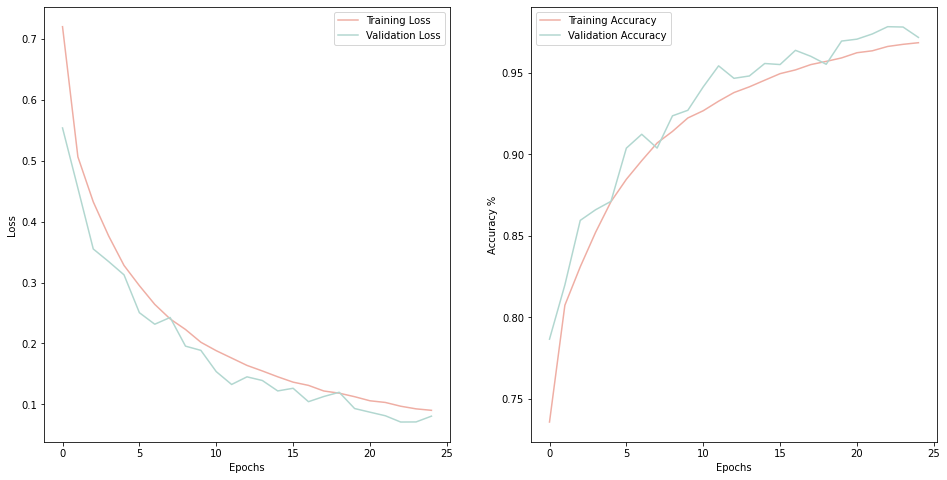

In [11]:
# plot the following:
# - Training loss
# - Validation loss
# - Training accuracy 
# - Validation accuracy
fig, ax = plt.subplots(1,2,figsize = (16,8))
ax[0].plot(history_reg.history['loss'],color='#EFAEA4',label = 'Training Loss')
ax[0].plot(history_reg.history['val_loss'],color='#B2D7D0',label = 'Validation Loss')
ax[1].plot(history_reg.history['accuracy'],color='#EFAEA4',label = 'Training Accuracy')
ax[1].plot(history_reg.history['val_accuracy'],color='#B2D7D0',label = 'Validation Accuracy')
ax[0].legend()
ax[1].legend()
ax[0].set_xlabel('Epochs')
ax[1].set_xlabel('Epochs');
ax[0].set_ylabel('Loss')
ax[1].set_ylabel('Accuracy %');

In [ ]:
# stats
y_pred_ohe = model.predict(X_test)
y_pred_labels = np.argmax(y_pred_ohe, axis=1)
y_true_labels = np.argmax(y_test, axis=1)
print("*" * 80)
print("Classification report")
print("*" * 80)
print(classification_report(y_true_labels, y_pred_labels))